In [2]:
import numpy as np
from keras.models import Model, Sequential, model_from_json
from keras.layers import Input, Dense, Reshape, Flatten, Dropout, ActivityRegularization, Lambda, Concatenate, Permute, Convolution1D, MaxPooling1D, AveragePooling1D, GlobalAveragePooling1D
# from keras.layers.merge import concatenate, dot
from keras.layers.merge import _Merge, concatenate
from keras.layers.normalization import BatchNormalization
from keras.layers.advanced_activations import LeakyReLU
from keras.optimizers import Adam
from keras.datasets import mnist
from keras import backend as K
from keras import regularizers
from functools import partial
import matplotlib.pyplot as plt
from matplotlib import colors as mcol

import numpy as np
# from tools import load, save, checkdir
import pandas as pd
from matplotlib.lines import Line2D

Using TensorFlow backend.


In [5]:
import os
os.environ["CUDA_VISIBLE_DEVICES"]="3"
imagedir = './'

In [6]:
def dot(A,B):
    return A[0]*B[0] - A[1]*B[1] - A[2]*B[2] - A[3]*B[3]

In [7]:
def gamma_dist_rand(N):
    y = np.random.choice(np.arange(0, 10000), size = N, p = gamma_hist)
    y = gamma_min + (y + np.random.uniform(0, 1, N))*(gamma_max - gamma_min)/10000
    
    return(y)

In [8]:
pmass = 0.93827
pipmass = 0.1395
pimmass = 0.1395

In [9]:
epsilon = 0.001

In [10]:
# datapath = "../data/"
# events = X = np.empty(shape=[0, 14])
# for i in range(10):
#     temp = np.load(datapath+'evts-%d'%(i)+".npy")
#     events = np.concatenate([events, temp])

In [11]:
datapath = "../../evts-clas.npy"
events = np.load(datapath)

In [12]:
px = events[:, 2]
py = events[:, 5]
ptheta = np.arctan2(py, px)
ptheta = ptheta.reshape(-1, 1)

pipx = events[:, 3]
pipy = events[:, 6]
piptheta = np.arctan2(pipy, pipx)
piptheta = piptheta.reshape(-1, 1)

theta = np.concatenate([ptheta, piptheta], axis=1)
theta = np.floor(theta/np.pi*180+205)%60

index = np.where((theta[:, 0]<=50)&(theta[:, 1]<=50))

events = events[index]

In [13]:
events.shape

(2507253, 14)

In [14]:
M2pi = events[:, 0]
gamma = events[:, 1]
px = events[:, 2]
py = events[:, 5]
pz = events[:, 8]
pe = events[:, 11]
pipx = events[:, 3]
pipy = events[:, 6]
pipz = events[:, 9]
pipe = events[:, 12]
pimx = events[:, 4]
pimy = events[:, 7]
pimz = events[:, 10]
pime = events[:, 13]

pt = np.sqrt(px*px + py*py)
pzt = pz/(pt+epsilon)
pipt = np.sqrt(pipx*pipx + pipy*pipy)
pipzt = pipz/(pipt+epsilon)
pimt = np.sqrt(pimx*pimx + pimy*pimy)
pimzt = pimz/(pimt+epsilon)

p = np.stack([pe, px, py, pz], axis=1)
pip = np.stack([pipe, pipx, pipy, pipz], axis=1)
pim = np.stack([pime, pimx, pimy, pimz], axis=1)
ppip = p*pip
ppim = p*pim
pippim = pip*pim

In [15]:
s1 = 2*gamma*pmass + pmass*pmass
t1 = (gamma - pe)*(gamma - pe) - px*px - py*py - (gamma - pz)*(gamma - pz)
u1 = (pmass - pe)*(pmass - pe) - px*px - py*py - pz*pz
mmp = s1+t1+u1 -2*pmass*pmass

s2 = s1
t2 = (gamma - pe - pipe)*(gamma - pe - pipe) - pimx*pimx - pimy*pimy - pimz*pimz
u2 = (pmass - pe - pipe)*(pmass - pe - pipe) - (px+pipx)*(px+pipx) - (py+pipy)*(py+pipy) - (pz+pipz)*(pz+pipz)
mppip2 = pmass*pmass + pipmass*pipmass + 2*(pe*pipe - px*pipx - py*pipy -pz*pipz)
m2pi = s2 + t2 + u2 - pmass*pmass - mppip2
mmpm2pi = mmp * m2pi

In [16]:
gamma_dist = s1
gamma_min = np.min(gamma_dist)
gamma_max = np.max(gamma_dist)
[gamma_hist, gamma_edges] = np.histogram(gamma_dist, bins = 10000, range=[gamma_min, gamma_max])

In [17]:
gamma_min

6.512070253506

In [18]:
gamma_max

8.080279156224

In [19]:
gamma_hist = gamma_hist/gamma_dist.shape[0]
np.save('gamma_hist.npy', gamma_hist)

In [20]:
clas_origin = np.stack([s1, t1, mmp, t2, u2, m2pi, u1, mppip2, mmpm2pi], axis = 1)

In [21]:
index = np.where(clas_origin[:, 5]>0.08)
clas_cut = clas_origin[index]
MMP_cut = mmp[index]

In [22]:
# normalization
clasmean = np.mean(clas_origin, axis = 0)
classtd = np.std(clas_origin, axis = 0)
clas = (clas_origin - clasmean)/classtd
gfeaturesmean = clasmean[0:6]
gfeaturesstd = classtd[0:6]
gammamean = clasmean[0:1]
gammastd = classtd[0:1]
u1mean = clasmean[6:7]
u1std = classtd[6:7]
mppip2mean = clasmean[7:8]
mppip2std = classtd[7:8]
mmpm2pimean = clasmean[8:9]
mmpm2pistd = classtd[8:9]

In [19]:
np.save('gfeaturesmean.npy', gfeaturesmean)
np.save('gfeaturesstd.npy', gfeaturesstd)

In [20]:
np.shape( gfeaturesmean )

(6,)

In [21]:
np.shape( gfeaturesstd )

(6,)

In [22]:
HALF_BATCH = 12000
BATCH_SIZE = HALF_BATCH * 2
# The training ratio is the number of discriminator updates
# per generator update. The paper uses 5.
TRAINING_RATIO = 5
GRADIENT_PENALTY_WEIGHT = 10  # As per the paper

In [23]:
def MMD_loss(x, y):
    sigma = 0.1
    x1 = x[:HALF_BATCH, :]
    x2 = x[HALF_BATCH:, :]
    y1 = y[:HALF_BATCH, :]
    y2 = y[HALF_BATCH:, :]
#     x1_x2 = K.sum(K.exp(-(x1-x2)*(x1-x2)/sigma))/HALF_BATCH
#     y1_y2 = K.sum(K.exp(-(y1-y2)*(y1-y2)/sigma))/HALF_BATCH
#     x_y = K.sum(K.exp(-(x-y)*(x-y)/sigma))/BATCH_SIZE
    
    x1_x2 = K.sum(K.exp(sigma/((x1-x2)*(x1-x2)+sigma)))/HALF_BATCH
    y1_y2 = K.sum(K.exp(sigma/((y1-y2)*(y1-y2)+sigma)))/HALF_BATCH
    x_y = K.sum(K.exp(sigma/((x-y)*(x-y)+sigma)))/BATCH_SIZE
    
    return (x1_x2 + y1_y2 - 2*x_y)*(x1_x2 + y1_y2 - 2*x_y)

In [24]:
def wasserstein_loss(y_true, y_pred):
    """Calculates the Wasserstein loss for a sample batch.
    The Wasserstein loss function is very simple to calculate. In a standard GAN, the
    discriminator has a sigmoid output, representing the probability that samples are
    real or generated. In Wasserstein GANs, however, the output is linear with no
    activation function! Instead of being constrained to [0, 1], the discriminator wants
    to make the distance between its output for real and generated samples as
    large as possible.
    The most natural way to achieve this is to label generated samples -1 and real
    samples 1, instead of the 0 and 1 used in normal GANs, so that multiplying the
    outputs by the labels will give you the loss immediately.
    Note that the nature of this loss means that it can be (and frequently will be)
    less than 0."""
    return K.mean(y_true * y_pred)

In [25]:
def gradient_penalty_loss(y_true, y_pred, averaged_samples,
                          gradient_penalty_weight):
    """Calculates the gradient penalty loss for a batch of "averaged" samples.
    In Improved WGANs, the 1-Lipschitz constraint is enforced by adding a term to the
    loss function that penalizes the network if the gradient norm moves away from 1.
    However, it is impossible to evaluate this function at all points in the input
    space. The compromise used in the paper is to choose random points on the lines
    between real and generated samples, and check the gradients at these points. Note
    that it is the gradient w.r.t. the input averaged samples, not the weights of the
    discriminator, that we're penalizing!
    In order to evaluate the gradients, we must first run samples through the generator
    and evaluate the loss. Then we get the gradients of the discriminator w.r.t. the
    input averaged samples. The l2 norm and penalty can then be calculated for this
    gradient.
    Note that this loss function requires the original averaged samples as input, but
    Keras only supports passing y_true and y_pred to loss functions. To get around this,
    we make a partial() of the function with the averaged_samples argument, and use that
    for model training."""
    # first get the gradients:
    #   assuming: - that y_pred has dimensions (batch_size, 1)
    #             - averaged_samples has dimensions (batch_size, nbr_features)
    # gradients afterwards has dimension (batch_size, nbr_features), basically
    # a list of nbr_features-dimensional gradient vectors
    gradients = K.gradients(y_pred, averaged_samples)[0]
    # compute the euclidean norm by squaring ...
    gradients_sqr = K.square(gradients)
    #   ... summing over the rows ...
    gradients_sqr_sum = K.sum(gradients_sqr,
                              axis=np.arange(1, len(gradients_sqr.shape)))
    #   ... and sqrt
    gradient_l2_norm = K.sqrt(gradients_sqr_sum)
    # compute lambda * (1 - ||grad||)^2 still for each single sample
    gradient_penalty = gradient_penalty_weight * K.square(1 - gradient_l2_norm)
    # return the mean as loss over all the batch samples
    return K.mean(gradient_penalty)

In [41]:
class RandomWeightedAverage(_Merge):
    """Takes a randomly-weighted average of two tensors. In geometric terms, this
    outputs a random point on the line between each pair of input points.
    Inheriting from _Merge is a little messy but it was the quickest solution I could
    think of. Improvements appreciated."""

    def _merge_function(self, inputs):
        weights = K.random_uniform((BATCH_SIZE, 1))
        return (weights * inputs[0]) + ((1 - weights) * inputs[1])

In [27]:
def feature_mul(x):
    featuresmean = K.constant(gfeaturesmean)
    featuresstd = K.constant(gfeaturesstd)
    
    xyz = x*featuresstd+featuresmean
    s1 = xyz[:, 0:1]
    t1 = xyz[:, 1:2]
    mmp = xyz[:, 2:3]
    t2 = xyz[:, 3:4]
    u2 = xyz[:, 4:5]
    m2pi = xyz[:, 5:6]
    s2 = s1
    
    u1 = mmp - s1 - t1 + 2*pmass*pmass
    mppip2 = s2 + t2 + u2 - pmass*pmass - m2pi
    
    mmpm2pi = mmp*m2pi
    
#     m2pi = K.clip(m2pi, -1000, 0.2)
    
    u1 = (u1 - K.constant(u1mean))/K.constant(u1std)
    mppip2 = (mppip2 - K.constant(mppip2mean))/K.constant(mppip2std)
    mmpm2pi = (mmpm2pi - K.constant(mmpm2pimean))/K.constant(mmpm2pistd)
    
    return K.concatenate([u1, mppip2, mmpm2pi])

In [46]:
def make_generator():
    gamma = Input(shape=(1,))
    noise = Input(shape=(100,))
    visible = concatenate([gamma, noise])
    hidden1 = Dense(512)(visible)
    LR = LeakyReLU(alpha=0.2)(hidden1)
    hidden2 = Dense(512)(LR)
    LR = LeakyReLU(alpha=0.2)(hidden2)
    hidden3 = Dense(512)(LR)
    LR = LeakyReLU(alpha=0.2)(hidden3)
    hidden4 = Dense(512)(LR)
    LR = LeakyReLU(alpha=0.2)(hidden4)
    hidden5 = Dense(512)(LR)
    LR = LeakyReLU(alpha=0.2)(hidden5)
    output = Dense(5)(LR)
    output2 = concatenate([gamma, output])
    features = Lambda(feature_mul)(output2)
    
    outputmerge = concatenate([output2, features])

    generator = Model(inputs=[gamma, noise], outputs=[outputmerge])
    return(generator, output, output2, features)

In [51]:
generator, output, output2, features = make_generator()

In [53]:
np.shape( features )

TensorShape([None, 3])

In [29]:
def make_discriminator():
    visible = Input(shape=(clas.shape[1],))
    hidden1 = Dense(512)(visible)
    LR = LeakyReLU(alpha=0.2)(hidden1)
    DR = Dropout(rate=0.1)(LR)
    hidden2 = Dense(512)(DR)
    LR = LeakyReLU(alpha=0.2)(hidden2)
    DR = Dropout(rate=0.1)(LR)
    hidden3 = Dense(512)(DR)
    LR = LeakyReLU(alpha=0.2)(hidden3)
    DR = Dropout(rate=0.1)(LR)
    hidden4 = Dense(512)(DR)
    LR = LeakyReLU(alpha=0.2)(hidden4)
    DR = Dropout(rate=0.1)(LR)
    hidden5 = Dense(512)(DR)
    LR = LeakyReLU(alpha=0.2)(hidden5)
    DR = Dropout(rate=0.1)(LR)
    output = Dense(1)(DR)

    discriminator = Model(inputs=[visible], outputs=output)
    return discriminator

In [34]:
visible = Input(shape=(clas.shape[1],))

In [35]:
visible

<tf.Tensor 'input_6:0' shape=(None, 9) dtype=float32>

In [36]:
def make_MMD():
    visible = Input(shape=(clas.shape[1],))
    MMD = Model(inputs=visible, outputs=visible)
    return MMD

In [37]:
generator = make_generator()
discriminator = make_discriminator()
MMD = make_MMD()

In [ ]:
for layer in discriminator.layers:
    layer.trainable = False
discriminator.trainable = False

generator_gamma = Input(shape=(1,))
generator_noise = Input(shape=(100,))
generator_input = generator([generator_gamma, generator_noise])
discriminator_layers_for_generator = discriminator(generator_input)
MMD_Layers_for_generator = MMD(generator_input)
# generator_model = Model(inputs=generator_input,
#                         outputs=[discriminator_layers_for_generator])
generator_model = Model(inputs=[generator_gamma, generator_noise],
                        outputs=[discriminator_layers_for_generator,
                                MMD_Layers_for_generator])
# We use the Adam paramaters from Gulrajani et al.
generator_model.compile(optimizer=Adam(0.00001, beta_1=0.5, beta_2=0.9),
                        loss=[wasserstein_loss,
                              MMD_loss])
# generator_model.compile(optimizer=Adam(0.0001, beta_1=0.5, beta_2=0.9),
#                         loss=[wasserstein_loss])

generator_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
input_6 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
model_1 (Model)                 (None, 9)            1105413     input_5[0][0]                    
                                                                 input_6[0][0]                    
__________________________________________________________________________________________________
model_2 (Model)                 (None, 1)            1056257     model_1[1][0]                    
__________

In [ ]:
for layer in discriminator.layers:
    layer.trainable = True
for layer in generator.layers:
    layer.trainable = False
discriminator.trainable = True
generator.trainable = False

In [ ]:
# real_samples = Input(shape=clas.shape[1:])
# fake_samples = Input(shape=clas.shape[1:])
# # generator_input_for_discriminator = Input(shape=(100,))
# # generated_samples_for_discriminator = generator(generator_input_for_discriminator)
# # discriminator_output_from_generator = discriminator(generated_samples_for_discriminator)
# discriminator_output_from_generator = discriminator(fake_samples)
# discriminator_output_from_real_samples = discriminator(real_samples)

real_samples = Input(shape=clas.shape[1:])
generator_gamma_for_discriminator = Input(shape = (1,))
generator_noise_for_discriminator = Input(shape=(100,))
generated_samples_for_discriminator = generator([generator_gamma_for_discriminator, generator_noise_for_discriminator])
discriminator_output_from_generator = discriminator(generated_samples_for_discriminator)
discriminator_output_from_real_samples = discriminator(real_samples)

In [ ]:
# We also need to generate weighted-averages of real and generated samples,
# to use for the gradient norm penalty.
averaged_samples = RandomWeightedAverage()([real_samples,
                                            generated_samples_for_discriminator])
# averaged_samples = RandomWeightedAverage()([real_samples,
#                                             fake_samples])

# We then run these samples through the discriminator as well. Note that we never
# really use the discriminator output for these samples - we're only running them to
# get the gradient norm for the gradient penalty loss.
averaged_samples_out = discriminator(averaged_samples)

In [ ]:
# The gradient penalty loss function requires the input averaged samples to get
# gradients. However, Keras loss functions can only have two arguments, y_true and
# y_pred. We get around this by making a partial() of the function with the averaged
# samples here.
partial_gp_loss = partial(gradient_penalty_loss,
                          averaged_samples=averaged_samples,
                          gradient_penalty_weight=GRADIENT_PENALTY_WEIGHT)
# Functions need names or Keras will throw an error
partial_gp_loss.__name__ = 'gradient_penalty'

In [ ]:
# If we don't concatenate the real and generated samples, however, we get three
# outputs: One of the generated samples, one of the real samples, and one of the
# averaged samples, all of size BATCH_SIZE. This works neatly!
discriminator_model = Model(inputs=[real_samples,
                                    generator_gamma_for_discriminator, 
                                    generator_noise_for_discriminator],
                            outputs=[discriminator_output_from_real_samples,
                                     discriminator_output_from_generator,
                                     averaged_samples_out])
# discriminator_model = Model(inputs=[real_samples,
#                                     fake_samples],
#                             outputs=[discriminator_output_from_real_samples,
#                                      discriminator_output_from_generator,
#                                      averaged_samples_out])
# We use the Adam paramaters from Gulrajani et al. We use the Wasserstein loss for both
# the real and generated samples, and the gradient penalty loss for the averaged samples
discriminator_model.compile(optimizer=Adam(0.00001, beta_1=0.5, beta_2=0.9),
                            loss=[wasserstein_loss,
                                  wasserstein_loss,
                                  partial_gp_loss])
discriminator_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            (None, 1)            0                                            
__________________________________________________________________________________________________
input_9 (InputLayer)            (None, 100)          0                                            
__________________________________________________________________________________________________
input_7 (InputLayer)            (None, 9)            0                                            
__________________________________________________________________________________________________
model_1 (Model)                 (None, 9)            1105413     input_8[0][0]                    
                                                                 input_9[0][0]                    
__________

In [ ]:
# We make three label vectors for training. positive_y is the label vector for real
# samples, with value 1. negative_y is the label vector for generated samples, with
# value -1. The dummy_y vector is passed to the gradient_penalty loss function and
# is not used.
positive_y = np.ones((BATCH_SIZE, 1), dtype=np.float32)
negative_y = -positive_y
dummy_y = np.zeros((BATCH_SIZE, 1), dtype=np.float32)

In [ ]:
# generator.load_weights("generatorfilter00078.h5")
# discriminator.load_weights("discriminatorfilter00078.h5")

Instructions for updating:
Use tf.cast instead.
0 [[31.259478, -0.033718344, 31.293196], [30.06436, -0.04544163, 30.109802], [28.882454, -0.056500275, 28.938953], [27.953756, -0.07012201, 28.023878], [26.553314, -0.08385901, 26.637173], [26.135912, -0.09834203, 26.234255], [25.16419, -0.1137371, 25.277927], [24.754791, -0.12861384, 24.883406], [23.047451, -0.14389172, 23.191343], [22.363522, -0.16048811, 22.52401], [22.063383, -0.17679976, 22.240183], [21.821934, -0.19609343, 22.018026], [20.092802, -0.21404101, 20.306843], [19.879534, -0.2356416, 20.115175], [18.996038, -0.25703463, 19.253073], [18.216784, -0.2769318, 18.493715], [17.729534, -0.30279306, 18.032328], [16.838678, -0.3277742, 17.166452], [16.324343, -0.3511731, 16.675516], [15.82132, -0.37971866, 16.201038]]
0


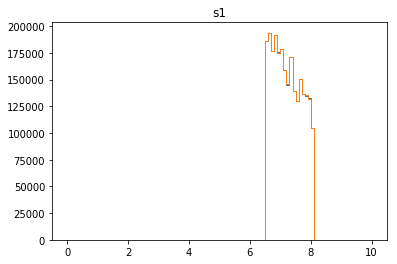

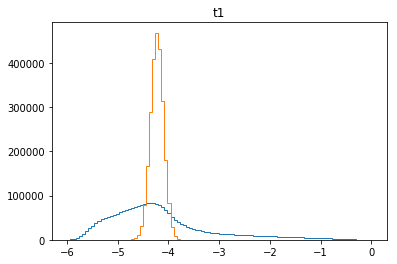

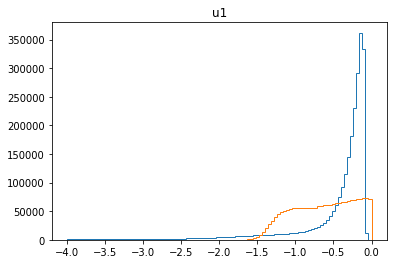

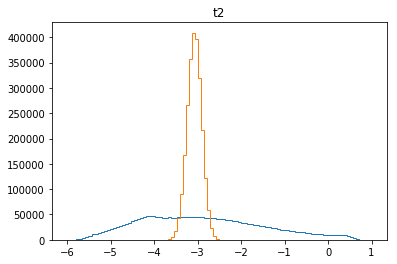

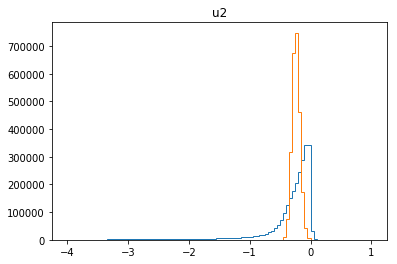

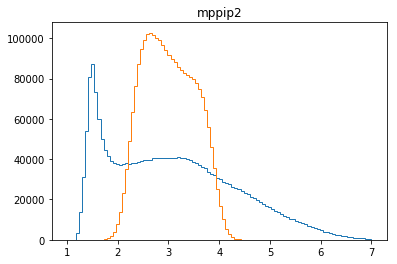

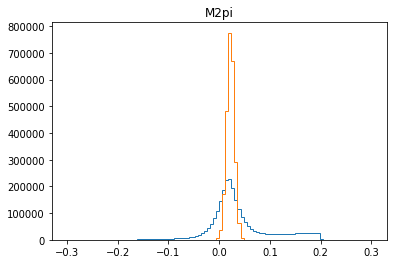

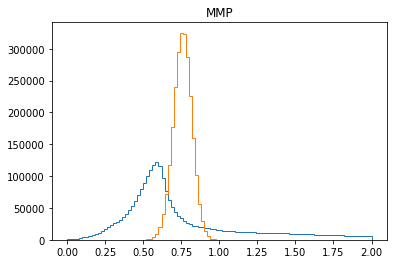

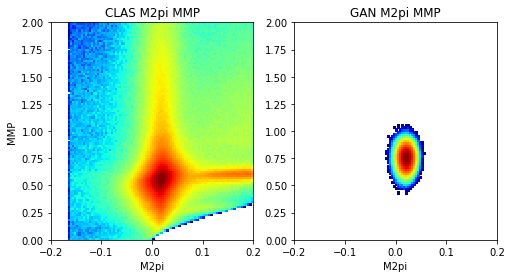

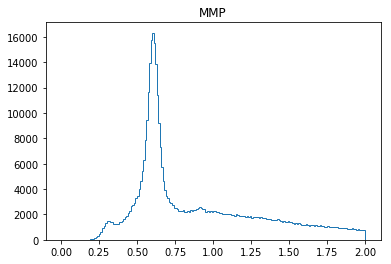

1 [[15.152968, -0.40764582, 15.560615], [14.709887, -0.43651643, 15.146403], [13.9286785, -0.46374968, 14.392428], [13.706663, -0.49571383, 14.202377], [12.987744, -0.5248436, 13.512588], [12.998365, -0.5584706, 13.556836], [12.382785, -0.5937986, 12.9765835], [12.071344, -0.6215843, 12.692928], [11.101757, -0.6515681, 11.753325], [11.402242, -0.67383665, 12.076078], [10.607001, -0.69361556, 11.300617], [10.595343, -0.704145, 11.299488], [9.834169, -0.7189725, 10.553142], [9.362949, -0.7258473, 10.088797], [9.019254, -0.73234487, 9.751598], [8.772699, -0.7378387, 9.510538], [8.622238, -0.74313295, 9.365371], [8.532074, -0.74637747, 9.278451], [7.8567433, -0.7514222, 8.608166], [8.1021595, -0.7504764, 8.852636]]
2 [[7.561602, -0.7528003, 8.314403], [7.3684554, -0.7644544, 8.13291], [7.478507, -0.7690975, 8.247604], [7.3637447, -0.7764557, 8.140201], [7.1667304, -0.7819249, 7.948655], [6.986487, -0.787063, 7.77355], [6.701121, -0.79338706, 7.494508], [6.7543383, -0.7941634, 7.5485015], [

12 [[-0.20658508, -0.45094857, 0.24436349], [-0.21668877, -0.4578889, 0.24120013], [-0.18472752, -0.4722907, 0.28756317], [-0.19380605, -0.4766044, 0.28279835], [-0.22994983, -0.48203698, 0.25208715], [-0.12989885, -0.45903262, 0.32913378], [-0.24625342, -0.46520996, 0.21895654], [-0.2096901, -0.4682867, 0.2585966], [-0.21877542, -0.46956763, 0.2507922], [-0.21410617, -0.47703895, 0.26293278], [-0.2415309, -0.48517644, 0.24364555], [-0.2175757, -0.5049588, 0.2873831], [-0.26645875, -0.4701818, 0.20372303], [-0.2506975, -0.49027792, 0.23958044], [-0.20822337, -0.4984643, 0.2902409], [-0.22335604, -0.46692815, 0.24357212], [-0.20111439, -0.5020609, 0.3009465], [-0.25881818, -0.49366096, 0.23484278], [-0.31917503, -0.5221876, 0.20301256], [-0.2733547, -0.52050376, 0.24714907]]
13 [[-0.30076867, -0.54428995, 0.24352129], [-0.2703913, -0.5544833, 0.284092], [-0.3038183, -0.5381788, 0.23436053], [-0.24359837, -0.5366452, 0.2930468], [-0.24165341, -0.53298664, 0.29133323], [-0.22599888, -0.52

23 [[-0.5361938, -0.6893634, 0.15316962], [-0.55090475, -0.69959146, 0.1486867], [-0.55689734, -0.71498626, 0.15808892], [-0.55549866, -0.7199045, 0.16440584], [-0.5254367, -0.7193864, 0.19394971], [-0.5462405, -0.70438707, 0.15814656], [-0.5227291, -0.67471707, 0.15198795], [-0.52939564, -0.6855883, 0.15619265], [-0.5674024, -0.69976676, 0.13236435], [-0.5842466, -0.700409, 0.1161624], [-0.530451, -0.716903, 0.18645199], [-0.5438385, -0.70362926, 0.15979072], [-0.5307627, -0.70778656, 0.17702386], [-0.5837035, -0.717659, 0.13395545], [-0.5440688, -0.71331394, 0.16924511], [-0.5648515, -0.70733804, 0.1424865], [-0.541175, -0.7000703, 0.15889534], [-0.54717207, -0.7102951, 0.16312298], [-0.56445616, -0.7193985, 0.15494235], [-0.5549299, -0.71472216, 0.15979226]]
24 [[-0.5199568, -0.70221907, 0.18226227], [-0.5501928, -0.7038734, 0.15368062], [-0.5569401, -0.6757949, 0.11885482], [-0.51435405, -0.7028459, 0.1884918], [-0.5217625, -0.70301807, 0.18125558], [-0.54951715, -0.69218946, 0.142

34 [[-0.68108934, -0.7408785, 0.059789184], [-0.6782393, -0.7438361, 0.06559682], [-0.68028164, -0.76367563, 0.08339401], [-0.67231154, -0.7621349, 0.089823395], [-0.67822886, -0.75695425, 0.07872542], [-0.70082486, -0.76917285, 0.06834802], [-0.69165844, -0.7236458, 0.031987388], [-0.6921399, -0.75550693, 0.06336702], [-0.64789045, -0.73896205, 0.09107159], [-0.6520531, -0.7255799, 0.07352678], [-0.6872887, -0.75753665, 0.07024793], [-0.696787, -0.7638585, 0.06707152], [-0.6825584, -0.7615238, 0.07896536], [-0.6487231, -0.74209654, 0.093373396], [-0.64563376, -0.72172606, 0.076092325], [-0.65036803, -0.71682745, 0.06645942], [-0.6108211, -0.71545345, 0.1046323], [-0.6622982, -0.72585547, 0.06355729], [-0.67115545, -0.7207024, 0.049546935], [-0.7050305, -0.7587017, 0.053671163]]
35 [[-0.66989934, -0.7649177, 0.09501831], [-0.69696254, -0.7655052, 0.06854264], [-0.69702363, -0.75622755, 0.05920391], [-0.70934606, -0.7693294, 0.05998337], [-0.674657, -0.74177295, 0.067115985], [-0.639547

45 [[-0.5777957, -0.59501934, 0.017223658], [-0.5856764, -0.6142814, 0.028605066], [-0.57575643, -0.5940413, 0.018284848], [-0.56216, -0.5786737, 0.016513718], [-0.566536, -0.5896384, 0.023102392], [-0.5477095, -0.57275283, 0.02504332], [-0.5918671, -0.6121407, 0.020273626], [-0.6012618, -0.6286927, 0.027430883], [-0.57674176, -0.59620565, 0.01946388], [-0.59187555, -0.6225297, 0.030654114], [-0.59184813, -0.6092681, 0.017419964], [-0.5534324, -0.56768423, 0.0142518105], [-0.5711518, -0.5965951, 0.025443334], [-0.61570823, -0.62563103, 0.009922788], [-0.6172179, -0.6375198, 0.02030188], [-0.6177359, -0.6354471, 0.017711174], [-0.5866773, -0.6050505, 0.018373162], [-0.58017176, -0.59533954, 0.01516777], [-0.57878375, -0.5833381, 0.004554334], [-0.545775, -0.55635035, 0.010575368]]
46 [[-0.56206656, -0.57906216, 0.016995627], [-0.58335614, -0.59601825, 0.012662088], [-0.57052255, -0.594861, 0.024338424], [-0.5410811, -0.5695244, 0.028443357], [-0.5028558, -0.5297335, 0.026877718], [-0.51

56 [[-0.3993465, -0.41358057, 0.014234056], [-0.43387088, -0.4525535, 0.01868263], [-0.4412373, -0.45015487, 0.008917561], [-0.38164935, -0.41678414, 0.035134796], [-0.40528843, -0.41349283, 0.008204388], [-0.37246484, -0.3798816, 0.0074167596], [-0.37717828, -0.38638452, 0.009206244], [-0.41918236, -0.43316314, 0.013980782], [-0.43761268, -0.44759864, 0.009985967], [-0.4228495, -0.42899063, 0.0061411248], [-0.37478834, -0.3827496, 0.007961238], [-0.37707907, -0.393316, 0.016236937], [-0.40641046, -0.41277295, 0.0063625067], [-0.37670422, -0.38120157, 0.0044973623], [-0.38587207, -0.39675644, 0.010884364], [-0.42482945, -0.4330712, 0.0082417475], [-0.4170437, -0.4362535, 0.019209791], [-0.41907677, -0.43367448, 0.014597715], [-0.3953724, -0.40004802, 0.0046756123], [-0.34917608, -0.35297647, 0.0038004043]]
57 [[-0.323775, -0.33600262, 0.012227613], [-0.38040042, -0.38809904, 0.007698633], [-0.39694297, -0.40703598, 0.010092989], [-0.39841813, -0.40380156, 0.005383434], [-0.38655207, -0

67 [[-0.2951748, -0.29635352, 0.0011787052], [-0.26765224, -0.2679502, 0.00029795957], [-0.2445785, -0.25672483, 0.012146334], [-0.2570837, -0.26552755, 0.008443833], [-0.26994538, -0.2738949, 0.003949523], [-0.29150003, -0.29323673, 0.001736694], [-0.30589473, -0.3111372, 0.0052424646], [-0.27162024, -0.28402397, 0.012403722], [-0.2722402, -0.27807376, 0.0058335788], [-0.25354117, -0.2602634, 0.006722243], [-0.21560661, -0.23274727, 0.017140655], [-0.21592422, -0.23011507, 0.014190852], [-0.24456388, -0.25119418, 0.006630295], [-0.26855406, -0.2712672, 0.0027131373], [-0.27670833, -0.2781932, 0.0014848821], [-0.30116075, -0.30669895, 0.0055381902], [-0.28846562, -0.2985314, 0.010065795], [-0.25748295, -0.26922655, 0.011743607], [-0.26052916, -0.26099962, 0.00047047218], [-0.23947285, -0.24958846, 0.010115613]]
68 [[-0.2399339, -0.24975473, 0.009820833], [-0.25325167, -0.25626412, 0.003012458], [-0.2432374, -0.2483872, 0.0051497966], [-0.25538915, -0.27130398, 0.015914818], [-0.2842158

77 [[-0.20324339, -0.20738114, 0.004137748], [-0.19493972, -0.19758867, 0.0026489443], [-0.18083718, -0.1916965, 0.010859306], [-0.16583681, -0.1794404, 0.013603576], [-0.20971465, -0.211665, 0.0019503484], [-0.21075085, -0.21097213, 0.00022127788], [-0.1612094, -0.1729117, 0.011702304], [-0.16218968, -0.16655096, 0.0043612868], [-0.17187639, -0.18615371, 0.014277326], [-0.18149357, -0.18942012, 0.007926558], [-0.16457245, -0.17689346, 0.012321014], [-0.16352287, -0.17084368, 0.0073208124], [-0.16475564, -0.16849329, 0.0037376403], [-0.1752021, -0.17681885, 0.0016167489], [-0.16272731, -0.17287672, 0.0101494035], [-0.1726499, -0.17523368, 0.0025837745], [-0.1930755, -0.19445316, 0.0013776718], [-0.20057228, -0.2072178, 0.006645523], [-0.17809524, -0.18265112, 0.004555879], [-0.17130497, -0.17931734, 0.008012375]]
78 [[-0.17527987, -0.18065938, 0.005379516], [-0.17756976, -0.18184756, 0.0042778], [-0.15121955, -0.15880878, 0.0075892396], [-0.17609507, -0.17937034, 0.0032752724], [-0.190

87 [[-0.086585246, -0.08969798, 0.003112731], [-0.10045364, -0.105332255, 0.0048786183], [-0.05584476, -0.05587542, 3.065873e-05], [-0.06470214, -0.06867278, 0.0039706477], [-0.10140368, -0.10297202, 0.0015683406], [-0.12309037, -0.12408767, 0.0009972944], [-0.08530842, -0.088410094, 0.0031016737], [-0.09839213, -0.09847605, 8.3923835e-05], [-0.062068418, -0.07595284, 0.013884425], [-0.04478453, -0.05753132, 0.01274679], [-0.055008456, -0.060017426, 0.0050089704], [-0.06065361, -0.06196388, 0.0013102707], [-0.07234629, -0.07393616, 0.001589866], [-0.0943376, -0.09588216, 0.0015445623], [-0.08871046, -0.0893878, 0.0006773409], [-0.10081241, -0.105873354, 0.005060941], [-0.09923151, -0.102127865, 0.00289635], [-0.07619967, -0.07692818, 0.00072850817], [-0.035959173, -0.04318045, 0.007221278], [-0.06499094, -0.06673766, 0.0017467238]]
88 [[-0.062961124, -0.06417041, 0.0012092852], [-0.08340977, -0.08548851, 0.0020787455], [-0.112957135, -0.113180235, 0.00022309742], [-0.09947132, -0.10293

97 [[-0.028324295, -0.03461398, 0.006289688], [-0.050560486, -0.056515016, 0.0059545306], [-0.07636498, -0.076394714, 2.973641e-05], [-0.00083936844, -0.0145137785, 0.01367441], [0.00591289, 0.005812083, 0.00010080729], [0.024025265, 0.016134668, 0.007890598], [0.030919809, 0.02661502, 0.0043047885], [0.03557818, 0.03497269, 0.00060548994], [0.041599423, 0.04038894, 0.0012104795], [0.031137116, 0.019782541, 0.011354576], [-0.003002265, -0.0034542233, 0.00045195819], [-0.04288722, -0.043049652, 0.00016243257], [-0.01762227, -0.02078672, 0.0031644488], [0.0011053002, -0.0021538367, 0.0032591368], [0.009229448, 0.007394591, 0.0018348573], [-0.009088634, -0.009629489, 0.00054085563], [-0.0024944092, -0.006012194, 0.0035177846], [0.025565337, 0.019194003, 0.006371334], [0.03735914, 0.033378873, 0.0039802683], [-0.0026248673, -0.002768709, 0.00014384184]]
98 [[-0.042536967, -0.043379698, 0.00084273197], [-0.031460382, -0.037244536, 0.005784153], [-0.031436473, -0.036817107, 0.0053806356], [-

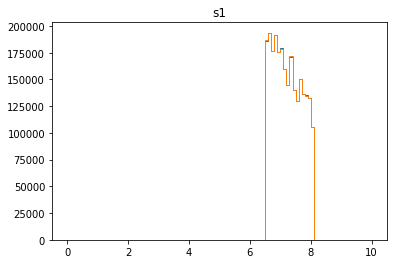

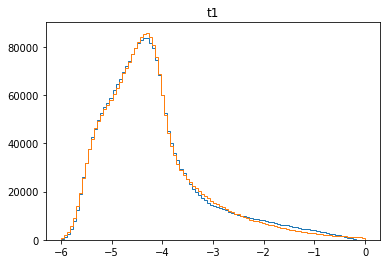

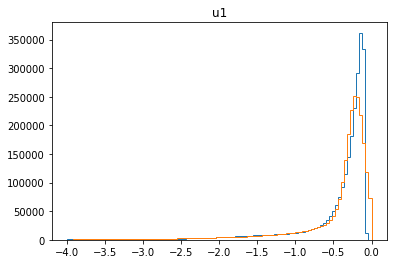

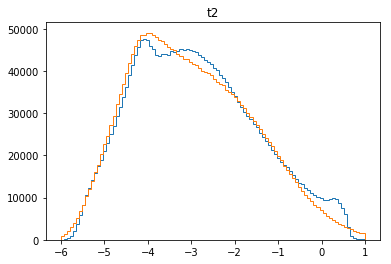

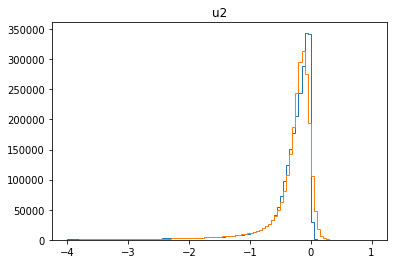

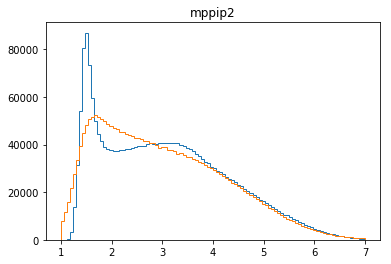

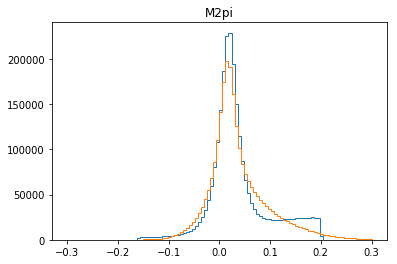

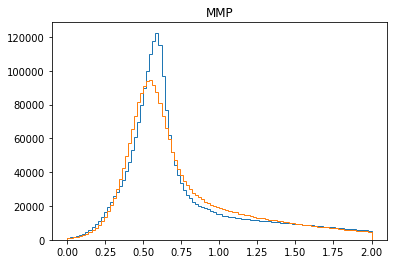

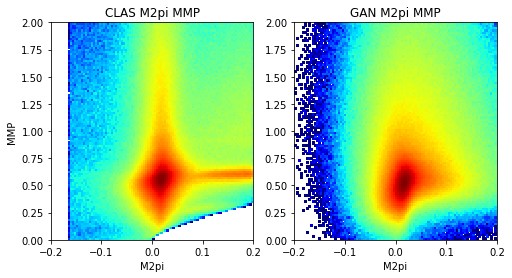

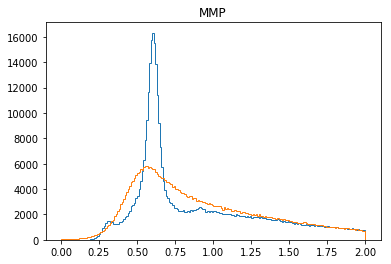

101 [[-0.0034293402, -0.0052209897, 0.0017916495], [-0.0132130645, -0.013331803, 0.0001187377], [-0.0029618593, -0.006766262, 0.0038044027], [0.0045307265, 0.0027292138, 0.0018015126], [0.0051985336, 0.003611252, 0.0015872816], [0.008022171, 0.007522891, 0.00049928075], [0.04095592, 0.035938576, 0.005017343], [0.07220596, 0.06642007, 0.0057858927], [0.04470183, 0.04092725, 0.0037745796], [0.00041259982, 0.00038925823, 2.3341601e-05], [-0.0047583636, -0.005402757, 0.00064439327], [0.015249468, 0.015121669, 0.00012779975], [-0.003175412, -0.004670454, 0.0014950421], [-0.032160204, -0.036037184, 0.0038769792], [-0.04873971, -0.051047955, 0.0023082457], [-0.024070434, -0.0327071, 0.008636664], [-0.010740466, -0.010742023, 1.5560217e-06], [-0.014349909, -0.015050781, 0.00070087257], [0.0058752275, 0.0018022499, 0.0040729777], [0.024809059, 0.020078508, 0.0047305496]]
102 [[0.037667092, 0.030233242, 0.0074338517], [0.036180407, 0.032754775, 0.0034256324], [0.06699735, 0.062138956, 0.00485838

111 [[0.108739495, 0.10619859, 0.0025409067], [0.07513665, 0.07325211, 0.0018845374], [0.031216413, 0.027646398, 0.0035700153], [-0.000334722, -0.013704832, 0.01337011], [-0.0035966355, -0.0040695933, 0.00047295762], [-0.003028603, -0.004065434, 0.001036831], [0.048030347, 0.04186678, 0.0061635654], [0.07175405, 0.06767401, 0.004080041], [0.08178641, 0.08028738, 0.0014990269], [0.07965527, 0.078936405, 0.0007188619], [0.08010207, 0.07880585, 0.0012962241], [0.055388108, 0.049120788, 0.0062673213], [0.02711304, 0.027109604, 3.4371044e-06], [-0.008589561, -0.0094128065, 0.00082324503], [0.018978158, 0.017365701, 0.001612457], [0.067106895, 0.0663213, 0.000785596], [0.08907712, 0.08766941, 0.0014077096], [0.10092576, 0.09846156, 0.002464195], [0.10203646, 0.102033265, 3.1940326e-06], [0.082673155, 0.08187025, 0.0008029046]]
112 [[0.04293868, 0.042830504, 0.00010817605], [0.024521263, 0.023951737, 0.0005695261], [0.0074099516, 0.0054010493, 0.0020089026], [-0.011437541, -0.014812678, 0.003

121 [[-0.024896955, -0.028204178, 0.0033072236], [0.018327687, 0.014466843, 0.003860845], [0.0729512, 0.07164658, 0.0013046154], [0.09581982, 0.09533333, 0.0004864928], [0.12262636, 0.12189311, 0.00073325203], [0.10203268, 0.10179357, 0.0002391005], [0.099578775, 0.09794942, 0.0016293513], [0.07732913, 0.07702462, 0.00030451408], [0.059063148, 0.058889944, 0.00017320419], [0.069408774, 0.06905524, 0.0003535394], [0.10174724, 0.09727415, 0.0044730925], [0.08997651, 0.08948343, 0.0004930776], [0.08294234, 0.08202863, 0.0009137114], [0.086324476, 0.08284707, 0.0034774018], [0.08119595, 0.078615084, 0.0025808665], [0.06935045, 0.069258004, 9.244715e-05], [0.039877634, 0.03876694, 0.0011106959], [0.016098242, 0.015335044, 0.0007631979], [0.01798636, 0.017236382, 0.00074997725], [0.014144346, 0.010542808, 0.0036015383]]
122 [[0.05755038, 0.055738974, 0.0018114026], [0.078903235, 0.07888802, 1.5214117e-05], [0.107561216, 0.107313305, 0.00024791015], [0.095817424, 0.09578888, 2.8542132e-05], [

131 [[0.11292626, 0.10380145, 0.009124804], [0.10883334, 0.10383598, 0.004997368], [0.07465313, 0.06974168, 0.0049114455], [0.06653304, 0.060849115, 0.0056839185], [0.06478018, 0.064420596, 0.00035959005], [0.080360316, 0.072533295, 0.007827022], [0.070388526, 0.06834166, 0.0020468668], [0.041274533, 0.039608017, 0.001666516], [0.04226537, 0.040818315, 0.0014470541], [0.058936678, 0.05854312, 0.0003935595], [0.07382493, 0.0736032, 0.00022173206], [0.0930661, 0.09081449, 0.002251599], [0.065461986, 0.060715158, 0.00474683], [0.036397226, 0.03457916, 0.0018180655], [0.06259095, 0.055953816, 0.006637131], [0.063731976, 0.06368117, 5.0804992e-05], [0.09922641, 0.09705908, 0.0021673278], [0.09623252, 0.095757484, 0.00047503388], [0.09491342, 0.087574, 0.007339429], [0.053436995, 0.053419862, 1.713088e-05]]
132 [[0.0013144533, 0.0001677457, 0.0011467076], [-0.004892633, -0.011727313, 0.0068346797], [0.010287588, 0.009020181, 0.0012674071], [0.015143786, 0.015066068, 7.771771e-05], [0.0660657

141 [[0.011623841, 0.009584044, 0.0020397964], [0.024481371, 0.017881792, 0.00659958], [0.04908467, 0.049083862, 8.0705286e-07], [0.07117724, 0.06349901, 0.007678229], [0.059507787, 0.05846086, 0.0010469276], [0.0369616, 0.036949642, 1.1957924e-05], [0.013140203, 0.011832693, 0.0013075104], [-0.0028522986, -0.0037774614, 0.0009251628], [-0.0027807476, -0.0038221283, 0.0010413807], [-0.0059603713, -0.0059686005, 8.229166e-06], [-0.007970508, -0.00884905, 0.0008785413], [-0.0058899107, -0.010586675, 0.0046967645], [0.005602827, 0.0009644408, 0.004638386], [0.033538584, 0.033493225, 4.535818e-05], [0.07532183, 0.075312294, 9.535729e-06], [0.09118143, 0.091099344, 8.20819e-05], [0.09396566, 0.09106417, 0.0029014847], [0.04454001, 0.042154707, 0.0023853036], [-0.009518324, -0.012051738, 0.0025334132], [-0.021042872, -0.022322532, 0.001279659]]
142 [[-0.008304377, -0.008374265, 6.9888076e-05], [0.008270957, 0.008115592, 0.00015536434], [0.011190741, 0.0030900268, 0.008100715], [0.0278274, 0.

151 [[-0.07536452, -0.07589224, 0.00052771776], [-0.07861535, -0.079986095, 0.0013707428], [-0.07604547, -0.0776428, 0.0015973275], [-0.047626063, -0.050562378, 0.0029363148], [-0.026429879, -0.026494512, 6.463315e-05], [0.0071718064, 0.0012222794, 0.005949527], [0.036489002, 0.035594903, 0.00089410006], [0.027260503, 0.027258622, 1.8806933e-06], [0.0042872517, 0.003362437, 0.0009248146], [-0.04533671, -0.04541649, 7.978264e-05], [-0.092320845, -0.0927933, 0.00047245994], [-0.12341477, -0.12439467, 0.0009799032], [-0.1101514, -0.11074225, 0.0005908425], [-0.07544366, -0.0774964, 0.002052739], [-0.022313448, -0.026080765, 0.0037673179], [0.046270892, 0.042359155, 0.0039117355], [0.06921655, 0.06736958, 0.0018469691], [0.05935369, 0.055675745, 0.0036779442], [0.009470739, 0.00908276, 0.00038797935], [-0.039197482, -0.041073915, 0.0018764315]]
152 [[-0.074915715, -0.07496472, 4.8999573e-05], [-0.09730197, -0.09736088, 5.890825e-05], [-0.105207056, -0.10566553, 0.00045846924], [-0.09199116

161 [[-0.08134656, -0.08169974, 0.00035318083], [-0.11020515, -0.111300394, 0.0010952398], [-0.11470266, -0.11489679, 0.00019413356], [-0.10009443, -0.10339968, 0.0033052496], [-0.05350561, -0.056812175, 0.0033065656], [-0.022895414, -0.022950493, 5.5078566e-05], [0.004398465, 0.002131272, 0.002267193], [0.026408888, 0.01950275, 0.0069061383], [0.028503375, 0.028036041, 0.00046733307], [-0.00856679, -0.008981281, 0.00041449047], [-0.065134324, -0.06514068, 6.3580374e-06], [-0.12015213, -0.121788576, 0.0016364419], [-0.1663742, -0.1666312, 0.00025700143], [-0.17465694, -0.17539527, 0.00073832244], [-0.13816607, -0.13917145, 0.0010053823], [-0.08689131, -0.087070026, 0.00017871964], [-0.03944265, -0.040649153, 0.0012065012], [-0.010729023, -0.012046069, 0.0013170455], [0.016752427, 0.01594476, 0.00080766773], [0.014862042, 0.01257081, 0.0022912323]]
162 [[-0.006740306, -0.014259257, 0.0075189513], [-0.05416946, -0.054420806, 0.00025134557], [-0.0919928, -0.09295618, 0.0009633751], [-0.10

171 [[-0.09157039, -0.0918115, 0.00024111025], [-0.055201687, -0.055564687, 0.00036299793], [-0.015037847, -0.017151874, 0.0021140268], [0.0008573561, 0.00037589867, 0.00048145748], [-0.044523716, -0.044530395, 6.6794205e-06], [-0.076106355, -0.07789994, 0.0017935877], [-0.11746185, -0.1188597, 0.0013978513], [-0.13962042, -0.14049897, 0.0008785413], [-0.13545391, -0.13639282, 0.00093890494], [-0.1520547, -0.15393145, 0.0018767618], [-0.12284727, -0.12568073, 0.0028334633], [-0.11709564, -0.11975638, 0.0026607374], [-0.08807977, -0.08823192, 0.00015214786], [-0.061675765, -0.06382148, 0.0021457153], [-0.044699676, -0.044699963, 2.8521754e-07], [-0.046842795, -0.0490135, 0.0021707031], [-0.065566055, -0.06741795, 0.0018518906], [-0.09686372, -0.09689014, 2.642273e-05], [-0.09321928, -0.093246154, 2.687566e-05], [-0.09314582, -0.09867266, 0.0055268416]]
172 [[-0.113061264, -0.11441483, 0.0013535667], [-0.11456742, -0.11489852, 0.00033109827], [-0.10466085, -0.10474766, 8.681391e-05], [-0

181 [[-0.052382037, -0.052382194, 1.5588375e-07], [-0.032118473, -0.03276209, 0.0006436189], [-0.044883214, -0.045083996, 0.0002007802], [-0.068863586, -0.06886364, 5.503898e-08], [-0.092193514, -0.09472252, 0.002528999], [-0.098785244, -0.09896091, 0.00017567289], [-0.090741396, -0.09231881, 0.0015774181], [-0.06972615, -0.07034989, 0.00062374177], [-0.045815106, -0.04751952, 0.001704415], [-0.036458462, -0.036528446, 6.9983784e-05], [-0.055736117, -0.055876143, 0.00014002442], [-0.086941205, -0.087054156, 0.00011294901], [-0.109847404, -0.110200584, 0.00035318083], [-0.14352404, -0.14432532, 0.000801284], [-0.1744157, -0.1755367, 0.0011210174], [-0.14903633, -0.15254846, 0.0035121304], [-0.09786857, -0.097923055, 5.4485638e-05], [-0.03987359, -0.040023625, 0.00015003784], [0.007321034, 0.005405736, 0.0019152978], [0.023276143, 0.020089768, 0.0031863747]]
182 [[0.0013105463, -0.0006129404, 0.0019234867], [-0.058424834, -0.058739483, 0.00031464876], [-0.090881094, -0.09728261, 0.006401

191 [[-0.1757874, -0.17638737, 0.00059996446], [-0.19744383, -0.19851384, 0.0010700114], [-0.20263933, -0.20267683, 3.750946e-05], [-0.18069676, -0.18077572, 7.8966994e-05], [-0.121171534, -0.121989645, 0.00081810873], [-0.068344235, -0.068449534, 0.000105299114], [-0.03806506, -0.038723964, 0.0006589026], [-0.038296703, -0.038435064, 0.0001383592], [-0.040631626, -0.042733744, 0.0021021168], [-0.070232265, -0.0734251, 0.003192838], [-0.12183918, -0.122551106, 0.00071192376], [-0.1568153, -0.1572871, 0.0004717969], [-0.19014986, -0.19205965, 0.0019097924], [-0.19425797, -0.19683671, 0.0025787354], [-0.18362822, -0.18731149, 0.003683267], [-0.1539214, -0.15610884, 0.0021874418], [-0.11000175, -0.11053166, 0.0005299108], [-0.05941981, -0.06171945, 0.00229964], [-0.035432957, -0.037002508, 0.0015695492], [-0.044836137, -0.04485261, 1.6474165e-05]]
192 [[-0.063619755, -0.070677295, 0.007057541], [-0.090923764, -0.09093445, 1.068764e-05], [-0.12482825, -0.1253113, 0.00048304917], [-0.155217

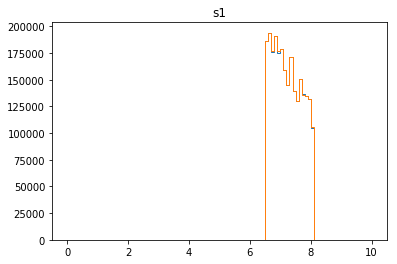

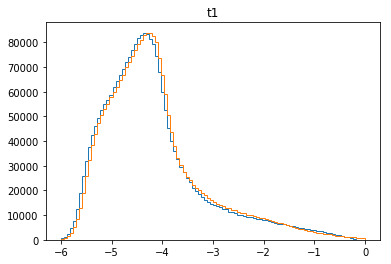

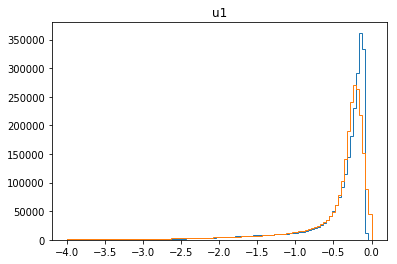

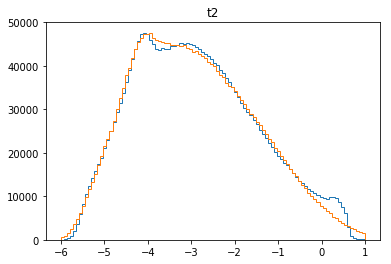

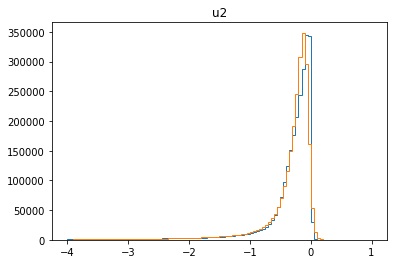

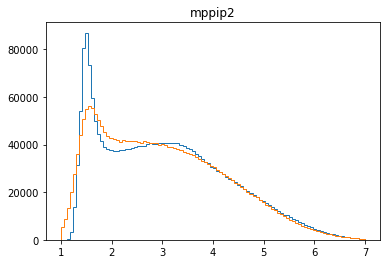

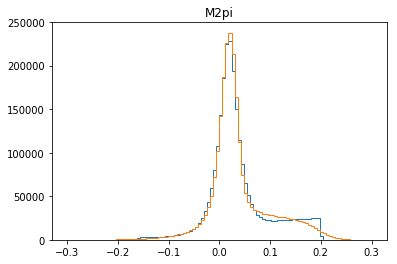

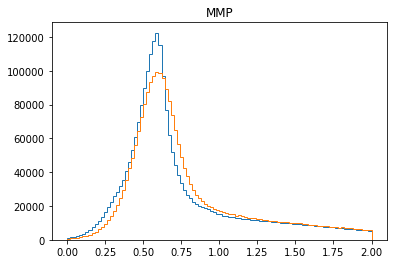

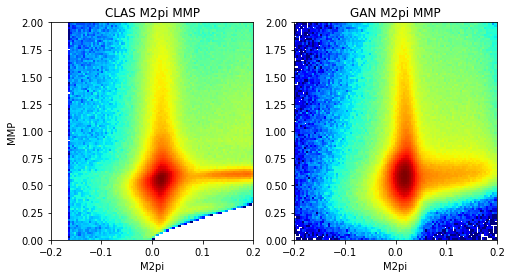

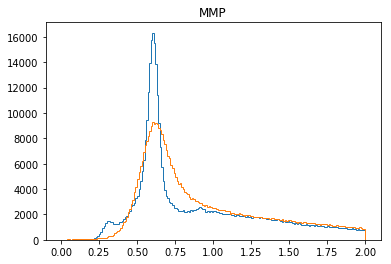

201 [[-0.12841319, -0.12848546, 7.22679e-05], [-0.07072091, -0.07087104, 0.0001501313], [-0.033909716, -0.040546224, 0.0066365087], [-0.023786953, -0.024096547, 0.00030959427], [-0.040116556, -0.040889267, 0.00077271205], [-0.08493342, -0.0852518, 0.00031838147], [-0.1382384, -0.1383087, 7.030328e-05], [-0.17090002, -0.17368697, 0.0027869523], [-0.20715083, -0.20739183, 0.0002409918], [-0.21879841, -0.2258566, 0.007058183], [-0.2029221, -0.20763405, 0.00471194], [-0.17602456, -0.17838033, 0.0023557728], [-0.14511135, -0.14525174, 0.00014038576], [-0.08235476, -0.08235483, 6.338814e-08], [-0.03839686, -0.038399436, 2.5730733e-06], [-0.028837623, -0.034898, 0.006060379], [-0.055948444, -0.055949453, 1.0103722e-06], [-0.09281613, -0.093783654, 0.00096752355], [-0.13485816, -0.13690296, 0.002044796], [-0.16337737, -0.16486932, 0.0014919459]]
202 [[-0.18495496, -0.19167282, 0.006717866], [-0.19344805, -0.19468187, 0.0012338173], [-0.19106093, -0.1913704, 0.00030946004], [-0.16675231, -0.168

211 [[-0.22521733, -0.22654296, 0.0013256428], [-0.20498131, -0.2056838, 0.0007024894], [-0.17477372, -0.17507188, 0.0002981572], [-0.12329861, -0.12862426, 0.005325652], [-0.08268196, -0.082683235, 1.2706769e-06], [-0.065596476, -0.0666569, 0.0010604248], [-0.055609778, -0.058223695, 0.002613917], [-0.06783032, -0.071899645, 0.004069327], [-0.116167426, -0.116309896, 0.00014247256], [-0.17959702, -0.18062319, 0.0010261722], [-0.22029018, -0.22074093, 0.0004507425], [-0.20793678, -0.2111744, 0.003237613], [-0.20674421, -0.2077732, 0.0010289847], [-0.19135474, -0.19250028, 0.0011455453], [-0.16750596, -0.16777879, 0.0002728324], [-0.117175914, -0.1191744, 0.0019984865], [-0.094564736, -0.09494949, 0.00038475505], [-0.07107832, -0.07189949, 0.0008211667], [-0.091522396, -0.091860615, 0.0003382162], [-0.09896992, -0.10609814, 0.0071282196]]
212 [[-0.1090024, -0.10901308, 1.068764e-05], [-0.12819639, -0.12822452, 2.813599e-05], [-0.12511986, -0.129658, 0.004538131], [-0.14275964, -0.142760

221 [[-0.117085546, -0.117437296, 0.00035174846], [-0.15073906, -0.15423268, 0.003493617], [-0.18597686, -0.18819186, 0.002215004], [-0.21927358, -0.21927515, 1.560784e-06], [-0.23233585, -0.233654, 0.0013181531], [-0.20685394, -0.20717485, 0.0003209049], [-0.15646894, -0.15718046, 0.0007115167], [-0.11208886, -0.11209717, 8.305947e-06], [-0.0619804, -0.062265657, 0.0002852576], [-0.041262217, -0.042007085, 0.00074486685], [-0.033801474, -0.03464842, 0.0008469454], [-0.07254423, -0.07431816, 0.0017739321], [-0.12333287, -0.12372871, 0.00039583305], [-0.17719728, -0.18081853, 0.0036212534], [-0.23085716, -0.23088129, 2.4122075e-05], [-0.2497427, -0.25055537, 0.0008126623], [-0.25426066, -0.2543823, 0.00012166526], [-0.22657943, -0.22661428, 3.4848286e-05], [-0.16608953, -0.16609146, 1.9280706e-06], [-0.09678791, -0.09855157, 0.0017636643]]
222 [[-0.041483145, -0.043396775, 0.0019136285], [-0.009122908, -0.009938509, 0.0008156012], [-0.0047944756, -0.00591141, 0.001116934], [-0.029684316

231 [[-0.11074698, -0.11542938, 0.0046823965], [-0.15242074, -0.15307125, 0.0006505084], [-0.18245144, -0.18414831, 0.0016968638], [-0.20232436, -0.20267397, 0.0003496054], [-0.1949586, -0.19499585, 3.7252903e-05], [-0.16936414, -0.16953315, 0.00016901271], [-0.133621, -0.13396113, 0.0003401131], [-0.08756557, -0.08788375, 0.0003181773], [-0.05984781, -0.06022364, 0.00037582836], [-0.060458463, -0.060932748, 0.00047428592], [-0.078687616, -0.08271495, 0.004027337], [-0.115617335, -0.11611611, 0.00049876946], [-0.14182973, -0.14903611, 0.0072063752], [-0.17437139, -0.17481801, 0.0004466216], [-0.20072146, -0.2029361, 0.002214645], [-0.2248821, -0.22512138, 0.00023927752], [-0.21898256, -0.22189432, 0.002911768], [-0.18358466, -0.18903914, 0.0054544797], [-0.14174798, -0.14193548, 0.00018749431], [-0.0930652, -0.10100433, 0.007939129]]
232 [[-0.047711603, -0.04804961, 0.00033800578], [-0.009579438, -0.017991753, 0.0084123155], [-0.02750134, -0.028090514, 0.00058917457], [-0.04913382, -0.

241 [[-0.10737102, -0.11005601, 0.002684995], [-0.1415049, -0.14318547, 0.0016805608], [-0.19304444, -0.19854012, 0.0054956893], [-0.25059965, -0.25065342, 5.3755997e-05], [-0.2897172, -0.29141706, 0.001699851], [-0.30356193, -0.30479777, 0.0012358278], [-0.2761812, -0.27620712, 2.591537e-05], [-0.21371359, -0.21471329, 0.0009997053], [-0.15308578, -0.1531048, 1.9011337e-05], [-0.08975179, -0.091801934, 0.0020501467], [-0.036108322, -0.0361252, 1.687919e-05], [-0.007652312, -0.0084583545, 0.00080604234], [0.00069591776, -0.009438887, 0.010134805], [-0.030848682, -0.03195798, 0.0011092976], [-0.1020661, -0.10225527, 0.00018916948], [-0.15404724, -0.15477358, 0.0007263476], [-0.20406164, -0.20413886, 7.721409e-05], [-0.23584275, -0.23691788, 0.0010751337], [-0.25303257, -0.2538765, 0.0008439506], [-0.2491431, -0.25016072, 0.0010176358]]
242 [[-0.21760449, -0.2177373, 0.00013280721], [-0.17924641, -0.1792631, 1.6691645e-05], [-0.13096339, -0.13096826, 4.869977e-06], [-0.10092966, -0.10135

251 [[-0.17945147, -0.18384936, 0.004397892], [-0.16207278, -0.16709039, 0.0050176135], [-0.1702829, -0.17028292, 1.8859282e-08], [-0.17493369, -0.1749972, 6.35034e-05], [-0.16377568, -0.16391127, 0.0001355912], [-0.15786861, -0.16263859, 0.004769988], [-0.14615418, -0.14656758, 0.0004134039], [-0.15610534, -0.15746818, 0.0013628451], [-0.16004367, -0.16070698, 0.0006633164], [-0.15102261, -0.15206423, 0.0010416271], [-0.15568453, -0.15850542, 0.0028208878], [-0.18057631, -0.18138875, 0.00081244484], [-0.1819873, -0.18204483, 5.7540205e-05], [-0.1874019, -0.18782601, 0.00042409817], [-0.17174944, -0.17589039, 0.0041409386], [-0.18804891, -0.1900863, 0.0020373855], [-0.20351142, -0.20388731, 0.00037590225], [-0.19275928, -0.1931091, 0.00034981943], [-0.1571225, -0.15780391, 0.0006814174], [-0.13649786, -0.13834548, 0.0018476249]]
252 [[-0.10528701, -0.109610334, 0.004323329], [-0.090903714, -0.09854555, 0.007641837], [-0.08909693, -0.08942928, 0.00033234886], [-0.10299133, -0.104622215,

261 [[-0.16184269, -0.16341859, 0.0015759033], [-0.15474352, -0.1611371, 0.006393581], [-0.1471557, -0.14745091, 0.00029520039], [-0.1408753, -0.14350034, 0.0026250458], [-0.15996158, -0.16138291, 0.0014213392], [-0.1709639, -0.17096761, 3.7111022e-06], [-0.17479658, -0.17517012, 0.00037353922], [-0.14857753, -0.15128113, 0.0027036082], [-0.15332045, -0.15346557, 0.00014512573], [-0.17639364, -0.1771932, 0.0007995572], [-0.21582748, -0.2158446, 1.7115091e-05], [-0.22926344, -0.22955473, 0.00029128094], [-0.24246062, -0.24247342, 1.2803415e-05], [-0.24337064, -0.2434169, 4.6261837e-05], [-0.23005484, -0.2332576, 0.0032027613], [-0.18952003, -0.19551851, 0.0059984718], [-0.16411975, -0.16507404, 0.00095427973], [-0.12392946, -0.124298595, 0.0003691287], [-0.09889467, -0.099653766, 0.00075909344], [-0.09159192, -0.09167031, 7.8391764e-05]]
262 [[-0.08729808, -0.09087744, 0.003579366], [-0.11353104, -0.11933319, 0.0058021545], [-0.15697648, -0.16209292, 0.0051164534], [-0.20957808, -0.2122

271 [[-0.2688482, -0.27241275, 0.0035645466], [-0.27770495, -0.28018776, 0.0024827872], [-0.28908256, -0.2891026, 2.0056556e-05], [-0.27987382, -0.28000128, 0.00012745499], [-0.24064565, -0.24359126, 0.0029456243], [-0.21609485, -0.21673518, 0.00064033264], [-0.18223211, -0.18320309, 0.00097096775], [-0.15277553, -0.15758432, 0.0048087942], [-0.13326232, -0.13326454, 2.2247114e-06], [-0.12631372, -0.1264804, 0.00016668983], [-0.14629233, -0.14806241, 0.001770078], [-0.17431341, -0.17862496, 0.004311549], [-0.21194817, -0.21433441, 0.002386235], [-0.22718541, -0.23067363, 0.0034882077], [-0.27355444, -0.27361995, 6.5494714e-05], [-0.29785052, -0.29787663, 2.6109923e-05], [-0.32066602, -0.3208176, 0.00015158375], [-0.31729582, -0.31733605, 4.0220133e-05], [-0.2633242, -0.2711519, 0.007827697], [-0.22988982, -0.2299334, 4.3577606e-05]]
272 [[-0.17475562, -0.17560624, 0.00085061294], [-0.14167711, -0.14235207, 0.0006749602], [-0.11197503, -0.11295744, 0.0009824125], [-0.08046445, -0.082462

281 [[-0.09222277, -0.092592485, 0.0003697152], [-0.09380405, -0.09380438, 3.3842298e-07], [-0.10671846, -0.10703909, 0.00032063157], [-0.14819616, -0.1483008, 0.0001046347], [-0.19224241, -0.19886681, 0.0066243946], [-0.24568523, -0.24591194, 0.0002267015], [-0.28821126, -0.28961197, 0.0014007053], [-0.33154112, -0.33503136, 0.0034902357], [-0.3313719, -0.33498123, 0.0036093267], [-0.33002457, -0.33007178, 4.720061e-05], [-0.3131468, -0.31459805, 0.0014512653], [-0.27568302, -0.27724773, 0.0015647169], [-0.23794375, -0.23870516, 0.00076140754], [-0.1778357, -0.17785852, 2.2810185e-05], [-0.14218323, -0.14218695, 3.7184543e-06], [-0.110767595, -0.112467915, 0.0017003228], [-0.10814497, -0.11042635, 0.002281383], [-0.12325874, -0.12649657, 0.0032378298], [-0.15497145, -0.15763435, 0.0026629025], [-0.18234679, -0.18264799, 0.0003011948]]
282 [[-0.2058805, -0.20671098, 0.0008304846], [-0.21995257, -0.2201991, 0.00024653063], [-0.23588818, -0.23765393, 0.0017657476], [-0.252703, -0.2528108

291 [[-0.29652706, -0.29840663, 0.0018795723], [-0.31812888, -0.32136628, 0.0032373962], [-0.33682737, -0.33718646, 0.0003590839], [-0.32913536, -0.32927796, 0.00014260922], [-0.2883156, -0.28841224, 9.663822e-05], [-0.21936075, -0.2259501, 0.006589357], [-0.16967963, -0.17278768, 0.0031080507], [-0.12497696, -0.12497815, 1.1819793e-06], [-0.09614032, -0.09680619, 0.00066587323], [-0.09607345, -0.0961909, 0.00011745259], [-0.102846004, -0.10340007, 0.0005540652], [-0.14111507, -0.14228307, 0.0011679903], [-0.18160012, -0.18546073, 0.0038606077], [-0.24060409, -0.24521264, 0.0046085566], [-0.29784483, -0.29897135, 0.001126516], [-0.3426177, -0.34261996, 2.258981e-06], [-0.35058668, -0.35100904, 0.00042237164], [-0.3448404, -0.3504298, 0.0055894083], [-0.3388377, -0.33909053, 0.00025279913], [-0.31267214, -0.31268147, 9.324871e-06]]
292 [[-0.26309103, -0.2652161, 0.002125091], [-0.19733243, -0.20074423, 0.0034118036], [-0.15405725, -0.15418665, 0.00012940036], [-0.1279391, -0.12796044, 2

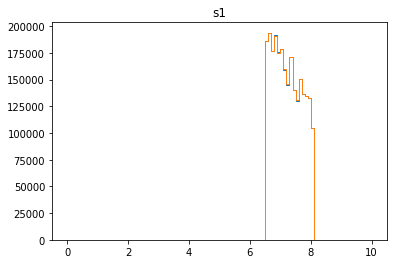

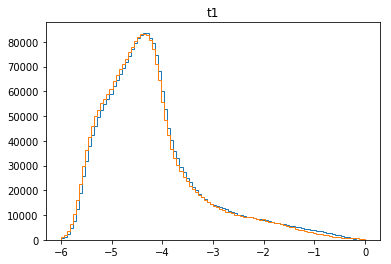

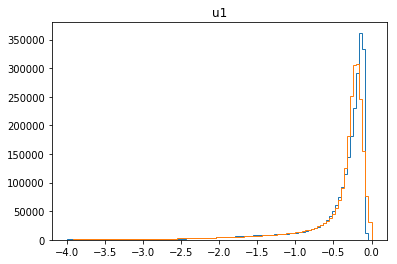

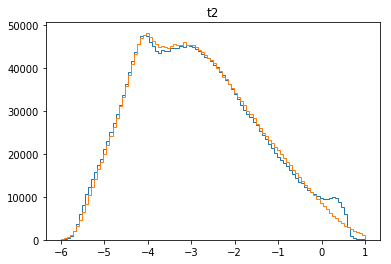

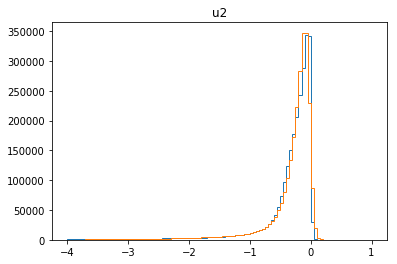

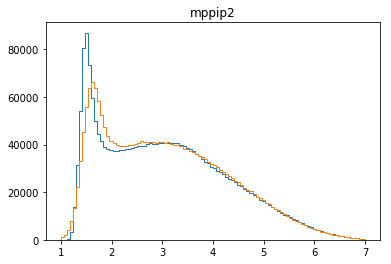

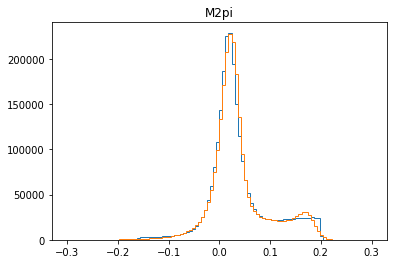

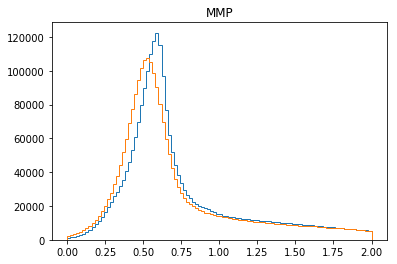

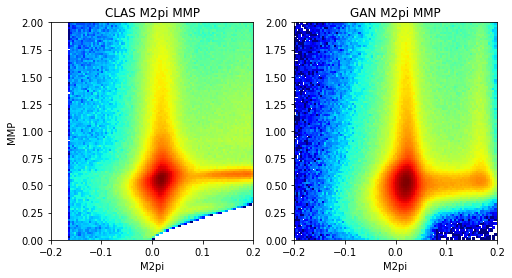

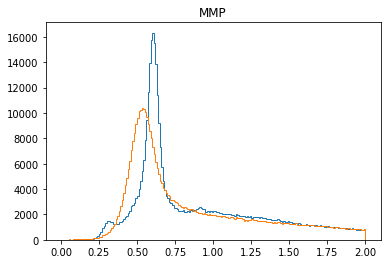

301 [[-0.30098054, -0.3015383, 0.00055775285], [-0.31714076, -0.3220685, 0.0049277674], [-0.33598897, -0.3364356, 0.0004466216], [-0.344441, -0.3465809, 0.0021398885], [-0.35052127, -0.35106453, 0.0005432535], [-0.29681683, -0.30379194, 0.0069751022], [-0.26854777, -0.27453914, 0.0059913825], [-0.2422291, -0.24309155, 0.00086244696], [-0.2224843, -0.22248432, 2.1569576e-08], [-0.20230427, -0.20374148, 0.0014372031], [-0.17973445, -0.1843368, 0.004602344], [-0.17210299, -0.17345797, 0.0013549703], [-0.18701881, -0.18769169, 0.00067288056], [-0.2089643, -0.20896512, 8.2081897e-07], [-0.23848715, -0.23852187, 3.4713303e-05], [-0.24909282, -0.2616722, 0.012579376], [-0.27058524, -0.27400306, 0.0034178223], [-0.29878706, -0.2990149, 0.00022785166], [-0.30559096, -0.30559123, 2.5934787e-07], [-0.29997307, -0.30693257, 0.006959498]]
302 [[-0.29532465, -0.29892093, 0.0035962746], [-0.29549402, -0.29589128, 0.0003972764], [-0.28353682, -0.28445435, 0.00091752067], [-0.25195158, -0.26457593, 0.0

311 [[-0.17746766, -0.18043028, 0.002962626], [-0.2308913, -0.23105642, 0.00016511757], [-0.28380895, -0.28399435, 0.00018541078], [-0.319467, -0.32387325, 0.0044062445], [-0.35235804, -0.35329077, 0.0009327201], [-0.3627622, -0.3657498, 0.0029875946], [-0.35126323, -0.35133526, 7.204107e-05], [-0.31750533, -0.3175812, 7.587911e-05], [-0.28150284, -0.2822329, 0.0007300533], [-0.24175955, -0.24176168, 2.1234737e-06], [-0.2009484, -0.20190068, 0.00095227733], [-0.17459406, -0.17499286, 0.00039879847], [-0.15786524, -0.16671592, 0.0088506825], [-0.17194691, -0.17323135, 0.0012844397], [-0.20191471, -0.20475447, 0.0028397613], [-0.22174458, -0.2225227, 0.00077812956], [-0.23958324, -0.24177836, 0.00219512], [-0.25156078, -0.25156894, 8.152744e-06], [-0.28452894, -0.2851548, 0.00062583946], [-0.307204, -0.30721158, 7.5646826e-06]]
312 [[-0.32041797, -0.32126525, 0.00084727845], [-0.3280283, -0.33028352, 0.0022552211], [-0.32871163, -0.33101913, 0.0023075123], [-0.316092, -0.31616035, 6.8334

321 [[-0.23666364, -0.23666383, 1.8746142e-07], [-0.24268089, -0.2440641, 0.0013831997], [-0.25365427, -0.2541165, 0.00046223425], [-0.28432617, -0.2860554, 0.0017292303], [-0.306516, -0.30652806, 1.2063687e-05], [-0.31210703, -0.31281742, 0.0007103979], [-0.32492206, -0.32922634, 0.0043042875], [-0.33980477, -0.34025124, 0.0004464603], [-0.3558665, -0.35600203, 0.00013554678], [-0.33435166, -0.33444092, 8.9247646e-05], [-0.2988753, -0.30178007, 0.002904773], [-0.26298708, -0.2652734, 0.0022863052], [-0.2392657, -0.2404329, 0.0011672081], [-0.21919833, -0.22045085, 0.0012525126], [-0.20716026, -0.20747803, 0.00031776913], [-0.19734804, -0.19764693, 0.00029888217], [-0.20491932, -0.20551986, 0.0006005252], [-0.22181407, -0.22764298, 0.005828917], [-0.24900049, -0.256643, 0.007642504], [-0.27924258, -0.28389993, 0.004657371]]
322 [[-0.3239209, -0.32454762, 0.0006266987], [-0.36611786, -0.3668353, 0.00071743067], [-0.39631304, -0.39703938, 0.0007263476], [-0.40818286, -0.40898675, 0.00080

331 [[-0.2973242, -0.297348, 2.3767412e-05], [-0.2614542, -0.26154548, 9.127718e-05], [-0.2357409, -0.23605284, 0.00031194795], [-0.20448776, -0.20567355, 0.001185788], [-0.19381793, -0.19447899, 0.0006610586], [-0.18861964, -0.19046415, 0.0018445107], [-0.20944798, -0.21000277, 0.0005547838], [-0.24985866, -0.24994235, 8.36794e-05], [-0.28334534, -0.28393397, 0.00058861915], [-0.3047378, -0.30523932, 0.00050149934], [-0.3225244, -0.32255843, 3.4042318e-05], [-0.32724673, -0.33101872, 0.0037720022], [-0.34036005, -0.34044802, 8.7990804e-05], [-0.34996435, -0.35016185, 0.0001974965], [-0.3459514, -0.34612036, 0.00016896312], [-0.33220565, -0.33227342, 6.776775e-05], [-0.31368414, -0.31387264, 0.00018848806], [-0.2748953, -0.27995083, 0.0050555146], [-0.23855942, -0.24114767, 0.0025882362], [-0.20272131, -0.20272389, 2.585326e-06]]
332 [[-0.18348227, -0.18354435, 6.20827e-05], [-0.19277579, -0.1935486, 0.0007728182], [-0.20890369, -0.21141353, 0.002509852], [-0.2367735, -0.23995838, 0.00

341 [[-0.32963303, -0.32980824, 0.00017521814], [-0.3035304, -0.3061578, 0.0026273916], [-0.2738016, -0.27416342, 0.00036183605], [-0.24503161, -0.24515383, 0.00012221286], [-0.22800335, -0.22870402, 0.0007006706], [-0.22365806, -0.22417133, 0.0005132711], [-0.22803582, -0.228233, 0.00019717499], [-0.23653199, -0.23704864, 0.0005166472], [-0.2571146, -0.25720802, 9.344013e-05], [-0.27584213, -0.2759053, 6.316946e-05], [-0.3032892, -0.30380628, 0.00051708077], [-0.31883287, -0.32132918, 0.002496301], [-0.33953872, -0.34070686, 0.0011681207], [-0.35641822, -0.3580593, 0.0016410745], [-0.35929447, -0.35954377, 0.0002492935], [-0.3546893, -0.35517284, 0.00048355229], [-0.33471292, -0.3352388, 0.0005258791], [-0.29766968, -0.30149528, 0.003825608], [-0.26012397, -0.2669331, 0.0068091583], [-0.25366655, -0.2536824, 1.5845466e-05]]
342 [[-0.25764325, -0.25894746, 0.0013042019], [-0.27698237, -0.27698642, 4.041489e-06], [-0.27500167, -0.27547994, 0.000478282], [-0.30030861, -0.3015356, 0.00122

351 [[-0.2292938, -0.23069535, 0.0014015618], [-0.28791824, -0.28924292, 0.0013246707], [-0.3375286, -0.33804256, 0.00051396276], [-0.37212247, -0.37222993, 0.00010746306], [-0.38746044, -0.39021826, 0.0027578284], [-0.40209842, -0.40402776, 0.0019293467], [-0.40440023, -0.4045273, 0.0001270677], [-0.38410017, -0.3841905, 9.033207e-05], [-0.36421636, -0.3642712, 5.482406e-05], [-0.33258, -0.3337561, 0.0011760872], [-0.30083755, -0.30088347, 4.592515e-05], [-0.27492794, -0.2764171, 0.0014891478], [-0.26008984, -0.26052955, 0.0004397153], [-0.24662301, -0.24878235, 0.0021593433], [-0.23576042, -0.23620833, 0.00044791237], [-0.22398862, -0.2295746, 0.0055859857], [-0.23339973, -0.23735622, 0.0039564786], [-0.2686343, -0.26986504, 0.0012307372], [-0.29722008, -0.297335, 0.00011490339], [-0.33656377, -0.3384794, 0.0019156314]]
352 [[-0.3730601, -0.37306184, 1.7220154e-06], [-0.38157272, -0.38430277, 0.002730053], [-0.37553233, -0.37916943, 0.0036371097], [-0.37281, -0.3728207, 1.068764e-05]

361 [[-0.3847169, -0.38478515, 6.82396e-05], [-0.3984228, -0.39844438, 2.1588117e-05], [-0.3993576, -0.40007594, 0.0007183506], [-0.37964714, -0.38118392, 0.0015367762], [-0.33988354, -0.34012917, 0.00024563304], [-0.2897462, -0.29719418, 0.0074480018], [-0.26658118, -0.26827413, 0.0016929377], [-0.24583258, -0.2460516, 0.00021901389], [-0.23046899, -0.23551746, 0.0050484645], [-0.24191421, -0.24304329, 0.0011290784], [-0.2675553, -0.26755953, 4.2354845e-06], [-0.27531213, -0.28078607, 0.005473936], [-0.30996367, -0.30997732, 1.3649583e-05], [-0.346196, -0.34621838, 2.2393073e-05], [-0.38596642, -0.38875115, 0.0027847379], [-0.42214134, -0.4234139, 0.0012725728], [-0.4548208, -0.4549877, 0.00016688692], [-0.4569352, -0.458417, 0.0014817966], [-0.42810825, -0.43178618, 0.0036779442], [-0.3722464, -0.37824842, 0.0060020178]]
362 [[-0.31342274, -0.31466958, 0.0012468486], [-0.26099566, -0.2630241, 0.0020284415], [-0.20660335, -0.20731609, 0.0007127384], [-0.17953598, -0.17954014, 4.157340

371 [[-0.4496764, -0.4497439, 6.751676e-05], [-0.46209186, -0.46864843, 0.0065565733], [-0.47034156, -0.4707746, 0.0004330217], [-0.4619503, -0.46197525, 2.493443e-05], [-0.41704062, -0.4170507, 1.0073185e-05], [-0.3634621, -0.36592042, 0.002458328], [-0.3151889, -0.31522977, 4.0851595e-05], [-0.2595122, -0.266451, 0.0069388296], [-0.23932329, -0.24247274, 0.0031494452], [-0.21729718, -0.21901786, 0.0017206748], [-0.22093886, -0.22112966, 0.00019079947], [-0.23755878, -0.23955385, 0.0019950778], [-0.2673458, -0.26977828, 0.0024324842], [-0.31496072, -0.31503472, 7.3996845e-05], [-0.33102298, -0.33368686, 0.0026638866], [-0.3430073, -0.34830377, 0.0052964617], [-0.367187, -0.36722803, 4.1046882e-05], [-0.38008013, -0.38044104, 0.00036089332], [-0.37747014, -0.3781049, 0.0006347461], [-0.3530862, -0.35888225, 0.005796055]]
372 [[-0.3541423, -0.3541613, 1.8978084e-05], [-0.34682065, -0.35089338, 0.0040727337], [-0.3563698, -0.35749862, 0.001128822], [-0.33453342, -0.33903667, 0.0045032483

381 [[-0.2916224, -0.29164064, 1.8253922e-05], [-0.26189783, -0.262194, 0.00029618433], [-0.2337415, -0.23510014, 0.0013586235], [-0.22381745, -0.22500798, 0.0011905215], [-0.24939357, -0.25222054, 0.0028269691], [-0.2947373, -0.29789317, 0.003155871], [-0.34278396, -0.3430764, 0.00029245403], [-0.37428886, -0.3760991, 0.0018102663], [-0.4093392, -0.40934482, 5.629903e-06], [-0.4291877, -0.429219, 3.131702e-05], [-0.43434462, -0.4360971, 0.0017524678], [-0.40360606, -0.4043234, 0.00071732857], [-0.36959815, -0.37181604, 0.0022178774], [-0.33675453, -0.33890185, 0.0021473062], [-0.30355534, -0.30566165, 0.0021063164], [-0.27626523, -0.27635762, 9.237381e-05], [-0.2503658, -0.2508935, 0.00052771776], [-0.24797179, -0.24874716, 0.0007753652], [-0.23538654, -0.25203878, 0.016652245], [-0.25961933, -0.26251012, 0.00289081]]
382 [[-0.28218982, -0.28277162, 0.00058179034], [-0.3317829, -0.33178523, 2.3341308e-06], [-0.37090564, -0.37228078, 0.0013751244], [-0.40169382, -0.40177685, 8.3017694e

391 [[-0.402904, -0.40290943, 5.4147677e-06], [-0.41373995, -0.41395053, 0.00021057227], [-0.40155455, -0.40221465, 0.0006600781], [-0.37138364, -0.37206486, 0.0006812183], [-0.34308243, -0.34382626, 0.0007438262], [-0.32671887, -0.33014628, 0.0034274184], [-0.3242663, -0.32696813, 0.0027018236], [-0.32000324, -0.32261208, 0.0026088485], [-0.31282747, -0.31409135, 0.0012638787], [-0.30081052, -0.3037157, 0.0029051844], [-0.29229775, -0.29550982, 0.0032120508], [-0.29659164, -0.29660335, 1.1721658e-05], [-0.3009203, -0.30098867, 6.836571e-05], [-0.3130932, -0.31310397, 1.0787641e-05], [-0.32340622, -0.32373697, 0.0003307513], [-0.3285299, -0.33150145, 0.0029715607], [-0.3265692, -0.32680005, 0.00023085579], [-0.32466125, -0.3262957, 0.0016344363], [-0.3363633, -0.3365266, 0.00016330887], [-0.36084577, -0.3613687, 0.000522909]]
392 [[-0.3864451, -0.38736773, 0.00092261186], [-0.42640483, -0.42761785, 0.0012130024], [-0.4183106, -0.42360985, 0.0052992385], [-0.39973882, -0.4014316, 0.0016

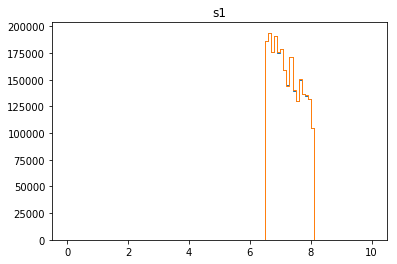

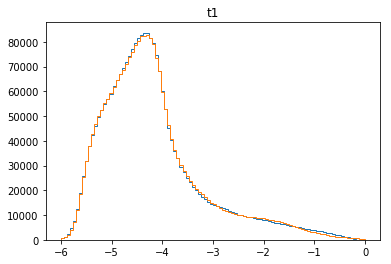

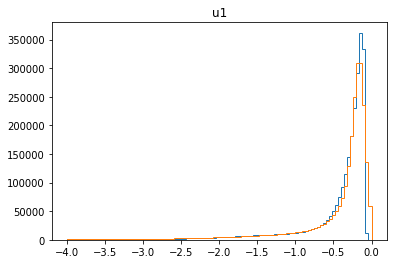

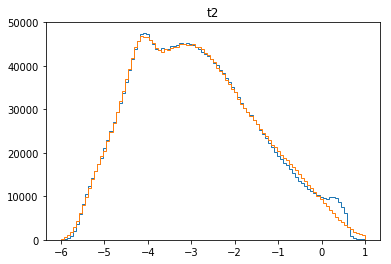

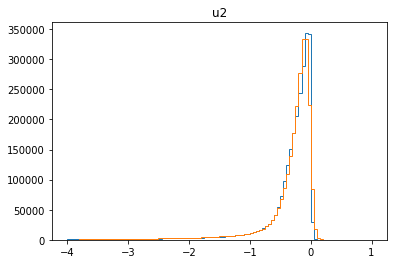

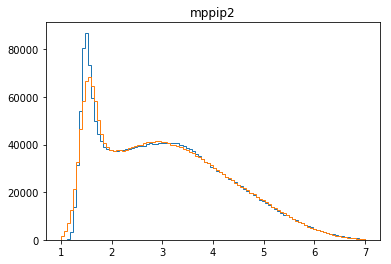

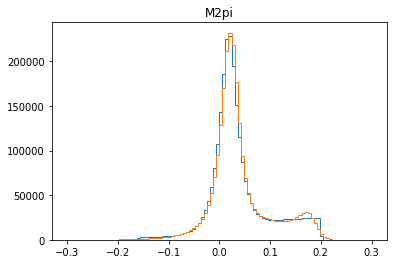

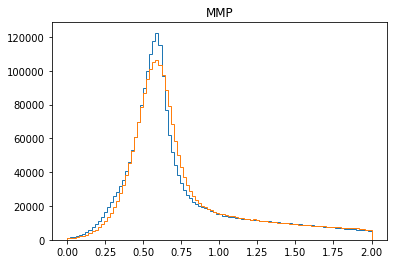

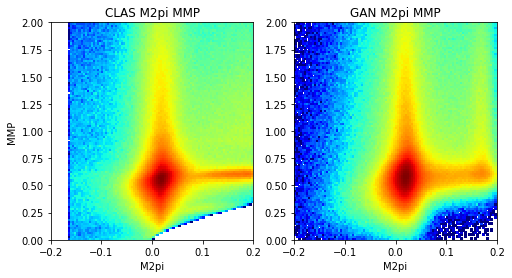

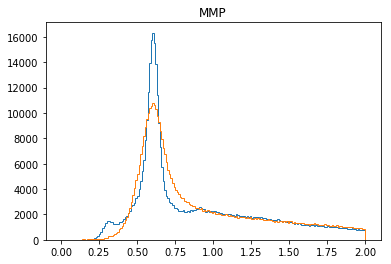

401 [[-0.28236452, -0.28322652, 0.0008619989], [-0.30156845, -0.30164534, 7.6879245e-05], [-0.3201174, -0.3201923, 7.488549e-05], [-0.3233964, -0.32340002, 3.594454e-06], [-0.33128557, -0.3315137, 0.00022813972], [-0.35667518, -0.35680225, 0.0001270677], [-0.3760098, -0.376756, 0.00074622105], [-0.39604738, -0.40133163, 0.005284254], [-0.41239795, -0.41480696, 0.0024090232], [-0.4207612, -0.42631218, 0.005550973], [-0.4304717, -0.43288428, 0.0024125823], [-0.4177353, -0.4186989, 0.000963612], [-0.37644616, -0.37658903, 0.00014288267], [-0.3220021, -0.32502276, 0.0030206293], [-0.2767062, -0.27676108, 5.4908833e-05], [-0.23222674, -0.23534949, 0.003122742], [-0.20431587, -0.20515794, 0.0008420677], [-0.18849555, -0.18850851, 1.29677355e-05], [-0.21049695, -0.21057002, 7.308089e-05], [-0.25690922, -0.2591124, 0.0022031704]]
402 [[-0.30642045, -0.3064205, 7.028939e-08], [-0.35947573, -0.36005834, 0.0005826187], [-0.4116478, -0.41267848, 0.0010306984], [-0.4520045, -0.45338315, 0.001378663

411 [[-0.18818071, -0.189166, 0.0009852842], [-0.17561622, -0.17604488, 0.00042866674], [-0.19234143, -0.19269189, 0.00035046192], [-0.23051709, -0.23199508, 0.001477981], [-0.2724715, -0.27327287, 0.0008013919], [-0.31075445, -0.31156635, 0.00081190123], [-0.3471266, -0.34773877, 0.0006121728], [-0.38673082, -0.38692725, 0.00019642575], [-0.4188687, -0.41924578, 0.00037708657], [-0.44645742, -0.4467762, 0.00031879], [-0.4438901, -0.44389674, 6.6597177e-06], [-0.4207128, -0.42329562, 0.0025828048], [-0.3987736, -0.3987891, 1.5483123e-05], [-0.36688435, -0.36700514, 0.00012078323], [-0.3352467, -0.33638427, 0.0011375541], [-0.29791245, -0.2993377, 0.0014252253], [-0.27071026, -0.27081615, 0.0001058871], [-0.25219613, -0.252563, 0.00036686016], [-0.23636594, -0.23680334, 0.00043739867], [-0.23032977, -0.23309422, 0.0027644432]]
412 [[-0.24539676, -0.24548815, 9.138656e-05], [-0.27617133, -0.2762121, 4.0778483e-05], [-0.3116212, -0.3116636, 4.2402084e-05], [-0.33066544, -0.3311173, 0.0004

421 [[-0.2599846, -0.2599993, 1.4697797e-05], [-0.29154015, -0.29211313, 0.0005729907], [-0.32941204, -0.3312425, 0.0018304482], [-0.3683821, -0.36861435, 0.00023224892], [-0.40233132, -0.4023531, 2.178352e-05], [-0.42142537, -0.42201808, 0.0005926984], [-0.4477147, -0.4477491, 3.442174e-05], [-0.46595597, -0.46672836, 0.000772394], [-0.464224, -0.4658555, 0.0016315072], [-0.45345032, -0.45352465, 7.432536e-05], [-0.401454, -0.40831015, 0.0068561407], [-0.35959756, -0.3597203, 0.00012271944], [-0.3077922, -0.30941692, 0.0016247346], [-0.26229534, -0.263777, 0.0014816497], [-0.215361, -0.21539283, 3.183146e-05], [-0.17915352, -0.17944337, 0.0002898504], [-0.17344698, -0.17749056, 0.0040435726], [-0.21112257, -0.21112545, 2.875171e-06], [-0.25183454, -0.2519195, 8.49755e-05], [-0.31289232, -0.31327453, 0.0003822151]]
422 [[-0.36652574, -0.36653435, 8.61663e-06], [-0.41445106, -0.41525862, 0.0008075592], [-0.4468799, -0.44691154, 3.1659514e-05], [-0.46661058, -0.46661085, 2.6520866e-07], 

431 [[-0.26548862, -0.26563764, 0.00014901161], [-0.29485518, -0.29539302, 0.00053784344], [-0.32661113, -0.32669926, 8.813399e-05], [-0.3543984, -0.354403, 4.596135e-06], [-0.37955984, -0.38007927, 0.00051942555], [-0.40092182, -0.40092435, 2.5425688e-06], [-0.4118586, -0.41190812, 4.9535087e-05], [-0.40827385, -0.41047004, 0.002196193], [-0.380151, -0.3807167, 0.00056570896], [-0.3498815, -0.3499003, 1.8812267e-05], [-0.33618954, -0.33625504, 6.5494714e-05], [-0.3179062, -0.318474, 0.0005677977], [-0.314654, -0.31583178, 0.0011777884], [-0.31768572, -0.31820142, 0.0005156938], [-0.31047902, -0.31269833, 0.0022193147], [-0.30503523, -0.31029814, 0.005262923], [-0.31307924, -0.3134527, 0.00037346562], [-0.31581283, -0.31583852, 2.5682852e-05], [-0.32599282, -0.3262024, 0.00020957705], [-0.33980253, -0.33998078, 0.00017826096]]
432 [[-0.35014653, -0.35165814, 0.0015116073], [-0.36443347, -0.36481696, 0.00038348403], [-0.36888897, -0.3706517, 0.0017627031], [-0.39994457, -0.40012664, 0.0

441 [[-0.4929212, -0.4935923, 0.0006711006], [-0.4674849, -0.467628, 0.00014311075], [-0.41747048, -0.41817856, 0.0007080612], [-0.36072412, -0.36199424, 0.0012701247], [-0.30592388, -0.30597126, 4.738424e-05], [-0.25123522, -0.25339404, 0.0021588118], [-0.23194648, -0.23276165, 0.0008151655], [-0.23415914, -0.23471212, 0.00055298826], [-0.26999375, -0.27047303, 0.00047928366], [-0.3079989, -0.30801344, 1.4537365e-05], [-0.3610254, -0.3618584, 0.00083301496], [-0.3950487, -0.39644313, 0.0013944303], [-0.42186347, -0.42192522, 6.175251e-05], [-0.4488859, -0.44976115, 0.00087526545], [-0.46670523, -0.46673372, 2.8481027e-05], [-0.45415643, -0.45501652, 0.00086009596], [-0.4396394, -0.43964607, 6.6794205e-06], [-0.4116152, -0.41173005, 0.00011486248], [-0.3721665, -0.3724155, 0.0002489925], [-0.3329212, -0.333461, 0.0005397915]]
442 [[-0.30483323, -0.30498424, 0.0001510207], [-0.2850997, -0.28545287, 0.00035318083], [-0.2860735, -0.2872993, 0.0012257905], [-0.27406964, -0.2772476, 0.00317

451 [[-0.33414614, -0.33467194, 0.00052579155], [-0.28624547, -0.2908039, 0.0045584547], [-0.26459652, -0.26461425, 1.7720044e-05], [-0.25433943, -0.25585356, 0.0015141297], [-0.25739035, -0.2592076, 0.0018172525], [-0.25097027, -0.25590903, 0.0049387524], [-0.27277753, -0.27436572, 0.0015881932], [-0.31342924, -0.31522962, 0.0018003795], [-0.3568131, -0.3571049, 0.00029180202], [-0.3891976, -0.39300245, 0.0038048725], [-0.4251631, -0.4341543, 0.008991199], [-0.466792, -0.46704778, 0.00025577983], [-0.48381475, -0.4843681, 0.0005533471], [-0.46302348, -0.46311417, 9.0694986e-05], [-0.42043826, -0.421628, 0.0011897321], [-0.3792942, -0.38029557, 0.0010013947], [-0.3381481, -0.33869964, 0.0005515538], [-0.2884085, -0.28898522, 0.0005767407], [-0.2396464, -0.23965737, 1.0963763e-05], [-0.20153436, -0.20758821, 0.0060538477]]
452 [[-0.21022712, -0.21080945, 0.0005823426], [-0.24502951, -0.24772677, 0.0026972643], [-0.2812404, -0.28132465, 8.423866e-05], [-0.2953401, -0.3007881, 0.005448001

461 [[-0.4386429, -0.43972942, 0.0010865461], [-0.4305649, -0.43056494, 2.046363e-08], [-0.39505962, -0.39647794, 0.0014183209], [-0.36873052, -0.36874744, 1.6926237e-05], [-0.3379561, -0.33841002, 0.00045390663], [-0.31031793, -0.31157976, 0.0012618452], [-0.2866506, -0.2868045, 0.00015389384], [-0.2651542, -0.26864243, 0.0034882077], [-0.2768159, -0.27707052, 0.00025462196], [-0.30143723, -0.30150607, 6.883965e-05], [-0.32140285, -0.32247037, 0.0010675173], [-0.3362547, -0.33805847, 0.0018037802], [-0.3455146, -0.34859908, 0.0030844891], [-0.39335266, -0.39358857, 0.00023592588], [-0.43668717, -0.43678173, 9.4549636e-05], [-0.46247354, -0.46311215, 0.0006385962], [-0.4444689, -0.45810318, 0.013634292], [-0.4607122, -0.4621212, 0.0014089978], [-0.44101337, -0.44307545, 0.0020620823], [-0.4162989, -0.4162993, 4.1071326e-07]]
462 [[-0.3590592, -0.36008772, 0.001028495], [-0.29644015, -0.29651755, 7.73818e-05], [-0.24575889, -0.24731998, 0.0015610978], [-0.22648337, -0.22983484, 0.003351

471 [[-0.45968956, -0.4596961, 6.561637e-06], [-0.42253083, -0.4236971, 0.001166296], [-0.39541426, -0.39541724, 2.9730145e-06], [-0.3515697, -0.35403922, 0.0024694998], [-0.31925887, -0.31930575, 4.688663e-05], [-0.2808303, -0.28113097, 0.00030066542], [-0.26521635, -0.26538786, 0.00017150144], [-0.26496604, -0.26540136, 0.0004353268], [-0.30523244, -0.3053611, 0.0001286637], [-0.3277663, -0.32865256, 0.0008862467], [-0.3457773, -0.34632814, 0.0005508374], [-0.378882, -0.37900975, 0.00012775665], [-0.41753167, -0.41764128, 0.0001096091], [-0.45725635, -0.45772022, 0.000463876], [-0.4781991, -0.47955337, 0.0013542684], [-0.45583332, -0.4562963, 0.00046297265], [-0.4197954, -0.42144775, 0.0016523749], [-0.38794336, -0.3903021, 0.0023587358], [-0.35434496, -0.35529453, 0.000949572], [-0.31721988, -0.31769624, 0.00047636512]]
472 [[-0.2956491, -0.29565638, 7.2737603e-06], [-0.27772325, -0.27802148, 0.000298223], [-0.28623286, -0.28770748, 0.0014746101], [-0.2937466, -0.30033967, 0.0065930

481 [[-0.26578537, -0.26655787, 0.00077250006], [-0.24107473, -0.24170439, 0.0006296626], [-0.2514046, -0.25275663, 0.0013520231], [-0.29186222, -0.29247156, 0.00060934457], [-0.324846, -0.325095, 0.0002489925], [-0.35889545, -0.36407486, 0.0051794047], [-0.39972693, -0.40076733, 0.001040396], [-0.43988794, -0.44014612, 0.0002581647], [-0.46308693, -0.46332622, 0.00023927752], [-0.47539273, -0.47545305, 6.0321996e-05], [-0.47242743, -0.4737855, 0.0013580614], [-0.45608115, -0.4596359, 0.00355476], [-0.42067447, -0.42067456, 8.6278305e-08], [-0.38083386, -0.3809803, 0.00014646149], [-0.35496536, -0.3557119, 0.00074653386], [-0.3432729, -0.34371045, 0.00043755825], [-0.33976588, -0.3411217, 0.001355813], [-0.3306793, -0.33266196, 0.0019826586], [-0.34098414, -0.34163144, 0.0006473017], [-0.36326194, -0.36459497, 0.0013330142]]
482 [[-0.38800064, -0.388368, 0.00036737183], [-0.40503207, -0.40626132, 0.0012292656], [-0.3884982, -0.3906203, 0.0021221028], [-0.38162696, -0.38577428, 0.004147

491 [[-0.2763006, -0.2763347, 3.408685e-05], [-0.2850049, -0.28535795, 0.00035303744], [-0.33265817, -0.33291718, 0.0002590235], [-0.37290633, -0.3731285, 0.00022218672], [-0.42123118, -0.42131618, 8.5010666e-05], [-0.4641248, -0.46507204, 0.00094722223], [-0.49049816, -0.49086452, 0.00036634895], [-0.5113486, -0.5116677, 0.00031913057], [-0.5088103, -0.509194, 0.00038370816], [-0.46611503, -0.4695275, 0.0034124719], [-0.4311727, -0.43134505, 0.00017235178], [-0.39193034, -0.39279795, 0.0008676079], [-0.3501004, -0.35131925, 0.0012188554], [-0.3060994, -0.30616045, 6.1035156e-05], [-0.28045833, -0.28101763, 0.00055928534], [-0.2810692, -0.28267857, 0.001609395], [-0.29368153, -0.299008, 0.005326487], [-0.34306607, -0.34361646, 0.0005503899], [-0.36534116, -0.36539719, 5.6016783e-05], [-0.38911495, -0.38967496, 0.00056000735]]
492 [[-0.41141212, -0.41141942, 7.3046585e-06], [-0.43317842, -0.4342771, 0.001098651], [-0.44969478, -0.45124173, 0.0015469618], [-0.4637168, -0.4637443, 2.75122

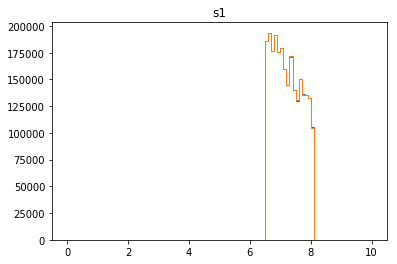

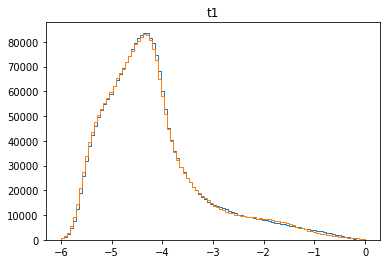

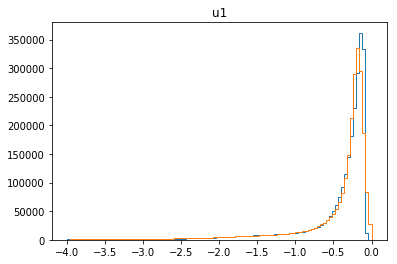

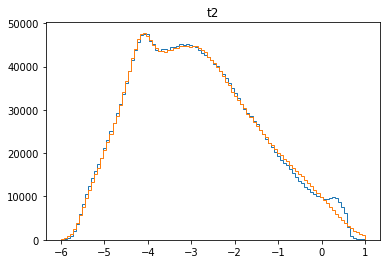

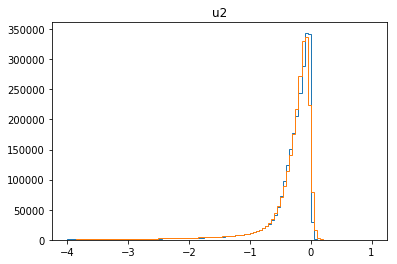

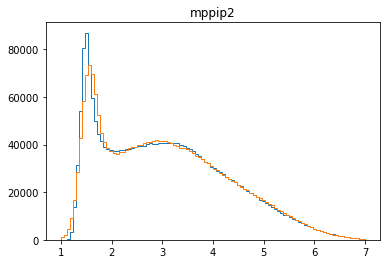

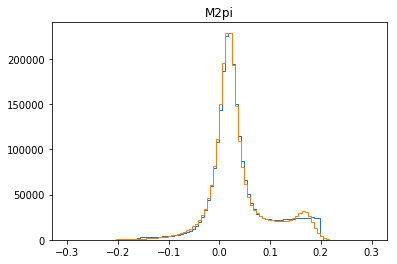

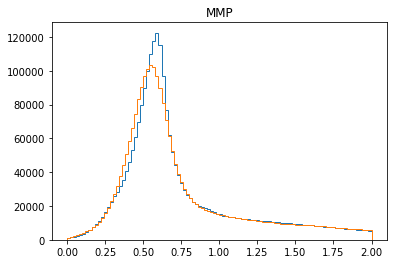

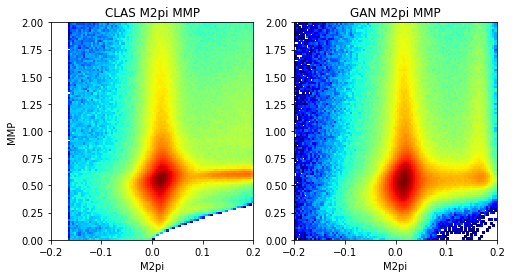

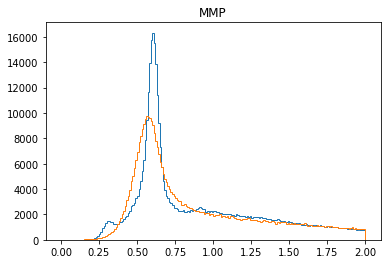

501 [[-0.37888342, -0.3800384, 0.0011549896], [-0.36246538, -0.36254022, 7.4819494e-05], [-0.3484894, -0.34849182, 2.4105102e-06], [-0.3021705, -0.31721961, 0.015049141], [-0.30831334, -0.3108948, 0.0025814476], [-0.32655054, -0.3268574, 0.00030684844], [-0.35853595, -0.35900146, 0.00046552066], [-0.39272037, -0.39519593, 0.0024755697], [-0.43573987, -0.4370594, 0.0013195387], [-0.47595608, -0.47879443, 0.002838339], [-0.47603324, -0.4768483, 0.0008150565], [-0.4528629, -0.45584422, 0.0029813424], [-0.4294821, -0.4319868, 0.002504694], [-0.3955793, -0.39744157, 0.0018622471], [-0.35922933, -0.36148563, 0.002256308], [-0.32409707, -0.32433465, 0.00023756933], [-0.26820442, -0.27286258, 0.0046581523], [-0.25977424, -0.26121187, 0.001437637], [-0.25627965, -0.25746268, 0.0011830311], [-0.282949, -0.28801185, 0.005062841]]
502 [[-0.3149459, -0.31494677, 8.6991713e-07], [-0.34709102, -0.34943515, 0.0023441226], [-0.40196666, -0.401989, 2.2356982e-05], [-0.45142236, -0.45176977, 0.0003473978

511 [[-0.43228793, -0.43250448, 0.00021653698], [-0.48337084, -0.4835215, 0.00015064586], [-0.49486002, -0.4951896, 0.00032957297], [-0.49569574, -0.49866316, 0.0029674035], [-0.5094223, -0.50965726, 0.00023498929], [-0.49427876, -0.49577188, 0.001493125], [-0.45668837, -0.45698202, 0.0002936295], [-0.39957476, -0.4048665, 0.005291743], [-0.35380235, -0.3541066, 0.0003042479], [-0.29467028, -0.298089, 0.0034187138], [-0.2682448, -0.26961258, 0.0013677788], [-0.26671064, -0.26777518, 0.0010645279], [-0.2773753, -0.27801767, 0.0006423614], [-0.31812367, -0.31823906, 0.00011539459], [-0.359098, -0.3591382, 4.019594e-05], [-0.39053464, -0.39262873, 0.002094079], [-0.42628747, -0.42741564, 0.0011281812], [-0.4514023, -0.45190594, 0.00050363725], [-0.4615546, -0.46161994, 6.537128e-05], [-0.45413622, -0.45569068, 0.001554473]]
512 [[-0.42488456, -0.42662475, 0.0017401933], [-0.38262722, -0.38265958, 3.2371783e-05], [-0.33512497, -0.33594438, 0.0008194186], [-0.30440277, -0.30450007, 9.731443

521 [[-0.3018749, -0.30217716, 0.000302255], [-0.30211556, -0.30588147, 0.003765913], [-0.32598075, -0.32676527, 0.00078452745], [-0.35065374, -0.35092, 0.00026625645], [-0.37422335, -0.3797281, 0.0055047427], [-0.40331826, -0.4033407, 2.244726e-05], [-0.42330736, -0.4243239, 0.001016541], [-0.45104992, -0.4531622, 0.0021122731], [-0.46247172, -0.4626596, 0.00018786013], [-0.443794, -0.44585782, 0.0020638148], [-0.40125054, -0.4048523, 0.0036017671], [-0.37191415, -0.37258643, 0.00067228696], [-0.35415146, -0.3542077, 5.6245422e-05], [-0.34013632, -0.3401562, 1.9869072e-05], [-0.34533247, -0.34545004, 0.00011757666], [-0.36838147, -0.37306884, 0.004687358], [-0.38175946, -0.38441154, 0.0026520866], [-0.40557915, -0.40779182, 0.0022126706], [-0.4301618, -0.43139267, 0.0012308708], [-0.436635, -0.43667188, 3.6904476e-05]]
522 [[-0.4357984, -0.43583804, 3.9641607e-05], [-0.41383266, -0.4150406, 0.001207959], [-0.3942144, -0.39591315, 0.0016987502], [-0.3603243, -0.36374947, 0.0034251856],

531 [[-0.45034105, -0.45041737, 7.6311706e-05], [-0.3938326, -0.39447543, 0.0006428448], [-0.3312388, -0.3313826, 0.00014379606], [-0.2758851, -0.2772098, 0.0013246707], [-0.24622293, -0.24732931, 0.0011063776], [-0.22842582, -0.23239262, 0.003966803], [-0.2575053, -0.25891572, 0.0014104303], [-0.3076996, -0.30773705, 3.7462745e-05], [-0.35972655, -0.36074454, 0.0010180009], [-0.39883348, -0.40063274, 0.0017992468], [-0.43565324, -0.4417836, 0.006130367], [-0.45703778, -0.45945448, 0.0024167062], [-0.47008488, -0.47085556, 0.00077069865], [-0.4591669, -0.4595967, 0.00042977318], [-0.43868172, -0.4387124, 3.067986e-05], [-0.39869335, -0.40077576, 0.0020823998], [-0.3570269, -0.35901722, 0.0019903095], [-0.31372258, -0.3144763, 0.0007537429], [-0.28740984, -0.28934187, 0.0019320288], [-0.27757442, -0.28319553, 0.00562111]]
532 [[-0.31926653, -0.3197784, 0.0005118893], [-0.35869408, -0.35903728, 0.00034321554], [-0.37937778, -0.3796495, 0.0002716994], [-0.40399578, -0.4042425, 0.000246710

541 [[-0.4063526, -0.40760985, 0.001257242], [-0.42711654, -0.42711833, 1.7928105e-06], [-0.43452823, -0.4345336, 5.379319e-06], [-0.43005824, -0.43462753, 0.0045692776], [-0.41607082, -0.41607836, 7.53324e-06], [-0.40067738, -0.40075317, 7.5779455e-05], [-0.3742036, -0.37455192, 0.0003483227], [-0.37299758, -0.373004, 6.415881e-06], [-0.36554122, -0.36554134, 1.1269003e-07], [-0.3745029, -0.37472185, 0.00021895746], [-0.36139765, -0.3613977, 4.4823537e-08], [-0.33051378, -0.3350681, 0.004554334], [-0.32368892, -0.3241793, 0.00049037073], [-0.3143867, -0.3180496, 0.003662922], [-0.31513378, -0.31596822, 0.0008344469], [-0.30015603, -0.30020618, 5.015452e-05], [-0.30108494, -0.30173758, 0.0006526506], [-0.30280155, -0.30281657, 1.5021302e-05], [-0.31684595, -0.31718045, 0.00033450822], [-0.3488825, -0.34904978, 0.0001672814]]
542 [[-0.39424506, -0.39760515, 0.0033600838], [-0.44326404, -0.44587582, 0.0026117722], [-0.48373705, -0.48704362, 0.0033065656], [-0.50001544, -0.5020456, 0.0020

551 [[-0.24371983, -0.24500577, 0.001285944], [-0.25939023, -0.2595076, 0.00011736993], [-0.2944758, -0.29490247, 0.00042669446], [-0.3503854, -0.35135946, 0.00097406085], [-0.41036573, -0.41041866, 5.292021e-05], [-0.450172, -0.45099777, 0.0008257643], [-0.4822362, -0.48326653, 0.001030331], [-0.48014933, -0.48114964, 0.0010003087], [-0.45713744, -0.45751742, 0.00037998112], [-0.41806558, -0.41825834, 0.00019275412], [-0.3683914, -0.36881518, 0.00042378402], [-0.31071004, -0.31072137, 1.1320284e-05], [-0.25997946, -0.25998122, 1.7572346e-06], [-0.22534359, -0.2294151, 0.004071518], [-0.22316258, -0.22861592, 0.005453353], [-0.25492522, -0.25684786, 0.0019226506], [-0.30654326, -0.3067001, 0.00015684185], [-0.35538158, -0.35639194, 0.0010103477], [-0.39393288, -0.39479175, 0.00085886574], [-0.42217073, -0.4241687, 0.001997975]]
552 [[-0.4451323, -0.4455428, 0.0004105391], [-0.45860568, -0.46394664, 0.0053409743], [-0.44513348, -0.4470441, 0.001910626], [-0.40970862, -0.4144502, 0.00474

561 [[-0.429498, -0.42955583, 5.785894e-05], [-0.45084575, -0.45085204, 6.28132e-06], [-0.46527278, -0.46527833, 5.5487367e-06], [-0.45310077, -0.45310083, 7.1304385e-08], [-0.41328967, -0.4183824, 0.0050927424], [-0.3733417, -0.373528, 0.00018629483], [-0.32550585, -0.3273538, 0.0018479528], [-0.27318192, -0.27615118, 0.0029692738], [-0.25142744, -0.2514377, 1.0255611e-05], [-0.2510958, -0.2519219, 0.0008260932], [-0.27509457, -0.27509993, 5.379319e-06], [-0.31055108, -0.31098434, 0.00043325988], [-0.34248805, -0.35337877, 0.010890732], [-0.38371894, -0.38449973, 0.0007807922], [-0.4013163, -0.40138152, 6.5247965e-05], [-0.4102114, -0.41128492, 0.0010735083], [-0.40407372, -0.40459105, 0.0005173411], [-0.39216745, -0.39706632, 0.004898889], [-0.38563326, -0.38694394, 0.001310685], [-0.34711832, -0.34732613, 0.00020781359]]
562 [[-0.2856194, -0.2900925, 0.0044730925], [-0.25901577, -0.25985342, 0.00083764567], [-0.2521177, -0.25261903, 0.0005013285], [-0.26370108, -0.26590747, 0.002206

571 [[-0.25637507, -0.25671223, 0.00033716467], [-0.2419727, -0.24201849, 4.5795983e-05], [-0.25315613, -0.2542219, 0.0010657731], [-0.28431627, -0.28523934, 0.00092307536], [-0.32542253, -0.32841137, 0.002988845], [-0.35973564, -0.36102474, 0.0012890921], [-0.39794025, -0.3989016, 0.0009613633], [-0.43423846, -0.43667358, 0.002435119], [-0.46190205, -0.46201786, 0.00011580475], [-0.4434427, -0.44353104, 8.8348985e-05], [-0.40904313, -0.40904525, 2.10683e-06], [-0.36737683, -0.37038574, 0.0030088997], [-0.31803682, -0.3181152, 7.8391764e-05], [-0.26197806, -0.262604, 0.000625935], [-0.22531089, -0.22541875, 0.000107858876], [-0.22319762, -0.22568879, 0.0024911575], [-0.25804967, -0.25817567, 0.00012599492], [-0.29295576, -0.2929559, 1.4551915e-07], [-0.32253677, -0.33193433, 0.009397556], [-0.37409523, -0.3742666, 0.0001713516]]
572 [[-0.40939134, -0.40972915, 0.0003377954], [-0.4409819, -0.4419082, 0.0009263234], [-0.4490492, -0.45236698, 0.0033177624], [-0.4555939, -0.45573124, 0.000

581 [[-0.30610606, -0.30613393, 2.7853415e-05], [-0.34150615, -0.34193042, 0.0004242553], [-0.38267037, -0.38284433, 0.00017395802], [-0.42381722, -0.42487752, 0.0010603006], [-0.4567791, -0.4571804, 0.00040131636], [-0.48047075, -0.4812495, 0.00077876804], [-0.4738587, -0.47454134, 0.0006826129], [-0.42913607, -0.43114942, 0.0020133504], [-0.3867256, -0.38850403, 0.0017784334], [-0.3365556, -0.3367254, 0.00016980711], [-0.29059905, -0.2907802, 0.00018112455], [-0.2559049, -0.25659323, 0.0006883057], [-0.24098967, -0.24599324, 0.005003572], [-0.263214, -0.26487818, 0.0016641808], [-0.2948064, -0.29743788, 0.0026314994], [-0.32758868, -0.32881448, 0.0012257905], [-0.35717428, -0.3575153, 0.00034102827], [-0.38601235, -0.38718098, 0.0011686422], [-0.41179317, -0.41196346, 0.00017030457], [-0.42110553, -0.42423445, 0.0031289272]]
582 [[-0.4027253, -0.40628645, 0.0035611312], [-0.36282006, -0.36615345, 0.0033333816], [-0.32621646, -0.32625788, 4.1438852e-05], [-0.2914428, -0.29599097, 0.00

591 [[-0.3734813, -0.37375137, 0.00027006704], [-0.306535, -0.30831924, 0.0017842297], [-0.24765638, -0.25123233, 0.0035759436], [-0.21710913, -0.21927325, 0.0021641327], [-0.22370796, -0.22376281, 5.4852306e-05], [-0.25401688, -0.25410515, 8.827728e-05], [-0.29497597, -0.29516456, 0.00018859284], [-0.33390343, -0.33393347, 3.0049254e-05], [-0.3814298, -0.38269937, 0.001269581], [-0.4193804, -0.42253947, 0.0031590862], [-0.45838606, -0.4607552, 0.002369122], [-0.49348608, -0.49366084, 0.00017476399], [-0.48740843, -0.4883307, 0.0009222644], [-0.44969174, -0.45009238, 0.0004006289], [-0.39735287, -0.39736173, 8.842038e-06], [-0.33111653, -0.33559576, 0.0044792173], [-0.27436927, -0.27671432, 0.0023450458], [-0.24516788, -0.24557912, 0.0004112351], [-0.23383154, -0.23423132, 0.00039978945], [-0.25152823, -0.25180417, 0.00027592859]]
592 [[-0.286363, -0.28966936, 0.0033063465], [-0.32450572, -0.325868, 0.001362282], [-0.3660504, -0.36644116, 0.00039076438], [-0.40258843, -0.40669507, 0.00

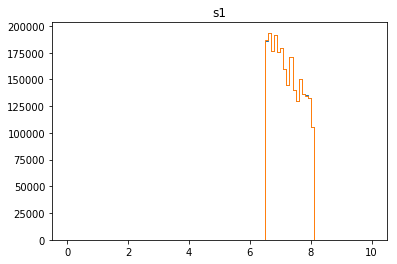

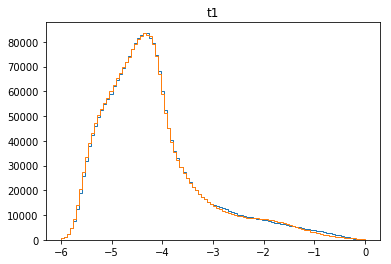

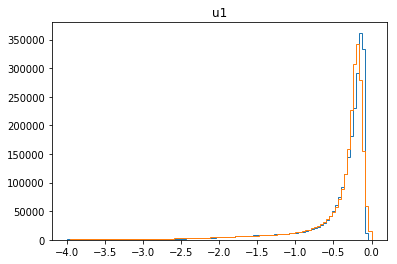

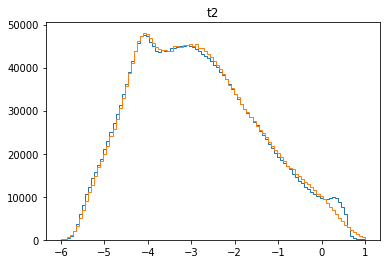

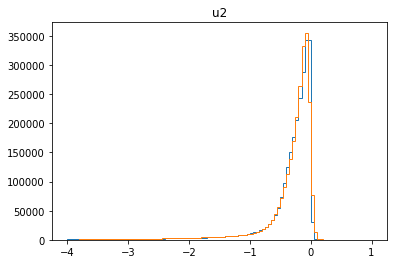

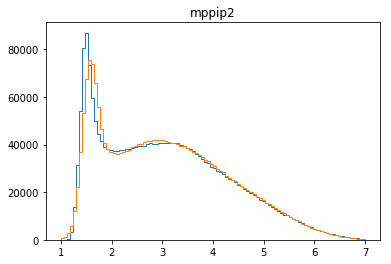

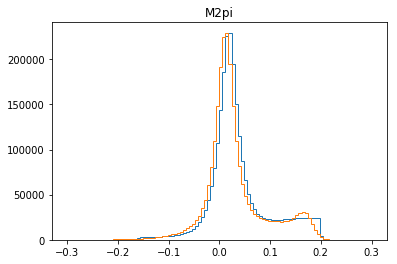

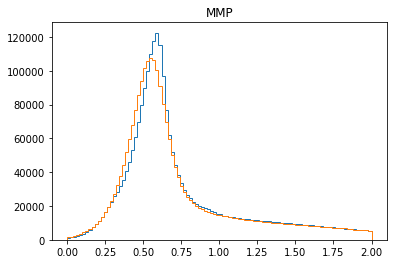

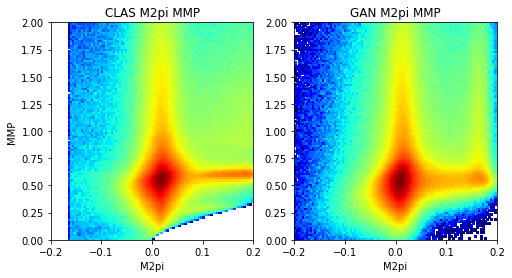

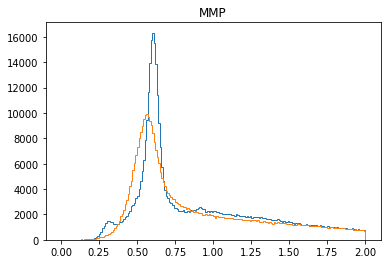

601 [[-0.41487238, -0.41692132, 0.002048938], [-0.37340385, -0.3745454, 0.0011415461], [-0.31851837, -0.32682258, 0.008304203], [-0.27132028, -0.278879, 0.007558698], [-0.24710937, -0.24720998, 0.00010061588], [-0.24652587, -0.2465848, 5.8937534e-05], [-0.26128426, -0.26179123, 0.0005069816], [-0.2980469, -0.2989108, 0.00086390384], [-0.33396372, -0.33793485, 0.003971129], [-0.3664502, -0.36664924, 0.00019905421], [-0.39182898, -0.39422306, 0.0023940678], [-0.4368699, -0.43694302, 7.314615e-05], [-0.46172082, -0.4629247, 0.0012038525], [-0.43711314, -0.43711376, 6.14531e-07], [-0.38540384, -0.38540682, 2.9730145e-06], [-0.32494798, -0.32849866, 0.003550668], [-0.27479336, -0.27573648, 0.0009431176], [-0.2305123, -0.23166354, 0.0011512329], [-0.20951623, -0.21042314, 0.0009069208], [-0.20600627, -0.21233475, 0.006328473]]
602 [[-0.24863124, -0.25040004, 0.0017687943], [-0.30281234, -0.3031578, 0.00034548077], [-0.3522163, -0.35449076, 0.0022744646], [-0.38595852, -0.387202, 0.0012434834

611 [[-0.34343165, -0.3439789, 0.00054726197], [-0.37353787, -0.3771713, 0.0036334298], [-0.4142451, -0.41516668, 0.00092156936], [-0.4295981, -0.43240643, 0.0028083401], [-0.4266221, -0.43099144, 0.0043693525], [-0.39497614, -0.40249643, 0.007520274], [-0.35441166, -0.35697144, 0.0025597862], [-0.31023902, -0.31028527, 4.6261837e-05], [-0.27874675, -0.27876237, 1.5618512e-05], [-0.24272354, -0.24304022, 0.000316682], [-0.23208627, -0.23210116, 1.4888533e-05], [-0.2550328, -0.2555132, 0.00048036996], [-0.29287252, -0.29337326, 0.0005007308], [-0.3257857, -0.3313452, 0.005559503], [-0.35424078, -0.35451904, 0.0002782781], [-0.3631005, -0.3631088, 8.327948e-06], [-0.38256007, -0.3832658, 0.00070572854], [-0.384069, -0.38506666, 0.000997656], [-0.3606951, -0.3611495, 0.0004543944], [-0.30162254, -0.31574395, 0.014121411]]
612 [[-0.275183, -0.28117675, 0.005993744], [-0.26562178, -0.27033216, 0.004710369], [-0.28660294, -0.286887, 0.00028403482], [-0.32215902, -0.32228133, 0.00012229722], 

621 [[-0.33812654, -0.34203088, 0.003904343], [-0.38678524, -0.38682604, 4.0802846e-05], [-0.42399514, -0.4240866, 9.1459515e-05], [-0.44778034, -0.45234293, 0.0045625763], [-0.4587285, -0.4587759, 4.7410507e-05], [-0.43496528, -0.43660343, 0.0016381394], [-0.37446514, -0.3749851, 0.00051994727], [-0.2930645, -0.30034783, 0.0072833253], [-0.23354825, -0.24036056, 0.0068123066], [-0.19029403, -0.1936827, 0.0033886696], [-0.16765268, -0.16776563, 0.00011294901], [-0.1814429, -0.18216126, 0.0007183506], [-0.227955, -0.2294782, 0.001523198], [-0.2768101, -0.27787054, 0.0010604248], [-0.322615, -0.324505, 0.001890006], [-0.3604083, -0.360736, 0.00032770575], [-0.39947265, -0.39988104, 0.00040837782], [-0.4175502, -0.41898265, 0.0014324348], [-0.42103156, -0.42175648, 0.000724909], [-0.39623004, -0.39801976, 0.0017897126]]
622 [[-0.3414722, -0.34153637, 6.4173946e-05], [-0.26886266, -0.2712164, 0.0023537362], [-0.21469189, -0.21469991, 8.011761e-06], [-0.17637675, -0.17941207, 0.0030353232],

631 [[-0.23291062, -0.23424642, 0.0013358011], [-0.2606714, -0.2625166, 0.0018451662], [-0.29530475, -0.297489, 0.0021842318], [-0.33247408, -0.33488274, 0.0024086488], [-0.34458536, -0.3451666, 0.0005812384], [-0.32358024, -0.32479602, 0.0012157944], [-0.30857733, -0.30977628, 0.0011989605], [-0.27987695, -0.28974548, 0.009868523], [-0.29903942, -0.29928064, 0.0002412287], [-0.33207157, -0.33318025, 0.0011086626], [-0.35298216, -0.35731503, 0.0043328656], [-0.37192625, -0.37396052, 0.0020342872], [-0.3807843, -0.3813203, 0.0005359872], [-0.3878105, -0.38882414, 0.001013624], [-0.37819204, -0.37821004, 1.7994083e-05], [-0.36780366, -0.3683165, 0.000512839], [-0.33785394, -0.33914316, 0.0012892293], [-0.2912091, -0.29689157, 0.005682481], [-0.24971585, -0.2505166, 0.0008007442], [-0.22193629, -0.2224051, 0.00046881873]]
632 [[-0.2151298, -0.21513301, 3.2145183e-06], [-0.23792543, -0.23877104, 0.00084561366], [-0.29268876, -0.29468963, 0.0020008748], [-0.33437684, -0.33591333, 0.00153647

641 [[-0.41974705, -0.42030615, 0.00055910496], [-0.45293033, -0.45315355, 0.00022321145], [-0.46307844, -0.46324217, 0.0001637479], [-0.45259562, -0.4530411, 0.00044549358], [-0.4127127, -0.41303924, 0.00032653287], [-0.35228384, -0.35228443, 6.055925e-07], [-0.28003305, -0.2864477, 0.0064146444], [-0.22263218, -0.22470328, 0.0020710998], [-0.17782335, -0.18033952, 0.0025161619], [-0.15808854, -0.15810744, 1.8911669e-05], [-0.18424372, -0.18424504, 1.3184181e-06], [-0.23751055, -0.23751608, 5.5307796e-06], [-0.29518738, -0.29616955, 0.0009821735], [-0.33806807, -0.33928946, 0.0012213872], [-0.37845334, -0.37975976, 0.0013064073], [-0.4051762, -0.40517873, 2.5243535e-06], [-0.4343204, -0.4343204, 5.820766e-11], [-0.43680665, -0.43748796, 0.0006813178], [-0.40390387, -0.40547812, 0.001574238], [-0.35551727, -0.3563391, 0.0008218227]]
642 [[-0.28638667, -0.287975, 0.0015883452], [-0.22646798, -0.2265428, 7.4819494e-05], [-0.18644446, -0.18645121, 6.7486103e-06], [-0.17241535, -0.17340027

651 [[-0.40200606, -0.40347672, 0.0014706575], [-0.38968715, -0.3901583, 0.00047113435], [-0.33938727, -0.34341776, 0.0040304847], [-0.28443006, -0.28666466, 0.0022346165], [-0.2474437, -0.2474499, 6.1955693e-06], [-0.21942484, -0.22041072, 0.000985883], [-0.20733877, -0.20735034, 1.1578436e-05], [-0.21228531, -0.21292855, 0.00064323185], [-0.24413893, -0.24454576, 0.00040683747], [-0.29431137, -0.29593688, 0.0016255036], [-0.342101, -0.3487568, 0.00665579], [-0.37978932, -0.38237834, 0.0025890125], [-0.40821424, -0.41017285, 0.0019586121], [-0.4214556, -0.4220639, 0.0006083092], [-0.39672196, -0.39731345, 0.0005914917], [-0.35641313, -0.3567984, 0.00038527898], [-0.29606676, -0.2995534, 0.0034866307], [-0.24779779, -0.2480907, 0.0002929109], [-0.20845862, -0.20952265, 0.0010640303], [-0.18692924, -0.1869293, 5.9604645e-08]]
652 [[-0.18001188, -0.18001205, 1.5739352e-07], [-0.21284643, -0.21296944, 0.00012301544], [-0.27013215, -0.27155825, 0.0014260893], [-0.33255577, -0.3337765, 0.00

661 [[-0.4139445, -0.41435876, 0.00041425752], [-0.3784025, -0.37873575, 0.00033325356], [-0.32854554, -0.32923076, 0.00068520673], [-0.27605045, -0.27608237, 3.1917607e-05], [-0.2196467, -0.22021033, 0.0005636241], [-0.17840675, -0.17840703, 2.8115755e-07], [-0.16806331, -0.16810666, 4.335126e-05], [-0.2078551, -0.207934, 7.8899204e-05], [-0.25057918, -0.25222877, 0.0016495847], [-0.28988847, -0.29302529, 0.0031368274], [-0.33178326, -0.3334599, 0.0016766535], [-0.37305674, -0.37353736, 0.00048062077], [-0.4009205, -0.40686858, 0.0059480565], [-0.42862886, -0.42964152, 0.0010126525], [-0.43284637, -0.4328475, 1.1449483e-06], [-0.40564653, -0.40587786, 0.0002313197], [-0.35306928, -0.3531731, 0.00010381687], [-0.2885759, -0.28865975, 8.385396e-05], [-0.21653286, -0.22621919, 0.009686337], [-0.1805274, -0.18239261, 0.0018652118]]
662 [[-0.16071342, -0.16222014, 0.0015067171], [-0.18653643, -0.18885091, 0.002314481], [-0.24503605, -0.2458162, 0.0007801526], [-0.3054034, -0.3073573, 0.001

671 [[-0.45352408, -0.4536722, 0.00014812817], [-0.4721612, -0.47294125, 0.00078004604], [-0.45414534, -0.45515364, 0.0010082873], [-0.40726414, -0.4090616, 0.0017974672], [-0.33789456, -0.34083626, 0.0029416918], [-0.26247117, -0.26382655, 0.0013553917], [-0.19431733, -0.19666903, 0.002351701], [-0.15615259, -0.1561952, 4.2601037e-05], [-0.13656521, -0.13760425, 0.0010390431], [-0.17299786, -0.1731603, 0.00016243257], [-0.23060685, -0.23060901, 2.1569576e-06], [-0.2848379, -0.28604335, 0.0012054413], [-0.33016643, -0.3355247, 0.005358273], [-0.37963033, -0.3798781, 0.00024779], [-0.41451958, -0.41574496, 0.0012253898], [-0.43410322, -0.4341097, 6.4545893e-06], [-0.4194882, -0.42020768, 0.00071947573], [-0.39001742, -0.39420858, 0.0041911677], [-0.33969656, -0.3397423, 4.574437e-05], [-0.26773784, -0.27196488, 0.004227053]]
672 [[-0.20543863, -0.20589538, 0.00045675563], [-0.174737, -0.17539014, 0.000653138], [-0.1710405, -0.1711379, 9.738972e-05], [-0.19404672, -0.19437146, 0.00032474

681 [[-0.32696542, -0.32825273, 0.0012873125], [-0.2671122, -0.2674661, 0.0003538981], [-0.20386784, -0.2044489, 0.00058105454], [-0.15688539, -0.15691844, 3.3048113e-05], [-0.14482714, -0.14491582, 8.867198e-05], [-0.18024828, -0.18029658, 4.830776e-05], [-0.24669196, -0.24679974, 0.00010777966], [-0.31107482, -0.3126879, 0.0016130699], [-0.36801267, -0.3681096, 9.693849e-05], [-0.40309966, -0.40656087, 0.0034612243], [-0.43533528, -0.436532, 0.001196716], [-0.45090112, -0.4509013, 1.7448112e-07], [-0.42819768, -0.4282483, 5.0614835e-05], [-0.36946076, -0.3724707, 0.003009946], [-0.30091995, -0.3018754, 0.00095545856], [-0.23074663, -0.23173466, 0.0009880401], [-0.1749055, -0.17548499, 0.0005794924], [-0.13851672, -0.14248785, 0.003971129], [-0.1480321, -0.14805906, 2.695482e-05], [-0.1974586, -0.19832744, 0.00086884433]]
682 [[-0.25963157, -0.25963923, 7.659404e-06], [-0.32152268, -0.32153255, 9.868414e-06], [-0.3645952, -0.36788097, 0.0032857596], [-0.4034746, -0.40625733, 0.0027827

691 [[-0.32947809, -0.33075, 0.0012718926], [-0.36284244, -0.365732, 0.0028895792], [-0.372966, -0.37788013, 0.00491412], [-0.37268397, -0.3726949, 1.0925902e-05], [-0.35110587, -0.3511621, 5.6245422e-05], [-0.30622616, -0.30792493, 0.0016987502], [-0.2827459, -0.28289124, 0.00014535557], [-0.26804137, -0.26853997, 0.000498599], [-0.26421273, -0.26478973, 0.00057701557], [-0.2756069, -0.27645108, 0.00084417214], [-0.30770814, -0.3098817, 0.0021735476], [-0.34741452, -0.3488868, 0.001472267], [-0.3789659, -0.37899747, 3.1573712e-05], [-0.37865555, -0.38018635, 0.0015308001], [-0.3367767, -0.33960488, 0.0028281861], [-0.285742, -0.28868392, 0.002941899], [-0.2395672, -0.23986438, 0.00029716987], [-0.20402394, -0.2040472, 2.3267934e-05], [-0.18630067, -0.1872546, 0.00095392624], [-0.20974384, -0.21097994, 0.001236096]]
692 [[-0.26466992, -0.264748, 7.808807e-05], [-0.32824373, -0.32890195, 0.0006582173], [-0.36570004, -0.36954784, 0.0038478198], [-0.41731027, -0.4215664, 0.0042561213], [-

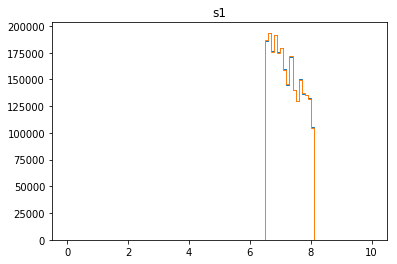

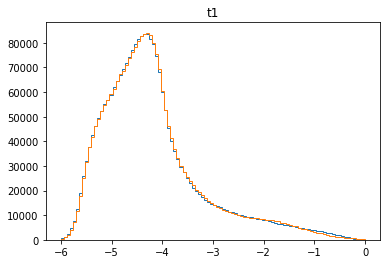

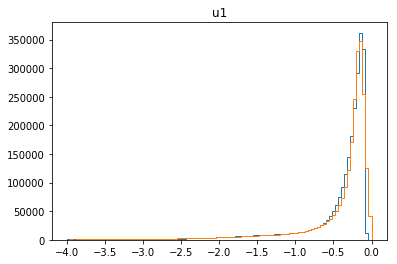

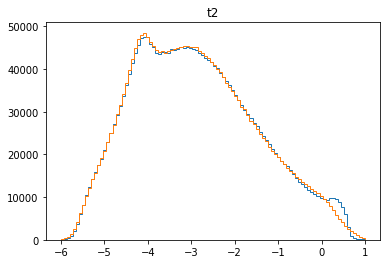

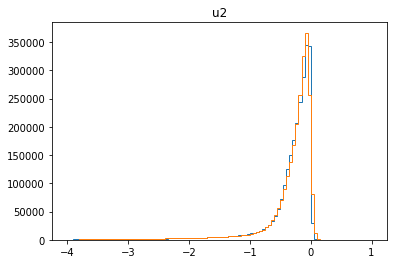

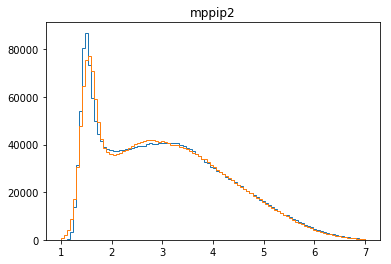

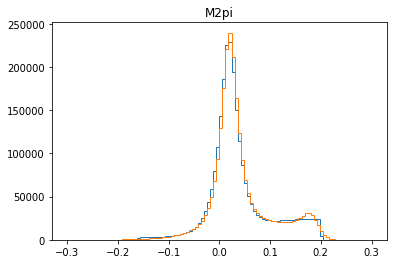

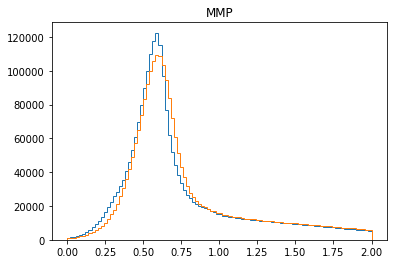

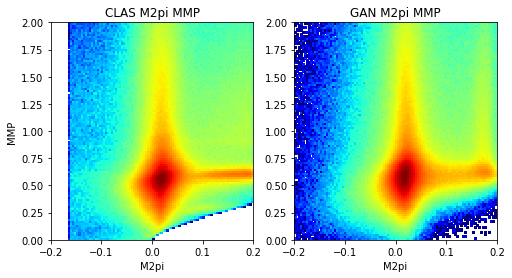

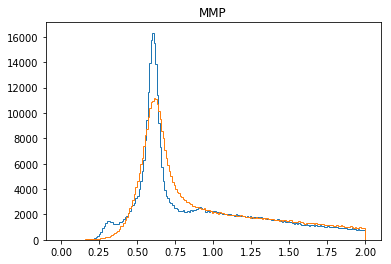

701 [[-0.45389372, -0.45397502, 8.128893e-05], [-0.45445168, -0.45524222, 0.00079052226], [-0.42168856, -0.42182162, 0.0001330711], [-0.35215932, -0.35858986, 0.006430541], [-0.300929, -0.30096087, 3.1852982e-05], [-0.23263669, -0.23357454, 0.0009378532], [-0.17547825, -0.17595005, 0.0004717969], [-0.13492575, -0.13620473, 0.0012789768], [-0.11181959, -0.114223935, 0.002404345], [-0.1440884, -0.14409241, 4.0108716e-06], [-0.19337197, -0.1949547, 0.0015827252], [-0.26446068, -0.2647897, 0.00032901915], [-0.3197865, -0.32094577, 0.0011592719], [-0.3609604, -0.36443532, 0.003474928], [-0.39347705, -0.39641276, 0.002935695], [-0.42300686, -0.4233484, 0.00034152155], [-0.42858532, -0.42876527, 0.00017994567], [-0.39886215, -0.40219158, 0.0033294181], [-0.3458787, -0.34588063, 1.9280706e-06], [-0.28296852, -0.28304917, 8.063677e-05]]
702 [[-0.22140469, -0.22142553, 2.0850117e-05], [-0.17286332, -0.17550991, 0.0026465887], [-0.1573164, -0.15762553, 0.0003091246], [-0.17344481, -0.17357613, 0.

711 [[-0.38135198, -0.3850066, 0.0036546155], [-0.41546994, -0.4162548, 0.0007848479], [-0.43672502, -0.4371427, 0.00041768077], [-0.43362, -0.43436435, 0.00074434653], [-0.40728295, -0.4073462, 6.323011e-05], [-0.36553884, -0.36589655, 0.00035771172], [-0.30705416, -0.30870888, 0.0016547019], [-0.24922195, -0.25143713, 0.0022151833], [-0.21197008, -0.21432345, 0.0023533662], [-0.19228692, -0.19704427, 0.00475735], [-0.21052378, -0.2119447, 0.0014209078], [-0.256949, -0.2573213, 0.00037228694], [-0.31287986, -0.31371817, 0.0008383082], [-0.3658946, -0.3658947, 1.3133103e-07], [-0.40545633, -0.4084864, 0.0030300713], [-0.41825375, -0.41862965, 0.00037590225], [-0.39663997, -0.40154395, 0.004903963], [-0.37310848, -0.37520257, 0.002094079], [-0.33767617, -0.33780545, 0.00012927019], [-0.28842357, -0.28869975, 0.00027618214]]
712 [[-0.23770492, -0.24056321, 0.002858291], [-0.2035277, -0.20781724, 0.004289535], [-0.19772942, -0.20252685, 0.004797426], [-0.23727423, -0.23740363, 0.000129400

721 [[-0.23670742, -0.23670752, 1.07625965e-07], [-0.17392853, -0.17401868, 9.0150876e-05], [-0.1343286, -0.13455646, 0.00022785166], [-0.122064374, -0.124407575, 0.002343199], [-0.16722088, -0.16778658, 0.00056570896], [-0.22696958, -0.22740906, 0.00043947538], [-0.2924033, -0.29334456, 0.0009412441], [-0.34519395, -0.34543774, 0.00024378311], [-0.39087382, -0.39102364, 0.0001498043], [-0.42746574, -0.42859173, 0.0011260043], [-0.45712495, -0.45751497, 0.0003900106], [-0.4599858, -0.459986, 2.2194946e-07], [-0.4304344, -0.43062395, 0.00018953696], [-0.37409166, -0.38085994, 0.0067682983], [-0.31701982, -0.31720018, 0.00018035527], [-0.24070685, -0.24718335, 0.006476509], [-0.18236154, -0.1845216, 0.0021600525], [-0.13777278, -0.13863054, 0.0008577482], [-0.13793616, -0.14306353, 0.005127373], [-0.18808573, -0.18924138, 0.0011556379]]
722 [[-0.25696048, -0.25744236, 0.00048187602], [-0.31429645, -0.31576127, 0.0014648116], [-0.37131733, -0.37258595, 0.0012686297], [-0.41017362, -0.4174

731 [[-0.36339125, -0.36363825, 0.00024701003], [-0.2906773, -0.2923082, 0.0016308911], [-0.22305328, -0.22368322, 0.00062994973], [-0.16340095, -0.166133, 0.0027320462], [-0.13613535, -0.13674743, 0.0006120785], [-0.1463635, -0.15051843, 0.004154943], [-0.19147323, -0.19148086, 7.6277647e-06], [-0.24495952, -0.24496077, 1.2535347e-06], [-0.29637837, -0.3044017, 0.008023307], [-0.3539606, -0.35443914, 0.0004785323], [-0.39978173, -0.4005516, 0.0007698517], [-0.4332921, -0.43331784, 2.5760244e-05], [-0.44621864, -0.4503667, 0.004148061], [-0.4494197, -0.4506991, 0.0012793863], [-0.4089885, -0.4091398, 0.00015130205], [-0.3380122, -0.34326765, 0.0052554533], [-0.27372685, -0.2765118, 0.0027849388], [-0.21101901, -0.2147185, 0.0036994908], [-0.17184196, -0.17186904, 2.707378e-05], [-0.16105628, -0.16121562, 0.00015933593]]
732 [[-0.18371673, -0.18397649, 0.00025976077], [-0.23121853, -0.2312889, 7.036725e-05], [-0.28057092, -0.2806753, 0.00010436175], [-0.32345587, -0.32981685, 0.00636098

741 [[-0.34775773, -0.34810734, 0.0003496054], [-0.28373823, -0.2898483, 0.0061100745], [-0.23211862, -0.23333801, 0.0012193881], [-0.1758619, -0.176997, 0.0011351109], [-0.14201824, -0.14204408, 2.5837744e-05], [-0.14749679, -0.14769349, 0.00019669319], [-0.19646022, -0.19646955, 9.324871e-06], [-0.2639495, -0.26564103, 0.0016915255], [-0.32581535, -0.32600874, 0.00019339014], [-0.37579584, -0.37614924, 0.00035339594], [-0.4224505, -0.42263266, 0.00018215278], [-0.46414396, -0.4642042, 6.0233142e-05], [-0.47803286, -0.47805673, 2.3860486e-05], [-0.46332824, -0.4636089, 0.0002806376], [-0.41080388, -0.4110279, 0.00022401004], [-0.3449628, -0.34513053, 0.00016772574], [-0.26965818, -0.2706758, 0.0010176358], [-0.1959684, -0.19796842, 0.0020000215], [-0.14247325, -0.14361945, 0.0011461907], [-0.1213902, -0.1231812, 0.0017910039]]
742 [[-0.15210404, -0.15212178, 1.7752176e-05], [-0.21746811, -0.21747783, 9.713243e-06], [-0.28479338, -0.28650662, 0.001713246], [-0.33836794, -0.34166244, 0.

751 [[-0.21192063, -0.21211915, 0.00019851637], [-0.16583608, -0.16684085, 0.0010047776], [-0.16113298, -0.16560301, 0.0044700312], [-0.20552199, -0.20732658, 0.0018045902], [-0.26160243, -0.26323363, 0.0016311991], [-0.3194476, -0.31951457, 6.695372e-05], [-0.36034024, -0.3631802, 0.0028399648], [-0.38524246, -0.38770646, 0.0024640053], [-0.3829648, -0.38435155, 0.0013867486], [-0.3658062, -0.36657456, 0.00076837064], [-0.33011696, -0.33080956, 0.0006926159], [-0.2786937, -0.27879924, 0.00010553413], [-0.23556168, -0.23595071, 0.0003890319], [-0.1921729, -0.19487037, 0.0026974627], [-0.18657134, -0.1865732, 1.8650317e-06], [-0.21352491, -0.21415918, 0.0006342657], [-0.2602641, -0.26037613, 0.00011201847], [-0.30826855, -0.30940866, 0.0011401288], [-0.35101727, -0.3510224, 5.1344396e-06], [-0.37653512, -0.37660587, 7.075177e-05]]
752 [[-0.37551954, -0.37555602, 3.6488524e-05], [-0.32766607, -0.3337547, 0.0060886242], [-0.2955449, -0.2964562, 0.0009112916], [-0.26886073, -0.26901704, 0.

761 [[-0.28412274, -0.28691533, 0.0027925943], [-0.23392704, -0.23393333, 6.290884e-06], [-0.19667391, -0.19716032, 0.0004864086], [-0.19238119, -0.19334207, 0.0009608903], [-0.20394593, -0.20408551, 0.00013957337], [-0.2579529, -0.25894815, 0.0009952476], [-0.32197383, -0.32472306, 0.002749221], [-0.37654707, -0.37693572, 0.0003886558], [-0.4099534, -0.41466716, 0.0047137733], [-0.4319469, -0.43200594, 5.902542e-05], [-0.42505038, -0.42505047, 8.740244e-08], [-0.3895819, -0.395094, 0.005512104], [-0.36613864, -0.36633033, 0.00019169631], [-0.3244213, -0.32757565, 0.0031543712], [-0.28472534, -0.2848091, 8.37841e-05], [-0.24588314, -0.25007504, 0.004191908], [-0.24240655, -0.24251889, 0.0001123417], [-0.24416156, -0.24495047, 0.00078891404], [-0.27041298, -0.27042353, 1.0538511e-05], [-0.30522934, -0.30798876, 0.0027594313]]
762 [[-0.331347, -0.33357117, 0.0022241697], [-0.35626552, -0.3562679, 2.392775e-06], [-0.3557235, -0.3559306, 0.00020709932], [-0.33316466, -0.33317012, 5.4681586

771 [[-0.22112566, -0.22159547, 0.00046981036], [-0.18258849, -0.18365389, 0.0010653995], [-0.16721794, -0.17001517, 0.0027972327], [-0.2031642, -0.20476794, 0.0016037375], [-0.26240787, -0.26258487, 0.00017698994], [-0.32465157, -0.32807475, 0.0034231767], [-0.37721625, -0.38028085, 0.0030646063], [-0.41771668, -0.418111, 0.0003943166], [-0.44189584, -0.4440442, 0.0021483672], [-0.45357874, -0.45361742, 3.8686714e-05], [-0.44191074, -0.44241765, 0.0005068956], [-0.39849183, -0.39917773, 0.0006859059], [-0.32736614, -0.33283585, 0.0054697036], [-0.26601776, -0.26872116, 0.0027034099], [-0.21350655, -0.21434651, 0.00083996577], [-0.17689437, -0.1769154, 2.1042164e-05], [-0.17237994, -0.17260401, 0.00022406713], [-0.2081833, -0.2084612, 0.00027789644], [-0.26595265, -0.26619744, 0.0002447967], [-0.31872723, -0.32050052, 0.0017732894]]
772 [[-0.36159343, -0.36642978, 0.0048363456], [-0.40475228, -0.40512908, 0.0003767903], [-0.43840393, -0.43923518, 0.00083125435], [-0.43234223, -0.435012

781 [[-0.2868775, -0.2876247, 0.0007471592], [-0.35131523, -0.35144663, 0.00013140419], [-0.38716075, -0.3979716, 0.010810862], [-0.43817285, -0.43893814, 0.0007653071], [-0.46478978, -0.46487638, 8.660078e-05], [-0.45601264, -0.45638558, 0.00037294967], [-0.4135601, -0.4138169, 0.00025681802], [-0.35558406, -0.357212, 0.0016279652], [-0.28077242, -0.28388387, 0.0031114544], [-0.20913061, -0.2099858, 0.0008551806], [-0.15088472, -0.15091136, 2.663887e-05], [-0.10958979, -0.1096618, 7.20087e-05], [-0.10697157, -0.111104414, 0.004132842], [-0.14884162, -0.14917113, 0.00032950376], [-0.20273526, -0.20852144, 0.005786185], [-0.26456994, -0.27319846, 0.008628512], [-0.32941973, -0.3306767, 0.0012569715], [-0.3784644, -0.37966204, 0.0011976399], [-0.41988638, -0.420119, 0.00023259784], [-0.4395902, -0.43977913, 0.00018895972]]
782 [[-0.44425, -0.444389, 0.00013898812], [-0.4305103, -0.43082422, 0.0003139049], [-0.36707062, -0.37104607, 0.003975457], [-0.2940584, -0.29525658, 0.0011981678], [

791 [[-0.20544624, -0.2066818, 0.0012355596], [-0.18041676, -0.1804259, 9.139422e-06], [-0.17659636, -0.18059252, 0.0039961687], [-0.20624198, -0.20823178, 0.001989799], [-0.26448503, -0.26462325, 0.00013822464], [-0.31870645, -0.32212272, 0.0034162614], [-0.37273192, -0.37969524, 0.0069633177], [-0.42267743, -0.42271388, 3.6442452e-05], [-0.4397778, -0.44359562, 0.003817826], [-0.4502203, -0.45068836, 0.0004680756], [-0.42527726, -0.42538583, 0.00010857318], [-0.36400092, -0.36433333, 0.00033241848], [-0.29083315, -0.2909196, 8.6458844e-05], [-0.2023768, -0.20955147, 0.007174673], [-0.15238258, -0.15659204, 0.004209463], [-0.14273201, -0.14273788, 5.867696e-06], [-0.15762608, -0.15768693, 6.085647e-05], [-0.20162524, -0.20175426, 0.00012901008], [-0.2624476, -0.26419845, 0.0017508713], [-0.3261347, -0.32876936, 0.0026346312]]
792 [[-0.38186875, -0.38457057, 0.0027018236], [-0.42722327, -0.4293628, 0.002139535], [-0.45068988, -0.45073527, 4.538387e-05], [-0.45625213, -0.45738852, 0.001

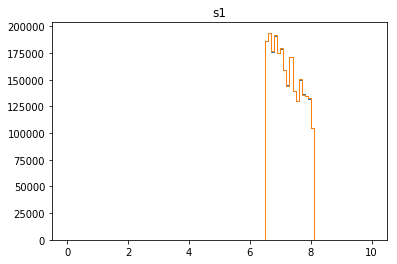

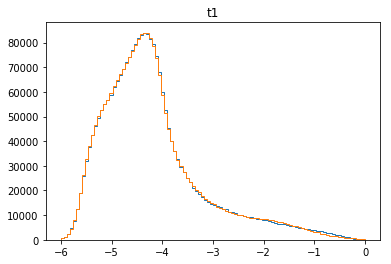

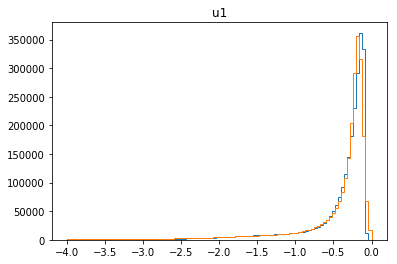

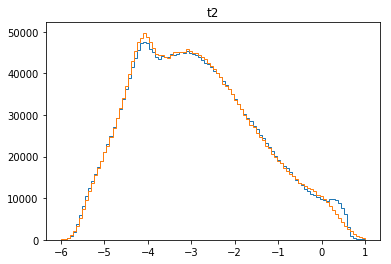

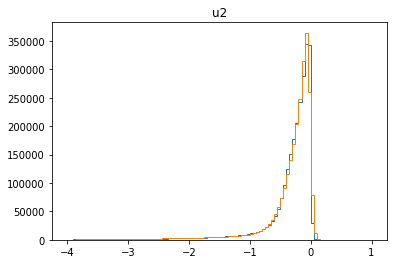

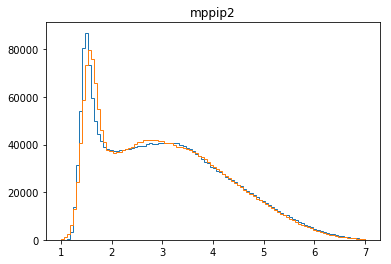

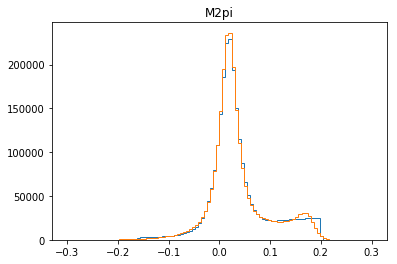

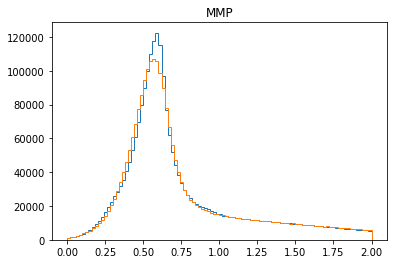

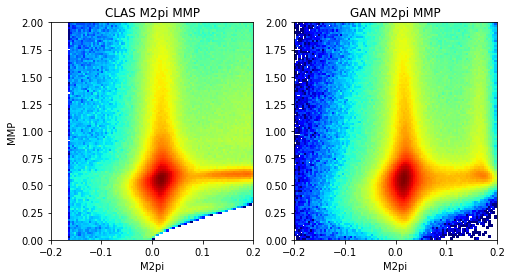

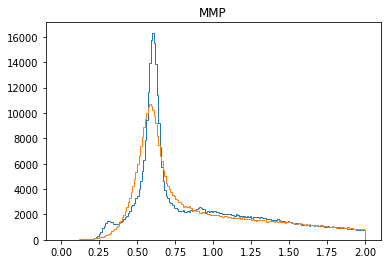

801 [[-0.46371529, -0.4642753, 0.00056000735], [-0.41194233, -0.41194254, 2.2015593e-07], [-0.33121228, -0.33342674, 0.0022144653], [-0.2530262, -0.25303483, 8.63904e-06], [-0.16051453, -0.17316332, 0.012648784], [-0.12562539, -0.12882404, 0.0031986604], [-0.11756857, -0.11757499, 6.4255482e-06], [-0.13208039, -0.1330807, 0.0010003087], [-0.17650214, -0.18355103, 0.0070488905], [-0.24796994, -0.24833614, 0.0003662029], [-0.29687613, -0.30537894, 0.008502826], [-0.36382124, -0.36614287, 0.0023216442], [-0.4021892, -0.40593478, 0.0037455736], [-0.43966433, -0.44372395, 0.0040595983], [-0.47525176, -0.47527108, 1.9311905e-05], [-0.46355942, -0.46360654, 4.7122016e-05], [-0.42384854, -0.42438665, 0.00053810887], [-0.3436323, -0.35327402, 0.009641711], [-0.273131, -0.273131, 2.6520866e-09], [-0.19568887, -0.1958108, 0.00012191782]]
802 [[-0.13657671, -0.1369234, 0.00034668716], [-0.11016847, -0.11098407, 0.0008156012], [-0.12651409, -0.12700185, 0.0004877556], [-0.17975387, -0.18036406, 0.0

811 [[-0.26419505, -0.27280763, 0.008612574], [-0.19894166, -0.20002194, 0.0010802682], [-0.1493743, -0.15044157, 0.0010672678], [-0.13056861, -0.13319992, 0.0026313039], [-0.15253238, -0.15587966, 0.003347271], [-0.22352768, -0.2235601, 3.2415206e-05], [-0.29130438, -0.29174834, 0.00044396517], [-0.3596916, -0.36024845, 0.0005568523], [-0.41144916, -0.41583163, 0.0043824734], [-0.45314845, -0.45331347, 0.00016501952], [-0.47017014, -0.4706306, 0.00046043165], [-0.4550838, -0.4552102, 0.00012642347], [-0.40066403, -0.40069896, 3.4938428e-05], [-0.32166764, -0.32166764, 0.0], [-0.22808056, -0.23398252, 0.0059019574], [-0.16464405, -0.16719015, 0.0025461016], [-0.124220856, -0.12594485, 0.0017239996], [-0.12187281, -0.12267151, 0.0007986946], [-0.14601602, -0.14688745, 0.0008714325], [-0.21846834, -0.21872717, 0.00025883937]]
812 [[-0.29106176, -0.29166442, 0.0006026772], [-0.34481525, -0.34993827, 0.0051230043], [-0.39949813, -0.4060643, 0.0065661524], [-0.44770363, -0.4478518, 0.000148

821 [[-0.36676627, -0.36676657, 2.8521754e-07], [-0.36659086, -0.36688712, 0.00029625], [-0.34101543, -0.34105042, 3.498354e-05], [-0.2829511, -0.2829865, 3.5390844e-05], [-0.22251269, -0.22322513, 0.0007124327], [-0.18290964, -0.18291667, 7.0289384e-06], [-0.17335919, -0.1735597, 0.00020051003], [-0.20862557, -0.20985135, 0.0012257905], [-0.26201946, -0.26203385, 1.43922825e-05], [-0.3259384, -0.32646167, 0.00052325794], [-0.3730417, -0.37305713, 1.5423142e-05], [-0.39116284, -0.39711443, 0.0059515876], [-0.38845143, -0.3884716, 2.017632e-05], [-0.3418283, -0.34188807, 5.9789872e-05], [-0.2837645, -0.28568566, 0.0019211452], [-0.22377862, -0.22428569, 0.0005070674], [-0.18945312, -0.19058323, 0.0011301041], [-0.1908833, -0.19089262, 9.324871e-06], [-0.2308523, -0.23103611, 0.00018380403], [-0.28107405, -0.28107837, 4.3302175e-06]]
822 [[-0.33166236, -0.33587578, 0.004213423], [-0.38233268, -0.38547978, 0.003147091], [-0.4213012, -0.42134514, 4.3956155e-05], [-0.42601252, -0.4265105, 0

831 [[-0.4691132, -0.4693726, 0.000259392], [-0.4729783, -0.47299686, 1.858134e-05], [-0.44291648, -0.44316325, 0.00024677027], [-0.3933239, -0.39336842, 4.4514323e-05], [-0.31284466, -0.31720242, 0.004357761], [-0.23249, -0.24318773, 0.010697722], [-0.18197183, -0.18425012, 0.0022782867], [-0.15580401, -0.15591179, 0.00010777966], [-0.15723805, -0.15794176, 0.00070370326], [-0.19209902, -0.19209962, 5.9377635e-07], [-0.25852516, -0.26269388, 0.004168724], [-0.32134843, -0.32317334, 0.0018249032], [-0.37895867, -0.37912744, 0.0001687648], [-0.42370522, -0.42410052, 0.000395302], [-0.45156035, -0.45351914, 0.001958781], [-0.46888006, -0.47172245, 0.0028424046], [-0.4511883, -0.45119256, 4.274829e-06], [-0.38441297, -0.38492203, 0.0005090451], [-0.30251557, -0.3070137, 0.0044981297], [-0.23212236, -0.23596427, 0.0038419063]]
832 [[-0.17590952, -0.17688155, 0.0009720378], [-0.14543068, -0.14671895, 0.0012882706], [-0.15244707, -0.15551041, 0.0030633393], [-0.21013871, -0.21062016, 0.00048

841 [[-0.3624556, -0.36409065, 0.0016350533], [-0.41668066, -0.41693863, 0.00025798086], [-0.4561577, -0.45664886, 0.0004911314], [-0.47459176, -0.47713095, 0.0025391767], [-0.4625347, -0.46304867, 0.00051396276], [-0.40209484, -0.4025625, 0.00046766305], [-0.33035108, -0.33403853, 0.0036874358], [-0.25586155, -0.25930864, 0.0034470996], [-0.19674674, -0.20079565, 0.0040489114], [-0.16040957, -0.1624195, 0.002009929], [-0.15756163, -0.15765588, 9.4253126e-05], [-0.19353609, -0.19776042, 0.004224326], [-0.25856438, -0.2603491, 0.0017847131], [-0.32697445, -0.33020145, 0.0032269857], [-0.3809009, -0.38128117, 0.0003802786], [-0.42119497, -0.4226535, 0.0014585403], [-0.4424432, -0.44252548, 8.22894e-05], [-0.4315086, -0.4319751, 0.00046650888], [-0.38737148, -0.38752532, 0.0001538465], [-0.32728988, -0.32767695, 0.00038707812]]
842 [[-0.26128027, -0.26222563, 0.00094534474], [-0.19607237, -0.19686718, 0.0007948182], [-0.14698555, -0.14926894, 0.0022833871], [-0.15100504, -0.15101942, 1.43

851 [[-0.08424413, -0.0844266, 0.00018246182], [-0.13191378, -0.13222924, 0.0003154613], [-0.2025866, -0.20261735, 3.0743286e-05], [-0.27377158, -0.27459493, 0.0008233544], [-0.33935487, -0.33969596, 0.0003410987], [-0.38863242, -0.40137833, 0.012745928], [-0.45205665, -0.4520569, 2.7712667e-07], [-0.4865629, -0.4906427, 0.0040797973], [-0.49681792, -0.49733666, 0.00051873026], [-0.45597124, -0.4598863, 0.0039150766], [-0.4001625, -0.40193418, 0.0017716833], [-0.3257716, -0.32915783, 0.0033862272], [-0.25224727, -0.25384536, 0.0015980902], [-0.18621778, -0.18673487, 0.00051708077], [-0.13670844, -0.13702983, 0.00032138338], [-0.12052926, -0.12067282, 0.00014356748], [-0.14648344, -0.1466422, 0.00015875862], [-0.21556643, -0.21584547, 0.0002790423], [-0.27410924, -0.2767749, 0.0026656587], [-0.33563775, -0.33583644, 0.00019867766]]
852 [[-0.3858576, -0.38807747, 0.0022198537], [-0.42716885, -0.42751732, 0.00034846517], [-0.44665435, -0.44748273, 0.0008283973], [-0.4406194, -0.4409988, 0

861 [[-0.37874845, -0.37875202, 3.5727899e-06], [-0.42819786, -0.42820197, 4.1030726e-06], [-0.43688652, -0.44024593, 0.0033594207], [-0.40581816, -0.40581927, 1.1165539e-06], [-0.32802084, -0.3311517, 0.0031308478], [-0.25568256, -0.25847596, 0.0027934005], [-0.19359262, -0.19507971, 0.0014870876], [-0.15701379, -0.15741418, 0.00040039985], [-0.14740252, -0.14740707, 4.547197e-06], [-0.18941359, -0.1894137, 1.00248144e-07], [-0.24882464, -0.24965304, 0.0008283973], [-0.30948484, -0.3095954, 0.000110569716], [-0.37543863, -0.37692806, 0.0014894418], [-0.43349057, -0.4382185, 0.004727927], [-0.4837559, -0.48416704, 0.00041115764], [-0.49405146, -0.49792796, 0.0038765043], [-0.4495041, -0.4533666, 0.0038625044], [-0.37342954, -0.375889, 0.0024594627], [-0.28935897, -0.29039592, 0.0010369538], [-0.19730231, -0.19849902, 0.001196716]]
862 [[-0.13249403, -0.13258663, 9.259393e-05], [-0.10017628, -0.10018439, 8.109233e-06], [-0.10848941, -0.10916209, 0.0006726826], [-0.16982527, -0.17027666,

871 [[-0.45053327, -0.4516919, 0.0011586224], [-0.48251054, -0.48279124, 0.00028070156], [-0.47403035, -0.47406322, 3.287291e-05], [-0.43202537, -0.4343055, 0.0022801075], [-0.37405562, -0.3748514, 0.00079578656], [-0.3002147, -0.30082226, 0.0006075567], [-0.20933779, -0.21659021, 0.0072524305], [-0.14218746, -0.14599092, 0.0038034618], [-0.10179217, -0.10187277, 8.0602505e-05], [-0.089108996, -0.0891684, 5.940704e-05], [-0.1151049, -0.11547638, 0.0003714777], [-0.18478405, -0.18487845, 9.440132e-05], [-0.26461145, -0.26471993, 0.0001084937], [-0.33165917, -0.33284062, 0.0011814571], [-0.3842075, -0.3857872, 0.0015796913], [-0.4261483, -0.42692155, 0.0007732423], [-0.45176232, -0.45266798, 0.00090565777], [-0.44705728, -0.44705877, 1.4854633e-06], [-0.39590624, -0.39666104, 0.00075479044], [-0.31782293, -0.3179321, 0.000109170236]]
872 [[-0.23354073, -0.23682125, 0.0032805144], [-0.16799095, -0.16918582, 0.0011948694], [-0.11571243, -0.1162835, 0.0005710748], [-0.104109086, -0.10495437

881 [[-0.084321335, -0.08436112, 3.9785846e-05], [-0.10261718, -0.102618255, 1.0726544e-06], [-0.16332759, -0.16332784, 2.5547706e-07], [-0.23842476, -0.23934737, 0.00092261186], [-0.31004143, -0.31198403, 0.0019426066], [-0.37169006, -0.37317994, 0.0014898839], [-0.42183873, -0.42342374, 0.0015850024], [-0.45637688, -0.4564756, 9.8711746e-05], [-0.4657021, -0.46705452, 0.0013524442], [-0.45479232, -0.45492685, 0.00013452722], [-0.4078964, -0.40815926, 0.00026284394], [-0.33695307, -0.33711588, 0.00016282174], [-0.26061818, -0.26102194, 0.00040376553], [-0.19182457, -0.19291855, 0.0010939775], [-0.15211405, -0.15453038, 0.002416331], [-0.15362032, -0.15362176, 1.4393336e-06], [-0.18554781, -0.18614937, 0.00060155394], [-0.24437004, -0.24458602, 0.00021597596], [-0.3068698, -0.30979952, 0.002929704], [-0.3656516, -0.36683714, 0.0011855252]]
882 [[-0.41486105, -0.41486123, 1.7768254e-07], [-0.43517923, -0.43585587, 0.0006766461], [-0.42996892, -0.42996916, 2.2375025e-07], [-0.3976831, -0

891 [[-0.3939502, -0.39737314, 0.0034229532], [-0.43928882, -0.44128305, 0.001994226], [-0.4607858, -0.46099854, 0.00021273666], [-0.4431295, -0.44400895, 0.00087944616], [-0.39027795, -0.39062485, 0.00034690025], [-0.3155005, -0.31668916, 0.0011886795], [-0.23300096, -0.23405506, 0.0010540988], [-0.1725388, -0.17275895, 0.00022014447], [-0.12523413, -0.12557495, 0.00034081689], [-0.12352553, -0.12379541, 0.00026987898], [-0.16834062, -0.16852397, 0.00018333884], [-0.23671953, -0.23792842, 0.0012088876], [-0.3127586, -0.31371605, 0.00095746404], [-0.375269, -0.38010108, 0.004832102], [-0.4293411, -0.43112728, 0.0017861637], [-0.44843897, -0.45225233, 0.0038133487], [-0.44061536, -0.44377938, 0.00316402], [-0.3921113, -0.39662915, 0.004517851], [-0.3302, -0.33065593, 0.00045594072], [-0.2608121, -0.26176086, 0.0009487493]]
892 [[-0.21061908, -0.21101864, 0.0003995607], [-0.17056128, -0.17079006, 0.00022877395], [-0.165307, -0.16538438, 7.73818e-05], [-0.19969337, -0.20063485, 0.00094147

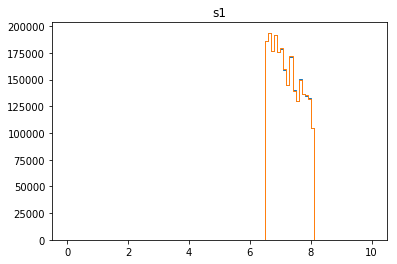

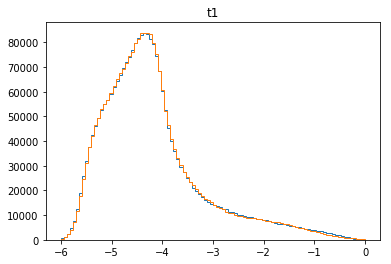

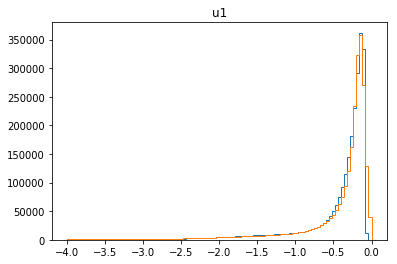

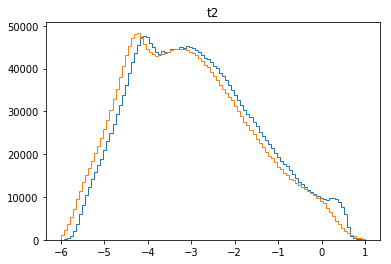

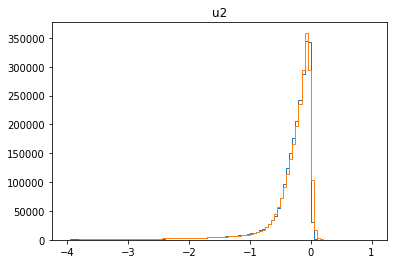

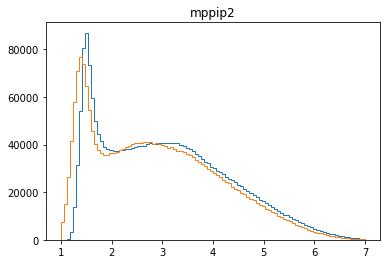

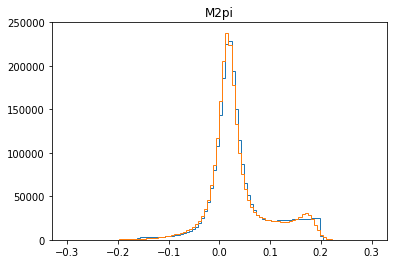

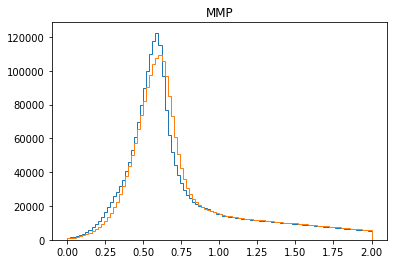

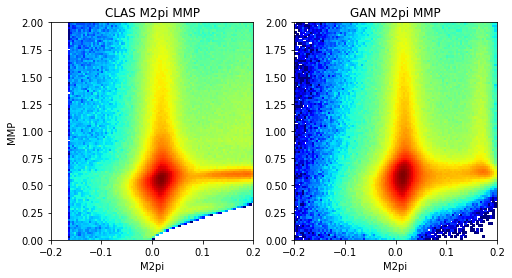

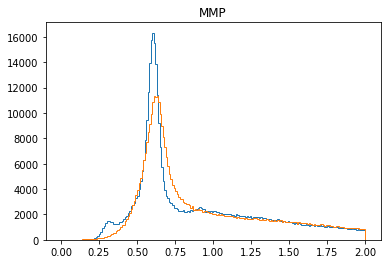

901 [[-0.28694564, -0.28750926, 0.0005636241], [-0.32741126, -0.3294692, 0.0020579272], [-0.3625525, -0.36768916, 0.0051366645], [-0.4009272, -0.4033019, 0.002374696], [-0.4085962, -0.409743, 0.0011468367], [-0.38622278, -0.3874672, 0.0012444253], [-0.3287028, -0.3294819, 0.00077908736], [-0.2792528, -0.27929524, 4.2426927e-05], [-0.23814489, -0.23822652, 8.163322e-05], [-0.21937694, -0.2198293, 0.0004523638], [-0.22036318, -0.22052933, 0.00016614854], [-0.249794, -0.24998996, 0.00019594487], [-0.29533133, -0.2958384, 0.0005070674], [-0.31055388, -0.31060666, 5.2781554e-05], [-0.30879447, -0.30887416, 7.968047e-05], [-0.2839562, -0.28533968, 0.0013834833], [-0.24252827, -0.24255788, 2.9611727e-05], [-0.19587538, -0.19614531, 0.00026994164], [-0.16571675, -0.16573134, 1.4595603e-05], [-0.17163754, -0.17382962, 0.0021920828]]
902 [[-0.20738773, -0.20934887, 0.0019611453], [-0.26690975, -0.27043387, 0.0035241223], [-0.32463643, -0.33025038, 0.005613962], [-0.3846765, -0.3848077, 0.0001312

911 [[-0.2769448, -0.27830663, 0.0013618595], [-0.19866544, -0.19896373, 0.0002982889], [-0.13245486, -0.13493252, 0.0024776582], [-0.10663806, -0.10715905, 0.00052099174], [-0.12089028, -0.12128574, 0.00039545365], [-0.17333858, -0.17342122, 8.2635794e-05], [-0.23289855, -0.23780172, 0.004903162], [-0.30632707, -0.30725142, 0.00092435075], [-0.36729565, -0.3674493, 0.0001536573], [-0.41014108, -0.41025236, 0.0001112929], [-0.44071, -0.4407373, 2.7292559e-05], [-0.439175, -0.4407215, 0.001546512], [-0.4252077, -0.42557397, 0.00036627587], [-0.36880225, -0.37252823, 0.0037259883], [-0.30355206, -0.30480444, 0.0012523775], [-0.23395455, -0.2339589, 4.346108e-06], [-0.16794595, -0.16988285, 0.0019368943], [-0.13674648, -0.13695079, 0.00020430902], [-0.1322262, -0.13227971, 5.3504576e-05], [-0.16019392, -0.1602183, 2.438509e-05]]
912 [[-0.20889163, -0.20951147, 0.0006198418], [-0.26573646, -0.26638794, 0.0006514818], [-0.31038108, -0.3135791, 0.0031980134], [-0.348349, -0.34959814, 0.00124

921 [[-0.46012437, -0.4601329, 8.527281e-06], [-0.43905556, -0.4392451, 0.00018953696], [-0.4027647, -0.40345132, 0.0006866053], [-0.33758682, -0.3380969, 0.0005100784], [-0.25800648, -0.26083264, 0.002826158], [-0.1895321, -0.19529712, 0.005765021], [-0.14231735, -0.15126087, 0.008943515], [-0.14074276, -0.14074343, 6.757946e-07], [-0.158278, -0.15830716, 2.9156805e-05], [-0.21594718, -0.21595223, 5.05694e-06], [-0.2770098, -0.27760026, 0.0005904716], [-0.33250442, -0.3372067, 0.004702256], [-0.37742764, -0.38125113, 0.0038234845], [-0.40403593, -0.40439507, 0.00035915617], [-0.41373143, -0.41460928, 0.0008778629], [-0.39554188, -0.39569378, 0.0001519127], [-0.34971508, -0.35058597, 0.0008708695], [-0.2890253, -0.29460987, 0.005584561], [-0.2552047, -0.25535807, 0.00015337372], [-0.22754458, -0.22950065, 0.0019560806]]
922 [[-0.22392629, -0.2246076, 0.0006813178], [-0.23330319, -0.2365079, 0.0032047043], [-0.26799732, -0.26914507, 0.0011477409], [-0.31609884, -0.3165665, 0.00046766305

931 [[-0.32467875, -0.32543847, 0.00075972424], [-0.37995487, -0.38188607, 0.0019311905], [-0.43127283, -0.43187973, 0.0006068988], [-0.45651454, -0.45890749, 0.002392948], [-0.45547724, -0.4555454, 6.8145106e-05], [-0.4116862, -0.4131269, 0.0014406759], [-0.3424231, -0.34248367, 6.0559254e-05], [-0.25641042, -0.25729123, 0.0008808041], [-0.17870441, -0.18120186, 0.0024974449], [-0.119105466, -0.11919453, 8.9067566e-05], [-0.0801675, -0.08688099, 0.0067134895], [-0.106050305, -0.10647377, 0.0004234699], [-0.1697898, -0.17295276, 0.0031629468], [-0.23967002, -0.2402743, 0.0006042703], [-0.29806367, -0.29915687, 0.0010932207], [-0.36209816, -0.36210027, 2.1012966e-06], [-0.4093316, -0.41292375, 0.0035921582], [-0.4441807, -0.4446798, 0.0004991102], [-0.45093495, -0.45159188, 0.00065694563], [-0.42029005, -0.42099822, 0.0007081628]]
932 [[-0.36056876, -0.36401698, 0.0034482193], [-0.30702853, -0.30733138, 0.00030285216], [-0.24633399, -0.25107688, 0.00474289], [-0.20275095, -0.20350114, 0

941 [[-0.1600198, -0.16133629, 0.0013164916], [-0.23471522, -0.23579374, 0.0010785136], [-0.30821654, -0.30890384, 0.00068730523], [-0.37106615, -0.37243986, 0.0013737106], [-0.42464626, -0.4248369, 0.00019064144], [-0.45943227, -0.4607391, 0.0013068209], [-0.47229195, -0.47699943, 0.0047074896], [-0.47392255, -0.47459236, 0.0006698165], [-0.43189153, -0.43511915, 0.0032276358], [-0.37491146, -0.37495723, 4.5770168e-05], [-0.2964037, -0.2968209, 0.00041721313], [-0.22112827, -0.22358243, 0.0024541689], [-0.17357829, -0.17379037, 0.00021206951], [-0.14254753, -0.14257106, 2.3526256e-05], [-0.14500755, -0.14505984, 5.2283875e-05], [-0.18800502, -0.18945178, 0.0014467636], [-0.24777351, -0.24782974, 5.6216817e-05], [-0.3136037, -0.31364763, 4.3930868e-05], [-0.365302, -0.37103695, 0.005734937], [-0.4132394, -0.4133478, 0.000108414235]]
942 [[-0.42473122, -0.42641446, 0.0016832205], [-0.40753463, -0.40840414, 0.00086951925], [-0.3510624, -0.35216016, 0.0010977661], [-0.29344517, -0.2952774

951 [[-0.4062104, -0.4063479, 0.00013750797], [-0.43112195, -0.43126237, 0.00014043097], [-0.42609793, -0.4263032, 0.00020529167], [-0.39565274, -0.3958815, 0.00022877395], [-0.33152565, -0.3315268, 1.1286793e-06], [-0.26300114, -0.2630077, 6.561637e-06], [-0.19671689, -0.19762036, 0.00090347783], [-0.15085654, -0.1526023, 0.0017457673], [-0.13438131, -0.13857816, 0.0041968497], [-0.1786994, -0.17882548, 0.00012608059], [-0.24267572, -0.2452836, 0.0026078746], [-0.32412934, -0.3251397, 0.0010103477], [-0.37386262, -0.3742618, 0.00039917947], [-0.4022023, -0.4027535, 0.0005511955], [-0.41353554, -0.4176324, 0.0040968712], [-0.40461698, -0.40515226, 0.00053528085], [-0.36677763, -0.3678759, 0.0010982716], [-0.314804, -0.3155162, 0.0007122292], [-0.26055455, -0.26078397, 0.00022940904], [-0.20817769, -0.2088604, 0.00068271253]]
952 [[-0.17367105, -0.18285571, 0.00918466], [-0.18236397, -0.18237561, 1.1643427e-05], [-0.19054751, -0.19056161, 1.4089979e-05], [-0.24561055, -0.24841121, 0.002

961 [[-0.29073438, -0.29238242, 0.001648036], [-0.36224857, -0.3636044, 0.001355813], [-0.414898, -0.41856417, 0.0036661548], [-0.46132302, -0.462249, 0.0009259751], [-0.47831956, -0.47939983, 0.0010802682], [-0.46589267, -0.4668057, 0.00091301964], [-0.4049142, -0.40516242, 0.00024821056], [-0.3157548, -0.31788412, 0.0021293138], [-0.22947663, -0.23061149, 0.0011348538], [-0.15031916, -0.15118676, 0.0008676079], [-0.09568518, -0.09994379, 0.00425861], [-0.08558909, -0.08560162, 1.2531877e-05], [-0.123073064, -0.12307668, 3.6161837e-06], [-0.18811546, -0.18853275, 0.0004172911], [-0.2647612, -0.26555014, 0.00078891404], [-0.33865392, -0.3401528, 0.0014988793], [-0.40002418, -0.40233424, 0.0023100786], [-0.45038655, -0.45198083, 0.0015942799], [-0.47567245, -0.48172688, 0.006054441], [-0.4761029, -0.47641203, 0.0003091246]]
962 [[-0.4307556, -0.43364558, 0.0028899896], [-0.35549334, -0.3557588, 0.0002654479], [-0.2605689, -0.26345968, 0.00289081], [-0.17688312, -0.18261892, 0.0057358043

971 [[-0.16129296, -0.16338581, 0.0020928571], [-0.22226797, -0.22235124, 8.326117e-05], [-0.2805695, -0.28902772, 0.008458212], [-0.33823192, -0.33877465, 0.00054272026], [-0.37936303, -0.38297647, 0.0036134522], [-0.4138267, -0.41385612, 2.9425193e-05], [-0.4219937, -0.42276356, 0.0007698517], [-0.40534133, -0.4090371, 0.0036957792], [-0.37756732, -0.3775784, 1.1077736e-05], [-0.31944636, -0.32071593, 0.001269581], [-0.25480166, -0.25885326, 0.0040515815], [-0.20465267, -0.20671509, 0.0020624287], [-0.17764848, -0.1776665, 1.8010267e-05], [-0.18612538, -0.18632573, 0.00020034797], [-0.22564413, -0.22596325, 0.00031913057], [-0.26615098, -0.26762077, 0.0014697798], [-0.31275567, -0.3128103, 5.4626526e-05], [-0.35181516, -0.35226008, 0.0004449302], [-0.37313473, -0.37314335, 8.605435e-06], [-0.36892587, -0.37122753, 0.0023016522]]
972 [[-0.34208348, -0.34326297, 0.0011794909], [-0.3103041, -0.31590608, 0.005601963], [-0.2701716, -0.27019784, 2.6227011e-05], [-0.22259802, -0.22369528, 0

981 [[-0.32066813, -0.32066816, 2.446177e-08], [-0.36816743, -0.3682867, 0.00011927869], [-0.38981956, -0.39066473, 0.00084516994], [-0.39782047, -0.39783195, 1.1487752e-05], [-0.37276682, -0.3737526, 0.0009857633], [-0.30761212, -0.30885065, 0.0012385113], [-0.24237247, -0.24282865, 0.0004561851], [-0.1827603, -0.18300557, 0.00024527442], [-0.13547975, -0.14094973, 0.0054699853], [-0.1413124, -0.14163591, 0.00032350686], [-0.17720084, -0.17778373, 0.00058289495], [-0.23053947, -0.23276815, 0.0022286698], [-0.29400203, -0.29402018, 1.8140014e-05], [-0.354828, -0.35487232, 4.4310946e-05], [-0.40895993, -0.40897217, 1.2249893e-05], [-0.4292629, -0.4318194, 0.0025565065], [-0.40857494, -0.41136774, 0.0027927954], [-0.34846252, -0.35314128, 0.0046787434], [-0.27588078, -0.28034776, 0.004466971], [-0.21017338, -0.21074492, 0.00057153066]]
982 [[-0.15086547, -0.15140216, 0.0005366939], [-0.11825228, -0.11855652, 0.0003042479], [-0.1306075, -0.13098519, 0.0003776794], [-0.18845294, -0.1891354

991 [[-0.16157562, -0.16220155, 0.000625935], [-0.23920116, -0.23954749, 0.00034633215], [-0.3127612, -0.31750986, 0.0047486713], [-0.3738114, -0.3747412, 0.0009298098], [-0.41303423, -0.41512883, 0.0020946027], [-0.43135375, -0.43135482, 1.0845397e-06], [-0.4156841, -0.41611832, 0.00043421323], [-0.3699114, -0.3719886, 0.0020771807], [-0.29962274, -0.30492142, 0.005298683], [-0.23919421, -0.23926371, 6.950592e-05], [-0.1738402, -0.17647052, 0.0026303253], [-0.14319627, -0.14410584, 0.00090956513], [-0.13751195, -0.13942592, 0.0019139624], [-0.17528199, -0.17545263, 0.00017065322], [-0.24366339, -0.24400745, 0.00034406414], [-0.31615362, -0.32015002, 0.0039964095], [-0.37833655, -0.37834004, 3.4867878e-06], [-0.42027333, -0.4203323, 5.8966816e-05], [-0.4337399, -0.4337479, 7.99018e-06], [-0.39559993, -0.39734188, 0.0017419441]]
992 [[-0.3348098, -0.3357248, 0.0009149803], [-0.254836, -0.25856805, 0.0037320454], [-0.18949288, -0.18983667, 0.0003437811], [-0.13333428, -0.1338746, 0.00054

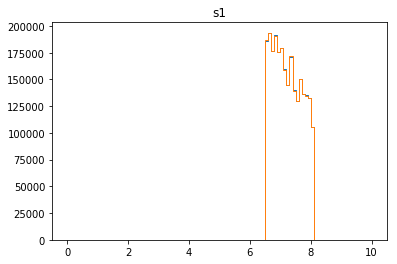

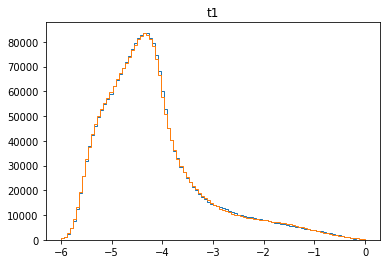

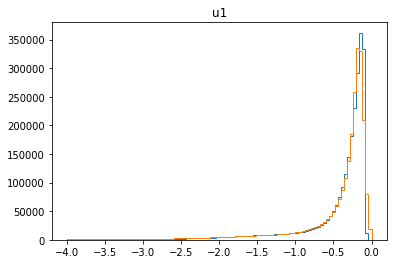

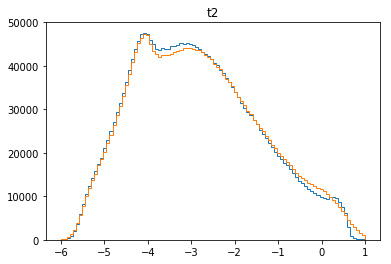

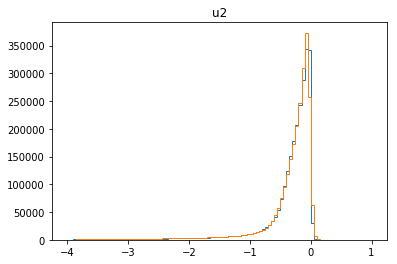

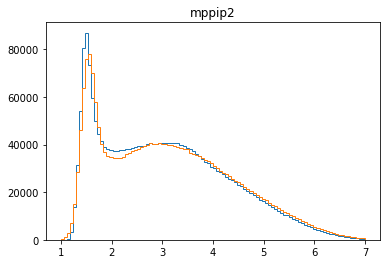

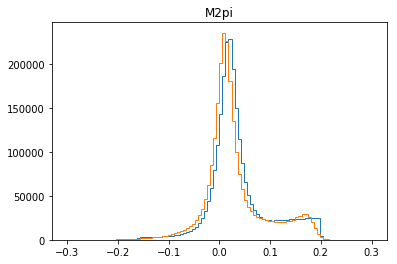

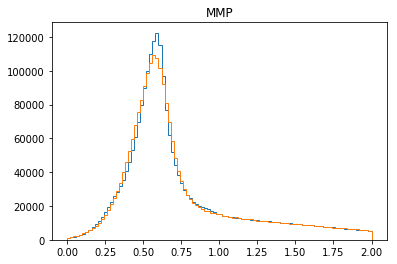

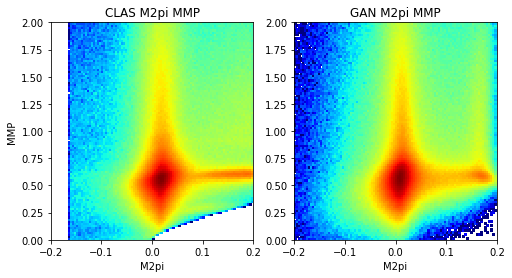

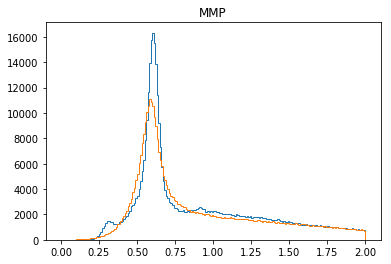

1001 [[-0.3020262, -0.31322482, 0.011198616], [-0.22120327, -0.22169407, 0.0004907933], [-0.14652407, -0.14847526, 0.001951191], [-0.10581876, -0.105855875, 3.711334e-05], [-0.09520827, -0.09821153, 0.0030032527], [-0.1379669, -0.13801147, 4.456524e-05], [-0.21524388, -0.21550623, 0.0002623494], [-0.28757834, -0.2895632, 0.001984867], [-0.3626827, -0.3660796, 0.0033968906], [-0.42319995, -0.42337418, 0.00017420971], [-0.45443863, -0.45637736, 0.0019387414], [-0.4562287, -0.45748526, 0.0012565659], [-0.4339691, -0.43408057, 0.000111453934], [-0.36457527, -0.36878523, 0.0042099576], [-0.28707802, -0.28711274, 3.4713303e-05], [-0.20356926, -0.20357051, 1.2492674e-06], [-0.13316846, -0.1338814, 0.000712942], [-0.103924856, -0.103973426, 4.8573256e-05], [-0.10876485, -0.11040855, 0.0016437025], [-0.15603448, -0.15874782, 0.002713336]]
1002 [[-0.23658626, -0.23707739, 0.0004911314], [-0.31163397, -0.31171072, 7.674552e-05], [-0.3805175, -0.383539, 0.0030214684], [-0.43046924, -0.43681747, 0.

1011 [[-0.40870476, -0.409298, 0.0005932557], [-0.33476192, -0.33599573, 0.0012338173], [-0.2497752, -0.24979472, 1.9513594e-05], [-0.17215718, -0.1739715, 0.0018143263], [-0.11184728, -0.116963185, 0.005115907], [-0.09904076, -0.099043764, 2.9993828e-06], [-0.12029955, -0.122680195, 0.0023806484], [-0.17020983, -0.17087255, 0.00066272693], [-0.24142736, -0.24176013, 0.00033276624], [-0.30311143, -0.3051205, 0.0020090735], [-0.36433214, -0.36516845, 0.0008363213], [-0.39803985, -0.40043673, 0.0023968688], [-0.4035136, -0.41323754, 0.009723918], [-0.40395325, -0.4051389, 0.0011856568], [-0.36954692, -0.3695857, 3.8781673e-05], [-0.30098128, -0.30098307, 1.7928105e-06], [-0.23682941, -0.23688929, 5.9878403e-05], [-0.18406886, -0.18413888, 7.0015696e-05], [-0.15849636, -0.15906598, 0.0005696171], [-0.15412013, -0.1561033, 0.001983168]]
1012 [[-0.19021088, -0.19105339, 0.00084251055], [-0.25164118, -0.25180158, 0.00016039703], [-0.30762, -0.30808955, 0.0004695623], [-0.37083402, -0.3721470

1021 [[-0.1397146, -0.14017569, 0.00046108672], [-0.21040921, -0.21250102, 0.0020918103], [-0.27439094, -0.2766344, 0.0022434613], [-0.33638307, -0.33703476, 0.00065167644], [-0.37553975, -0.3829861, 0.007446354], [-0.42487124, -0.42495775, 8.652979e-05], [-0.45481676, -0.45566082, 0.0008440614], [-0.4562817, -0.45646036, 0.00017866866], [-0.41154683, -0.4125818, 0.0010349893], [-0.334389, -0.3380305, 0.0036414824], [-0.26571673, -0.26590052, 0.00018380403], [-0.19991826, -0.20037976, 0.00046149644], [-0.13726914, -0.14104278, 0.0037736422], [-0.1100364, -0.11020196, 0.00016555902], [-0.10348302, -0.10418581, 0.0007027928], [-0.14588945, -0.14600022, 0.00011077034], [-0.20891798, -0.20955725, 0.0006392713], [-0.2830068, -0.28483805, 0.0018312645], [-0.3551799, -0.35583842, 0.00065851095], [-0.40142164, -0.4054839, 0.0040622726]]
1022 [[-0.43809333, -0.43897155, 0.00087820215], [-0.45769164, -0.45803452, 0.00034286233], [-0.44459596, -0.44521713, 0.0006211722], [-0.4023981, -0.4025957, 

1031 [[-0.26992553, -0.27035746, 0.00043191106], [-0.18712334, -0.18993896, 0.0028156217], [-0.12653539, -0.12821627, 0.0016808736], [-0.09482137, -0.09577553, 0.00095416186], [-0.09281656, -0.09460079, 0.0017842297], [-0.13768724, -0.13914227, 0.001455046], [-0.20978713, -0.20980896, 2.1836971e-05], [-0.2833777, -0.28457627, 0.0011985642], [-0.35166922, -0.3561115, 0.0044422746], [-0.41315436, -0.41748348, 0.0043291003], [-0.460148, -0.4602171, 6.909309e-05], [-0.47615114, -0.47690374, 0.00075259124], [-0.4570424, -0.45889315, 0.0018507417], [-0.40077648, -0.40080452, 2.8055107e-05], [-0.3170517, -0.32198107, 0.004929374], [-0.2356586, -0.23813151, 0.0024729134], [-0.15368344, -0.15602055, 0.0023371093], [-0.10178642, -0.10181174, 2.5316856e-05], [-0.08026695, -0.082016066, 0.001749116], [-0.10807619, -0.10850147, 0.0004252773]]
1032 [[-0.17895275, -0.18205613, 0.003103373], [-0.25957316, -0.25959253, 1.9379018e-05], [-0.33427215, -0.33432946, 5.7308942e-05], [-0.39535028, -0.39538386

1041 [[-0.44026774, -0.44027123, 3.493915e-06], [-0.36864898, -0.37026864, 0.0016196645], [-0.2863599, -0.28649405, 0.00013412931], [-0.20971636, -0.21434619, 0.004629816], [-0.15396322, -0.1559612, 0.001997975], [-0.11247247, -0.11255184, 7.9374295e-05], [-0.105911955, -0.10602887, 0.00011691576], [-0.14363125, -0.14364345, 1.2209873e-05], [-0.19671716, -0.19863212, 0.0019149637], [-0.2565216, -0.25707236, 0.00055074785], [-0.31026402, -0.31133792, 0.0010738833], [-0.3519964, -0.35680202, 0.0048056203], [-0.38594425, -0.38607317, 0.00012892345], [-0.3816658, -0.3900935, 0.008427718], [-0.3865048, -0.3926552, 0.0061503956], [-0.35955498, -0.3618838, 0.002328818], [-0.32668862, -0.32674456, 5.593116e-05], [-0.2725926, -0.27740988, 0.0048172628], [-0.23777877, -0.23822193, 0.00044316173], [-0.21463737, -0.21491878, 0.00028140502]]
1042 [[-0.20107318, -0.20116915, 9.596441e-05], [-0.21747087, -0.21764852, 0.00017765029], [-0.25692233, -0.25824368, 0.0013213406], [-0.3153536, -0.31538728, 

1051 [[-0.12192637, -0.12467979, 0.002753423], [-0.20424081, -0.20483826, 0.0005974443], [-0.28251836, -0.28403175, 0.0015133877], [-0.34650138, -0.35017216, 0.0036707763], [-0.39710885, -0.40364167, 0.00653281], [-0.44750944, -0.4475098, 3.6557685e-07], [-0.46842206, -0.46899512, 0.00057308195], [-0.4636505, -0.4639052, 0.00025468285], [-0.4163983, -0.4164003, 2.0245934e-06], [-0.34148008, -0.34149456, 1.4493766e-05], [-0.26153898, -0.2615585, 1.9513594e-05], [-0.18514943, -0.18523678, 8.7347886e-05], [-0.11385198, -0.11396631, 0.000114331626], [-0.08507085, -0.08519327, 0.00012242381], [-0.09157336, -0.09262251, 0.0010491505], [-0.13614334, -0.13911137, 0.002968027], [-0.21352506, -0.21602918, 0.0025041215], [-0.2962723, -0.29652372, 0.00025140605], [-0.36798763, -0.3687417, 0.0007540571], [-0.4126304, -0.41393584, 0.0013054423]]
1052 [[-0.44898492, -0.44956395, 0.0005790333], [-0.45270276, -0.45315626, 0.00045350034], [-0.4109943, -0.41123328, 0.00023898254], [-0.33728155, -0.337774

1061 [[-0.21569806, -0.21614808, 0.00045001387], [-0.26990798, -0.27320468, 0.0032967022], [-0.34318307, -0.34322426, 4.1193653e-05], [-0.40152314, -0.4036363, 0.0021131497], [-0.4558424, -0.45787653, 0.0020341151], [-0.48639834, -0.48646203, 6.368593e-05], [-0.48151422, -0.48167163, 0.00015741565], [-0.42391843, -0.42801702, 0.0040985807], [-0.35155526, -0.3549528, 0.003397558], [-0.26668423, -0.2672801, 0.0005958602], [-0.17262115, -0.17613757, 0.003516427], [-0.10815425, -0.108315185, 0.0001609289], [-0.061461743, -0.061529197, 6.745407e-05], [-0.059634514, -0.059647236, 1.2721648e-05], [-0.10427675, -0.104773216, 0.00049647177], [-0.18578537, -0.1860969, 0.00031154382], [-0.26924393, -0.2695924, 0.00034846517], [-0.33876997, -0.34294632, 0.004176363], [-0.41250184, -0.41272163, 0.000219805], [-0.47608793, -0.47623283, 0.00014489602]]
1062 [[-0.5107893, -0.5108089, 1.9614834e-05], [-0.5082459, -0.5087646, 0.00051873026], [-0.45916504, -0.4615149, 0.0023498512], [-0.3912385, -0.39517

1071 [[-0.24414459, -0.244163, 1.841727e-05], [-0.16167004, -0.16167535, 5.2999867e-06], [-0.09679444, -0.097299196, 0.0005047508], [-0.076018095, -0.076018654, 5.618822e-07], [-0.10544108, -0.105561614, 0.00012053184], [-0.17377931, -0.17454557, 0.0007662571], [-0.24628991, -0.2475546, 0.0012646925], [-0.3237618, -0.32771778, 0.003955998], [-0.3957832, -0.3991254, 0.0033421968], [-0.45317805, -0.45317814, 1.0145959e-07], [-0.48823327, -0.48893645, 0.0007031973], [-0.50322163, -0.50330794, 8.6281594e-05], [-0.46998483, -0.4701509, 0.00016605022], [-0.38628358, -0.3898347, 0.0035511227], [-0.29775283, -0.3011023, 0.0033494784], [-0.20899436, -0.21015923, 0.0011648635], [-0.13438112, -0.13544863, 0.0010675173], [-0.08939527, -0.08941038, 1.5110141e-05], [-0.07847212, -0.07848378, 1.1656448e-05], [-0.11545847, -0.11856078, 0.0031023114]]
1072 [[-0.19323984, -0.19389893, 0.00065909844], [-0.27602327, -0.2777727, 0.0017494351], [-0.35477492, -0.35642636, 0.0016514447], [-0.42098263, -0.4221

1081 [[-0.122375436, -0.12675968, 0.004384242], [-0.07956367, -0.07959537, 3.1702453e-05], [-0.0660284, -0.06603395, 5.5487367e-06], [-0.10338807, -0.105438046, 0.0020499744], [-0.17627451, -0.18228658, 0.0060120695], [-0.2633899, -0.2634422, 5.231146e-05], [-0.33820856, -0.33959773, 0.0013891646], [-0.40582305, -0.40751302, 0.0016899569], [-0.46410042, -0.46515626, 0.0010558335], [-0.49639067, -0.50052744, 0.0041367663], [-0.49785313, -0.49810067, 0.0002475499], [-0.43175298, -0.4317722, 1.9228175e-05], [-0.33678082, -0.33862928, 0.0018484449], [-0.24568449, -0.24625029, 0.00056579965], [-0.15980485, -0.1610743, 0.0012694449], [-0.09498277, -0.09498881, 6.035203e-06], [-0.04787636, -0.05045161, 0.0025752496], [-0.05079398, -0.05253306, 0.0017390795], [-0.106140696, -0.106221914, 8.122014e-05], [-0.18822613, -0.18867244, 0.00044629915]]
1082 [[-0.26847935, -0.26887542, 0.00039606076], [-0.33819997, -0.34183595, 0.0036359602], [-0.40280604, -0.40618694, 0.0033809019], [-0.45967367, -0.4

1091 [[-0.314908, -0.31571156, 0.00080355327], [-0.21490192, -0.21922024, 0.004318314], [-0.13234824, -0.1365753, 0.004227053], [-0.08507393, -0.08555564, 0.00048170862], [-0.07106291, -0.072128184, 0.0010652748], [-0.10326737, -0.10326742, 4.4823537e-08], [-0.1804494, -0.18047516, 2.5760244e-05], [-0.2650855, -0.2662202, 0.0011347253], [-0.3457544, -0.34727418, 0.0015197757], [-0.40836436, -0.408906, 0.00054165436], [-0.4557181, -0.45642504, 0.0007069451], [-0.47167554, -0.47393566, 0.002260115], [-0.44469216, -0.44726276, 0.0025706056], [-0.37694782, -0.37817213, 0.0012243218], [-0.29366735, -0.294795, 0.0011276689], [-0.20462352, -0.20480204, 0.00017851574], [-0.12435822, -0.12511218, 0.00075395225], [-0.07467315, -0.0766949, 0.0020217467], [-0.06737967, -0.067478985, 9.93191e-05], [-0.10598513, -0.108893394, 0.0029082696]]
1092 [[-0.17725268, -0.18168962, 0.004436937], [-0.25808698, -0.25842422, 0.00033723473], [-0.33141184, -0.3315353, 0.00012348128], [-0.3782909, -0.3880498, 0.00

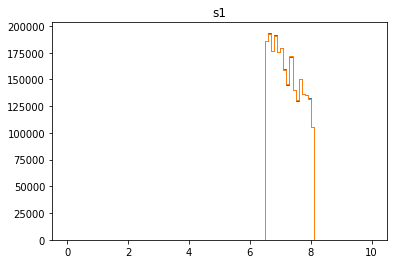

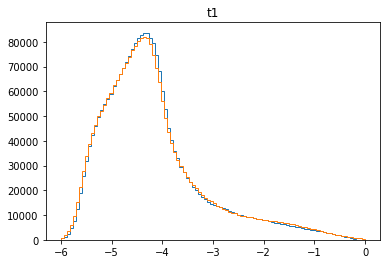

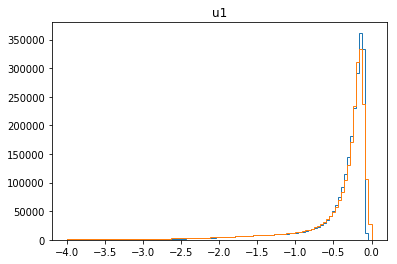

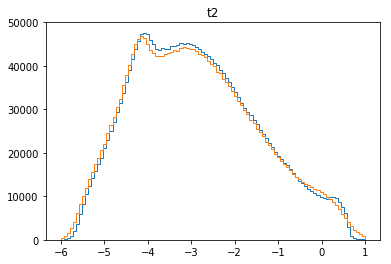

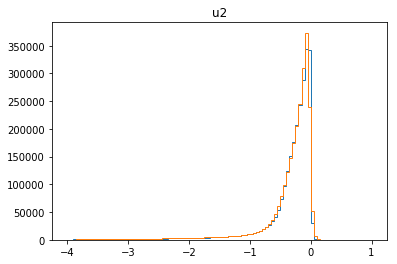

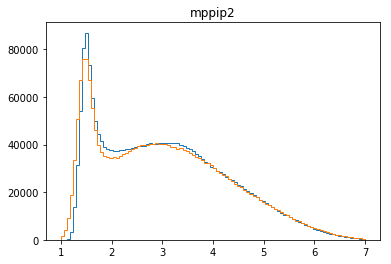

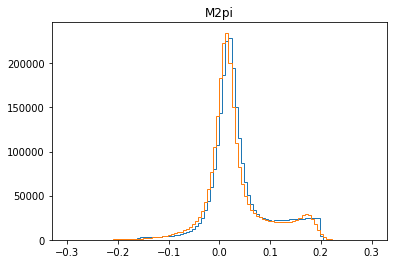

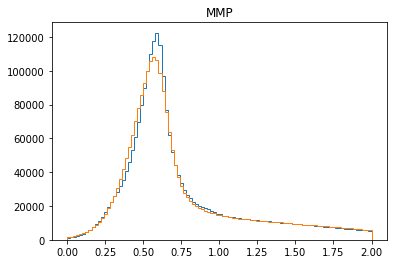

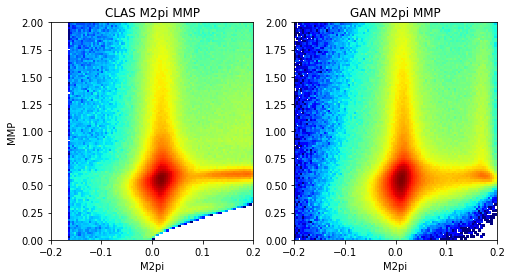

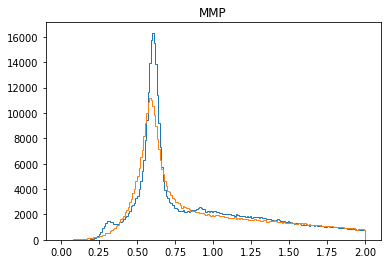

1101 [[-0.048679765, -0.050520018, 0.0018402537], [-0.025867213, -0.025973571, 0.00010635867], [-0.0420023, -0.04302067, 0.0010183662], [-0.09707949, -0.09974495, 0.0026654622], [-0.18187891, -0.18263464, 0.000755734], [-0.26260436, -0.26299828, 0.0003939379], [-0.33960506, -0.34133986, 0.0017347868], [-0.40191987, -0.4038566, 0.0019367266], [-0.4530859, -0.45334744, 0.00026154678], [-0.470736, -0.47416252, 0.003426525], [-0.44522718, -0.44650835, 0.0012811606], [-0.3596975, -0.36891142, 0.009213934], [-0.2774872, -0.28156918, 0.0040819906], [-0.18014179, -0.1878971, 0.0077553033], [-0.11032024, -0.11272739, 0.0024071513], [-0.064331554, -0.06468495, 0.00035339594], [-0.06567469, -0.06778661, 0.0021119225], [-0.11525948, -0.11539659, 0.00013710566], [-0.19390328, -0.1949585, 0.0010552139], [-0.28368968, -0.28369778, 8.098374e-06]]
1102 [[-0.35883957, -0.36359245, 0.0047528767], [-0.42895114, -0.42939714, 0.00044597685], [-0.47587016, -0.47611699, 0.0002468302], [-0.49875784, -0.499708,

1111 [[-0.07983811, -0.080008216, 0.0001701055], [-0.14276095, -0.14466575, 0.0019047944], [-0.23057052, -0.23083623, 0.00026569655], [-0.31563273, -0.3166178, 0.0009850448], [-0.39213452, -0.39460742, 0.0024729134], [-0.46297055, -0.46491584, 0.0019452979], [-0.5125216, -0.513401, 0.000879333], [-0.534171, -0.53764206, 0.0034711063], [-0.51477677, -0.5147771, 3.339992e-07], [-0.44743022, -0.44792423, 0.0004940099], [-0.3529139, -0.3532581, 0.00034420565], [-0.24483101, -0.24838781, 0.0035568073], [-0.14500423, -0.14717546, 0.002171236], [-0.06968579, -0.07004487, 0.0003590839], [-0.01932988, -0.019401759, 7.187928e-05], [-0.005167231, -0.0088022705, 0.0036350396], [-0.03294413, -0.033713773, 0.00076963997], [-0.104699306, -0.105158426, 0.00045912294], [-0.17894101, -0.1860905, 0.007149493], [-0.27609926, -0.2775746, 0.0014753424]]
1112 [[-0.35725617, -0.35883814, 0.0015819664], [-0.42015308, -0.4242749, 0.004121814], [-0.4645952, -0.46593407, 0.0013388704], [-0.49202237, -0.49249068, 

1121 [[-0.051976822, -0.053241923, 0.0012650994], [-0.03093575, -0.030957444, 2.1694595e-05], [-0.03764792, -0.040505193, 0.0028572707], [-0.10626764, -0.106289834, 2.2194947e-05], [-0.19657019, -0.19697013, 0.00039994202], [-0.27218932, -0.27987322, 0.007683912], [-0.34458724, -0.34561232, 0.0010250725], [-0.3962225, -0.39844865, 0.0022261492], [-0.43862987, -0.44030777, 0.0016779032], [-0.46158743, -0.46260396, 0.001016541], [-0.44019857, -0.44113502, 0.00093645183], [-0.37227768, -0.3772718, 0.0049941316], [-0.28453797, -0.28750807, 0.0029701055], [-0.1893096, -0.18965147, 0.00034187408], [-0.09619337, -0.09872103, 0.0025276565], [-0.038261376, -0.038462643, 0.00020126696], [-0.013761898, -0.017076366, 0.0033144678], [-0.052034147, -0.052101694, 6.75481e-05], [-0.10395089, -0.10443201, 0.00048112273], [-0.17636804, -0.18026143, 0.0038933856]]
1122 [[-0.26088992, -0.26298085, 0.0020909382], [-0.33670765, -0.3373742, 0.00066656247], [-0.40052384, -0.40152946, 0.0010056242], [-0.453706

1131 [[-0.2756116, -0.27564144, 2.9819672e-05], [-0.19028802, -0.19599757, 0.005709544], [-0.121359915, -0.12141437, 5.4457494e-05], [-0.054637022, -0.056046307, 0.0014092843], [-0.026567668, -0.027084315, 0.0005166472], [-0.046370205, -0.049315207, 0.0029450029], [-0.115230754, -0.11540698, 0.00017622951], [-0.20010932, -0.20011279, 3.4654513e-06], [-0.2831636, -0.28317437, 1.07500855e-05], [-0.34968245, -0.35009912, 0.00041666787], [-0.4057986, -0.4061543, 0.00035569444], [-0.43751982, -0.43868208, 0.0011622609], [-0.4318395, -0.4325263, 0.00068680523], [-0.38659245, -0.39175814, 0.0051656864], [-0.32052794, -0.3205485, 2.057235e-05], [-0.2433662, -0.24349564, 0.00012944374], [-0.16441849, -0.16591811, 0.0014996179], [-0.10368159, -0.10494113, 0.0012595429], [-0.07936718, -0.07995645, 0.0005892671], [-0.0990789, -0.09908216, 3.2556854e-06]]
1132 [[-0.1610834, -0.1629567, 0.0018732932], [-0.23799635, -0.23954332, 0.0015469618], [-0.30708355, -0.31111768, 0.004034118], [-0.36955467, -0

1141 [[-0.034956843, -0.03495828, 1.4393336e-06], [-0.06655592, -0.067346334, 0.000790415], [-0.12650028, -0.13031174, 0.0038114644], [-0.21737738, -0.21769352, 0.0003161392], [-0.30057034, -0.30184823, 0.0012778857], [-0.37080815, -0.3736587, 0.0028505458], [-0.4169599, -0.41734302, 0.0003831106], [-0.43048394, -0.43049634, 1.2410634e-05], [-0.39457425, -0.39485005, 0.0002758019], [-0.31585684, -0.31618592, 0.00032908836], [-0.21679907, -0.21756111, 0.0007620392], [-0.12214561, -0.12237931, 0.00023370457], [-0.048484217, -0.0488292, 0.0003449846], [0.00039370102, -0.00013279055, 0.00052649155], [0.008168884, 0.0073278123, 0.0008410718], [-0.04275963, -0.043537762, 0.00077812956], [-0.12168192, -0.12211605, 0.00043413378], [-0.21847396, -0.21894982, 0.00047586576], [-0.3022718, -0.3098933, 0.0076215095], [-0.38147464, -0.3837451, 0.0022704639]]
1142 [[-0.4427837, -0.4427968, 1.3091663e-05], [-0.4851992, -0.4905018, 0.005302571], [-0.49787256, -0.49787778, 5.2299624e-06], [-0.4696472, -

1151 [[-0.022476137, -0.023425004, 0.0009488667], [-0.07096291, -0.07192309, 0.0009601808], [-0.15576267, -0.1582447, 0.002482027], [-0.25543746, -0.25588846, 0.0004509855], [-0.34368384, -0.3439423, 0.00025847126], [-0.41720155, -0.41939417, 0.002192619], [-0.47914538, -0.48024288, 0.0010975134], [-0.5098894, -0.5106578, 0.00076837064], [-0.49770373, -0.498247, 0.0005432535], [-0.44190642, -0.44190967, 3.262572e-06], [-0.35467872, -0.35724023, 0.0025615233], [-0.25336444, -0.25682545, 0.0034609996], [-0.15291472, -0.15453468, 0.0016199716], [-0.07706864, -0.07759838, 0.0005297351], [-0.046263333, -0.04695987, 0.0006965368], [-0.059224937, -0.059247132, 2.2194947e-05], [-0.120214224, -0.124805704, 0.0045914804], [-0.20668685, -0.20686324, 0.00017638147], [-0.29221264, -0.29491347, 0.002700832], [-0.36841843, -0.3688125, 0.00039408938]]
1152 [[-0.42726398, -0.42976236, 0.002498398], [-0.47766414, -0.47767887, 1.4727062e-05], [-0.4899407, -0.49215713, 0.0022164406], [-0.45724377, -0.4582

1161 [[-0.049306557, -0.049317747, 1.1192299e-05], [-0.07280938, -0.07331396, 0.0005045794], [-0.13361263, -0.1383621, 0.0047494587], [-0.21820161, -0.22136606, 0.0031644488], [-0.30204234, -0.30424103, 0.0021986964], [-0.3657603, -0.3657955, 3.51869e-05], [-0.404818, -0.40482283, 4.819599e-06], [-0.41500512, -0.4159947, 0.0009895995], [-0.37191385, -0.37344152, 0.0015276675], [-0.29724354, -0.2972504, 6.8680533e-06], [-0.20805255, -0.20999129, 0.0019387414], [-0.13013035, -0.13019863, 6.827113e-05], [-0.07440514, -0.074512646, 0.00010750264], [-0.062167812, -0.062167846, 3.3527613e-08], [-0.10479998, -0.10480385, 3.8745347e-06], [-0.17787114, -0.1782446, 0.00037346562], [-0.2646227, -0.26502815, 0.00040545367], [-0.35122135, -0.3516026, 0.00038124624], [-0.41880587, -0.42506564, 0.0062597734], [-0.47581726, -0.47583675, 1.9496747e-05]]
1162 [[-0.4957704, -0.49597925, 0.00020885972], [-0.46549344, -0.46552652, 3.3070042e-05], [-0.3945062, -0.39503637, 0.00053017423], [-0.29220212, -0.2

1171 [[-0.27451515, -0.28139532, 0.006880169], [-0.17050281, -0.17167301, 0.0011702075], [-0.077946074, -0.07871212, 0.00076604605], [-0.015373057, -0.01573802, 0.00036496297], [-0.0033575252, -0.0035807937, 0.00022326843], [-0.043840393, -0.044631775, 0.0007913805], [-0.13303733, -0.13311522, 7.7885954e-05], [-0.22477603, -0.22726433, 0.0024883025], [-0.31700677, -0.3170498, 4.3025364e-05], [-0.3892292, -0.39023542, 0.0010062292], [-0.44895333, -0.4492219, 0.00026856456], [-0.4872962, -0.4882513, 0.0009551048], [-0.48819217, -0.4885714, 0.0003792378], [-0.44114393, -0.4413802, 0.00023627754], [-0.34662187, -0.34676668, 0.00014480422], [-0.23539498, -0.24110425, 0.005709256], [-0.13354489, -0.13808481, 0.0045399293], [-0.048243757, -0.04951266, 0.0012689015], [0.012638484, 0.012446048, 0.00019243646], [0.017964652, 0.016861191, 0.0011034609]]
1172 [[-0.026981393, -0.028144434, 0.0011630413], [-0.11045667, -0.11146592, 0.0010092566], [-0.19998299, -0.20291992, 0.0029369348], [-0.2905664

1181 [[-0.50601304, -0.50824404, 0.0022310114], [-0.47379082, -0.474156, 0.0003651816], [-0.3920054, -0.39226407, 0.0002586553], [-0.2760685, -0.2811224, 0.0050538876], [-0.16526847, -0.16784352, 0.0025750562], [-0.07348543, -0.07372713, 0.00024170292], [-0.0037888647, -0.0038286024, 3.973773e-05], [0.017150346, 0.016639492, 0.00051085406], [-0.008922622, -0.012600565, 0.0036779442], [-0.08592212, -0.09007977, 0.004157648], [-0.17938273, -0.17969373, 0.0003110054], [-0.27209434, -0.27222922, 0.00013488141], [-0.354906, -0.35538152, 0.00047553293], [-0.42129043, -0.422698, 0.0014075664], [-0.4625825, -0.46682048, 0.0042379727], [-0.47952867, -0.47964162, 0.00011294901], [-0.45147038, -0.45205346, 0.00058307924], [-0.37011185, -0.37040016, 0.00028829384], [-0.26830143, -0.26947385, 0.0011724271], [-0.17155625, -0.17236121, 0.0008049596]]
1182 [[-0.08360637, -0.08381144, 0.00020507308], [-0.019478537, -0.01977282, 0.0002942835], [0.019621156, 0.012725791, 0.0068953643], [-0.008689517, -0.

1191 [[-0.00016305503, -0.0019458348, 0.0017827798], [-0.053727273, -0.05517912, 0.0014518464], [-0.14877899, -0.14887577, 9.678831e-05], [-0.25043184, -0.2510748, 0.0006429416], [-0.34054226, -0.34086433, 0.00032206764], [-0.41246724, -0.41497958, 0.0025123367], [-0.4755578, -0.47589225, 0.00033443852], [-0.508868, -0.5102314, 0.0013634084], [-0.4995709, -0.5000874, 0.0005164738], [-0.43358502, -0.43419483, 0.0006098154], [-0.3356212, -0.3382584, 0.0026371775], [-0.22990254, -0.22990267, 1.397566e-07], [-0.12885079, -0.12978245, 0.00093167194], [-0.04772957, -0.047763348, 3.3775756e-05], [0.00026764063, -0.00021047455, 0.0004781152], [0.004193842, 0.0028154622, 0.0013783799], [-0.0646649, -0.06477126, 0.00010635867], [-0.14928423, -0.14928444, 2.0954758e-07], [-0.24045926, -0.24166577, 0.0012065012], [-0.32961428, -0.33065075, 0.0010364626]]
1192 [[-0.39837757, -0.39969295, 0.001315385], [-0.44267297, -0.4469943, 0.0043213223], [-0.46807843, -0.46817532, 9.690092e-05], [-0.45147368, -

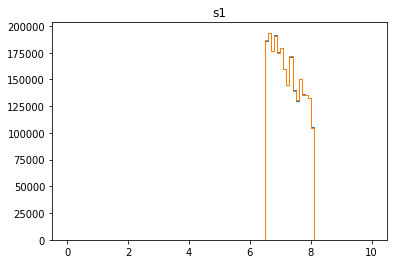

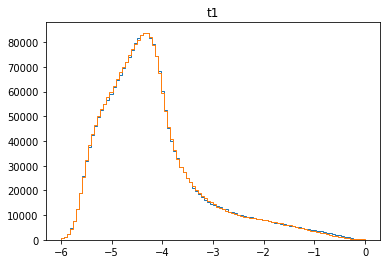

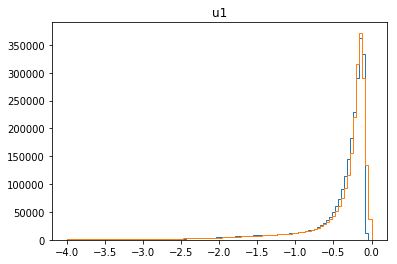

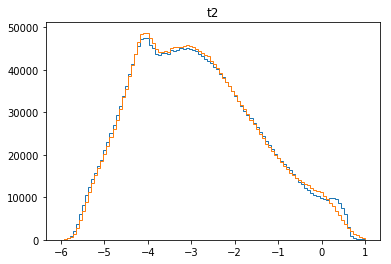

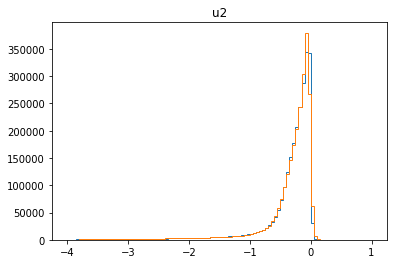

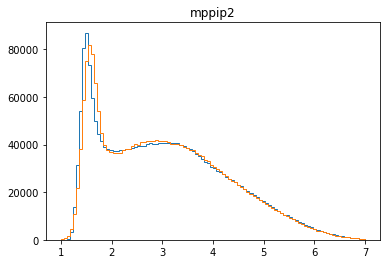

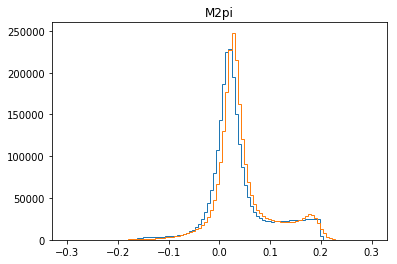

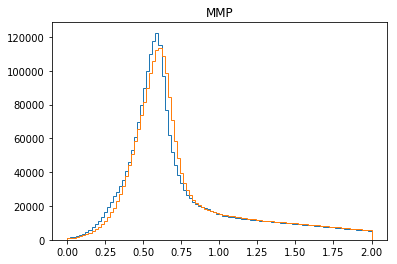

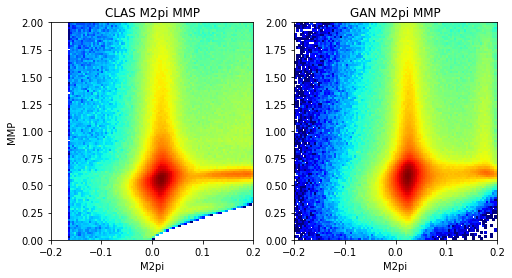

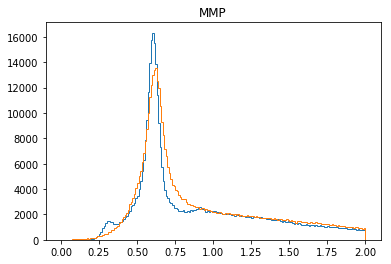

1201 [[-0.39590308, -0.39598307, 7.998722e-05], [-0.46636292, -0.46820793, 0.0018450023], [-0.52535933, -0.5258417, 0.00048237856], [-0.5405657, -0.5413278, 0.0007620392], [-0.51823384, -0.5183201, 8.624615e-05], [-0.4369687, -0.4393121, 0.0023433839], [-0.33035064, -0.33326963, 0.002918977], [-0.21098045, -0.21292692, 0.0019464757], [-0.0877256, -0.09929089, 0.011565289], [-0.01772803, -0.01878015, 0.0010521181], [0.021692943, 0.021691777, 1.1654483e-06], [0.013046577, 0.0130446805, 1.8964201e-06], [-0.04658317, -0.04685267, 0.00026950307], [-0.14784792, -0.14840405, 0.0005561324], [-0.24395233, -0.24580833, 0.0018559968], [-0.3377144, -0.33779657, 8.215103e-05], [-0.4155496, -0.41567326, 0.00012365091], [-0.47809914, -0.47973466, 0.0016355158], [-0.5145455, -0.5148039, 0.0002584099], [-0.50275683, -0.5028513, 9.447546e-05]]
1202 [[-0.43438393, -0.43441105, 2.7133361e-05], [-0.3249974, -0.33140686, 0.006409452], [-0.21609232, -0.21619031, 9.7992975e-05], [-0.097390264, -0.10078227, 0.

1211 [[-0.32598782, -0.3263949, 0.00040706832], [-0.2101886, -0.21178304, 0.0015944324], [-0.09685105, -0.10086678, 0.004015725], [-0.0034459322, -0.008299271, 0.0048533385], [0.034801815, 0.03438538, 0.00041643437], [0.033872124, 0.03376667, 0.00010545576], [-0.01644996, -0.01867809, 0.0022281294], [-0.11607817, -0.116636105, 0.000557933], [-0.21500699, -0.2151405, 0.00013351152], [-0.3085357, -0.30855864, 2.295617e-05], [-0.38702816, -0.38722673, 0.00019857014], [-0.45390448, -0.45615372, 0.002249247], [-0.49890435, -0.4999277, 0.0010233633], [-0.5000262, -0.5015362, 0.0015099762], [-0.45554894, -0.4557054, 0.00015645986], [-0.362969, -0.36347798, 0.00050895906], [-0.25418377, -0.2543864, 0.00020262222], [-0.14223209, -0.14432302, 0.0020909382], [-0.044790927, -0.04587032, 0.0010793905], [0.016470514, 0.015965335, 0.0005051794]]
1212 [[0.030101033, 0.03007693, 2.4103343e-05], [-0.022067672, -0.02218278, 0.00011510791], [-0.104856566, -0.10508598, 0.00022940904], [-0.20758261, -0.2076

1221 [[-0.39308926, -0.39360434, 0.0005150876], [-0.44484586, -0.44495142, 0.000105573294], [-0.46716136, -0.46729752, 0.00013616927], [-0.4523168, -0.45243165, 0.00011486248], [-0.38033405, -0.3830997, 0.0027656467], [-0.29109833, -0.29114562, 4.7305493e-05], [-0.19394292, -0.19394487, 1.9493164e-06], [-0.10350849, -0.10465106, 0.0011425775], [-0.0412501, -0.04127586, 2.5760244e-05], [-0.023373557, -0.024450444, 0.0010768856], [-0.06336596, -0.06392425, 0.0005582935], [-0.14592396, -0.1459686, 4.4641674e-05], [-0.24014893, -0.24015637, 7.428902e-06], [-0.33283356, -0.33316243, 0.00032888076], [-0.4026191, -0.402636, 1.6894863e-05], [-0.43402472, -0.43407235, 4.7620862e-05], [-0.43502858, -0.43504712, 1.8532042e-05], [-0.3689214, -0.369429, 0.00050758297], [-0.27844754, -0.27938667, 0.00093913876], [-0.18504448, -0.18506938, 2.4896348e-05]]
1222 [[-0.11349921, -0.11361358, 0.00011437239], [-0.057063803, -0.05854296, 0.0014791545], [-0.047610532, -0.0488621, 0.0012515677], [-0.09405215,

1231 [[-0.42788595, -0.42818278, 0.00029684117], [-0.45741004, -0.46519762, 0.007787586], [-0.45667484, -0.45669532, 2.0485932e-05], [-0.38391888, -0.38424185, 0.0003229582], [-0.27879044, -0.28027916, 0.0014887062], [-0.17174904, -0.17787492, 0.0061258874], [-0.09911208, -0.099321656, 0.00020957705], [-0.05326804, -0.055247303, 0.0019792628], [-0.069600806, -0.0701294, 0.0005285944], [-0.14631198, -0.14647117, 0.0001591915], [-0.23968995, -0.23992682, 0.00023686429], [-0.33663926, -0.33666956, 3.0300711e-05], [-0.4214525, -0.42205968, 0.0006071807], [-0.490709, -0.49109775, 0.00038873102], [-0.530501, -0.5305015, 4.6625792e-07], [-0.5152222, -0.5162832, 0.0010610459], [-0.43366173, -0.4338938, 0.00023207456], [-0.32281858, -0.32285908, 4.0486688e-05], [-0.20025322, -0.20093006, 0.0006768445], [-0.088765256, -0.094402395, 0.005637137]]
1232 [[-0.016393963, -0.019183131, 0.0027891684], [0.00093692355, -0.0017433297, 0.0026802532], [-0.045073133, -0.045644663, 0.00057153066], [-0.1284109

1241 [[-0.55155885, -0.55194736, 0.00038850537], [-0.46959978, -0.4726665, 0.0030667183], [-0.36933482, -0.37186036, 0.002525547], [-0.25000873, -0.25017667, 0.00016792341], [-0.1446961, -0.14573957, 0.0010434744], [-0.05830865, -0.059213735, 0.00090508384], [-0.0067364564, -0.007793406, 0.0010569495], [-0.006989262, -0.010042686, 0.0030534242], [-0.06810087, -0.06828941, 0.00018854043], [-0.15461123, -0.1606168, 0.0060055642], [-0.25820553, -0.25826567, 6.0144353e-05], [-0.33819774, -0.34684008, 0.008642336], [-0.41638762, -0.42281723, 0.006429623], [-0.48024917, -0.4814431, 0.0011939462], [-0.5015248, -0.5041518, 0.0026270004], [-0.4845403, -0.48592436, 0.0013840508], [-0.42617425, -0.42622054, 4.6287783e-05], [-0.33290857, -0.33311415, 0.00020556505], [-0.23293087, -0.23900016, 0.006069291], [-0.15037878, -0.15046567, 8.688502e-05]]
1242 [[-0.08692258, -0.08838812, 0.0014655419], [-0.06258717, -0.06577398, 0.0031868056], [-0.08719772, -0.08864376, 0.0014460383], [-0.15944469, -0.159

1251 [[-0.46346325, -0.46428856, 0.0008253258], [-0.40619063, -0.4062668, 7.617846e-05], [-0.31324142, -0.31330013, 5.870348e-05], [-0.21450768, -0.21454093, 3.324577e-05], [-0.12381178, -0.12514146, 0.0013296739], [-0.060340285, -0.063798144, 0.003457859], [-0.0534902, -0.054823354, 0.0013331535], [-0.102307364, -0.10239879, 9.142301e-05], [-0.18684514, -0.18902509, 0.0021799551], [-0.29193395, -0.291958, 2.404719e-05], [-0.37604448, -0.37637004, 0.0003255686], [-0.45177075, -0.45276588, 0.0009951274], [-0.5093877, -0.5151232, 0.0057355156], [-0.5146549, -0.51720405, 0.0025491822], [-0.469769, -0.4699355, 0.00016649292], [-0.37625098, -0.37782642, 0.0015754488], [-0.26195583, -0.26452565, 0.0025698321], [-0.15955041, -0.1597616, 0.0002111816], [-0.062599294, -0.06677492, 0.0041756234], [-0.021803485, -0.022355935, 0.0005524501]]
1252 [[-0.016128741, -0.016284676, 0.00015593544], [-0.066902384, -0.06690808, 5.6934405e-06], [-0.14731185, -0.1544214, 0.0071095517], [-0.24897423, -0.25038

1261 [[-0.4406693, -0.44084075, 0.0001714515], [-0.50051284, -0.5022744, 0.0017615821], [-0.5300891, -0.5305341, 0.00044501075], [-0.5011539, -0.5023489, 0.001195001], [-0.42289132, -0.42355403, 0.00066272693], [-0.31641483, -0.31742156, 0.0010067133], [-0.19937189, -0.19987707, 0.0005051794], [-0.091690205, -0.09207414, 0.00038393243], [0.00053453434, 0.0004510293, 8.3505016e-05], [0.044939287, 0.044008195, 0.00093108974], [0.031460237, 0.030344449, 0.0011157871], [-0.046850618, -0.047150094, 0.00029947594], [-0.14973947, -0.15321845, 0.0034789767], [-0.2632964, -0.26435855, 0.0010621647], [-0.35822648, -0.36348137, 0.0052549], [-0.45034334, -0.45077595, 0.00043262483], [-0.51734173, -0.5175663, 0.00022458132], [-0.56080043, -0.5637753, 0.002974889], [-0.5618519, -0.5618897, 3.7766895e-05], [-0.5106661, -0.51232713, 0.0016610699]]
1262 [[-0.41854748, -0.41927117, 0.000723677], [-0.2986855, -0.30258626, 0.0039007682], [-0.1831573, -0.1840293, 0.0008719956], [-0.073002614, -0.07687437, 

1271 [[-0.25159317, -0.2551078, 0.0035146177], [-0.13465914, -0.13938524, 0.00472609], [-0.05009229, -0.050806966, 0.00071467465], [0.003952163, 0.003885053, 6.7109875e-05], [0.0060275067, 0.005940586, 8.692057e-05], [-0.055296507, -0.0558332, 0.0005366939], [-0.14285731, -0.14287378, 1.6458684e-05], [-0.24748416, -0.24793985, 0.00045569643], [-0.3377578, -0.3395343, 0.0017765039], [-0.41348723, -0.41375366, 0.00026644327], [-0.47304884, -0.47304884, 5.820766e-11], [-0.49941114, -0.5012773, 0.0018662002], [-0.4897067, -0.49006405, 0.0003573511], [-0.4271701, -0.4271822, 1.2090201e-05], [-0.33855677, -0.3386726, 0.000115845796], [-0.23829891, -0.23838444, 8.553906e-05], [-0.14113869, -0.14119488, 5.6188215e-05], [-0.07061914, -0.07162138, 0.0010022398], [-0.040612713, -0.041267216, 0.00065450364], [-0.06204678, -0.06345535, 0.0014085684]]
1272 [[-0.13557819, -0.13561106, 3.287291e-05], [-0.22236635, -0.22536166, 0.0029953143], [-0.3213026, -0.32131153, 8.944422e-06], [-0.4017343, -0.402

1281 [[-0.13869368, -0.14030154, 0.001607865], [-0.07384647, -0.07386288, 1.641229e-05], [-0.041414022, -0.048156295, 0.006742274], [-0.06930436, -0.069412224, 0.000107858876], [-0.13420936, -0.13456362, 0.00035425703], [-0.2270778, -0.22811157, 0.0010337625], [-0.32742727, -0.3279104, 0.00048313293], [-0.4162378, -0.41624454, 6.738705e-06], [-0.4830851, -0.48348802, 0.0004029228], [-0.53231996, -0.5330761, 0.0007561535], [-0.5408095, -0.5423883, 0.0015787818], [-0.47626406, -0.47736865, 0.0011046019], [-0.3782299, -0.37847948, 0.00024959477], [-0.25050098, -0.25054026, 3.9282153e-05], [-0.12172048, -0.12961243, 0.007891954], [-0.03021836, -0.030297393, 7.90348e-05], [0.031561732, 0.03148839, 7.334201e-05], [0.043370057, 0.042996664, 0.00037339178], [-0.011715248, -0.011778508, 6.326044e-05], [-0.10837677, -0.108437866, 6.109477e-05]]
1282 [[-0.21058895, -0.21162333, 0.0010343759], [-0.3112221, -0.3151162, 0.0038941002], [-0.40443835, -0.40497673, 0.00053837436], [-0.47141194, -0.47376

1291 [[-0.52122056, -0.52186525, 0.00064468384], [-0.44007605, -0.44009352, 1.7464046e-05], [-0.32677197, -0.32678425, 1.228998e-05], [-0.20594582, -0.20998454, 0.0040387237], [-0.08903858, -0.09556923, 0.0065306523], [-0.0148111535, -0.017015936, 0.002204782], [0.015969068, 0.015035065, 0.00093400216], [-0.0050661406, -0.005369989, 0.0003038488], [-0.082550764, -0.08275176, 0.00020099648], [-0.18853888, -0.19070975, 0.002170881], [-0.29146978, -0.29171607, 0.00024629108], [-0.3847277, -0.38509512, 0.00036744494], [-0.46074802, -0.4698248, 0.009076766], [-0.52942055, -0.52966374, 0.00024318788], [-0.5529576, -0.55295783, 2.4215842e-07], [-0.5261105, -0.5274133, 0.0013028248], [-0.4485715, -0.44860798, 3.6488524e-05], [-0.33657715, -0.3390055, 0.0024283468], [-0.22121058, -0.22277153, 0.0015609468], [-0.105575494, -0.1078445, 0.0022690098]]
1292 [[-0.021067075, -0.023349186, 0.002282112], [0.025542887, 0.02499357, 0.0005493164], [0.021107957, 0.019854905, 0.0012530525], [-0.0476274, -0.

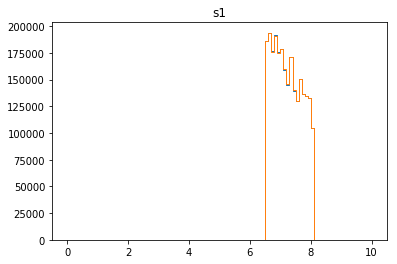

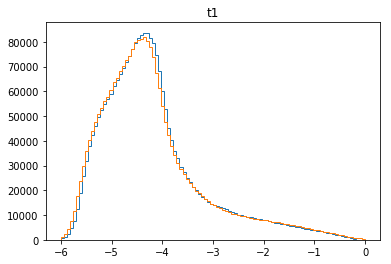

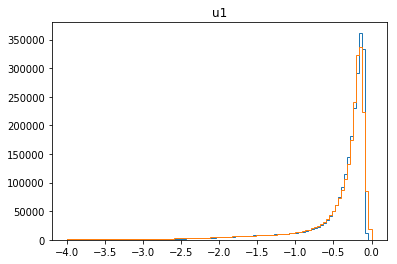

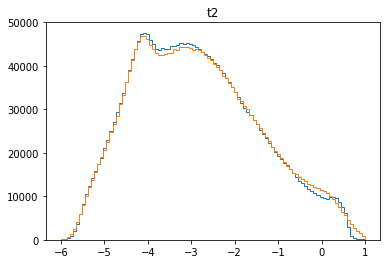

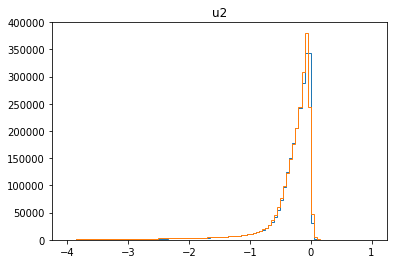

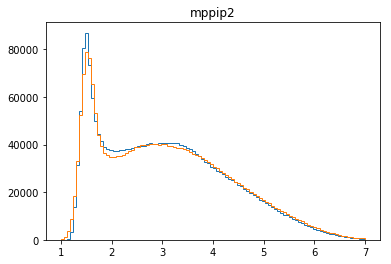

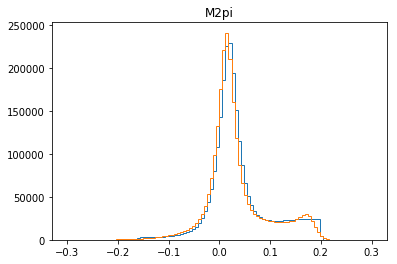

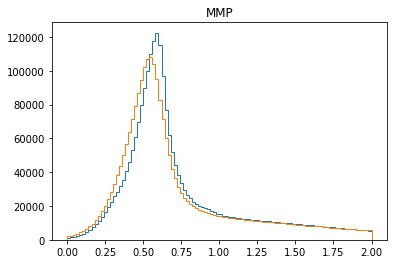

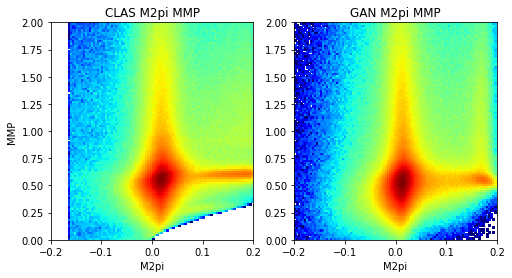

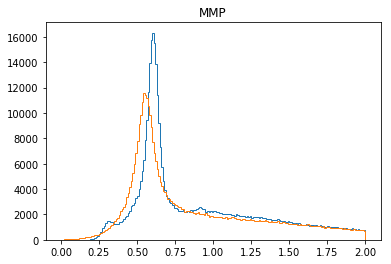

1301 [[-0.1711211, -0.171704, 0.00058289495], [-0.06904879, -0.0692232, 0.00017441118], [-0.0010105686, -0.0014506839, 0.0004401154], [0.018808141, 0.018742708, 6.543298e-05], [-0.024430206, -0.024556972, 0.00012676686], [-0.112364866, -0.11382851, 0.001463644], [-0.22117321, -0.22155587, 0.00038266278], [-0.31965315, -0.32027262, 0.0006194619], [-0.40201744, -0.40206835, 5.091381e-05], [-0.4569697, -0.45753208, 0.00056235684], [-0.4825492, -0.4825512, 1.9921572e-06], [-0.45730364, -0.46241218, 0.005108543], [-0.38957402, -0.39029095, 0.0007169197], [-0.29466584, -0.2946761, 1.0255611e-05], [-0.1941081, -0.19415206, 4.3956155e-05], [-0.107024774, -0.10742464, 0.0003998658], [-0.0507302, -0.05076482, 3.4623463e-05], [-0.040232446, -0.040447302, 0.00021485619], [-0.086194515, -0.08651208, 0.00031756517], [-0.17744967, -0.17752449, 7.4819494e-05]]
1302 [[-0.27891427, -0.27979484, 0.0008805779], [-0.3826674, -0.38298413, 0.00031674994], [-0.4619386, -0.46414265, 0.0022040657], [-0.5283407,

1311 [[-0.36945704, -0.372497, 0.0030399482], [-0.4569623, -0.45741814, 0.00045585918], [-0.5146397, -0.5153151, 0.0006754559], [-0.5380268, -0.5439758, 0.005948939], [-0.5167527, -0.51707333, 0.00032063157], [-0.43531883, -0.43742463, 0.0021057911], [-0.3251711, -0.32530755, 0.0001364365], [-0.21080936, -0.21084404, 3.466837e-05], [-0.11458808, -0.11526235, 0.0006742666], [-0.037154067, -0.03721374, 5.9671944e-05], [-0.0021049138, -0.007936453, 0.0058315396], [-0.036761295, -0.037416093, 0.0006547964], [-0.116422005, -0.118714884, 0.0022928764], [-0.22207242, -0.2221315, 5.9084046e-05], [-0.32276428, -0.32724094, 0.004476664], [-0.42904615, -0.4300869, 0.0010407653], [-0.50795764, -0.51054007, 0.0025824176], [-0.5462036, -0.54621726, 1.3621409e-05], [-0.54541445, -0.54561484, 0.00020040202], [-0.48299888, -0.4848912, 0.0018923284]]
1312 [[-0.3860623, -0.38819215, 0.0021298416], [-0.27495983, -0.27500582, 4.5976867e-05], [-0.16950761, -0.1700775, 0.00056989025], [-0.07014458, -0.070144

1321 [[0.06688736, 0.06623285, 0.00065450364], [0.054187663, 0.0516946, 0.0024930623], [-0.022927606, -0.022934586, 6.9784624e-06], [-0.13640544, -0.13649274, 8.731222e-05], [-0.24872106, -0.24874298, 2.192619e-05], [-0.35159472, -0.35160026, 5.5577257e-06], [-0.43884236, -0.43893945, 9.7088756e-05], [-0.50402045, -0.507209, 0.0031885286], [-0.54273033, -0.54285425, 0.00012390556], [-0.53273374, -0.53318495, 0.00045122858], [-0.47334915, -0.47574714, 0.0023979894], [-0.38271677, -0.3827459, 2.9115623e-05], [-0.27095303, -0.27528164, 0.004328598], [-0.16737053, -0.16766901, 0.00029848656], [-0.07698205, -0.07710171, 0.00011965392], [-0.010072156, -0.010916771, 0.0008446158], [0.010546846, 0.010085186, 0.0004616603], [-0.019991782, -0.020569531, 0.00057774887], [-0.09665447, -0.097906575, 0.0012521074], [-0.2054409, -0.20592538, 0.00048447555]]
1322 [[-0.3065894, -0.30954373, 0.002954326], [-0.4033436, -0.40833423, 0.004990628], [-0.48817044, -0.48822576, 5.530528e-05], [-0.53347796, -0.

1331 [[-0.35615185, -0.35632536, 0.00017350554], [-0.42223066, -0.42256412, 0.00033346246], [-0.46817228, -0.46825886, 8.656528e-05], [-0.48738083, -0.48738354, 2.7157366e-06], [-0.44391584, -0.444444, 0.0005281559], [-0.35370058, -0.35382774, 0.0001271537], [-0.24672964, -0.24673396, 4.3222826e-06], [-0.13565554, -0.13782127, 0.0021657294], [-0.053506535, -0.053557556, 5.1022747e-05], [-0.011569387, -0.01163138, 6.1992556e-05], [-0.03120235, -0.031221528, 1.9178027e-05], [-0.10959251, -0.109592855, 3.4064578e-07], [-0.2136375, -0.21370682, 6.931523e-05], [-0.3072634, -0.31063744, 0.0033740299], [-0.39991888, -0.4011943, 0.0012754324], [-0.47329494, -0.4749641, 0.0016691644], [-0.49064216, -0.49297428, 0.0023321325], [-0.47332275, -0.47339368, 7.094443e-05], [-0.39514136, -0.3951532, 1.1826373e-05], [-0.28554532, -0.28636473, 0.0008194186]]
1332 [[-0.16745825, -0.16825372, 0.0007954636], [-0.06338021, -0.06365671, 0.00027649917], [0.010739842, 0.008662836, 0.002077007], [0.02482925, 0.

1341 [[-0.5206761, -0.52098435, 0.00030825334], [-0.5144512, -0.51493293, 0.00048170862], [-0.4494866, -0.45062572, 0.0011390987], [-0.3446631, -0.34493348, 0.0002703806], [-0.21964675, -0.21964693, 1.858134e-07], [-0.10005213, -0.10019971, 0.00014757155], [-0.0060586366, -0.0071741687, 0.0011155321], [0.05357954, 0.052458905, 0.0011206343], [0.046764817, 0.044158306, 0.002606511], [-0.025281437, -0.025288742, 7.3046585e-06], [-0.13296708, -0.133339, 0.00037191898], [-0.24276277, -0.24593323, 0.0031704605], [-0.33971354, -0.33986154, 0.00014798893], [-0.42227584, -0.42387256, 0.0015967179], [-0.4882332, -0.48982263, 0.0015894098], [-0.55242515, -0.5525099, 8.4729545e-05], [-0.5720095, -0.5733597, 0.0013502004], [-0.5411113, -0.54113144, 2.0142064e-05], [-0.44623855, -0.44665235, 0.00041379186], [-0.3247399, -0.3267314, 0.0019915006]]
1342 [[-0.1987126, -0.20052336, 0.0018107531], [-0.08684832, -0.09047807, 0.0036297517], [-0.0039462675, -0.005266915, 0.0013206475], [0.024201421, 0.0239

1351 [[-0.34062576, -0.34180722, 0.0011814571], [-0.22402497, -0.22695322, 0.0029282589], [-0.11356425, -0.113762714, 0.00019846264], [-0.016053617, -0.016054476, 8.592761e-07], [0.03421494, 0.03195573, 0.0022592084], [0.039048992, 0.038970735, 7.8256715e-05], [-0.031413168, -0.03170817, 0.00029500382], [-0.1413339, -0.14301477, 0.0016808736], [-0.25861505, -0.26055193, 0.0019368943], [-0.35827386, -0.35992655, 0.0016526851], [-0.4495858, -0.44963583, 5.0046514e-05], [-0.5189803, -0.5189803, 1.7826096e-10], [-0.5604308, -0.56067055, 0.00023974979], [-0.56987077, -0.5722434, 0.0023726511], [-0.516729, -0.5167354, 6.406223e-06], [-0.4130652, -0.41486898, 0.0018037802], [-0.28766397, -0.2936138, 0.0059498204], [-0.17328514, -0.1744082, 0.001123062], [-0.06110938, -0.062061187, 0.0009518067], [0.022931637, 0.02291187, 1.9767178e-05]]
1352 [[0.05952733, 0.059515543, 1.1787052e-05], [0.032745596, 0.032399617, 0.0003459773], [-0.05937673, -0.06041307, 0.0010363396], [-0.17971975, -0.17972265,

1361 [[-0.1308775, -0.13208492, 0.0012074288], [-0.23124523, -0.23132052, 7.528214e-05], [-0.32866067, -0.32877237, 0.00011169571], [-0.4110157, -0.41101635, 6.509399e-07], [-0.45859814, -0.45871451, 0.000116380164], [-0.45150012, -0.45150408, 3.9499864e-06], [-0.385658, -0.3859463, 0.00028829384], [-0.276995, -0.2771333, 0.00013826949], [-0.16530353, -0.16621794, 0.0009144034], [-0.059801742, -0.06042739, 0.0006256486], [0.030269185, 0.027948644, 0.0023205413], [0.03394455, 0.03356509, 0.00037946072], [-0.012097338, -0.012388359, 0.0002910206], [-0.11129442, -0.1131778, 0.0018833777], [-0.21722336, -0.21778174, 0.0005583837], [-0.32318977, -0.3231986, 8.830699e-06], [-0.41484958, -0.42030266, 0.00545307], [-0.49432462, -0.49444848, 0.0001238631], [-0.5416871, -0.5432179, 0.0015308001], [-0.55432785, -0.55436516, 3.732279e-05]]
1362 [[-0.5107271, -0.5150738, 0.004346688], [-0.41448247, -0.41972217, 0.0052397023], [-0.30767795, -0.30798241, 0.00030444755], [-0.18713991, -0.19173631, 0.0

1371 [[-0.18791294, -0.1930518, 0.0051388526], [-0.30856127, -0.30856127, 4.980393e-09], [-0.4038197, -0.4042505, 0.00043080185], [-0.48661152, -0.4867256, 0.000114087015], [-0.5351372, -0.53520906, 7.191162e-05], [-0.5430035, -0.5450585, 0.002054986], [-0.49274367, -0.49275318, 9.512183e-06], [-0.38685554, -0.38966814, 0.0028125872], [-0.27283058, -0.2730592, 0.00022860085], [-0.15131082, -0.15167849, 0.00036766438], [-0.041031092, -0.043295745, 0.002264651], [0.036759127, 0.036601808, 0.00015731994], [0.06959255, 0.06839795, 0.0011946055], [0.02407312, 0.022719132, 0.0013539877], [-0.07091333, -0.07107003, 0.00015669853], [-0.18258977, -0.1826134, 2.3637409e-05], [-0.29010767, -0.29056376, 0.00045610365], [-0.39097902, -0.39098495, 5.941853e-06], [-0.47191736, -0.47317854, 0.0012611678], [-0.52476007, -0.5324112, 0.0076511777]]
1372 [[-0.5537203, -0.5548464, 0.0011261322], [-0.52673626, -0.52674454, 8.272997e-06], [-0.44879264, -0.4488436, 5.096826e-05], [-0.33649907, -0.33696845, 0.

1381 [[-0.38397366, -0.38399893, 2.525931e-05], [-0.47119787, -0.4729742, 0.0017763427], [-0.53802675, -0.5386406, 0.0006138729], [-0.56699777, -0.56891054, 0.0019127944], [-0.56336516, -0.5635033, 0.00013813494], [-0.4774622, -0.47801456, 0.0005523605], [-0.3808945, -0.3810271, 0.00013258749], [-0.25514, -0.2555041, 0.000364089], [-0.132047, -0.1321977, 0.00015069272], [-0.025973251, -0.025992513, 1.9261646e-05], [0.035576053, 0.03190574, 0.0036703136], [0.027135016, 0.019804407, 0.007330609], [-0.044888478, -0.044892848, 4.3699984e-06], [-0.15448448, -0.15594083, 0.001456356], [-0.27116397, -0.27232948, 0.0011655146], [-0.3681315, -0.37466398, 0.0065325024], [-0.46031472, -0.46075854, 0.00044380437], [-0.52130896, -0.5217914, 0.0004824624], [-0.55262434, -0.55289966, 0.00027529526], [-0.53546244, -0.53547233, 9.868414e-06]]
1382 [[-0.46016607, -0.4603729, 0.0002068249], [-0.36349627, -0.36453125, 0.0010349893], [-0.2492706, -0.25094742, 0.0016768096], [-0.1336668, -0.13852014, 0.0048

1391 [[-0.52916175, -0.5291949, 3.3157856e-05], [-0.56180245, -0.5721387, 0.01033626], [-0.57775414, -0.57775426, 1.2050441e-07], [-0.52306324, -0.52308714, 2.3916424e-05], [-0.42158273, -0.42158285, 1.1526572e-07], [-0.29252553, -0.29583296, 0.0033074436], [-0.1671743, -0.17002219, 0.0028478988], [-0.054954875, -0.058533784, 0.0035789094], [0.021483922, 0.021340173, 0.00014375035], [0.052105512, 0.04881078, 0.003294731], [0.014850451, 0.014599589, 0.00025086198], [-0.0761516, -0.08125742, 0.0051058177], [-0.19345988, -0.19429334, 0.0008334555], [-0.3052591, -0.30633086, 0.001071759], [-0.4051191, -0.40514535, 2.6266092e-05], [-0.48667705, -0.48794174, 0.0012646925], [-0.54150164, -0.54150367, 2.0083426e-06], [-0.56570363, -0.5657097, 6.0539605e-06], [-0.5383037, -0.5386411, 0.00033744492], [-0.43309695, -0.43701082, 0.003913883]]
1392 [[-0.3134183, -0.31822073, 0.0048024477], [-0.19568884, -0.1961589, 0.00047005844], [-0.07844655, -0.0804464, 0.0019998513], [-0.0014358531, -0.00620584

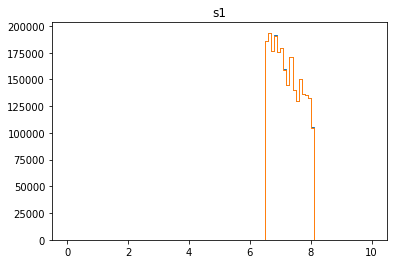

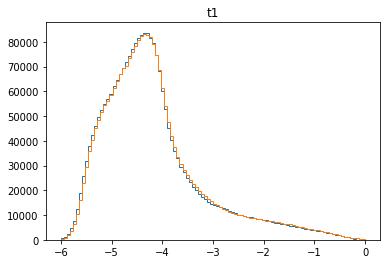

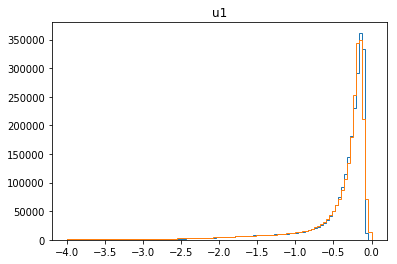

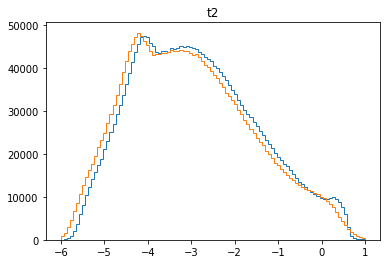

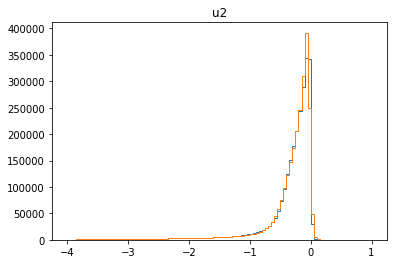

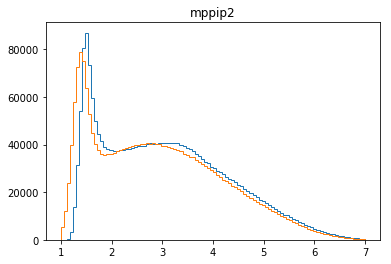

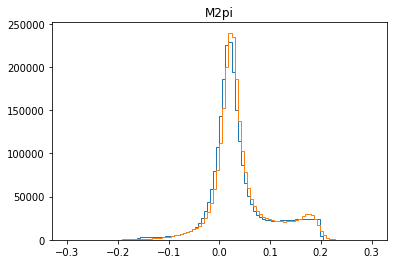

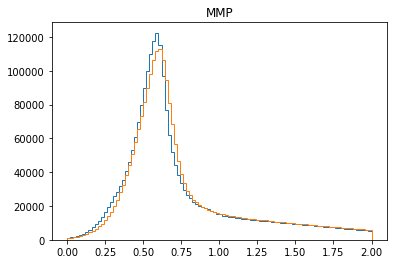

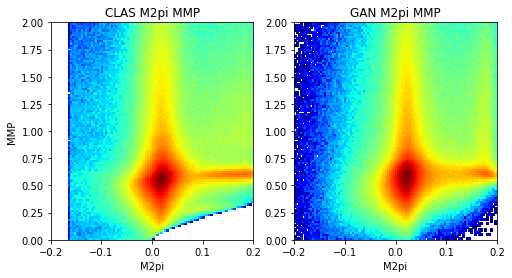

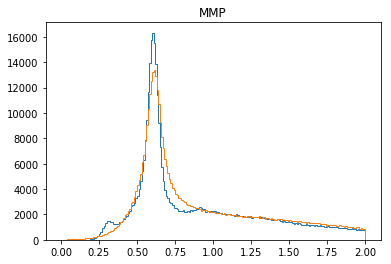

1401 [[-0.49369538, -0.4948025, 0.0011071388], [-0.53061986, -0.5312986, 0.0006787314], [-0.5388836, -0.5397918, 0.0009081849], [-0.49089035, -0.4914083, 0.00051794853], [-0.3940507, -0.3968322, 0.0027815176], [-0.28022555, -0.2804866, 0.00026105347], [-0.16658281, -0.16705394, 0.00047113435], [-0.07047383, -0.070559934, 8.610449e-05], [-0.006869953, -0.007042806, 0.00017285292], [0.010948633, 0.010943315, 5.317565e-06], [-0.041512392, -0.044951435, 0.0034390416], [-0.14915581, -0.14917906, 2.3249537e-05], [-0.26318732, -0.263457, 0.000269691], [-0.36830384, -0.36920467, 0.0009008424], [-0.45160106, -0.453859, 0.0022579394], [-0.5096644, -0.50966567, 1.2663804e-06], [-0.5259547, -0.5289035, 0.0029487312], [-0.48413044, -0.48413268, 2.2361055e-06], [-0.3839917, -0.39155436, 0.007562677], [-0.2806862, -0.28222132, 0.0015351315]]
1402 [[-0.1667438, -0.1702838, 0.003539992], [-0.06616294, -0.06761464, 0.0014517012], [-0.009990826, -0.0101164365, 0.00012560988], [0.001429714, 0.0010082826, 

1411 [[-0.47712123, -0.47863996, 0.001518735], [-0.3516379, -0.3594319, 0.0077939834], [-0.22758825, -0.22825944, 0.00067119935], [-0.10091357, -0.101493426, 0.0005798597], [-0.00025787158, -0.004121798, 0.0038639265], [0.05441174, 0.054402333, 9.406591e-06], [0.041020237, 0.041016422, 3.8146973e-06], [-0.03475299, -0.034853876, 0.0001008839], [-0.14864752, -0.14870882, 6.130367e-05], [-0.26969287, -0.27007195, 0.00037908927], [-0.38106135, -0.38324487, 0.002183519], [-0.47299722, -0.47787663, 0.004879418], [-0.5376429, -0.5438551, 0.006212177], [-0.58324116, -0.58335084, 0.000109689], [-0.57835054, -0.58333176, 0.0049812007], [-0.505009, -0.5052281, 0.00021912681], [-0.38492978, -0.38599193, 0.0010621647], [-0.26698813, -0.26825175, 0.0012636073], [-0.13984218, -0.14573535, 0.0058931666], [-0.04855315, -0.05131138, 0.0027582296]]
1412 [[0.016274797, 0.014349135, 0.0019256624], [0.023666777, 0.0232249, 0.0004418778], [-0.030187206, -0.032516576, 0.0023293705], [-0.1310004, -0.13102788,

1421 [[-0.36946326, -0.3713321, 0.0018688379], [-0.46321005, -0.46334326, 0.00013320312], [-0.53734773, -0.53812563, 0.00077791675], [-0.5877295, -0.58814967, 0.00042017928], [-0.5725653, -0.57299554, 0.00043024778], [-0.49777886, -0.4979029, 0.00012403296], [-0.38668633, -0.38669494, 8.605435e-06], [-0.2571351, -0.2571526, 1.7495946e-05], [-0.12644663, -0.12771717, 0.0012705326], [-0.021317694, -0.024018923, 0.0027012283], [0.0441341, 0.041639704, 0.002494395], [0.047693834, 0.04677643, 0.00091740506], [-0.01337104, -0.013825922, 0.00045488245], [-0.11576455, -0.11621255, 0.0004479931], [-0.22710171, -0.22786617, 0.0007644631], [-0.3366277, -0.33852732, 0.0018996369], [-0.41889882, -0.42985815, 0.010959313], [-0.49205476, -0.4926468, 0.0005920486], [-0.51218575, -0.51229674, 0.00011101139], [-0.474237, -0.4749209, 0.0006839093]]
1422 [[-0.3865334, -0.39214307, 0.005609676], [-0.2886027, -0.28995275, 0.0013500601], [-0.17550506, -0.17742118, 0.0019161326], [-0.08203377, -0.082052544, 1

1431 [[-0.49951884, -0.49952474, 5.8861915e-06], [-0.39745003, -0.3982452, 0.0007951409], [-0.2659461, -0.27047342, 0.004527343], [-0.15399152, -0.15430306, 0.00031154382], [-0.046452362, -0.04645872, 6.3580374e-06], [0.021097979, 0.016804196, 0.0042937826], [0.03310652, 0.030648002, 0.0024585167], [0.0029903287, 0.0017127158, 0.001277613], [-0.08365522, -0.08370449, 4.9266964e-05], [-0.19690947, -0.1969222, 1.2721648e-05], [-0.29880455, -0.3026252, 0.0038206552], [-0.39523637, -0.3963537, 0.0011173164], [-0.46881834, -0.46993184, 0.0011134944], [-0.51468515, -0.515708, 0.0010228753], [-0.53305864, -0.5338244, 0.0007657293], [-0.49844125, -0.49862444, 0.00018318393], [-0.41525176, -0.41560587, 0.0003541134], [-0.31162247, -0.31224984, 0.0006273674], [-0.20033497, -0.20159261, 0.001257648], [-0.09813924, -0.09821686, 7.761685e-05]]
1432 [[-0.030704198, -0.030753976, 4.9777012e-05], [-0.0044887154, -0.0044931252, 4.409962e-06], [-0.045532785, -0.045610167, 7.73818e-05], [-0.13865344, -0.

1441 [[-0.24801059, -0.24801074, 1.4697798e-07], [-0.35942176, -0.36292237, 0.0035006104], [-0.45791304, -0.45859146, 0.00067843334], [-0.53477615, -0.53515816, 0.0003819914], [-0.5873644, -0.5876674, 0.0003030514], [-0.5916765, -0.5919602, 0.00028371345], [-0.5381395, -0.53814405, 4.555336e-06], [-0.44436425, -0.44572148, 0.0013572178], [-0.31393358, -0.3140963, 0.0001627244], [-0.18519431, -0.1865201, 0.0013257817], [-0.06814161, -0.06815284, 1.1230618e-05], [0.020546844, 0.020493088, 5.3755997e-05], [0.07172296, 0.07115444, 0.0005685252], [0.06293486, 0.0629086, 2.6266092e-05], [-0.0022827613, -0.0027440118, 0.00046125057], [-0.109262384, -0.110634685, 0.0013722968], [-0.22180709, -0.22713359, 0.005326487], [-0.32831034, -0.3310782, 0.0027678537], [-0.4149431, -0.41576198, 0.00081887277], [-0.4822249, -0.4822496, 2.4668465e-05]]
1442 [[-0.51048285, -0.51541114, 0.004928303], [-0.5020885, -0.5031013, 0.0010127742], [-0.44980204, -0.45068952, 0.00088749646], [-0.3433296, -0.34612322, 

1451 [[-0.54130316, -0.5414466, 0.00014347606], [-0.49922532, -0.4997613, 0.0005359872], [-0.40242818, -0.4035267, 0.0010985247], [-0.28410476, -0.28777438, 0.0036696203], [-0.16942279, -0.16957036, 0.00014757155], [-0.06652414, -0.066767566, 0.00024342588], [0.004543078, 0.0032328072, 0.0013102707], [0.01374458, 0.01205525, 0.0016893295], [-0.038695917, -0.039424423, 0.00072850817], [-0.12835726, -0.12868565, 0.0003283967], [-0.2446295, -0.24507508, 0.0004455742], [-0.360954, -0.36226344, 0.0013094422], [-0.461537, -0.46157202, 3.5006105e-05], [-0.54834443, -0.54844373, 9.928108e-05], [-0.6024474, -0.6033614, 0.0009140576], [-0.6072784, -0.6078325, 0.0005540652], [-0.54663306, -0.54691374, 0.00028070156], [-0.43110073, -0.4321614, 0.0010606733], [-0.2911419, -0.2987614, 0.007619511], [-0.16960411, -0.1698997, 0.00029559375]]
1452 [[-0.06045749, -0.06056778, 0.0001102891], [0.020588852, 0.020509444, 7.940829e-05], [0.03965186, 0.03962054, 3.131702e-05], [0.0029090047, 0.002306702, 0.00

1461 [[-0.519006, -0.51908857, 8.25318e-05], [-0.40138105, -0.40528157, 0.0039005298], [-0.2705717, -0.27189, 0.0013182919], [-0.1341781, -0.13516124, 0.0009831302], [-0.013591056, -0.014035342, 0.00044428674], [0.07470439, 0.07176352, 0.0029408645], [0.103977785, 0.1038277, 0.00015008455], [0.05380348, 0.052088816, 0.001714667], [-0.056374863, -0.056388896, 1.4032761e-05], [-0.18281716, -0.18318409, 0.00036693327], [-0.29697624, -0.2980997, 0.0011234456], [-0.40286008, -0.40716487, 0.0043047885], [-0.49301124, -0.4953065, 0.0022952515], [-0.5545562, -0.555056, 0.0004997923], [-0.5780695, -0.5788857, 0.0008161459], [-0.56294674, -0.56297165, 2.4896348e-05], [-0.4742136, -0.47421914, 5.5577257e-06], [-0.36300737, -0.36308792, 8.056826e-05], [-0.23595622, -0.23782969, 0.0018734583], [-0.10685805, -0.109875955, 0.0030179042]]
1462 [[-0.012265282, -0.013957748, 0.0016924669], [0.046227634, 0.04417956, 0.002048075], [0.047065645, 0.0456309, 0.0014347457], [-0.02558138, -0.02582048, 0.000239

1471 [[-0.048144158, -0.048590537, 0.00044637974], [0.00829204, 0.0073914267, 0.0009006135], [0.019930795, 0.018104913, 0.0018258813], [-0.041068908, -0.043444905, 0.0023759971], [-0.1475434, -0.14760114, 5.7742935e-05], [-0.25956127, -0.26038867, 0.00082740944], [-0.3614034, -0.3627805, 0.0013771057], [-0.44542405, -0.4454244, 3.6788697e-07], [-0.5074179, -0.5075712, 0.00015327925], [-0.51195437, -0.5153486, 0.0033942235], [-0.4691427, -0.4691433, 6.055925e-07], [-0.36824092, -0.3704296, 0.0021886912], [-0.25587133, -0.2597336, 0.0038622671], [-0.14756808, -0.14769839, 0.00013031322], [-0.06030945, -0.060310405, 9.536743e-07], [-0.004441077, -0.005211458, 0.00077038095], [-0.025624655, -0.026073456, 0.00044880089], [-0.106435455, -0.108651, 0.0022155421], [-0.22538851, -0.2264689, 0.0010803937], [-0.33619127, -0.33710718, 0.0009159037]]
1472 [[-0.42685983, -0.4271167, 0.00025687917], [-0.46224663, -0.46597633, 0.0037297152], [-0.4638836, -0.4661334, 0.0022497897], [-0.41497374, -0.416

1481 [[0.04885575, 0.04851013, 0.00034562254], [-0.010703974, -0.0108610075, 0.000157033], [-0.12611805, -0.12657897, 0.00046092295], [-0.24340631, -0.24343745, 3.1146472e-05], [-0.35712582, -0.35776344, 0.00063763256], [-0.46872336, -0.46926367, 0.0005403235], [-0.55430865, -0.5548026, 0.0004939251], [-0.6029364, -0.604035, 0.001098651], [-0.6083879, -0.6085889, 0.00020099648], [-0.5512519, -0.5513598, 0.000107898515], [-0.4360317, -0.43624544, 0.00021373932], [-0.30103478, -0.30209482, 0.001060052], [-0.15993367, -0.16491811, 0.0049844314], [-0.033799354, -0.038879037, 0.005079684], [0.049691707, 0.047610525, 0.0020811812], [0.086007334, 0.08381882, 0.0021885126], [0.052341126, 0.05219508, 0.00014604628], [-0.027800351, -0.029468892, 0.0016685412], [-0.14775339, -0.14777136, 1.7977905e-05], [-0.26562518, -0.26612115, 0.0004959619]]
1482 [[-0.37435615, -0.37583032, 0.0014741704], [-0.45859924, -0.4636591, 0.005059856], [-0.5284042, -0.53010213, 0.001697964], [-0.5594405, -0.5601298, 0

1491 [[-0.3658496, -0.36667034, 0.0008207295], [-0.24573795, -0.24689722, 0.0011592719], [-0.11823224, -0.11964425, 0.0014120066], [-0.032746203, -0.03291482, 0.00016861617], [0.01889789, 0.018563101, 0.00033478733], [0.0061535393, 0.0057781544, 0.00037538473], [-0.067856915, -0.06837097, 0.0005140492], [-0.18354514, -0.18357104, 2.5895948e-05], [-0.2992451, -0.29947758, 0.00023248151], [-0.41260612, -0.41365862, 0.0010524894], [-0.5054526, -0.50749046, 0.0020379017], [-0.55855584, -0.55875725, 0.00020137522], [-0.5706553, -0.57070726, 5.1953397e-05], [-0.51837665, -0.51840705, 3.04058e-05], [-0.41717228, -0.41780722, 0.0006349384], [-0.28222233, -0.2827562, 0.0005338697], [-0.13841648, -0.13923056, 0.0008140766], [-0.0105038285, -0.012094759, 0.001590931], [0.079546474, 0.078608155, 0.00093832065], [0.1269491, 0.124652386, 0.0022967134]]
1492 [[0.088480756, 0.08622209, 0.0022586645], [-0.016537637, -0.016537933, 2.9549483e-07], [-0.15063113, -0.15071596, 8.48349e-05], [-0.277769, -0.2

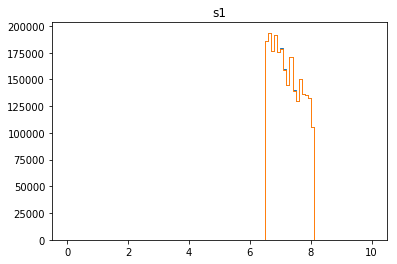

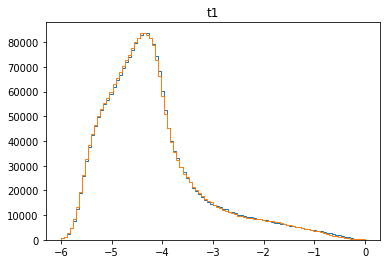

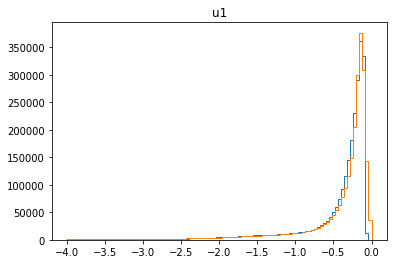

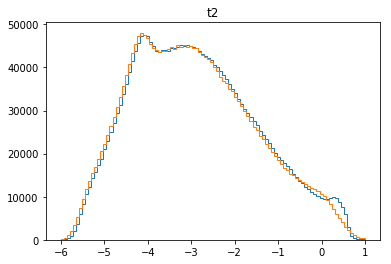

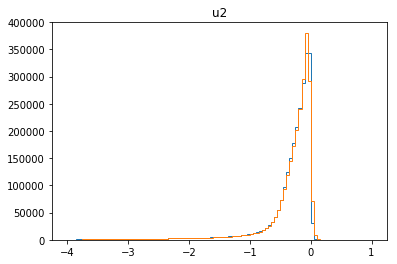

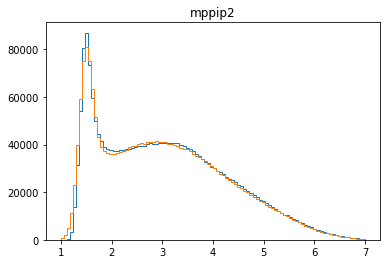

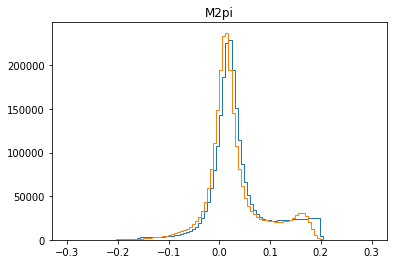

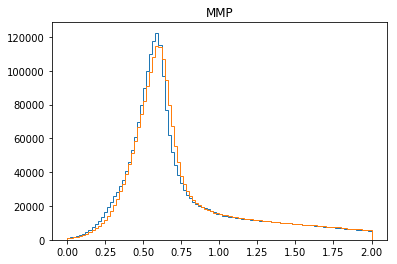

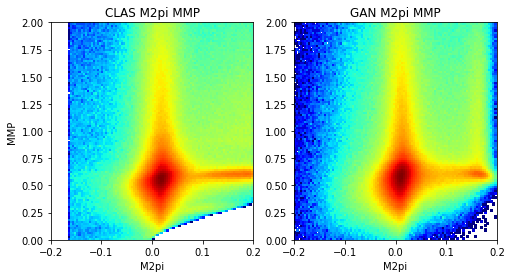

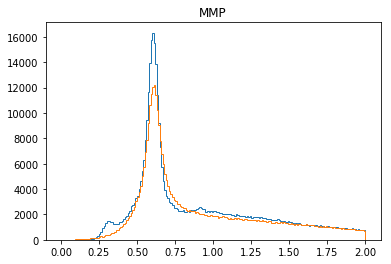

1501 [[-0.1484669, -0.14945745, 0.0009905597], [-0.033729665, -0.03437493, 0.00064526504], [0.06266848, 0.061805584, 0.00086289516], [0.103502885, 0.10344621, 5.6675373e-05], [0.08308518, 0.083056144, 2.9033343e-05], [-0.01780544, -0.017879536, 7.4095326e-05], [-0.13758136, -0.13758571, 4.354064e-06], [-0.26011017, -0.26135352, 0.001243349], [-0.37589377, -0.37706697, 0.0011732108], [-0.46100697, -0.46124366, 0.00023668821], [-0.51036733, -0.5258074, 0.01544006], [-0.5645588, -0.5645845, 2.5682852e-05], [-0.54587305, -0.55047125, 0.0045982045], [-0.4684239, -0.46977678, 0.0013528648], [-0.35147887, -0.3570452, 0.005566331], [-0.22936141, -0.23152271, 0.002161294], [-0.09672123, -0.0995883, 0.0028670668], [0.013619192, 0.009520368, 0.0040988247], [0.080397524, 0.08005994, 0.00033758514], [0.09005468, 0.08963568, 0.00041900727]]
1502 [[0.017176077, 0.015941322, 0.001234755], [-0.09682414, -0.09692055, 9.641337e-05], [-0.22230577, -0.22797303, 0.00566725], [-0.347979, -0.3485143, 0.000535

1511 [[-0.28375077, -0.28494868, 0.0011979038], [-0.3961128, -0.3988174, 0.0027046], [-0.49368632, -0.49438256, 0.0006962347], [-0.55733794, -0.5576199, 0.00028198122], [-0.5632976, -0.5643886, 0.0010909515], [-0.5004231, -0.50079054, 0.00036744494], [-0.3762698, -0.37638673, 0.00011695703], [-0.23601538, -0.24081783, 0.0048024477], [-0.111848764, -0.11276571, 0.00091694307], [0.008561032, 0.006473756, 0.0020872764], [0.07372103, 0.07236339, 0.0013576397], [0.09180972, 0.08738928, 0.0044204365], [0.018340481, 0.018331842, 8.63904e-06], [-0.09767446, -0.09783777, 0.00016330887], [-0.23089013, -0.23190399, 0.0010138669], [-0.3453613, -0.34620214, 0.0008408505], [-0.44255218, -0.4433999, 0.0008477227], [-0.5255088, -0.52552205, 1.321618e-05], [-0.5591349, -0.5598389, 0.0007040068], [-0.52900326, -0.5291046, 0.0001013058]]
1512 [[-0.4429679, -0.44343978, 0.0004718798], [-0.32580933, -0.327488, 0.0016786848], [-0.20710659, -0.2073925, 0.00028590235], [-0.09687686, -0.09782385, 0.0009469875]

1521 [[-0.51134044, -0.51134235, 1.8964201e-06], [-0.5540218, -0.55681616, 0.0027944085], [-0.56819826, -0.5687958, 0.0005975375], [-0.50934017, -0.51140136, 0.0020612162], [-0.40510902, -0.40601686, 0.00090784027], [-0.28672656, -0.29050207, 0.0037755172], [-0.16189973, -0.16197571, 7.5978816e-05], [-0.053731225, -0.05717049, 0.0034392648], [0.0054379916, 0.0052065556, 0.00023143576], [0.0095220115, 0.009425298, 9.6713266e-05], [-0.055464484, -0.05573757, 0.00027308453], [-0.16265951, -0.16428271, 0.0016231972], [-0.28261006, -0.28312653, 0.0005164738], [-0.38708964, -0.38709024, 5.908405e-07], [-0.4577318, -0.45795572, 0.00022389586], [-0.50202155, -0.50270444, 0.000682912], [-0.491741, -0.49369827, 0.0019572615], [-0.43038806, -0.430826, 0.0004379573], [-0.31737265, -0.3179714, 0.00059875037], [-0.19188061, -0.1923372, 0.0004565926]]
1522 [[-0.088677205, -0.089994945, 0.0013177381], [-0.021289349, -0.022891559, 0.0016022103], [-0.001251113, -0.00202786, 0.0007767469], [-0.046706416,

1531 [[-0.5876147, -0.5880864, 0.000471714], [-0.6093018, -0.6098388, 0.0005369591], [-0.56362545, -0.56393826, 0.00031282444], [-0.46325082, -0.46339384, 0.0001430195], [-0.3352466, -0.33917433, 0.003927737], [-0.1938473, -0.1940433, 0.00019599829], [-0.06785857, -0.06800814, 0.00014957094], [0.03995139, 0.039330598, 0.00062079175], [0.11344301, 0.11343392, 9.093351e-06], [0.11997759, 0.11969401, 0.00028358496], [0.053272773, 0.05318113, 9.1642e-05], [-0.057955377, -0.057956584, 1.206994e-06], [-0.18370765, -0.18390019, 0.00019254227], [-0.2990269, -0.29964334, 0.0006164275], [-0.4068958, -0.40715975, 0.00026395838], [-0.48263174, -0.4828619, 0.00023016082], [-0.54127, -0.5414023, 0.00013228017], [-0.53894293, -0.5392011, 0.0002581647], [-0.48342103, -0.48885944, 0.005438432], [-0.38629648, -0.38699463, 0.00069814856]]
1532 [[-0.26017138, -0.26432166, 0.004150272], [-0.14392535, -0.14424975, 0.0003243995], [-0.03393499, -0.03710309, 0.0031680984], [0.038058564, 0.03585235, 0.002206215

1541 [[-0.42812163, -0.42870295, 0.0005813304], [-0.3123956, -0.3139579, 0.0015623035], [-0.17569277, -0.18019678, 0.004504017], [-0.058926832, -0.059029255, 0.00010242234], [0.022320123, 0.019950073, 0.0023700506], [0.058600318, 0.05826168, 0.00033863727], [0.011176704, 0.010577767, 0.00059893704], [-0.103533246, -0.107151285, 0.0036180397], [-0.23325674, -0.23402596, 0.0007692167], [-0.35239592, -0.35302156, 0.0006256486], [-0.44832915, -0.4504283, 0.0020991443], [-0.5150606, -0.5153748, 0.0003141753], [-0.52581465, -0.52765244, 0.0018377997], [-0.474532, -0.47477046, 0.00023845212], [-0.36873478, -0.36900994, 0.00027516874], [-0.2416086, -0.24203129, 0.00042268526], [-0.11854205, -0.11854411, 2.0572916e-06], [-0.020343402, -0.02035899, 1.5588375e-05], [0.036011923, 0.03487527, 0.0011366537], [0.016591594, 0.01659149, 1.0390431e-07]]
1542 [[-0.06952659, -0.070353344, 0.00082675123], [-0.18416235, -0.18433969, 0.00017734537], [-0.29943252, -0.30070278, 0.0012702607], [-0.413954, -0.41

1551 [[-0.4628868, -0.4635415, 0.00065469876], [-0.36108708, -0.36186638, 0.0007793005], [-0.23807338, -0.23814966, 7.627838e-05], [-0.11402433, -0.114794396, 0.0007700634], [-0.010341967, -0.011297191, 0.00095522276], [0.055937484, 0.05461392, 0.0013235603], [0.06256361, 0.062263347, 0.00030026864], [0.0050661606, 0.0050643575, 1.8030405e-06], [-0.09571467, -0.096874595, 0.0011599213], [-0.21362862, -0.2141425, 0.0005138762], [-0.3317239, -0.33285156, 0.0011276689], [-0.42341387, -0.42387727, 0.00046338318], [-0.49210516, -0.4989825, 0.006877321], [-0.5386345, -0.53993577, 0.0013013107], [-0.5185695, -0.5211407, 0.0025711858], [-0.44989508, -0.45279184, 0.002896761], [-0.33616966, -0.3364147, 0.00024503548], [-0.19838895, -0.20192078, 0.003531826], [-0.06440254, -0.06502239, 0.0006198418], [0.04516937, 0.043396078, 0.0017732894]]
1552 [[0.12466689, 0.12119017, 0.0034767268], [0.13145418, 0.13134736, 0.00010683129], [0.06636854, 0.06636508, 3.4654513e-06], [-0.04037126, -0.041757725, 0

1561 [[-0.114725694, -0.115050435, 0.00032474313], [-0.2430002, -0.24850975, 0.0055095553], [-0.36241052, -0.362991, 0.0005805029], [-0.45828176, -0.4594427, 0.0011609609], [-0.52420706, -0.52442414, 0.00021709867], [-0.54353744, -0.54398793, 0.00045049962], [-0.493847, -0.49445146, 0.0006044578], [-0.38820788, -0.38843855, 0.00023068194], [-0.2444758, -0.24482682, 0.00035103344], [-0.10415666, -0.10507141, 0.00091474946], [0.00810707, 0.0080964565, 1.0612945e-05], [0.10043629, 0.10033834, 9.7955206e-05], [0.12029913, 0.12024043, 5.870348e-05], [0.08048678, 0.0802048, 0.00028198122], [-0.020755926, -0.025907913, 0.005151987], [-0.15045296, -0.15152946, 0.0010765101], [-0.26760554, -0.268629, 0.0010234856], [-0.37559536, -0.38251767, 0.006922315], [-0.47010612, -0.47015795, 5.1816005e-05], [-0.5259253, -0.52632415, 0.0003988746]]
1562 [[-0.53701025, -0.5385875, 0.0015772664], [-0.4901991, -0.49041462, 0.00021552773], [-0.37726948, -0.37785727, 0.0005877865], [-0.23660898, -0.23686905, 0

1571 [[-0.30837008, -0.3088889, 0.0005188171], [-0.4170124, -0.41823298, 0.0012205875], [-0.5037661, -0.5061873, 0.0024212091], [-0.54930675, -0.54951674, 0.0002099638], [-0.5353082, -0.5353712, 6.301796e-05], [-0.4638086, -0.46382844, 1.9835077e-05], [-0.33578077, -0.34089804, 0.005117272], [-0.21205562, -0.21297638, 0.0009207589], [-0.09686998, -0.09727383, 0.00040384222], [-0.0020976074, -0.0021853836, 8.777622e-05], [0.044649813, 0.044634614, 1.5199243e-05], [0.025685018, 0.02110542, 0.004579598], [-0.06504224, -0.06508633, 4.4082703e-05], [-0.18279773, -0.18306743, 0.000269691], [-0.29584968, -0.3001175, 0.004267826], [-0.4036063, -0.4092569, 0.005650607], [-0.48227006, -0.4822732, 3.1262207e-06], [-0.5107599, -0.51146734, 0.0007074525], [-0.48669752, -0.48682624, 0.00012870699], [-0.39665607, -0.39702865, 0.00037258147]]
1572 [[-0.27620852, -0.277, 0.0007914877], [-0.14662606, -0.14790858, 0.0012825263], [-0.026277436, -0.026296865, 1.9429428e-05], [0.057533827, 0.050655242, 0.00

1581 [[-0.60495096, -0.60518336, 0.00023242338], [-0.61063594, -0.61125976, 0.00062383706], [-0.55309576, -0.5546656, 0.0015698515], [-0.44230348, -0.44294196, 0.00063849986], [-0.3010059, -0.30322325, 0.0022173387], [-0.16148184, -0.16266736, 0.0011855252], [-0.02692532, -0.030228376, 0.0033030573], [0.06156113, 0.061263632, 0.00029749883], [0.09033204, 0.08958227, 0.0007497683], [0.0457223, 0.04557062, 0.00015167768], [-0.07158252, -0.071639456, 5.693414e-05], [-0.20055914, -0.20137376, 0.000814621], [-0.32417488, -0.3242458, 7.094443e-05], [-0.42313138, -0.42372054, 0.00058917457], [-0.5003059, -0.50651926, 0.00621338], [-0.55513215, -0.5554663, 0.00033415944], [-0.5581052, -0.5589931, 0.0008879509], [-0.50245184, -0.50248146, 2.9611727e-05], [-0.40773463, -0.40827718, 0.00054254255], [-0.28212118, -0.28251868, 0.00039750448]]
1582 [[-0.15598094, -0.15807834, 0.0020973969], [-0.04493763, -0.046193656, 0.0012560252], [0.03298856, 0.030972641, 0.0020159187], [0.05930057, 0.058956437, 

1591 [[0.16517636, 0.16513461, 4.17587e-05], [0.13171229, 0.13136794, 0.0003443472], [0.021113573, 0.021093618, 1.9954185e-05], [-0.10590219, -0.10669121, 0.0007890213], [-0.23789515, -0.23823653, 0.0003413806], [-0.35804716, -0.35983106, 0.0017839074], [-0.45974958, -0.46150044, 0.0017508713], [-0.5443134, -0.54439825, 8.4870044e-05], [-0.5921992, -0.59432644, 0.0021272018], [-0.58067816, -0.5814438, 0.0007656237], [-0.5144041, -0.5144046, 4.533249e-07], [-0.38805366, -0.38806707, 1.3411045e-05], [-0.23855999, -0.23870102, 0.00014101925], [-0.08775276, -0.096005596, 0.008252834], [0.039817918, 0.03925782, 0.0005600977], [0.13337886, 0.13332072, 5.814946e-05], [0.18538105, 0.18440151, 0.0009795451], [0.16848014, 0.16765141, 0.00082872674], [0.08398965, 0.078008, 0.0059816437], [-0.06569194, -0.06578155, 8.960839e-05]]
1592 [[-0.20439486, -0.20467314, 0.0002782781], [-0.32913744, -0.32913846, 1.0219082e-06], [-0.428663, -0.428962, 0.000299014], [-0.5037828, -0.5063349, 0.0025520718], [-

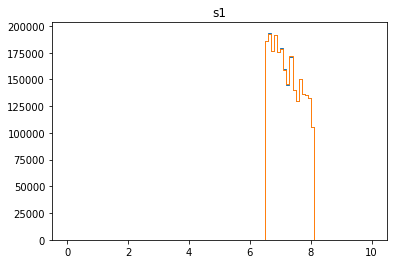

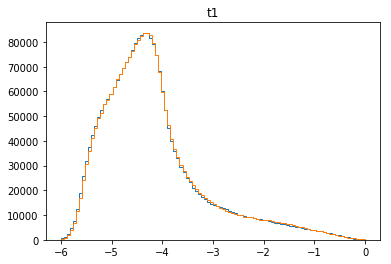

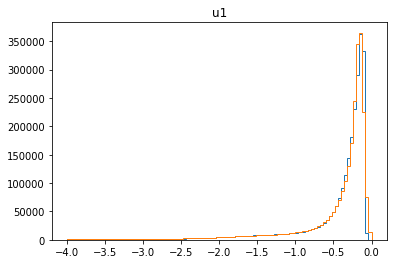

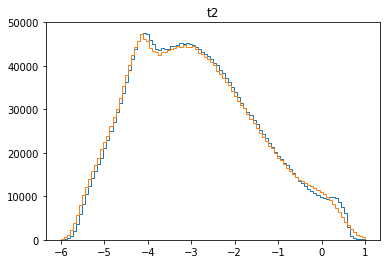

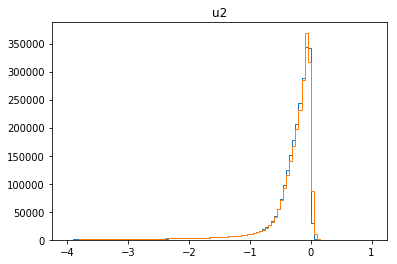

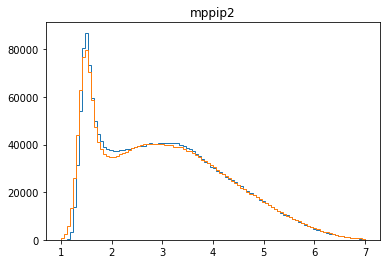

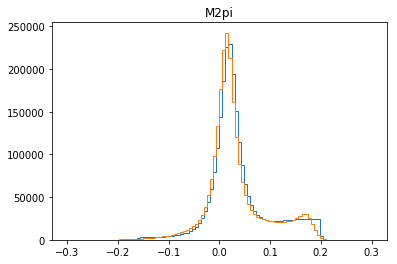

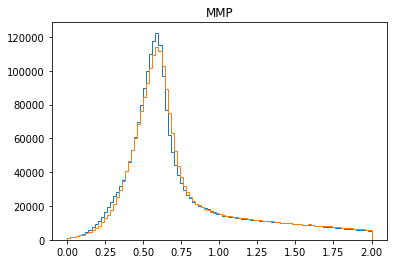

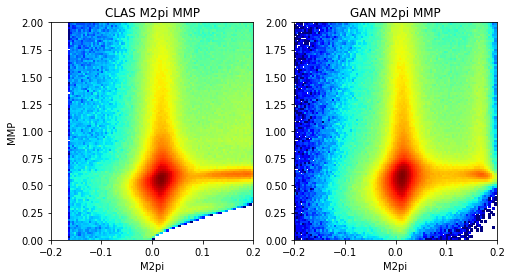

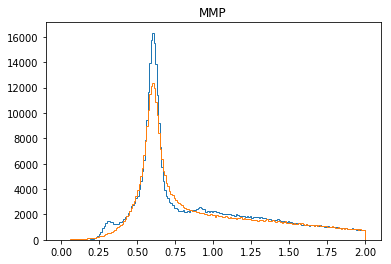

1601 [[0.07652136, 0.07558315, 0.0009382038], [0.099530414, 0.09894614, 0.0005842773], [0.041076418, 0.041046266, 3.01539e-05], [-0.074518815, -0.07624725, 0.0017284373], [-0.19674046, -0.20028386, 0.0035433972], [-0.32497805, -0.32586032, 0.0008822765], [-0.42900982, -0.42929378, 0.00028397053], [-0.5012597, -0.5020589, 0.00079923373], [-0.53543, -0.539199, 0.0037689568], [-0.5238497, -0.5239225, 7.278768e-05], [-0.42522922, -0.42576107, 0.00053184445], [-0.30254593, -0.30278558, 0.00023963166], [-0.16892143, -0.1709657, 0.002044279], [-0.057503056, -0.05806081, 0.00055775285], [0.029484173, 0.028802058, 0.0006821147], [0.07103345, 0.07022751, 0.000805934], [0.030802602, 0.030789036, 1.3565153e-05], [-0.06717224, -0.071963854, 0.004791615], [-0.19280386, -0.19648018, 0.003676325], [-0.3198453, -0.32114235, 0.0012970482]]
1602 [[-0.41907373, -0.42466512, 0.005591405], [-0.5024906, -0.50249135, 7.798699e-07], [-0.53914493, -0.5399077, 0.0007627765], [-0.50017864, -0.500455, 0.0002763723

1611 [[0.0318441, 0.030937297, 0.000906806], [0.06588327, 0.065583065, 0.00030020258], [0.013502371, 0.013326698, 0.00017567289], [-0.09388514, -0.095503725, 0.0016185901], [-0.2229362, -0.22346033, 0.000524131], [-0.34459648, -0.34461778, 2.1323074e-05], [-0.44820613, -0.44852635, 0.0003202219], [-0.5189386, -0.52246094, 0.0035223116], [-0.5474689, -0.5479549, 0.00048598798], [-0.4883116, -0.4883404, 2.8807684e-05], [-0.38109767, -0.38110426, 6.5811946e-06], [-0.24005623, -0.24606386, 0.006007633], [-0.10942609, -0.10999498, 0.0005688891], [0.0023328539, -7.2239476e-05, 0.0024050933], [0.050798815, 0.050230745, 0.00056807045], [0.03303436, 0.032950085, 8.4273655e-05], [-0.04648604, -0.05053592, 0.0040498823], [-0.15881118, -0.15881239, 1.2028067e-06], [-0.27617216, -0.27618423, 1.2063687e-05], [-0.37421298, -0.3753308, 0.0011178267]]
1612 [[-0.44793466, -0.4484907, 0.0005560424], [-0.48428285, -0.48437175, 8.888763e-05], [-0.4645206, -0.4645233, 2.678149e-06], [-0.39521632, -0.3953079

1621 [[-0.25640684, -0.2573053, 0.0008984397], [-0.116217226, -0.12785195, 0.011634725], [-0.008721797, -0.014577831, 0.005856035], [0.043040436, 0.04054642, 0.0024940148], [0.031011846, 0.030817287, 0.00019455902], [-0.03488538, -0.03796394, 0.0030785599], [-0.15793929, -0.15818022, 0.00024093257], [-0.2731629, -0.2795181, 0.0063552056], [-0.3974065, -0.3985616, 0.0011551193], [-0.4635638, -0.46412635, 0.0005625378], [-0.47697073, -0.4770559, 8.518661e-05], [-0.4134368, -0.41528606, 0.0018492651], [-0.29850233, -0.29850304, 7.0751776e-07], [-0.16959456, -0.17111017, 0.0015156146], [-0.046659358, -0.049666584, 0.003007226], [0.03474172, 0.031862177, 0.0028795402], [0.05908695, 0.057728607, 0.0013583425], [-0.007861708, -0.008484403, 0.0006226943], [-0.13534388, -0.1355853, 0.00024140652], [-0.25696856, -0.2584245, 0.0014559192]]
1622 [[-0.3661582, -0.3685954, 0.0024371897], [-0.45365205, -0.45384726, 0.00019519805], [-0.5115833, -0.5119575, 0.00037420308], [-0.52657855, -0.5265805, 1.9

1631 [[-0.44624427, -0.44663557, 0.00039129241], [-0.31658858, -0.31795564, 0.0013670734], [-0.16950764, -0.17005919, 0.0005515538], [-0.022917213, -0.023873143, 0.00095593015], [0.09145036, 0.09134821, 0.00010215227], [0.15881151, 0.15697715, 0.0018343674], [0.1431704, 0.14246559, 0.00070481683], [0.054700594, 0.05434899, 0.00035160533], [-0.07048247, -0.075048655, 0.0045661842], [-0.21893916, -0.21921268, 0.000273526], [-0.3451513, -0.34935063, 0.004199321], [-0.45023772, -0.45263964, 0.0024019135], [-0.51579887, -0.51697916, 0.0011802773], [-0.55958986, -0.5599603, 0.00037044915], [-0.53839016, -0.53999466, 0.0016045014], [-0.45121342, -0.45121825, 4.8363627e-06], [-0.3134574, -0.31411856, 0.0006611567], [-0.18711697, -0.18802987, 0.00091290456], [-0.04445027, -0.047288403, 0.002838135], [0.06739419, 0.06733967, 5.4513814e-05]]
1632 [[0.12744708, 0.12601176, 0.0014353237], [0.1254768, 0.12443272, 0.0010440907], [0.03256146, 0.0319982, 0.000563262], [-0.09495228, -0.09541001, 0.00045

1641 [[0.13639165, 0.13358918, 0.0028024807], [0.039688546, 0.036114655, 0.0035738912], [-0.10224672, -0.10235813, 0.00011141366], [-0.23487185, -0.23649181, 0.0016199716], [-0.3662122, -0.36805212, 0.0018399263], [-0.46997687, -0.47308472, 0.0031078383], [-0.549859, -0.54989886, 3.9882143e-05], [-0.6014943, -0.6019337, 0.00043939546], [-0.5808883, -0.58143324, 0.0005449442], [-0.5000252, -0.5006408, 0.00061557535], [-0.35509306, -0.35736498, 0.0022719179], [-0.19655962, -0.2046007, 0.008041084], [-0.056511614, -0.056529064, 1.7448112e-05], [0.080865905, 0.08081085, 5.5050255e-05], [0.16903666, 0.1686098, 0.00042685214], [0.18643363, 0.18532039, 0.0011132398], [0.119511575, 0.1170208, 0.0024907773], [-0.018073192, -0.01873376, 0.0006605684], [-0.17101312, -0.1736327, 0.002619576], [-0.30614814, -0.30737942, 0.0012312726]]
1642 [[-0.42749238, -0.4277981, 0.0003057135], [-0.53258955, -0.5329606, 0.00037103673], [-0.60038304, -0.6014509, 0.0010678911], [-0.63689816, -0.6369323, 3.417599e-

1651 [[0.13324553, 0.13316731, 7.822298e-05], [0.08968586, 0.08881724, 0.0008686196], [-0.019283855, -0.019343527, 5.9671944e-05], [-0.1599475, -0.16108416, 0.0011366537], [-0.2883734, -0.2915967, 0.0032233028], [-0.40197754, -0.40198314, 5.593756e-06], [-0.4975223, -0.49770045, 0.00017815911], [-0.5606715, -0.56267065, 0.0019991691], [-0.5668929, -0.57035416, 0.0034612243], [-0.5087577, -0.5087604, 2.6906494e-06], [-0.39045107, -0.39052188, 7.081597e-05], [-0.24345703, -0.24367729, 0.00022025764], [-0.0842006, -0.0842689, 6.830265e-05], [0.060160693, 0.059915658, 0.00024503548], [0.17535244, 0.17354931, 0.0018031324], [0.22598521, 0.2253443, 0.000640912], [0.18763924, 0.18749899, 0.0001402502], [0.071806364, 0.070310436, 0.0014959269], [-0.07843046, -0.078791425, 0.00036096576], [-0.22748686, -0.2306728, 0.0031859442]]
1652 [[-0.3658898, -0.3665835, 0.0006937205], [-0.47372386, -0.47603247, 0.0023086122], [-0.5644348, -0.5662976, 0.0018627408], [-0.6111697, -0.611174, 4.2906177e-06], 

1661 [[-0.45562258, -0.45623854, 0.0006159541], [-0.53279585, -0.5334731, 0.00067724154], [-0.55944616, -0.5596809, 0.00023469703], [-0.5156437, -0.5173265, 0.0016827509], [-0.40724766, -0.40733942, 9.175158e-05], [-0.26167917, -0.26239425, 0.0007150826], [-0.111357436, -0.11379067, 0.0024332367], [0.013473881, 0.012824054, 0.00064982753], [0.111580774, 0.11001304, 0.0015677363], [0.13494977, 0.13467099, 0.00027878743], [0.07995018, 0.07803455, 0.0019156314], [-0.02541712, -0.027571147, 0.0021540285], [-0.15827402, -0.16944964, 0.0111756185], [-0.31270945, -0.31275013, 4.06811e-05], [-0.42982188, -0.4298598, 3.790768e-05], [-0.5098078, -0.5103526, 0.000544766], [-0.55431294, -0.5568648, 0.0025518795], [-0.51185894, -0.5199899, 0.008130957], [-0.429302, -0.42944068, 0.00013867348], [-0.29037407, -0.29042718, 5.3114643e-05]]
1662 [[-0.14454463, -0.14582825, 0.0012836196], [-0.004653759, -0.0053007696, 0.0006470106], [0.097355634, 0.095470436, 0.0018851996], [0.13618004, 0.13587952, 0.000

1671 [[-0.3322383, -0.33263952, 0.00040123996], [-0.44494426, -0.44501883, 7.455575e-05], [-0.52247256, -0.52336437, 0.0008918201], [-0.54296017, -0.54386616, 0.00090600207], [-0.49122998, -0.49326822, 0.0020382465], [-0.3851906, -0.38520873, 1.812377e-05], [-0.24084932, -0.24126327, 0.00041394704], [-0.08605712, -0.091388896, 0.005331779], [0.026338672, 0.02485761, 0.0014810624], [0.1041535, 0.10060079, 0.0035527137], [0.0787224, 0.07805249, 0.00066991517], [-0.009244737, -0.010015224, 0.00077048683], [-0.13991256, -0.13992517, 1.26130335e-05], [-0.2751802, -0.27589732, 0.00071712415], [-0.40067342, -0.40221664, 0.0015432133], [-0.49347064, -0.4934966, 2.5954218e-05], [-0.555736, -0.55573624, 2.328634e-07], [-0.5576486, -0.5579358, 0.00028719378], [-0.48093152, -0.48252535, 0.0015938231], [-0.35713705, -0.3574196, 0.00028255803]]
1672 [[-0.21321878, -0.21367334, 0.00045455707], [-0.06250153, -0.06291006, 0.00040853195], [0.058132134, 0.05534196, 0.0027901758], [0.11736769, 0.11732034,

1681 [[-0.30348137, -0.30368847, 0.00020709932], [-0.15195554, -0.15202649, 7.094443e-05], [-0.005758704, -0.007351766, 0.0015930617], [0.10885529, 0.10854523, 0.0003100643], [0.15834059, 0.15830192, 3.8662984e-05], [0.13047962, 0.1283137, 0.0021659073], [0.033636957, 0.032919426, 0.00071753294], [-0.09882929, -0.10299087, 0.004161584], [-0.24816959, -0.24929431, 0.0011247245], [-0.36615846, -0.36645254, 0.0002940872], [-0.45716566, -0.45833912, 0.0011734721], [-0.5238816, -0.52388704, 5.4058955e-06], [-0.53031707, -0.5303235, 6.464285e-06], [-0.46593383, -0.47052556, 0.004591739], [-0.3515392, -0.35184404, 0.00030484702], [-0.20413795, -0.20484449, 0.0007065395], [-0.061066203, -0.061079893, 1.3691897e-05], [0.056570586, 0.055141326, 0.0014292599], [0.12377207, 0.123463884, 0.00030818634], [0.11959083, 0.118591726, 0.0009991024]]
1682 [[0.029839776, 0.029830774, 9.0015565e-06], [-0.09726327, -0.0972666, 3.3318395e-06], [-0.22799656, -0.22805163, 5.5078566e-05], [-0.36039436, -0.360402

1691 [[-0.4614546, -0.46559677, 0.0041421666], [-0.5446859, -0.5450634, 0.00037745698], [-0.57887375, -0.5790281, 0.00015436743], [-0.5293401, -0.52975416, 0.0004141023], [-0.4224127, -0.4224348, 2.2123118e-05], [-0.28909922, -0.28975293, 0.00065372314], [-0.12101099, -0.1259551, 0.004944116], [0.02582931, 0.019239953, 0.006589357], [0.12644635, 0.12628426, 0.0001620924], [0.17123881, 0.17079677, 0.00044203823], [0.12844467, 0.12679942, 0.0016452497], [0.017222025, 0.01722143, 5.9377635e-07], [-0.13620125, -0.13666135, 0.00046010438], [-0.27044266, -0.27234462, 0.0019019655], [-0.3983824, -0.3993458, 0.0009633751], [-0.49686778, -0.49840993, 0.0015421645], [-0.556385, -0.5565255, 0.00014052137], [-0.55383986, -0.554734, 0.00089410006], [-0.48238373, -0.48242563, 4.1906733e-05], [-0.35811687, -0.35812816, 1.1281813e-05]]
1692 [[-0.21719599, -0.21722229, 2.6305208e-05], [-0.06046448, -0.06766664, 0.0072021647], [0.05017289, 0.04954829, 0.0006245995], [0.10661079, 0.10459487, 0.0020159187

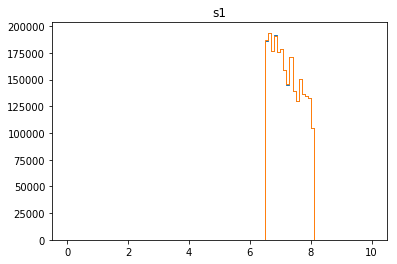

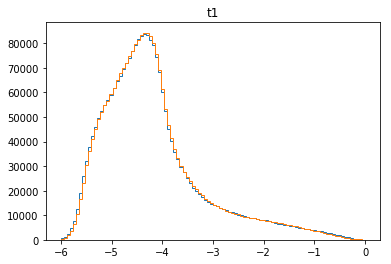

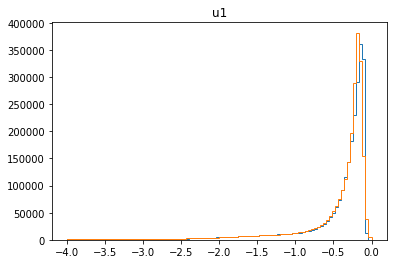

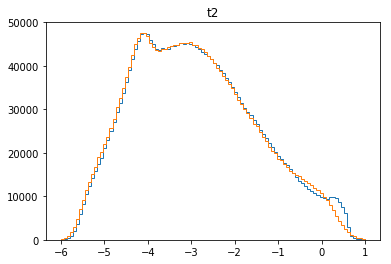

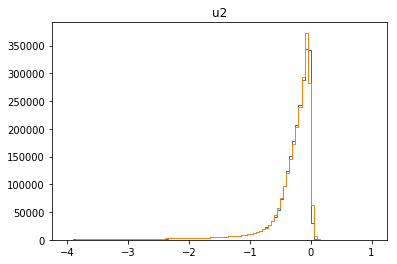

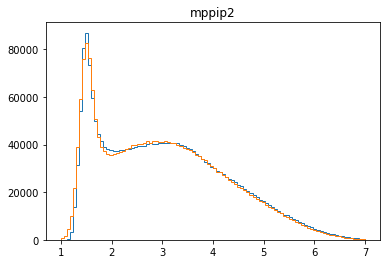

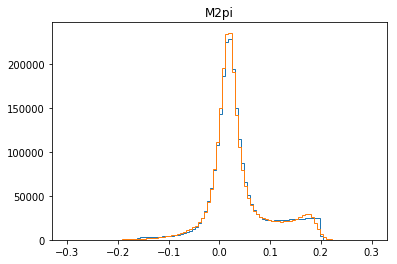

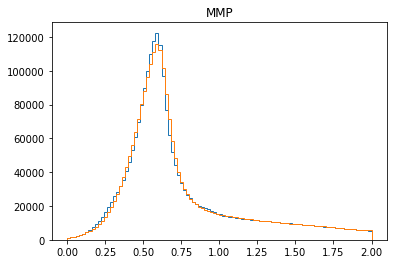

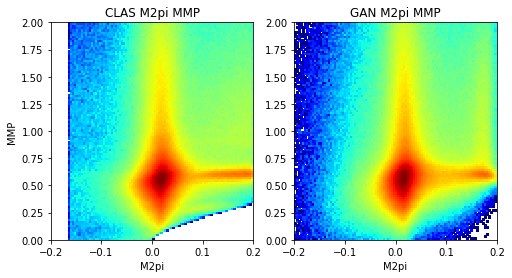

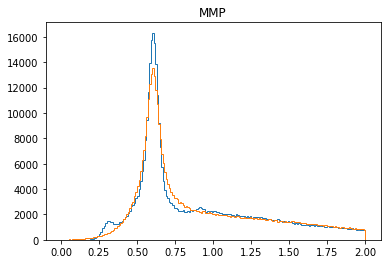

1701 [[-0.50374955, -0.50460416, 0.00085462286], [-0.39051044, -0.3905192, 8.77411e-06], [-0.2578528, -0.25913805, 0.0012852601], [-0.11342104, -0.12149739, 0.008076355], [-0.009565719, -0.009677375, 0.0001116554], [0.045019224, 0.042499427, 0.002519799], [0.018438023, 0.016054582, 0.0023834407], [-0.07365851, -0.0736847, 2.6187954e-05], [-0.20833494, -0.20834143, 6.493414e-06], [-0.33462387, -0.33618167, 0.0015577835], [-0.4343232, -0.43547183, 0.001148646], [-0.48931032, -0.49310815, 0.0037978173], [-0.50135875, -0.5049931, 0.00363435], [-0.43850642, -0.43857917, 7.275515e-05], [-0.32258633, -0.32270753, 0.000121202844], [-0.18197712, -0.18493207, 0.0029549478], [-0.04747874, -0.048819285, 0.0013405456], [0.041260056, 0.04085114, 0.00040891758], [0.08330118, 0.07889139, 0.00440979], [0.029952602, 0.029158, 0.0007946032]]
1702 [[-0.0862803, -0.08633409, 5.3783973e-05], [-0.22259982, -0.22513631, 0.002536486], [-0.34650084, -0.34655035, 4.9508242e-05], [-0.45341158, -0.45355958, 0.0001

1711 [[-0.5519216, -0.5522122, 0.00029056522], [-0.4925077, -0.49427408, 0.0017663885], [-0.37054038, -0.37591878, 0.005378397], [-0.22896741, -0.22900632, 3.8900544e-05], [-0.081732, -0.08402396, 0.0022919627], [0.037618052, 0.03704579, 0.00057226047], [0.13253404, 0.13215984, 0.00037420308], [0.1470127, 0.14641142, 0.0006012733], [0.06837151, 0.06741511, 0.000956402], [-0.03616314, -0.053466994, 0.017303854], [-0.1900756, -0.19029264, 0.00021704244], [-0.31594223, -0.31883243, 0.0028901945], [-0.43585643, -0.43585652, 8.076677e-08], [-0.5123728, -0.5135603, 0.001187496], [-0.54585654, -0.5466772, 0.0008206202], [-0.50853103, -0.5088441, 0.00031302686], [-0.41036767, -0.41173473, 0.0013670734], [-0.27040216, -0.27086636, 0.0004642047], [-0.11612672, -0.11841449, 0.0022877643], [0.013951069, 0.01318365, 0.0007674192]]
1712 [[0.11361867, 0.11361684, 1.8339051e-06], [0.15615804, 0.15531553, 0.00084251055], [0.107931025, 0.10774426, 0.00018676372], [-0.015187807, -0.015189903, 2.0957705e-

1721 [[-0.49019927, -0.49020275, 3.4867878e-06], [-0.5522817, -0.55229133, 9.65389e-06], [-0.5726309, -0.5733682, 0.00073728623], [-0.52049315, -0.52083933, 0.00034619012], [-0.40716162, -0.40868944, 0.0015278168], [-0.25876594, -0.25921232, 0.00044637974], [-0.10053253, -0.10187531, 0.0013427814], [0.033660725, 0.03331411, 0.0003466162], [0.13156737, 0.13123384, 0.0003335321], [0.17329928, 0.16865362, 0.004645664], [0.1340288, 0.13384983, 0.0001789747], [0.008946971, 0.008945834, 1.1367993e-06], [-0.13564865, -0.13573338, 8.4729545e-05], [-0.2835648, -0.28384492, 0.00028012664], [-0.3951957, -0.40053108, 0.0053353994], [-0.49090636, -0.4914271, 0.0005207304], [-0.5257478, -0.53063357, 0.004885815], [-0.50727654, -0.50890607, 0.0016295048], [-0.41533864, -0.41537467, 3.6029127e-05], [-0.28226477, -0.2822692, 4.4420635e-06]]
1722 [[-0.14086191, -0.14098296, 0.00012103492], [-0.018490866, -0.020178786, 0.001687919], [0.05005134, 0.04972052, 0.00033082068], [0.062258366, 0.06223937, 1.899

1731 [[-0.5391773, -0.5399927, 0.00081538345], [-0.4275969, -0.4277946, 0.000197711], [-0.27294594, -0.27295333, 7.377006e-06], [-0.1085602, -0.10885743, 0.00029723565], [0.037890244, 0.037181675, 0.0007085689], [0.15184924, 0.15173657, 0.00011266537], [0.21994992, 0.21982732, 0.00012259268], [0.18022873, 0.18020116, 2.7572274e-05], [0.052718822, 0.05114504, 0.0015737839], [-0.100450024, -0.10102137, 0.00057134836], [-0.2512722, -0.2515623, 0.00029011024], [-0.38444966, -0.38573015, 0.001280478], [-0.49648154, -0.4966876, 0.0002060576], [-0.5765015, -0.576522, 2.0485932e-05], [-0.6087526, -0.6089624, 0.00020979802], [-0.5706162, -0.5722641, 0.0016478809], [-0.46855274, -0.4706084, 0.0020556778], [-0.33567336, -0.33576074, 8.738353e-05], [-0.172026, -0.17215301, 0.00012702469], [-0.011572357, -0.014697871, 0.0031255137]]
1732 [[0.10987248, 0.108113304, 0.0017591814], [0.18027368, 0.18027286, 8.1392136e-07], [0.17148456, 0.17069167, 0.00079288357], [0.07469048, 0.0728404, 0.0018500856], 

1741 [[-0.53751653, -0.5379968, 0.0004802863], [-0.48485237, -0.48506096, 0.00020858418], [-0.3765733, -0.37719056, 0.0006172801], [-0.23496282, -0.23516801, 0.00020518237], [-0.08647708, -0.086575866, 9.878757e-05], [0.039465226, 0.039440557, 2.4668465e-05], [0.12301722, 0.12257084, 0.00044637974], [0.11023237, 0.11021649, 1.587585e-05], [0.027321309, 0.027148906, 0.00017240182], [-0.10711067, -0.107282124, 0.0001714515], [-0.2581246, -0.2581295, 4.920618e-06], [-0.38704637, -0.38706616, 1.9801113e-05], [-0.4939411, -0.4948352, 0.00089410006], [-0.572059, -0.5724714, 0.00041239618], [-0.60174906, -0.6029974, 0.0012483309], [-0.5554177, -0.5571881, 0.0017703993], [-0.4275413, -0.42781448, 0.0002732106], [-0.27010086, -0.27208012, 0.0019792628], [-0.10622096, -0.10629075, 6.979245e-05], [0.041268196, 0.040944688, 0.00032350686]]
1742 [[0.1595332, 0.1579094, 0.0016238124], [0.22614878, 0.2252908, 0.00085797167], [0.20060977, 0.19978434, 0.0008254355], [0.085506864, 0.08545893, 4.7937283e

1751 [[-0.48591885, -0.48602962, 0.00011077034], [-0.38840228, -0.38841024, 7.968629e-06], [-0.26050937, -0.2650771, 0.0045677316], [-0.12817153, -0.12884144, 0.00066991517], [0.011066964, 0.01074558, 0.00032138338], [0.091848195, 0.091758445, 8.9752895e-05], [0.11664212, 0.11577417, 0.00086794485], [0.057863552, 0.05784054, 2.3011038e-05], [-0.063903965, -0.06434608, 0.0004421184], [-0.2208607, -0.22121468, 0.0003539699], [-0.3500037, -0.351903, 0.0018993043], [-0.44763118, -0.44823837, 0.0006071807], [-0.50784427, -0.50791323, 6.8934634e-05], [-0.5156284, -0.5156342, 5.784827e-06], [-0.44721627, -0.44729996, 8.36794e-05], [-0.3205987, -0.32220334, 0.001604654], [-0.1871111, -0.18812484, 0.0010137456], [-0.06158915, -0.061791938, 0.00020278513], [0.05587551, 0.05401178, 0.0018637292], [0.1160328, 0.115251586, 0.0007812185]]
1752 [[0.09166181, 0.091453224, 0.00020858418], [-0.013554216, -0.013582637, 2.8419987e-05], [-0.13924538, -0.14482823, 0.00558285], [-0.28583878, -0.28586164, 2.2

1761 [[-0.1844134, -0.18470651, 0.00029310677], [-0.3302818, -0.33039567, 0.000113883376], [-0.45661393, -0.45661744, 3.5224948e-06], [-0.5473841, -0.5474174, 3.3333818e-05], [-0.5860203, -0.5860253, 4.980029e-06], [-0.5627234, -0.5627254, 2.0518237e-06], [-0.47822008, -0.47855625, 0.00033618478], [-0.34169564, -0.3434239, 0.0017282788], [-0.19060113, -0.19065556, 5.4429343e-05], [-0.034323774, -0.03461317, 0.00028939598], [0.091034554, 0.08892719, 0.002107367], [0.17733726, 0.17731643, 2.0832698e-05], [0.1743707, 0.17293611, 0.0014346011], [0.077889815, 0.07458018, 0.0033096378], [-0.059428904, -0.05958025, 0.00015134901], [-0.20363367, -0.2047216, 0.0010879299], [-0.33565527, -0.33646935, 0.0008140766], [-0.4497608, -0.45185018, 0.0020893684], [-0.53913975, -0.5431661, 0.0040263683], [-0.58776265, -0.5878598, 9.712634e-05]]
1762 [[-0.5712378, -0.5715034, 0.00026557222], [-0.47528508, -0.47549152, 0.00020644108], [-0.3427553, -0.34346956, 0.0007142668], [-0.18322036, -0.18564457, 0.00

1771 [[0.07968376, 0.079397984, 0.00028577328], [0.15849523, 0.15846223, 3.3004268e-05], [0.1731311, 0.17304403, 8.7062894e-05], [0.102104455, 0.10150065, 0.00060380157], [-0.045648582, -0.045730803, 8.222019e-05], [-0.18546714, -0.1864016, 0.0009344685], [-0.32423186, -0.32430872, 7.684582e-05], [-0.43767935, -0.43782982, 0.00015045865], [-0.5342131, -0.5350369, 0.0008237923], [-0.59906673, -0.60042185, 0.0013551104], [-0.61190295, -0.61209303, 0.00019006252], [-0.5489977, -0.54990864, 0.0009109462], [-0.427487, -0.43184978, 0.0043627988], [-0.28323844, -0.2863005, 0.0030620722], [-0.13574171, -0.137174, 0.0014322904], [0.0075862594, 0.0071036294, 0.00048262998], [0.12442396, 0.12311106, 0.0013128956], [0.16468365, 0.16330853, 0.0013751244], [0.11689257, 0.11625282, 0.0006397535], [-0.010348327, -0.0103535745, 5.2474247e-06]]
1772 [[-0.16886064, -0.16895683, 9.618876e-05], [-0.3122729, -0.31274098, 0.0004680756], [-0.4327871, -0.4330476, 0.00026049904], [-0.5214194, -0.5277573, 0.0063

1781 [[0.11867868, 0.1183573, 0.00032138338], [0.018502636, 0.01837206, 0.00013057463], [-0.10620697, -0.10767704, 0.0014700724], [-0.22934294, -0.22945784, 0.00011490339], [-0.34497824, -0.3472907, 0.0023124628], [-0.43616036, -0.4363691, 0.0002087495], [-0.47847602, -0.47965944, 0.0011834246], [-0.45911488, -0.46310166, 0.003986769], [-0.38241097, -0.38290235, 0.000491385], [-0.2733039, -0.27498275, 0.001678841], [-0.14989878, -0.14996527, 6.648634e-05], [-0.02619265, -0.027594497, 0.0014018477], [0.0421558, 0.041919872, 0.00023592588], [0.060255073, 0.05836208, 0.0018929923], [-0.02146234, -0.021532547, 7.020735e-05], [-0.13964258, -0.14028397, 0.00064139493], [-0.26375583, -0.26629925, 0.002543407], [-0.37865484, -0.37916932, 0.0005144818], [-0.46620026, -0.46673298, 0.00053272455], [-0.49199355, -0.49213356, 0.00014002442]]
1782 [[-0.4404217, -0.44303972, 0.0026180146], [-0.33235523, -0.33932173, 0.006966502], [-0.21083736, -0.21120891, 0.0003715513], [-0.07908387, -0.08273894, 0.

1791 [[-0.49398792, -0.49399447, 6.571412e-06], [-0.5179473, -0.5180206, 7.324403e-05], [-0.47365683, -0.47394165, 0.00028480683], [-0.37172037, -0.37198564, 0.00026526148], [-0.21792857, -0.22311814, 0.0051895673], [-0.07034915, -0.0705825, 0.0002333548], [0.04684822, 0.04609154, 0.00075667794], [0.14829713, 0.14711633, 0.0011808015], [0.16559643, 0.16139315, 0.004203277], [0.08606198, 0.08580485, 0.00025712376], [-0.043144997, -0.044505168, 0.0013601707], [-0.19631211, -0.19638647, 7.435826e-05], [-0.33360654, -0.33513272, 0.0015261769], [-0.44605237, -0.44617015, 0.00011778359], [-0.5244856, -0.5312279, 0.006742274], [-0.54966116, -0.54991734, 0.00025620707], [-0.5019592, -0.5024301, 0.00047088592], [-0.37582904, -0.37812558, 0.002296531], [-0.23771748, -0.23791008, 0.00019259524], [-0.09667025, -0.09708319, 0.00041293868]]
1792 [[0.02377897, 0.02348055, 0.00029842064], [0.10012197, 0.099094816, 0.00102715], [0.07930976, 0.07829674, 0.0010130169], [-0.017639758, -0.018248161, 0.0006

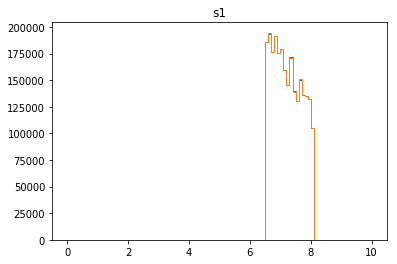

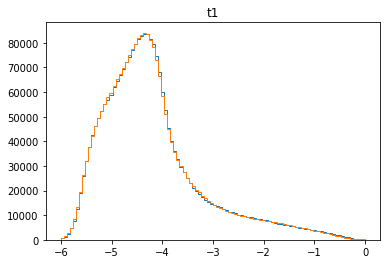

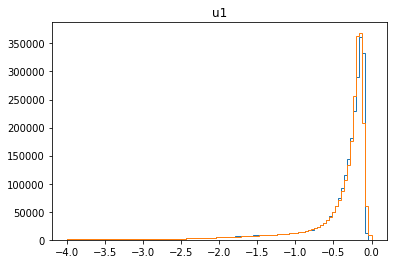

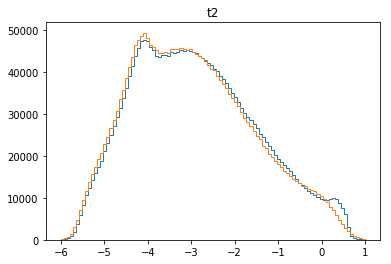

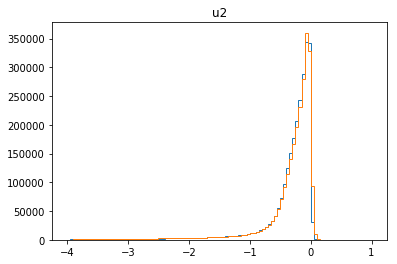

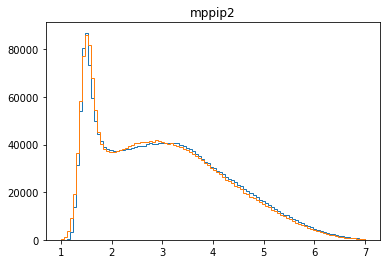

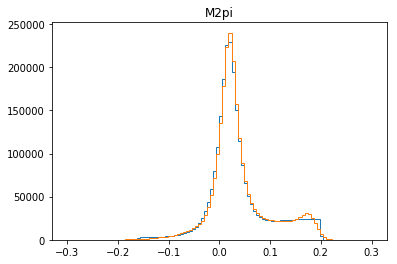

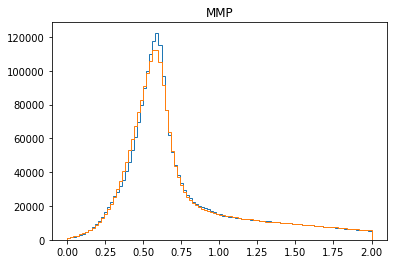

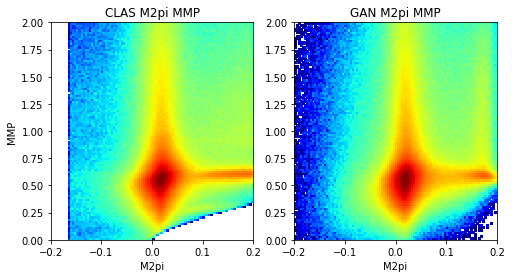

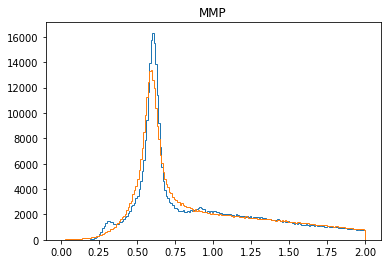

1801 [[-0.44922107, -0.44930974, 8.867198e-05], [-0.36891562, -0.36987036, 0.0009547511], [-0.24251734, -0.2452041, 0.0026867746], [-0.10572534, -0.10884936, 0.0031240215], [0.01230925, 0.011975161, 0.00033408977], [0.09288937, 0.09273712, 0.00015224199], [0.09691835, 0.0969057, 1.2653709e-05], [0.028535625, 0.025795598, 0.002740028], [-0.09680718, -0.09848649, 0.00167931], [-0.23911797, -0.23929338, 0.00017542021], [-0.3550641, -0.35765252, 0.0025884302], [-0.43287358, -0.43338427, 0.0005106817], [-0.46658567, -0.46776164, 0.0011759563], [-0.440557, -0.44237638, 0.001819367], [-0.34163278, -0.34288815, 0.0012553494], [-0.20168719, -0.20197971, 0.00029251928], [-0.05608358, -0.057501324, 0.0014177462], [0.043742433, 0.04322674, 0.0005156938], [0.088723436, 0.08812925, 0.0005941853], [0.044141408, 0.04389691, 0.00024449837]]
1802 [[-0.058936976, -0.058938242, 1.2663804e-06], [-0.19172171, -0.1923872, 0.0006654796], [-0.32096243, -0.32250595, 0.001543513], [-0.426603, -0.43147308, 0.0048

1811 [[-0.5583647, -0.55994725, 0.0015825735], [-0.55811584, -0.5596289, 0.0015130908], [-0.4965177, -0.49670744, 0.0001897471], [-0.37592044, -0.37598184, 6.139331e-05], [-0.22443284, -0.22588687, 0.0014540278], [-0.07813557, -0.07813569, 1.2183227e-07], [0.06391664, 0.06349065, 0.00042598567], [0.1668587, 0.16461524, 0.0022434613], [0.18303347, 0.1805171, 0.0025163537], [0.13719845, 0.13524017, 0.0019582745], [0.022307893, 0.021759292, 0.0005486014], [-0.13705611, -0.13705872, 2.6037596e-06], [-0.2717197, -0.2731063, 0.0013866065], [-0.39756873, -0.39759892, 3.0195808e-05], [-0.48458162, -0.4848763, 0.0002946763], [-0.5459033, -0.5459372, 3.38423e-05], [-0.5307661, -0.53125405, 0.00048792418], [-0.43620387, -0.4374515, 0.001247657], [-0.29531124, -0.29548833, 0.00017709145], [-0.124523416, -0.1268269, 0.0023034834]]
1812 [[0.038036387, 0.037316605, 0.00071978266], [0.16611522, 0.16488396, 0.0012312726], [0.24126899, 0.24079612, 0.00047287467], [0.23536761, 0.2353623, 5.2999867e-06], 

1821 [[0.19549978, 0.19252218, 0.0029775943], [0.18185246, 0.18140656, 0.0004458963], [0.078399144, 0.07714096, 0.0012581893], [-0.058437757, -0.05853361, 9.585234e-05], [-0.20227467, -0.20274374, 0.0004690665], [-0.3277342, -0.3313865, 0.0036523095], [-0.43118078, -0.4316845, 0.0005037229], [-0.48948473, -0.49057204, 0.0010873006], [-0.47015598, -0.47034582, 0.0001898522], [-0.39208984, -0.39212233, 3.24804e-05], [-0.2683984, -0.26905653, 0.0006581194], [-0.11996813, -0.120130226, 0.0001620924], [0.032659303, 0.03181258, 0.0008467234], [0.14813611, 0.1453306, 0.0028055108], [0.20363866, 0.20345215, 0.00018650317], [0.1589359, 0.1570201, 0.0019157986], [0.02653126, 0.026211858, 0.00031940325], [-0.112799816, -0.11365991, 0.00086009596], [-0.26012892, -0.26562178, 0.0054928614], [-0.39231992, -0.3942066, 0.0018866905]]
1822 [[-0.48545834, -0.48551425, 5.590264e-05], [-0.51676947, -0.5174982, 0.000728714], [-0.50295687, -0.50343317, 0.0004762818], [-0.41506684, -0.41518784, 0.00012099294

1831 [[-0.55015695, -0.5508547, 0.0006977454], [-0.5394296, -0.5395552, 0.00012560988], [-0.45757055, -0.45990694, 0.0023363717], [-0.32260725, -0.3227545, 0.00014724737], [-0.1492265, -0.16127801, 0.012051509], [0.011508351, 0.0103566, 0.0011517507], [0.14818278, 0.1454754, 0.002707378], [0.22519557, 0.22482578, 0.0003697886], [0.2265834, 0.22632793, 0.00025547488], [0.14904207, 0.14748278, 0.0015592896], [-0.0031116484, -0.003525673, 0.00041402466], [-0.15678698, -0.15774846, 0.0009614816], [-0.28971404, -0.28991142, 0.00019738928], [-0.4037549, -0.40391153, 0.0001566508], [-0.49077302, -0.4914398, 0.0006667593], [-0.51921976, -0.52092904, 0.0017093007], [-0.48884377, -0.48993358, 0.0010898177], [-0.38002953, -0.38022876, 0.00019921573], [-0.23127763, -0.23131749, 3.9858063e-05], [-0.065758824, -0.06620504, 0.00044621862]]
1832 [[0.08542578, 0.07969315, 0.0057326267], [0.18271205, 0.17916296, 0.0035490766], [0.21671437, 0.21651246, 0.00020191693], [0.16256964, 0.16251978, 4.9857787e-

1841 [[-0.3213079, -0.32265025, 0.0013423623], [-0.16423906, -0.1645638, 0.00032474313], [-0.0036669336, -0.0039856555, 0.00031872187], [0.12941389, 0.12815583, 0.0012580539], [0.21443462, 0.21412757, 0.00030704896], [0.24284063, 0.23946749, 0.0033731435], [0.17950101, 0.17678946, 0.0027115478], [0.045094002, 0.044542268, 0.0005517331], [-0.11571177, -0.116194315, 0.00048254617], [-0.25536495, -0.25902972, 0.0036647692], [-0.38327885, -0.38376603, 0.00048716608], [-0.47936782, -0.48029798, 0.00093015877], [-0.5275546, -0.5280711, 0.00051656045], [-0.5071916, -0.5072088, 1.7225742e-05], [-0.4120538, -0.41205877, 4.9715204e-06], [-0.27291995, -0.27350295, 0.00058298715], [-0.11352242, -0.11382143, 0.000299014], [0.03523125, 0.032026764, 0.0032044884], [0.13816065, 0.13797314, 0.00018749431], [0.17593491, 0.17541052, 0.00052439293]]
1842 [[0.1162437, 0.11622582, 1.7880988e-05], [0.02313505, 0.023116795, 1.8253922e-05], [-0.10635087, -0.11098043, 0.0046295575], [-0.2390037, -0.23965499, 0.

1851 [[-0.5497186, -0.5501347, 0.000416123], [-0.49892688, -0.49967685, 0.00074997725], [-0.3929756, -0.39431795, 0.0013423623], [-0.2470336, -0.2479178, 0.00088420394], [-0.089443326, -0.09006545, 0.00062212325], [0.05246844, 0.052262165, 0.0002062767], [0.17298603, 0.17239176, 0.0005942783], [0.23079218, 0.23072733, 6.4848e-05], [0.20108049, 0.20085078, 0.00022969802], [0.08924583, 0.088052675, 0.0011931557], [-0.054966, -0.055371683, 0.0004056841], [-0.21005195, -0.2104601, 0.00040814653], [-0.34248546, -0.34291887, 0.00043341867], [-0.43981758, -0.43992367, 0.00010608346], [-0.50530124, -0.5068664, 0.0015651697], [-0.5137324, -0.5138222, 8.98252e-05], [-0.43630907, -0.43707016, 0.0007610917], [-0.30989864, -0.31088573, 0.0009870811], [-0.14328538, -0.1482984, 0.0050130207], [0.01770622, 0.014217109, 0.003489109]]
1852 [[0.14592144, 0.14450613, 0.0014153053], [0.24099326, 0.24088655, 0.000106713036], [0.2594238, 0.2593717, 5.2090967e-05], [0.15371762, 0.15355934, 0.00015827834], [0.

1861 [[0.1422681, 0.14216425, 0.00010385574], [0.15472293, 0.15471132, 1.1604411e-05], [0.085127935, 0.083101556, 0.0020263805], [-0.030980881, -0.030982519, 1.6379673e-06], [-0.16788639, -0.1679052, 1.8812267e-05], [-0.30359554, -0.30649167, 0.0028961448], [-0.42827028, -0.42958358, 0.0013133103], [-0.503253, -0.5038853, 0.0006323457], [-0.5067919, -0.5072627, 0.0004708031], [-0.44616044, -0.4469305, 0.0007700634], [-0.32194954, -0.32258698, 0.00063744], [-0.16722791, -0.16774751, 0.0005195994], [-0.010589169, -0.012908424, 0.0023192551], [0.09795402, 0.09653009, 0.001423929], [0.15040113, 0.15009053, 0.00031060193], [0.13153, 0.13152997, 2.5062036e-08], [0.010768518, 0.010768518, 5.820766e-11], [-0.14441265, -0.14441268, 2.6284397e-08], [-0.28900722, -0.28953722, 0.00052999856], [-0.4037436, -0.40656266, 0.002819064]]
1862 [[-0.47429287, -0.47434238, 4.9508242e-05], [-0.47462758, -0.4754699, 0.00084228907], [-0.4071509, -0.407276, 0.00012509734], [-0.27102908, -0.2718361, 0.000807017

1871 [[-0.17770743, -0.17770748, 3.934838e-08], [-0.026943678, -0.027382914, 0.00043923562], [0.08781987, 0.08714501, 0.00067486113], [0.15572585, 0.15429717, 0.0014286834], [0.14735417, 0.14713876, 0.00021541571], [0.045294464, 0.044888165, 0.00040629905], [-0.09671099, -0.09915968, 0.0024486913], [-0.23134568, -0.23149727, 0.00015158375], [-0.35717848, -0.3588397, 0.0016612255], [-0.43157443, -0.43211034, 0.00053589884], [-0.4395723, -0.44008923, 0.0005169073], [-0.36978602, -0.37002507, 0.00023904153], [-0.24147993, -0.2416388, 0.00015885476], [-0.084967665, -0.08535911, 0.00039144332], [0.061897997, 0.061286483, 0.00061151234], [0.1744993, 0.1744836, 1.5709098e-05], [0.21144256, 0.2114412, 1.3625831e-06], [0.15460499, 0.15171663, 0.0028883491], [0.019353673, 0.019314725, 3.8948143e-05], [-0.13242234, -0.13315497, 0.00073263247]]
1872 [[-0.28768185, -0.28816766, 0.00048581982], [-0.40695152, -0.40904891, 0.0020973969], [-0.4936287, -0.49600154, 0.0023728372], [-0.5075241, -0.5078455

1881 [[0.17332841, 0.17134762, 0.0019807904], [0.19026738, 0.18644507, 0.0038223057], [0.11503537, 0.115031965, 3.401834e-06], [0.00010347692, -0.0010689502, 0.0011724271], [-0.16215421, -0.16215609, 1.8702449e-06], [-0.2980063, -0.30139163, 0.0033853396], [-0.39601606, -0.39616138, 0.0001453096], [-0.4542603, -0.45477262, 0.0005123209], [-0.45195442, -0.4526818, 0.00072737597], [-0.3771777, -0.37868735, 0.0015096798], [-0.2485468, -0.24865617, 0.00010936962], [-0.09938711, -0.0996358, 0.00024869156], [0.041482717, 0.04141045, 7.22679e-05], [0.14619754, 0.1461719, 2.5644204e-05], [0.1865941, 0.1865745, 1.9597941e-05], [0.09587535, 0.09543931, 0.00043604342], [-0.04449114, -0.044602834, 0.00011169571], [-0.19515727, -0.19524862, 9.135008e-05], [-0.32946646, -0.33223674, 0.0027702628], [-0.445227, -0.4461308, 0.0009038218]]
1882 [[-0.49809137, -0.49883074, 0.0007393593], [-0.4863197, -0.48659766, 0.00027796006], [-0.3856936, -0.38613957, 0.00044597685], [-0.2363751, -0.23754282, 0.001167

1891 [[-0.38604686, -0.38807136, 0.002024492], [-0.24514282, -0.24873063, 0.003587815], [-0.0830989, -0.08322238, 0.00012348128], [0.06475437, 0.0644531, 0.000301261], [0.18055533, 0.1780514, 0.0025039304], [0.22028844, 0.21770544, 0.0025829992], [0.16737407, 0.16676858, 0.00060548994], [0.025402118, 0.025324367, 7.775135e-05], [-0.12856162, -0.12880142, 0.00023980888], [-0.2669742, -0.26702628, 5.2063435e-05], [-0.3897027, -0.39031234, 0.0006096271], [-0.48406592, -0.48509026, 0.0010243398], [-0.52545816, -0.5256214, 0.00016326009], [-0.49586794, -0.50002855, 0.0041606002], [-0.3930691, -0.39320073, 0.00013162289], [-0.24871188, -0.25193995, 0.0032280693], [-0.088457674, -0.088539205, 8.152985e-05], [0.05173125, 0.050657492, 0.001073758], [0.15711644, 0.15634839, 0.00076805335], [0.16532622, 0.1632878, 0.0020384185]]
1892 [[0.092159405, 0.088361114, 0.003798288], [-0.04880849, -0.049573373, 0.0007648851], [-0.19051994, -0.19091146, 0.00039151884], [-0.317871, -0.32137138, 0.0035003847

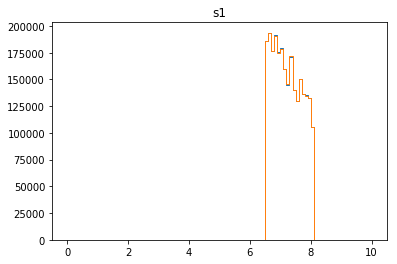

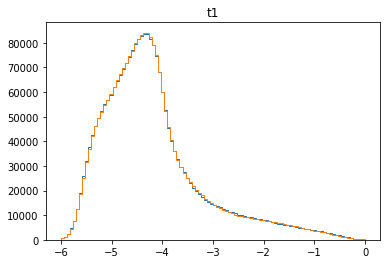

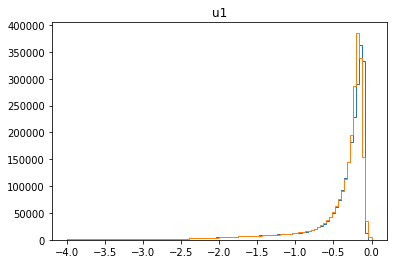

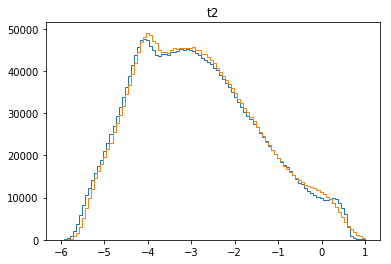

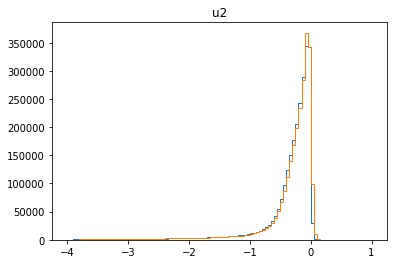

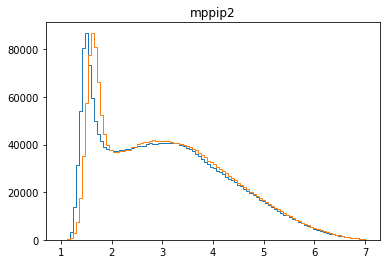

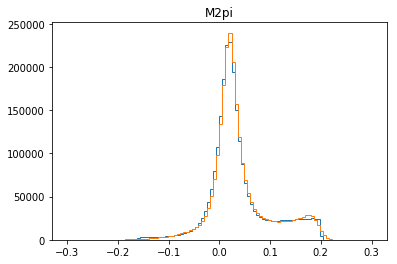

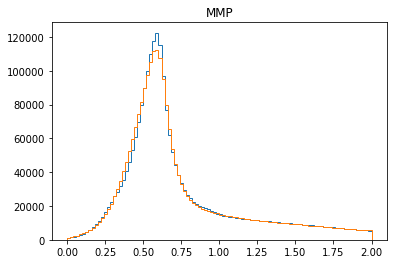

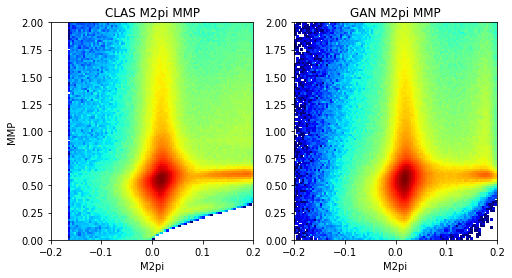

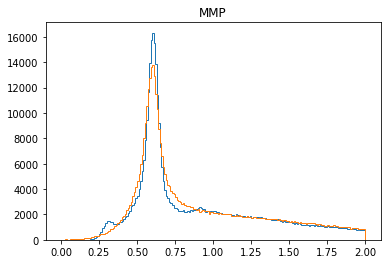

1901 [[0.03006866, 0.02986912, 0.0001995389], [-0.12290792, -0.12309814, 0.00019022032], [-0.27139792, -0.2717027, 0.00030478043], [-0.39932787, -0.399355, 2.7133361e-05], [-0.5008761, -0.50282633, 0.0019501799], [-0.5423633, -0.5431322, 0.0007688993], [-0.5109032, -0.51209515, 0.00119197], [-0.39975193, -0.40054289, 0.00079095125], [-0.24591264, -0.2460282, 0.00011555856], [-0.07882022, -0.078895964, 7.574625e-05], [0.07907084, 0.079052925, 1.7913264e-05], [0.20287499, 0.19801925, 0.0048557315], [0.2520942, 0.24948771, 0.002606511], [0.22141638, 0.22028564, 0.0011307454], [0.098235354, 0.09712313, 0.0011122221], [-0.060109187, -0.060704395, 0.00059520855], [-0.20778222, -0.21116956, 0.0033873373], [-0.34313214, -0.34431636, 0.001184212], [-0.44267574, -0.44269344, 1.7703993e-05], [-0.48994198, -0.49154404, 0.0016020575]]
1902 [[-0.45944104, -0.45944718, 6.148184e-06], [-0.3599894, -0.36021268, 0.00022326843], [-0.20657167, -0.20713122, 0.000559556], [-0.04566358, -0.048305266, 0.00264

1911 [[-0.056006562, -0.057153657, 0.001147095], [0.095102854, 0.09509845, 4.4019544e-06], [0.22088474, 0.219587, 0.0012977354], [0.26588878, 0.26486126, 0.0010275167], [0.22345227, 0.22282252, 0.0006297584], [0.09495804, 0.09448649, 0.00047154832], [-0.06518882, -0.06560587, 0.00041705737], [-0.223243, -0.22332907, 8.606911e-05], [-0.34797263, -0.35317156, 0.005198915], [-0.44601932, -0.44673827, 0.00071896426], [-0.5183896, -0.5184078, 1.8221344e-05], [-0.5390098, -0.54074156, 0.0017317693], [-0.48518714, -0.48581767, 0.0006305244], [-0.37714505, -0.3772238, 7.8729885e-05], [-0.19987686, -0.20468433, 0.004807472], [-0.024600782, -0.024886297, 0.00028551542], [0.13048255, 0.12900868, 0.0014738776], [0.22312121, 0.22256921, 0.0005520018], [0.2588934, 0.25712138, 0.0017720044], [0.20416883, 0.20219278, 0.0019760395]]
1912 [[0.06655829, 0.065424204, 0.0011340828], [-0.10160969, -0.101610675, 9.799296e-07], [-0.25346583, -0.25347903, 1.3202317e-05], [-0.38995406, -0.39054638, 0.0005923270

1921 [[0.18853517, 0.18813553, 0.0003996369], [0.1925828, 0.19018985, 0.002392948], [0.10638026, 0.105939664, 0.0004405957], [-0.037773915, -0.03780983, 3.5914723e-05], [-0.19359814, -0.19363728, 3.913883e-05], [-0.3288909, -0.32889593, 5.048365e-06], [-0.42936558, -0.42948568, 0.00012011337], [-0.4697541, -0.47101596, 0.0012618452], [-0.42834324, -0.42836264, 1.941262e-05], [-0.31485772, -0.31772438, 0.0028666586], [-0.17328428, -0.17684746, 0.0035631806], [-0.036291208, -0.03629271, 1.4994439e-06], [0.09550941, 0.09431744, 0.00119197], [0.15576959, 0.15565656, 0.00011303012], [0.12674876, 0.1265106, 0.00023815765], [0.030628331, 0.026433706, 0.004194625], [-0.107132405, -0.10724214, 0.00010972895], [-0.24281812, -0.24334794, 0.0005298229], [-0.35836026, -0.3674898, 0.009129541], [-0.44285733, -0.442861, 3.6598394e-06]]
1922 [[-0.4440844, -0.44430014, 0.00021575177], [-0.3838226, -0.3872004, 0.0033777975], [-0.2757935, -0.27593502, 0.00014151797], [-0.10810627, -0.10810765, 1.3759744e

1931 [[-0.49647716, -0.49876693, 0.002289772], [-0.38937122, -0.39043874, 0.0010675173], [-0.23199318, -0.2363979, 0.004404724], [-0.08095703, -0.08153542, 0.000578391], [0.0667686, 0.06676814, 4.5847628e-07], [0.16278133, 0.16178957, 0.0009917608], [0.19030847, 0.18914099, 0.0011674688], [0.11737707, 0.117164, 0.00021307063], [-0.008634444, -0.011016581, 0.002382137], [-0.16006802, -0.16344117, 0.0033731435], [-0.29329833, -0.2943917, 0.0010933467], [-0.38208196, -0.38441023, 0.0023282655], [-0.42401853, -0.42634717, 0.002328634], [-0.39695472, -0.39791584, 0.0009611268], [-0.3039522, -0.3055255, 0.0015733298], [-0.17456453, -0.17533384, 0.00076932256], [-0.034350723, -0.03529185, 0.0009411271], [0.089134626, 0.08759979, 0.0015348326], [0.1143061, 0.11427152, 3.457859e-05], [0.061304532, 0.0590719, 0.0022326333]]
1932 [[-0.07952988, -0.079587944, 5.806223e-05], [-0.23272759, -0.23491414, 0.0021865496], [-0.3600661, -0.3600677, 1.6184968e-06], [-0.44164336, -0.44621754, 0.004574179], [

1941 [[0.011550147, 0.011252912, 0.00029723565], [0.09218873, 0.09214803, 4.0705436e-05], [0.11101427, 0.110836774, 0.0001774978], [0.0043968665, 0.0042079594, 0.00018890726], [-0.13183756, -0.13282308, 0.0009855237], [-0.25813636, -0.25902852, 0.00089216186], [-0.34775546, -0.35709026, 0.009334794], [-0.4169495, -0.41788468, 0.00093516824], [-0.44175664, -0.44566765, 0.00391102], [-0.37324297, -0.3774735, 0.004230526], [-0.25245202, -0.25288838, 0.00043636214], [-0.103577904, -0.103635214, 5.7308942e-05], [0.031972863, 0.03178448, 0.00018838335], [0.13231017, 0.13223147, 7.869602e-05], [0.19229242, 0.19228825, 4.1729113e-06], [0.14333563, 0.14322089, 0.00011473987], [0.0024511511, 0.0019847248, 0.00046642646], [-0.14835191, -0.15148702, 0.003135118], [-0.292693, -0.29297465, 0.00028166108], [-0.4166874, -0.41720533, 0.00051794853]]
1942 [[-0.5058379, -0.5059354, 9.742735e-05], [-0.51756483, -0.5176478, 8.298294e-05], [-0.44973227, -0.45478913, 0.0050568706], [-0.3242894, -0.3245854, 0

1951 [[-0.26664665, -0.26673397, 8.731222e-05], [-0.38590786, -0.38593173, 2.3879125e-05], [-0.45378262, -0.4539149, 0.00013228017], [-0.46739095, -0.46760213, 0.0002111816], [-0.40162283, -0.40163234, 9.500422e-06], [-0.2632507, -0.2632591, 8.405186e-06], [-0.10019501, -0.10439161, 0.004196602], [0.041845374, 0.04176484, 8.0534024e-05], [0.15246631, 0.15220118, 0.00026513726], [0.19616976, 0.1959169, 0.00025285978], [0.16073704, 0.15990402, 0.00083301496], [0.03696906, 0.035867117, 0.0011019409], [-0.104118705, -0.10545074, 0.0013320395], [-0.24135683, -0.24135819, 1.3581339e-06], [-0.364734, -0.36617538, 0.0014413999], [-0.4443566, -0.44600773, 0.0016511345], [-0.43655717, -0.43853492, 0.0019777357], [-0.35492638, -0.35510173, 0.00017536966], [-0.23050195, -0.23052791, 2.5954218e-05], [-0.0795651, -0.07956667, 1.5751139e-06]]
1952 [[0.0580827, 0.05458502, 0.003497677], [0.11926805, 0.11906981, 0.00019824776], [0.10519734, 0.104955874, 0.0002414658], [-0.005191206, -0.00543013, 0.0002

1961 [[-0.28481442, -0.28486288, 4.846697e-05], [-0.14142802, -0.14246117, 0.0010331491], [-0.0119217895, -0.013695079, 0.0017732894], [0.07052865, 0.068709284, 0.001819367], [0.059021812, 0.058645245, 0.00037656815], [-0.032770287, -0.033097304, 0.0003270156], [-0.15712595, -0.15981391, 0.0026879613], [-0.27881294, -0.27987525, 0.0010622889], [-0.38004157, -0.38189822, 0.0018566545], [-0.46600747, -0.46612647, 0.00011898724], [-0.45969862, -0.46378645, 0.0040878425], [-0.37637118, -0.3763762, 5.039798e-06], [-0.24114232, -0.24354966, 0.0024073385], [-0.07792786, -0.078212984, 0.0002851288], [0.08966983, 0.08880312, 0.0008667092], [0.20587318, 0.20530811, 0.00056507403], [0.22931191, 0.22928214, 2.9778028e-05], [0.16709244, 0.1667956, 0.00029684117], [0.014823709, 0.014721672, 0.00010203663], [-0.15636182, -0.15657932, 0.00021749226]]
1962 [[-0.31551278, -0.31557304, 6.0262748e-05], [-0.4507511, -0.45580444, 0.0050533456], [-0.53469723, -0.5356273, 0.0009300424], [-0.54566574, -0.54734

1971 [[0.3330326, 0.32990602, 0.0031265803], [0.27681693, 0.2745879, 0.0022290295], [0.1300441, 0.12952606, 0.00051803543], [-0.04370106, -0.043747894, 4.6834408e-05], [-0.20258185, -0.20263879, 5.693414e-05], [-0.32574496, -0.32726413, 0.0015191806], [-0.44239992, -0.4424187, 1.8779188e-05], [-0.509228, -0.5110451, 0.0018170897], [-0.4926999, -0.49294254, 0.0002426528], [-0.40339673, -0.4036924, 0.00029565935], [-0.27394775, -0.2742756, 0.0003278439], [-0.13303828, -0.13393147, 0.0008931877], [0.010773662, 0.010618487, 0.0001551742], [0.13268179, 0.13146971, 0.0012120728], [0.18684496, 0.18598385, 0.00086110306], [0.13760152, 0.13710378, 0.00049774756], [0.016269999, 0.015777936, 0.0004920618], [-0.12117937, -0.121745445, 0.0005660719], [-0.27262592, -0.273684, 0.0010580657], [-0.3937277, -0.393747, 1.9311905e-05]]
1972 [[-0.4880626, -0.48810807, 4.548673e-05], [-0.51754254, -0.51780325, 0.00026068385], [-0.4583423, -0.45958123, 0.0012389142], [-0.35350114, -0.35464475, 0.0011436094],

1981 [[0.13700017, 0.13650234, 0.0004978326], [0.024394266, 0.023393957, 0.0010003087], [-0.12244729, -0.12245562, 8.327948e-06], [-0.26840997, -0.26910087, 0.00069091027], [-0.38599518, -0.3867076, 0.0007124327], [-0.48014387, -0.48014444, 5.704933e-07], [-0.5113643, -0.515746, 0.0043817163], [-0.4747916, -0.4774321, 0.0026405083], [-0.363278, -0.3644829, 0.0012049117], [-0.20027637, -0.20052966, 0.00025328458], [-0.055570465, -0.05860852, 0.003038056], [0.06745742, 0.06741773, 3.9689654e-05], [0.11670398, 0.11611017, 0.0005938134], [0.08994773, 0.080887675, 0.009060056], [-0.009044196, -0.009278485, 0.00023428813], [-0.14594097, -0.14595571, 1.4741704e-05], [-0.29166448, -0.29172388, 5.940704e-05], [-0.3821535, -0.3834668, 0.0013133103], [-0.44479787, -0.4450596, 0.0002617319], [-0.433424, -0.43353906, 0.00011506701]]
1982 [[-0.32639906, -0.3270529, 0.0006538207], [-0.18141694, -0.18392469, 0.00250775], [-0.040948305, -0.04151701, 0.0005687071], [0.07366388, 0.07338356, 0.00028031817

1991 [[-0.45073062, -0.45283467, 0.0021040414], [-0.3318345, -0.33231354, 0.00047903316], [-0.19644701, -0.196587, 0.00013997927], [-0.050471798, -0.050502077, 3.0279722e-05], [0.06750661, 0.0662564, 0.0012502186], [0.1270452, 0.12686206, 0.00018313229], [0.100991994, 0.09740281, 0.0035891864], [-0.018158326, -0.01820451, 4.618403e-05], [-0.14721452, -0.14812328, 0.0009087599], [-0.26851672, -0.27435145, 0.0058347434], [-0.35456988, -0.36243612, 0.00786622], [-0.39171207, -0.39223656, 0.00052448025], [-0.37772533, -0.37774405, 1.8713123e-05], [-0.2792583, -0.27937108, 0.00011278689], [-0.13634157, -0.13852206, 0.0021804892], [0.020685121, 0.019407235, 0.0012778857], [0.15607108, 0.15569806, 0.00037302327], [0.19082093, 0.19072779, 9.314537e-05], [0.1282672, 0.1279917, 0.00027548522], [-0.016636001, -0.016710196, 7.419388e-05]]
1992 [[-0.166988, -0.16717654, 0.00018854043], [-0.3116195, -0.31178382, 0.0001643342], [-0.42834395, -0.42839593, 5.1980896e-05], [-0.48124152, -0.48137793, 0.0

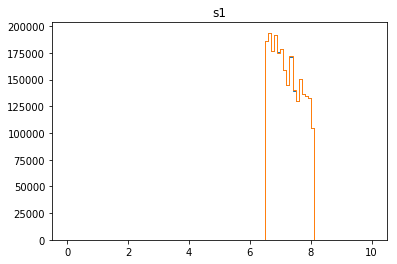

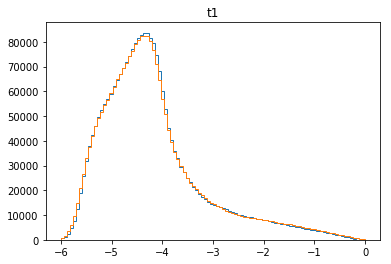

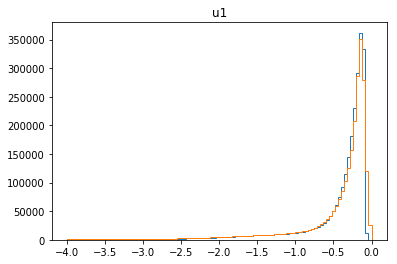

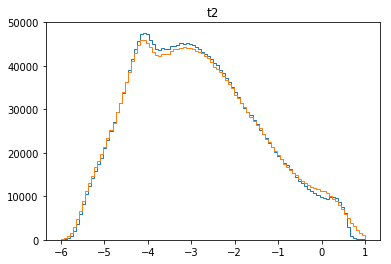

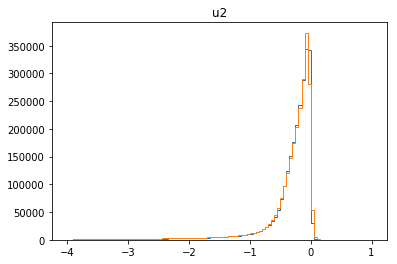

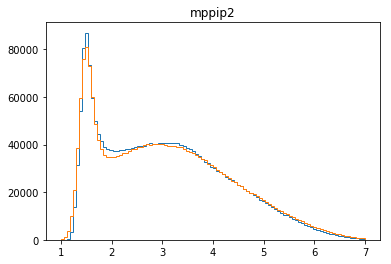

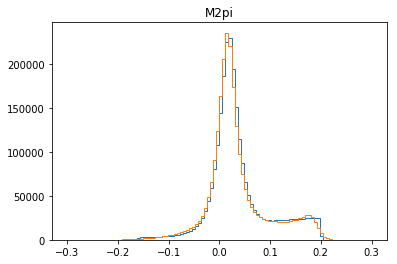

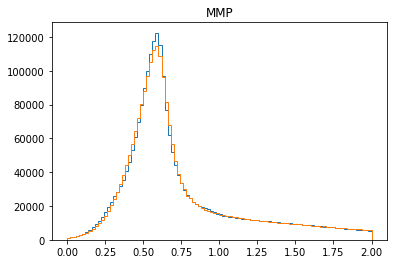

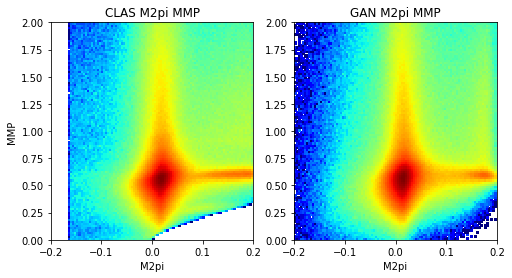

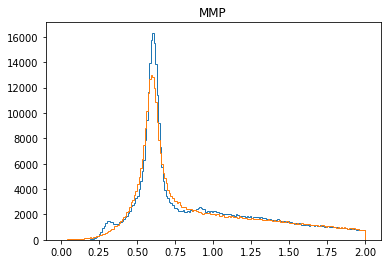

2001 [[0.27970144, 0.27940315, 0.0002982889], [0.23171529, 0.23171078, 4.514717e-06], [0.1166436, 0.116465084, 0.00017851574], [-0.047139566, -0.04873415, 0.0015945844], [-0.2122965, -0.21483779, 0.0025412913], [-0.35159957, -0.35260302, 0.0010034479], [-0.4623276, -0.46452433, 0.0021967292], [-0.52763724, -0.5277503, 0.000113070644], [-0.5332898, -0.53569996, 0.002410147], [-0.45027882, -0.45066658, 0.00038775397], [-0.30360848, -0.30627808, 0.0026695998], [-0.14284246, -0.14349638, 0.00065391813], [0.033156592, 0.03142387, 0.0017327219], [0.17202123, 0.17190291, 0.00011832237], [0.25614265, 0.25592074, 0.00022190253], [0.24860434, 0.24857351, 3.0827945e-05], [0.13396053, 0.13331118, 0.0006493414], [-0.034689333, -0.037079856, 0.0023905227], [-0.20698176, -0.2079525, 0.00097073], [-0.35996497, -0.36017993, 0.00021496805]]
2002 [[-0.47250313, -0.47383517, 0.0013320395], [-0.520674, -0.5220453, 0.001371308], [-0.5087527, -0.5094034, 0.000650703], [-0.4273246, -0.4274095, 8.490519e-05], 

2011 [[0.17388073, 0.17346965, 0.00041108028], [0.06262132, 0.06260606, 1.5258789e-05], [-0.0950339, -0.09647313, 0.0014392284], [-0.24684776, -0.24746259, 0.0006148185], [-0.3603136, -0.3604113, 9.7691096e-05], [-0.42463833, -0.42464167, 3.3318395e-06], [-0.43353334, -0.43494937, 0.0014160229], [-0.35935888, -0.35941172, 5.2836993e-05], [-0.2431713, -0.24403341, 0.00086211093], [-0.09740944, -0.09741011, 6.7266234e-07], [0.02705444, 0.026939986, 0.00011445403], [0.110381745, 0.10725943, 0.0031223157], [0.0755863, 0.074981555, 0.00060473935], [-0.045107774, -0.045333844, 0.00022607016], [-0.18320012, -0.18325807, 5.7946025e-05], [-0.31348807, -0.31379667, 0.00030858826], [-0.41612324, -0.4161355, 1.2249893e-05], [-0.46369985, -0.4654757, 0.0017758607], [-0.42186242, -0.4221781, 0.0003156646], [-0.32108125, -0.32131478, 0.00023352964]]
2012 [[-0.1741704, -0.17424029, 6.9888076e-05], [0.0017014123, 0.0012456345, 0.0004557778], [0.16287543, 0.16268086, 0.00019455902], [0.25030443, 0.24976

2021 [[0.18624897, 0.18596126, 0.00028771118], [0.029654816, 0.026570328, 0.0030844891], [-0.13918777, -0.14099446, 0.0018066976], [-0.3028815, -0.3032144, 0.00033290545], [-0.44374692, -0.44376644, 1.9530447e-05], [-0.52914774, -0.53046256, 0.0013148314], [-0.5601121, -0.5636292, 0.0035171057], [-0.5262577, -0.526451, 0.00019328407], [-0.4022195, -0.40244552, 0.00022601278], [-0.24111263, -0.24127609, 0.00016345517], [-0.06002694, -0.061498184, 0.0014712426], [0.11439694, 0.11281315, 0.0015837876], [0.2501111, 0.24500993, 0.0051011844], [0.30939466, 0.3093931, 1.541779e-06], [0.25822696, 0.25798646, 0.00024051825], [0.12506957, 0.12503582, 3.3753593e-05], [-0.037435535, -0.03746062, 2.5087054e-05], [-0.19643378, -0.19655436, 0.0001205737], [-0.33412266, -0.33483773, 0.0007150826], [-0.44052923, -0.44055218, 2.295617e-05]]
2022 [[-0.51445156, -0.51462543, 0.00017385744], [-0.5129807, -0.5132339, 0.00025322384], [-0.41716552, -0.41722983, 6.4326836e-05], [-0.27601823, -0.2766786, 0.0006

2031 [[0.07536577, 0.0753535, 1.2263248e-05], [0.20553082, 0.20287481, 0.0026560172], [0.23901665, 0.23872054, 0.00029611867], [0.18425484, 0.18424654, 8.2949555e-06], [0.056602087, 0.055167776, 0.0014343123], [-0.09208802, -0.09217651, 8.8492474e-05], [-0.23166111, -0.23167607, 1.4962221e-05], [-0.36333922, -0.36336344, 2.4234623e-05], [-0.43796733, -0.44021785, 0.0022505133], [-0.44805434, -0.44895646, 0.00090210245], [-0.3725222, -0.37626895, 0.003746741], [-0.2565282, -0.25652996, 1.7471357e-06], [-0.100287825, -0.100302696, 1.4873817e-05], [0.056049954, 0.055716075, 0.00033388066], [0.17662549, 0.1754268, 0.0011986961], [0.24907535, 0.24738932, 0.0016860389], [0.22183985, 0.21875452, 0.0030853366], [0.10660772, 0.10619672, 0.00041100295], [-0.046650022, -0.04749908, 0.00084905594], [-0.1881673, -0.1889102, 0.0007428902]]
2032 [[-0.30259982, -0.3026559, 5.6102475e-05], [-0.37810007, -0.37828574, 0.00018567058], [-0.37446195, -0.37598827, 0.0015263258], [-0.29655576, -0.298032, 0.00

2041 [[0.1394574, 0.13945688, 5.170623e-07], [-0.004073824, -0.00440917, 0.00033534598], [-0.1759622, -0.17689876, 0.0009365686], [-0.31555274, -0.31601572, 0.00046297265], [-0.43820778, -0.43877986, 0.000572078], [-0.5018991, -0.50215185, 0.00025273848], [-0.50898665, -0.5101592, 0.0011725577], [-0.43633196, -0.43725967, 0.0009277172], [-0.2942357, -0.29683208, 0.0025963932], [-0.13180591, -0.13195994, 0.00015403585], [0.04030477, 0.03981203, 0.0004927389], [0.18542625, 0.18542074, 5.512852e-06], [0.2739609, 0.27378768, 0.00017320419], [0.27617157, 0.2758363, 0.00033527613], [0.16792047, 0.167572, 0.00034846517], [0.011823572, 0.011496764, 0.00032680866], [-0.14612846, -0.15514754, 0.009019072], [-0.29116336, -0.29160434, 0.00044099614], [-0.38447902, -0.3885957, 0.004116672], [-0.43170202, -0.43443266, 0.0027306506]]
2042 [[-0.4145704, -0.41646388, 0.0018934902], [-0.3228703, -0.3232168, 0.0003464741], [-0.15803817, -0.1586732, 0.00063503446], [-0.0031350837, -0.0031407499, 5.6661665

2051 [[-0.3489357, -0.35309383, 0.0041581397], [-0.41793853, -0.41836482, 0.00042630066], [-0.4334318, -0.43349093, 5.9113372e-05], [-0.34614852, -0.34615657, 8.055009e-06], [-0.19708401, -0.19709359, 9.5829055e-06], [-0.029817086, -0.030510304, 0.0006932184], [0.117122866, 0.11697006, 0.00015280735], [0.2262245, 0.2260122, 0.0002122918], [0.24760169, 0.24707064, 0.0005310529], [0.17957069, 0.17431441, 0.0052562826], [0.024108252, 0.023466954, 0.00064129825], [-0.12823983, -0.1289668, 0.00072696456], [-0.27836975, -0.28044695, 0.0020771807], [-0.39123288, -0.39135376, 0.00012086712], [-0.46467018, -0.46599832, 0.0013281441], [-0.47601733, -0.47893754, 0.0029202132], [-0.3976748, -0.39888847, 0.0012136671], [-0.26399785, -0.26661998, 0.0026221147], [-0.09922746, -0.1025071, 0.00327964], [0.061363563, 0.056402266, 0.0049612974]]
2052 [[0.19801627, 0.19750093, 0.00051534735], [0.28762394, 0.28691325, 0.0007107029], [0.24608085, 0.24544129, 0.00063956063], [0.11292095, 0.11274023, 0.000180

2061 [[-0.26101094, -0.26170596, 0.0006950274], [-0.12096839, -0.12230977, 0.0013413839], [0.015086837, 0.008272327, 0.0068145106], [0.06873018, 0.068023846, 0.00070633664], [0.11970876, 0.11970353, 5.2299624e-06], [0.05640945, 0.055755727, 0.00065372314], [-0.04019694, -0.041409012, 0.0012120728], [-0.16361713, -0.16486533, 0.001248196], [-0.25265127, -0.25647098, 0.0038197117], [-0.29685068, -0.2976993, 0.00084861135], [-0.24487059, -0.24507813, 0.00020753873], [-0.12708896, -0.12732244, 0.00023347138], [-0.0057155206, -0.0065715937, 0.0008560732], [0.113296285, 0.11201485, 0.0012814339], [0.18382882, 0.18380131, 2.7512218e-05], [0.16142446, 0.15971296, 0.0017115094], [0.048306778, 0.047640808, 0.00066597166], [-0.09430324, -0.094693705, 0.00039046287], [-0.23472407, -0.23542061, 0.0006965368], [-0.3463027, -0.34659886, 0.00029618433]]
2062 [[-0.41581514, -0.41622445, 0.00040930335], [-0.3989509, -0.40074804, 0.0017971436], [-0.30450955, -0.30517513, 0.0006655778], [-0.15931453, -0.1

2071 [[-0.19597712, -0.19597733, 2.07805e-07], [-0.04128146, -0.04130312, 2.165907e-05], [0.123440206, 0.12289624, 0.0005439651], [0.20557223, 0.2052501, 0.0003221361], [0.2128452, 0.21283773, 7.4809795e-06], [0.14656734, 0.1464069, 0.00016044533], [0.013421982, 0.012324216, 0.0010977661], [-0.14576274, -0.14756846, 0.001805725], [-0.29208472, -0.2933752, 0.0012904622], [-0.39598933, -0.3960183, 2.8971717e-05], [-0.43690184, -0.43715608, 0.00025425688], [-0.41469833, -0.4155048, 0.00080647564], [-0.2993987, -0.29941016, 1.1474825e-05], [-0.13319853, -0.13327621, 7.76841e-05], [0.036108594, 0.03602799, 8.0602505e-05], [0.18816963, 0.18776831, 0.00040131636], [0.26485956, 0.26477417, 8.5398e-05], [0.23430157, 0.23417893, 0.00012263493], [0.12144453, 0.121402845, 4.168478e-05], [-0.036219783, -0.036837157, 0.00061737496]]
2072 [[-0.19477797, -0.19500558, 0.00022762144], [-0.32307604, -0.32308546, 9.418295e-06], [-0.41678944, -0.41746888, 0.00067942723], [-0.47841913, -0.47954884, 0.001129

2081 [[0.039491486, 0.037879027, 0.001612457], [-0.09498718, -0.09682122, 0.0018340405], [-0.21638562, -0.21638843, 2.8108516e-06], [-0.30889335, -0.30982968, 0.00093633507], [-0.35048202, -0.35194507, 0.00146306], [-0.32246262, -0.3224824, 1.9784144e-05], [-0.22361118, -0.22364217, 3.099762e-05], [-0.0991274, -0.09962907, 0.0005016702], [0.026898293, 0.023318242, 0.003580051], [0.1235564, 0.12321664, 0.00033976138], [0.1447492, 0.14213118, 0.0026180146], [0.07122296, 0.07122295, 8.381903e-09], [-0.06287764, -0.064708576, 0.0018309377], [-0.2121968, -0.21229953, 0.00010273141], [-0.3393116, -0.33966377, 0.00035217786], [-0.41029042, -0.41041744, 0.00012702469], [-0.4110884, -0.41176474, 0.00067634834], [-0.36974892, -0.3697513, 2.392775e-06], [-0.24305364, -0.2479312, 0.0048775524], [-0.076420285, -0.07769258, 0.0012723008]]
2082 [[0.08203075, 0.0820073, 2.3452312e-05], [0.20460771, 0.20454, 6.770495e-05], [0.2629128, 0.26286507, 4.775258e-05], [0.20389797, 0.2021335, 0.0017644654], [0

2091 [[-0.40532115, -0.40747023, 0.0021490743], [-0.41069645, -0.41166088, 0.000964441], [-0.3193826, -0.32060465, 0.0012220537], [-0.18331932, -0.1834321, 0.00011278689], [-0.014826344, -0.015001007, 0.00017466316], [0.11699189, 0.116862446, 0.00012944374], [0.2049466, 0.20466045, 0.00028616036], [0.17991118, 0.17891906, 0.0009921212], [0.06888974, 0.067758605, 0.0011311303], [-0.06819236, -0.07100677, 0.002814408], [-0.21221098, -0.2123964, 0.00018541078], [-0.32585862, -0.32596236, 0.00010373916], [-0.42311147, -0.42439714, 0.0012856704], [-0.43282303, -0.43446705, 0.0016440118], [-0.36097893, -0.36203873, 0.0010598036], [-0.22944313, -0.22947665, 3.351024e-05], [-0.0815067, -0.08203863, 0.00053193234], [0.064540155, 0.06429464, 0.00024551345], [0.15936963, 0.15935199, 1.7639848e-05], [0.19129276, 0.18806665, 0.0032261193]]
2092 [[0.12230744, 0.12052466, 0.0017827798], [0.012290453, 0.005243804, 0.0070466488], [-0.13031194, -0.13166635, 0.0013544087], [-0.24604122, -0.2460433, 2.073

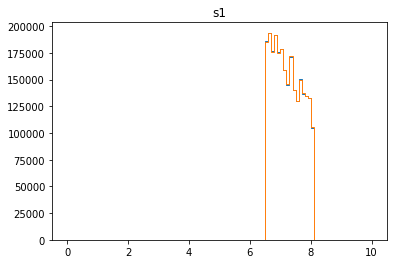

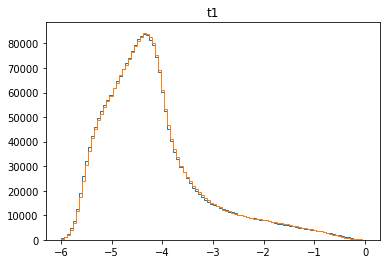

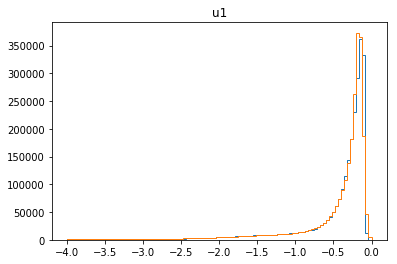

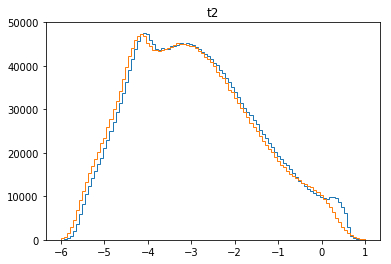

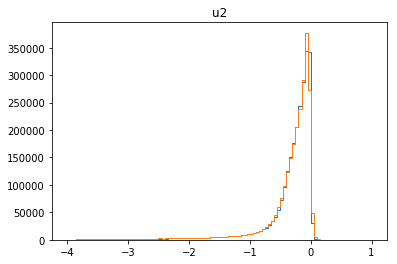

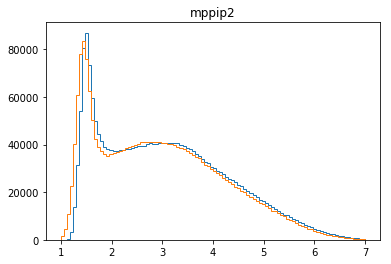

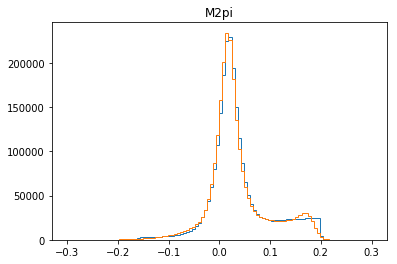

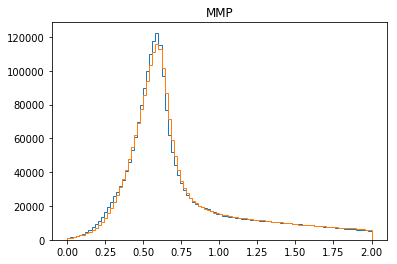

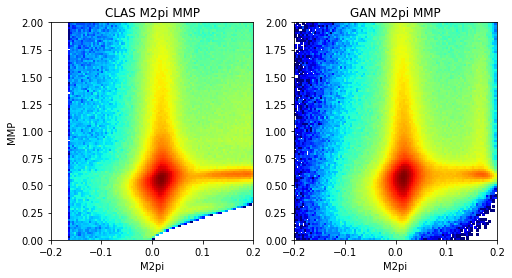

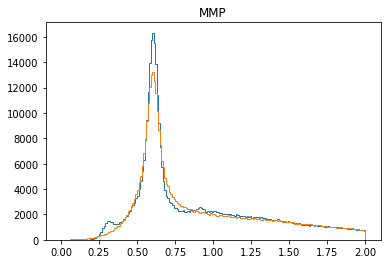

2101 [[-0.122837156, -0.12641127, 0.0035741187], [0.00839544, 0.008290141, 0.000105299114], [0.12007987, 0.1199648, 0.00011506701], [0.17610706, 0.17566831, 0.000438756], [0.12618312, 0.12428548, 0.0018976422], [0.028099157, 0.028046042, 5.3114643e-05], [-0.110779464, -0.1138701, 0.0030906363], [-0.23549326, -0.23886995, 0.0033766886], [-0.3389096, -0.33941185, 0.0005022684], [-0.3894637, -0.38948664, 2.295617e-05], [-0.36003667, -0.36027083, 0.00023417131], [-0.2499762, -0.25069588, 0.0007196802], [-0.11043439, -0.11272343, 0.0022890419], [0.040161546, 0.039405707, 0.0007558389], [0.11398552, 0.11383828, 0.00014724737], [0.089980505, 0.086860746, 0.0031197586], [0.016549082, 0.015212445, 0.0013366378], [-0.12486432, -0.12776847, 0.002904157], [-0.26387104, -0.2663409, 0.0024698789], [-0.37422445, -0.37665844, 0.0024339894]]
2102 [[-0.4235204, -0.42403254, 0.0005121482], [-0.3916541, -0.3933533, 0.0016992219], [-0.29091513, -0.2909206, 5.441431e-06], [-0.1458866, -0.14589357, 6.9683883

2111 [[-0.19331281, -0.19434485, 0.001032046], [-0.3234474, -0.32347777, 3.0363739e-05], [-0.4121906, -0.41221127, 2.0693642e-05], [-0.43051985, -0.4305744, 5.4541975e-05], [-0.36127195, -0.36155915, 0.00028719378], [-0.23010033, -0.23010047, 1.3133103e-07], [-0.07737629, -0.07782002, 0.00044372398], [0.06545779, 0.06544578, 1.2010747e-05], [0.18477863, 0.18311974, 0.0016588939], [0.22024985, 0.21925664, 0.0009932028], [0.14575264, 0.14513905, 0.0006135894], [-0.010339694, -0.011181872, 0.00084217836], [-0.1658191, -0.16646408, 0.00064497447], [-0.29734954, -0.29838392, 0.0010343759], [-0.3940953, -0.3971523, 0.0030570081], [-0.4548684, -0.4570329, 0.0021644868], [-0.43135208, -0.43154436, 0.00019227774], [-0.3337973, -0.33538473, 0.0015874332], [-0.1943246, -0.19440807, 8.3470164e-05], [-0.0228374, -0.032176986, 0.009339587]]
2112 [[0.092976175, 0.09294454, 3.1638054e-05], [0.16012968, 0.15941745, 0.0007122292], [0.1286456, 0.12799324, 0.0006523582], [0.0021095253, 0.0011387954, 0.000

2121 [[-0.34762025, -0.3477027, 8.2462495e-05], [-0.44096014, -0.4412893, 0.0003291576], [-0.46570516, -0.46578148, 7.6311706e-05], [-0.3971901, -0.39816904, 0.000978948], [-0.25884098, -0.25958908, 0.00074809795], [-0.10025381, -0.1004874, 0.00023358795], [0.06515616, 0.06509628, 5.9878403e-05], [0.1771782, 0.1767074, 0.0004708031], [0.2265592, 0.22602534, 0.0005338697], [0.16128783, 0.16128032, 7.5123135e-06], [0.0394005, 0.039269008, 0.00013149164], [-0.10896467, -0.109201945, 0.00023727542], [-0.26195085, -0.2619976, 4.6756122e-05], [-0.38453212, -0.38496858, 0.00043644183], [-0.44036534, -0.4430658, 0.0027004357], [-0.45014292, -0.4511026, 0.00095970806], [-0.38010368, -0.38010538, 1.7020502e-06], [-0.25357783, -0.2553058, 0.0017279616], [-0.09139749, -0.09145593, 5.8440724e-05], [0.06336226, 0.06280514, 0.0005571224]]
2122 [[0.16774805, 0.16625905, 0.001489001], [0.21492918, 0.21445589, 0.0004732895], [0.14067064, 0.14023873, 0.00043191106], [-0.009202932, -0.0093647335, 0.000161

2131 [[0.15392785, 0.15371226, 0.00021558373], [0.21052827, 0.2100966, 0.00043167328], [0.17489961, 0.17318368, 0.001715931], [0.056797132, 0.05676952, 2.7612354e-05], [-0.076446265, -0.07648857, 4.230278e-05], [-0.21976388, -0.221162, 0.0013981365], [-0.310913, -0.31124702, 0.00033402006], [-0.37458217, -0.37507984, 0.00049766246], [-0.37453997, -0.37755704, 0.0030170656], [-0.2970403, -0.29953033, 0.0024900152], [-0.14704952, -0.14728862, 0.0002391005], [0.02295674, 0.020928128, 0.0020286131], [0.17568357, 0.1756582, 2.5374467e-05], [0.29106897, 0.29060146, 0.00046749815], [0.31156805, 0.30984452, 0.0017235244], [0.23650116, 0.23615503, 0.00034611917], [0.0876308, 0.08704237, 0.00058843405], [-0.08663015, -0.086694725, 6.457182e-05], [-0.234727, -0.23616073, 0.0014337342], [-0.34394246, -0.34432617, 0.00038370816]]
2132 [[-0.3968032, -0.3978041, 0.0010009119], [-0.38689536, -0.3880297, 0.0011343398], [-0.30339706, -0.30341688, 1.9818095e-05], [-0.18045223, -0.1809734, 0.00052116567],

2141 [[0.17183137, 0.17179285, 3.8520797e-05], [0.26114106, 0.26106054, 8.0534024e-05], [0.23835859, 0.2382329, 0.0001256954], [0.1538308, 0.15283012, 0.0010006706], [-0.000455565, -0.0007694699, 0.0003139049], [-0.15867475, -0.16120164, 0.002526889], [-0.30010155, -0.30022457, 0.00012301544], [-0.4079888, -0.40826383, 0.00027504223], [-0.4615444, -0.46217254, 0.000628132], [-0.44856405, -0.4491574, 0.00059334876], [-0.34369874, -0.34431878, 0.00062003173], [-0.17513326, -0.17569943, 0.00056616275], [0.0054567326, 0.0008737771, 0.0045829555], [0.15241344, 0.1511361, 0.0012773405], [0.25432202, 0.25354186, 0.0007801526], [0.27978364, 0.27960685, 0.00017678698], [0.18537384, 0.18527539, 9.8446624e-05], [0.023484703, 0.023483602, 1.1004886e-06], [-0.15450634, -0.15467317, 0.00016683765], [-0.29886898, -0.30011988, 0.001250893]]
2142 [[-0.40782773, -0.40801018, 0.00018246182], [-0.48835722, -0.48840803, 5.0804992e-05], [-0.48218754, -0.48236266, 0.00017511718], [-0.3891081, -0.39054024, 0.

2151 [[0.07377605, 0.07349599, 0.00028006278], [0.21287788, 0.21235393, 0.0005239562], [0.28538328, 0.28388706, 0.001496222], [0.266785, 0.2659683, 0.0008166909], [0.13815913, 0.13815458, 4.547197e-06], [-0.012696153, -0.014655609, 0.0019594564], [-0.1641021, -0.16512449, 0.0010223873], [-0.30861273, -0.30892852, 0.00031580016], [-0.41733855, -0.41775334, 0.0004148012], [-0.45589438, -0.45615575, 0.00026136177], [-0.43881917, -0.43886003, 4.0851595e-05], [-0.32511675, -0.32836393, 0.0032471705], [-0.17526263, -0.17542912, 0.00016649292], [0.010223191, 0.006769145, 0.0034540463], [0.14237222, 0.14216742, 0.00020480002], [0.22820129, 0.22756104, 0.00064023613], [0.2365081, 0.23440178, 0.0021063164], [0.13598642, 0.13409458, 0.0018918305], [-0.031610537, -0.031851884, 0.00024134727], [-0.19247605, -0.19497998, 0.0025039304]]
2152 [[-0.32473174, -0.32539466, 0.0006629235], [-0.4236038, -0.42378858, 0.00018478795], [-0.47079623, -0.47207317, 0.0012769315], [-0.43160126, -0.43366212, 0.00206

2161 [[0.24284153, 0.24281518, 2.6344358e-05], [0.1211957, 0.121187136, 8.560732e-06], [-0.043084215, -0.04381499, 0.0007307752], [-0.20543022, -0.2060513, 0.0006210771], [-0.35331672, -0.3547395, 0.0014227778], [-0.4609392, -0.462306, 0.0013667911], [-0.5015251, -0.5031868, 0.0016616918], [-0.48589757, -0.4865382, 0.0006406223], [-0.37659535, -0.37950075, 0.0029053905], [-0.21545613, -0.21569405, 0.00023792223], [-0.03982128, -0.039835256, 1.397566e-05], [0.12700336, 0.124939375, 0.0020639885], [0.26165804, 0.26060864, 0.0010493976], [0.32179907, 0.32122326, 0.000575825], [0.2700122, 0.26911548, 0.00089672534], [0.13665374, 0.13650036, 0.00015337372], [-0.01567623, -0.019823553, 0.004147324], [-0.18525812, -0.18805294, 0.002794812], [-0.33442688, -0.33488977, 0.00046289063], [-0.43181118, -0.43298674, 0.001175564]]
2162 [[-0.49230418, -0.49247462, 0.00017045395], [-0.4715622, -0.473671, 0.002108768], [-0.38013187, -0.38017967, 4.780532e-05], [-0.22948675, -0.23006909, 0.0005823426], [

2171 [[0.08755086, 0.0872571, 0.0002937602], [0.19410968, 0.19376689, 0.00034279164], [0.21683888, 0.21659367, 0.00024521467], [0.15732625, 0.15709044, 0.0002358087], [0.021104585, 0.021020206, 8.437876e-05], [-0.11184049, -0.11694548, 0.005104999], [-0.25900102, -0.25958106, 0.0005800435], [-0.3540892, -0.3541115, 2.2302906e-05], [-0.39283654, -0.39289665, 6.011478e-05], [-0.35902143, -0.3595493, 0.0005278929], [-0.2443621, -0.25236765, 0.008005547], [-0.123591796, -0.12691616, 0.0033243573], [-0.0037214193, -0.003949386, 0.00022796684], [0.089745924, 0.089342386, 0.0004035356], [0.12000925, 0.11990072, 0.000108533444], [0.018356971, 0.018107135, 0.0002498359], [-0.13354914, -0.13459545, 0.0010463105], [-0.27291998, -0.27293733, 1.7352635e-05], [-0.3853831, -0.38543132, 4.8228252e-05], [-0.43451306, -0.43539998, 0.00088692823]]
2172 [[-0.40940204, -0.41647786, 0.007075819], [-0.32531765, -0.32539624, 7.8594545e-05], [-0.18503475, -0.18503992, 5.17775e-06], [-0.022897324, -0.024387501,

2181 [[-0.2132057, -0.2136906, 0.0004848953], [-0.2975992, -0.29763058, 3.138109e-05], [-0.33607557, -0.33619165, 0.00011609226], [-0.3001345, -0.30024052, 0.00010600491], [-0.18416187, -0.18679123, 0.0026293471], [-0.027951544, -0.028572906, 0.0006213623], [0.09792122, 0.09788802, 3.3201803e-05], [0.17361897, 0.17249578, 0.0011231898], [0.12389063, 0.123598896, 0.00029173685], [0.003081749, 0.0026327865, 0.00044896253], [-0.15799235, -0.15799776, 5.4058955e-06], [-0.29665178, -0.2981418, 0.0014900311], [-0.39010814, -0.3910419, 0.0009337689], [-0.41431, -0.4159349, 0.0016248884], [-0.35881987, -0.3589602, 0.00014034055], [-0.25742304, -0.2577595, 0.0003364646], [-0.099528834, -0.10001499, 0.00048615623], [0.059715644, 0.05910158, 0.00061406195], [0.18115608, 0.18115462, 1.466924e-06], [0.26581472, 0.26462984, 0.0011848685]]
2182 [[0.20236738, 0.20214666, 0.00022071079], [0.064430594, 0.06405091, 0.00037968374], [-0.109042704, -0.10917525, 0.00013254356], [-0.25986156, -0.25986466, 3.1

2191 [[-0.34418416, -0.34620214, 0.0020179749], [-0.20090835, -0.20091976, 1.1410306e-05], [-0.0565427, -0.05819058, 0.0016478809], [0.06782333, 0.06772145, 0.00010188256], [0.14668417, 0.1450685, 0.0016156756], [0.15312682, 0.1518503, 0.0012765223], [0.056193043, 0.05151769, 0.0046753515], [-0.064596474, -0.071794435, 0.0071979575], [-0.22647901, -0.2265914, 0.000112382135], [-0.34385088, -0.34403053, 0.00017963878], [-0.44672593, -0.44746363, 0.0007377006], [-0.4569091, -0.45699698, 8.788347e-05], [-0.3999081, -0.39990813, 1.9386789e-08], [-0.26646683, -0.26648918, 2.2338952e-05], [-0.09222718, -0.09293555, 0.0007083658], [0.07624725, 0.07223805, 0.0040092017], [0.19579464, 0.19353235, 0.0022622915], [0.23268661, 0.2296036, 0.003083006], [0.16192731, 0.16187093, 5.638856e-05], [0.018158566, 0.01737852, 0.00078004604]]
2192 [[-0.14851351, -0.15128137, 0.0027678537], [-0.29782817, -0.29825643, 0.00042827192], [-0.4177611, -0.4182902, 0.0005291207], [-0.46486557, -0.46528378, 0.00041822

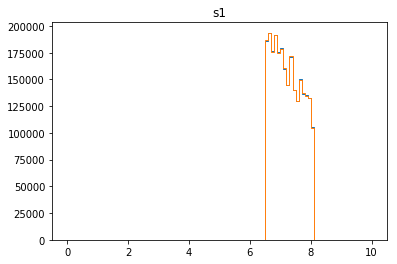

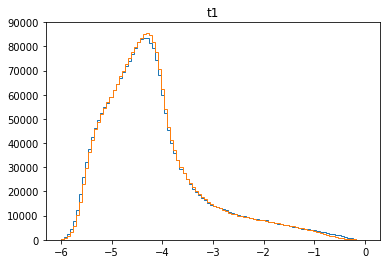

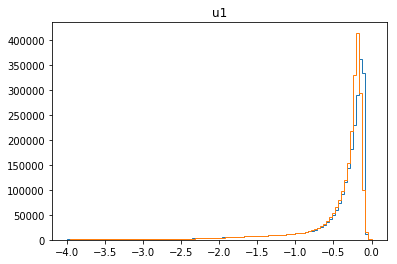

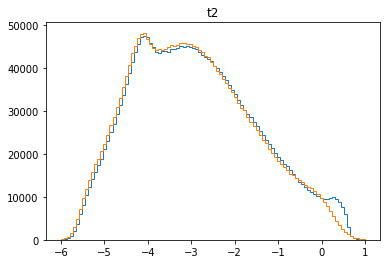

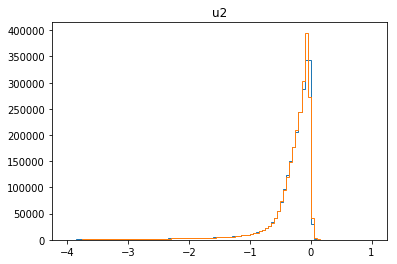

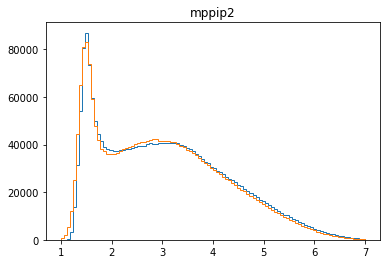

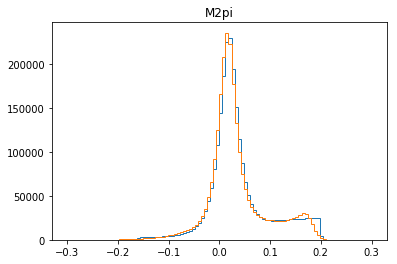

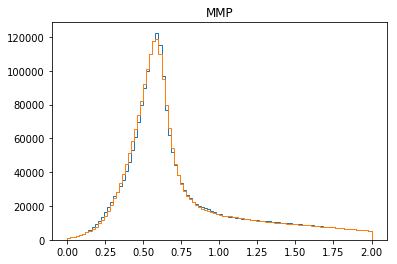

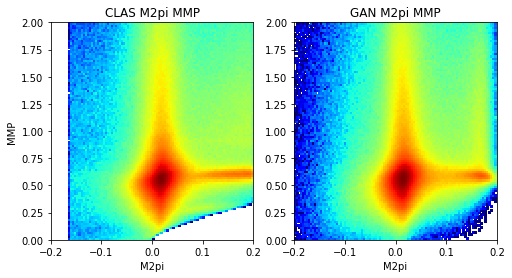

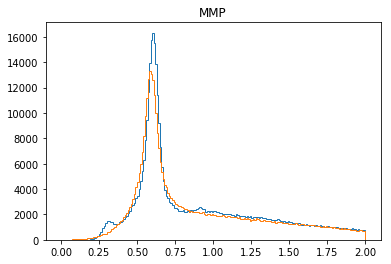

2201 [[-0.17958033, -0.18090987, 0.0013295346], [-0.0201443, -0.020921048, 0.0007767469], [0.13238259, 0.13236992, 1.2667282e-05], [0.2323455, 0.23185742, 0.00048809266], [0.24383979, 0.24316373, 0.00067605084], [0.15730558, 0.15593244, 0.0013731447], [0.0050543165, 0.0025538206, 0.0025004956], [-0.14145002, -0.14203356, 0.00058353995], [-0.2782526, -0.2785346, 0.00028198122], [-0.35940173, -0.36198705, 0.0025853256], [-0.3585198, -0.3708658, 0.01234601], [-0.32561216, -0.32655716, 0.000944993], [-0.21259914, -0.21270864, 0.00010948932], [-0.051911283, -0.056958664, 0.005047381], [0.079825565, 0.0787394, 0.001086169], [0.17132005, 0.17109776, 0.00022230046], [0.19262753, 0.19213471, 0.0004928236], [0.1076399, 0.10759387, 4.6028614e-05], [-0.018977918, -0.018993476, 1.5558267e-05], [-0.1678876, -0.16873366, 0.00084605743]]
2202 [[-0.30090818, -0.3010859, 0.00017770115], [-0.36717802, -0.3694925, 0.002314481], [-0.3824696, -0.38259572, 0.00012612343], [-0.30293393, -0.30569616, 0.0027622

2211 [[-0.37287423, -0.37449682, 0.0016225828], [-0.2764199, -0.27642882, 8.921619e-06], [-0.14487176, -0.14521958, 0.0003478245], [0.017699342, 0.010506238, 0.007193104], [0.11224156, 0.11218572, 5.5845605e-05], [0.12531358, 0.12501766, 0.0002959218], [0.05509732, 0.054283243, 0.0008140766], [-0.057521716, -0.057546347, 2.4630586e-05], [-0.1993782, -0.19955485, 0.00017663487], [-0.30499154, -0.3051378, 0.00014627687], [-0.38278112, -0.38287735, 9.622618e-05], [-0.3752167, -0.37536362, 0.0001469235], [-0.28091648, -0.28228256, 0.0013660862], [-0.12568702, -0.12589853, 0.00021151436], [0.026452687, 0.024267564, 0.0021851233], [0.14779432, 0.14776582, 2.8501381e-05], [0.19805302, 0.19663484, 0.0014181769], [0.11714135, 0.11660059, 0.00054076687], [-0.024865221, -0.024927424, 6.220298e-05], [-0.17430434, -0.1744554, 0.00015106758]]
2212 [[-0.30272043, -0.30285364, 0.00013320312], [-0.3888707, -0.38893571, 6.503245e-05], [-0.39456916, -0.3945748, 5.620856e-06], [-0.33215615, -0.33217704, 2

2221 [[-0.16658203, -0.16920434, 0.00262231], [-0.01774316, -0.017867276, 0.00012411794], [0.1125147, 0.10835508, 0.0041596163], [0.13580692, 0.13574909, 5.7829926e-05], [0.063971944, 0.06395427, 1.7671904e-05], [-0.0711613, -0.07151112, 0.00034981943], [-0.20619734, -0.20625407, 5.673283e-05], [-0.3284989, -0.3303628, 0.0018638938], [-0.3977598, -0.39789218, 0.00013236795], [-0.39556065, -0.3957772, 0.00021653698], [-0.32035714, -0.32061735, 0.00026019133], [-0.18572049, -0.18573388, 1.3397078e-05], [-0.017272128, -0.026057256, 0.008785129], [0.10874517, 0.10858957, 0.00015560217], [0.15693831, 0.15686737, 7.094443e-05], [0.12851766, 0.12838994, 0.00012771352], [0.022555435, 0.02227294, 0.00028249391], [-0.11903308, -0.11960115, 0.00056807045], [-0.23828697, -0.24023883, 0.0019518649], [-0.34377474, -0.3440153, 0.00024057741]]
2222 [[-0.38074297, -0.3820743, 0.0013313435], [-0.35003054, -0.35071126, 0.0006807205], [-0.2530449, -0.2552411, 0.002196193], [-0.103359655, -0.1034634, 0.000

2231 [[-0.39533588, -0.3970599, 0.0017239996], [-0.3990258, -0.3995121, 0.00048632448], [-0.31954896, -0.31966102, 0.000112058835], [-0.18444777, -0.18453519, 8.7419205e-05], [-0.026378216, -0.027299901, 0.0009216852], [0.12281097, 0.12202783, 0.0007831389], [0.2040777, 0.20398816, 8.953619e-05], [0.19319966, 0.19316138, 3.82844e-05], [0.116651125, 0.116556466, 9.4660936e-05], [-0.010431058, -0.011298666, 0.0008676079], [-0.14420162, -0.14436023, 0.00015861445], [-0.27557608, -0.27615392, 0.00057784055], [-0.33910134, -0.33922452, 0.00012318473], [-0.34517002, -0.34561616, 0.00044613797], [-0.2552815, -0.25909746, 0.0038159408], [-0.10784261, -0.10861702, 0.0007744096], [0.045575418, 0.04401417, 0.0015612481], [0.15260859, 0.15221047, 0.00039811316], [0.17703958, 0.17333637, 0.0037032044], [0.09116959, 0.090869784, 0.00029980612]]
2232 [[-0.058102556, -0.05811437, 1.1813259e-05], [-0.19309098, -0.19709294, 0.0040019583], [-0.32850203, -0.32865617, 0.00015413054], [-0.40927267, -0.40999

2241 [[-0.2462112, -0.24621265, 1.4485012e-06], [-0.36594892, -0.36715317, 0.0012042497], [-0.4448443, -0.44488984, 4.5538196e-05], [-0.4662289, -0.46955964, 0.0033307387], [-0.41000652, -0.4108872, 0.0008806909], [-0.27888778, -0.27923775, 0.00034996215], [-0.1164685, -0.11653607, 6.757945e-05], [0.06399704, 0.06399537, 1.6673912e-06], [0.2153812, 0.21238986, 0.0029913485], [0.30482554, 0.30307594, 0.0017495947], [0.31633446, 0.31621844, 0.00011601008], [0.23821487, 0.23820545, 9.418295e-06], [0.0971255, 0.096440695, 0.0006848073], [-0.07244713, -0.07245079, 3.6598394e-06], [-0.21521637, -0.21521965, 3.2832759e-06], [-0.326804, -0.3281277, 0.0013236988], [-0.4038665, -0.4049772, 0.0011106959], [-0.420378, -0.42194197, 0.0015639627], [-0.34694308, -0.34837005, 0.0014269536], [-0.2235169, -0.22408187, 0.00056498335]]
2242 [[-0.064531274, -0.07102744, 0.0064961715], [0.05338821, 0.05172636, 0.0016618471], [0.13454908, 0.13378145, 0.0007676306], [0.16218281, 0.16081008, 0.0013727209], [0.

2251 [[-0.19916402, -0.19947086, 0.00030684844], [-0.30303833, -0.30357537, 0.00053704757], [-0.3802506, -0.38166806, 0.0014174589], [-0.39584625, -0.39588192, 3.5686477e-05], [-0.30119494, -0.3036167, 0.0024217716], [-0.16525723, -0.16614166, 0.00088443066], [-0.03318417, -0.034120157, 0.00093598495], [0.087886095, 0.08780408, 8.20128e-05], [0.14627253, 0.1459532, 0.00031933511], [0.07836881, 0.078108065, 0.00026074544], [-0.06700492, -0.06712533, 0.000120406214], [-0.2046533, -0.20565444, 0.0010011531], [-0.3213452, -0.32135218, 6.9885427e-06], [-0.39117146, -0.39819506, 0.0070236116], [-0.40970638, -0.41116682, 0.0014604349], [-0.3237855, -0.32439515, 0.0006096271], [-0.18614115, -0.1875655, 0.001424361], [-0.023014877, -0.023172485, 0.00015760715], [0.10521688, 0.10515712, 5.9760383e-05], [0.15638496, 0.15615883, 0.00022612748]]
2252 [[0.11756345, 0.11753648, 2.6974629e-05], [-0.026326146, -0.026369097, 4.2950327e-05], [-0.1580513, -0.1596584, 0.0016071001], [-0.30700025, -0.307121

2261 [[0.16669662, 0.16667284, 2.3786013e-05], [0.21294285, 0.21258204, 0.00036082076], [0.17765282, 0.17737746, 0.0002753586], [0.059734195, 0.059733227, 9.686337e-07], [-0.097136796, -0.09719451, 5.7713947e-05], [-0.24896945, -0.24899226, 2.2810185e-05], [-0.35533172, -0.35569465, 0.0003629253], [-0.41475278, -0.41475594, 3.160036e-06], [-0.41111407, -0.4120411, 0.0009270202], [-0.30358213, -0.3081687, 0.004586571], [-0.17103052, -0.17137036, 0.00033983166], [-0.032425158, -0.032797296, 0.00037213974], [0.095814295, 0.09574596, 6.833417e-05], [0.15603526, 0.15531199, 0.0007232666], [0.09790636, 0.09582831, 0.00207805], [-0.026034497, -0.028191004, 0.0021565082], [-0.18153909, -0.18195382, 0.00041472347], [-0.3226547, -0.32446447, 0.0018097794], [-0.43176627, -0.43229118, 0.00052491727], [-0.47353575, -0.47360605, 7.030328e-05]]
2262 [[-0.4481723, -0.44989234, 0.0017200422], [-0.3494248, -0.34950927, 8.444885e-05], [-0.19426283, -0.19514681, 0.0008839771], [-0.009775264, -0.011137827,

2271 [[-0.47153598, -0.47157797, 4.1980853e-05], [-0.45732695, -0.45734897, 2.2033497e-05], [-0.3496706, -0.3514611, 0.0017905197], [-0.1911563, -0.19194157, 0.0007852755], [-0.024534764, -0.024923269, 0.00038850537], [0.14134805, 0.13994591, 0.0014021333], [0.2462059, 0.24620578, 1.2316741e-07], [0.29394844, 0.29392618, 2.2266891e-05], [0.21696502, 0.21486674, 0.0020982707], [0.076061726, 0.07524176, 0.0008199646], [-0.09837614, -0.09837618, 3.3527613e-08], [-0.24686547, -0.25316423, 0.0062987683], [-0.38443616, -0.38532445, 0.0008882921], [-0.4657514, -0.46575642, 4.9970695e-06], [-0.48717606, -0.48718765, 1.1578436e-05], [-0.42237076, -0.4223715, 7.3669077e-07], [-0.29122955, -0.2913876, 0.00015803846], [-0.1426739, -0.14275828, 8.437876e-05], [-0.0018755727, -0.002174257, 0.00029868432], [0.11604755, 0.11604744, 1.10143446e-07]]
2272 [[0.15528552, 0.15353672, 0.0017487968], [0.10229723, 0.1011643, 0.0011329271], [-0.032104734, -0.03327481, 0.0011700771], [-0.16532534, -0.16715318, 

2281 [[-0.3877886, -0.3903916, 0.0026030068], [-0.33685082, -0.33752033, 0.0006695204], [-0.21208374, -0.21359698, 0.0015132392], [-0.061226197, -0.061393972, 0.00016777516], [0.0718696, 0.06717806, 0.0046915365], [0.16400537, 0.16206025, 0.0019451294], [0.16755344, 0.1657563, 0.0017971436], [0.07365379, 0.06680838, 0.006845406], [-0.07623456, -0.07649279, 0.000258226], [-0.21218784, -0.21269234, 0.0005044937], [-0.3187372, -0.318769, 3.180994e-05], [-0.3634671, -0.36380926, 0.00034215624], [-0.33862078, -0.3395221, 0.0009013006], [-0.25325462, -0.2549772, 0.0017225742], [-0.12751885, -0.12805581, 0.0005369591], [-0.0019401667, -0.003644739, 0.0017045724], [0.07077123, 0.07053225, 0.00023898254], [0.059192494, 0.056456257, 0.0027362353], [-0.055037796, -0.055082977, 4.5178516e-05], [-0.20211726, -0.20218387, 6.661082e-05]]
2282 [[-0.33387154, -0.33387196, 4.0583836e-07], [-0.41859058, -0.4185922, 1.6379673e-06], [-0.46244746, -0.4624755, 2.8034905e-05], [-0.41489318, -0.4152802, 0.0003

2291 [[0.18634732, 0.18631177, 3.5549878e-05], [0.19584161, 0.19531906, 0.0005225601], [0.09838442, 0.0983278, 5.661796e-05], [-0.05786782, -0.057872105, 4.28272e-06], [-0.21572052, -0.21574138, 2.0867541e-05], [-0.3500911, -0.350335, 0.00024390225], [-0.4477986, -0.44963297, 0.0018343674], [-0.4812002, -0.48140022, 0.00020002417], [-0.42290244, -0.42300674, 0.000104322775], [-0.30292952, -0.30293575, 6.2336076e-06], [-0.13485447, -0.13607772, 0.0012232543], [0.03893922, 0.037242513, 0.0016967067], [0.19283718, 0.19283663, 5.533366e-07], [0.27704847, 0.27404374, 0.0030047162], [0.2499177, 0.24976367, 0.00015403585], [0.12159872, 0.120977074, 0.0006216476], [-0.046180338, -0.047244243, 0.0010639058], [-0.20497231, -0.20577079, 0.0007984789], [-0.3256483, -0.32581234, 0.0001640409], [-0.41069496, -0.41275913, 0.0020641612]]
2292 [[-0.4467107, -0.446954, 0.0002433069], [-0.3751705, -0.37527385, 0.000103350976], [-0.25888053, -0.26018515, 0.0013046154], [-0.10000553, -0.10361715, 0.0036116

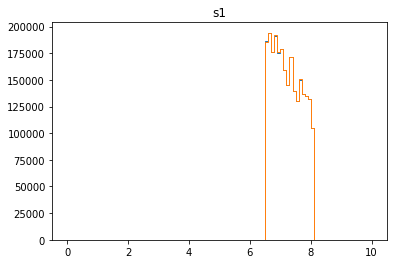

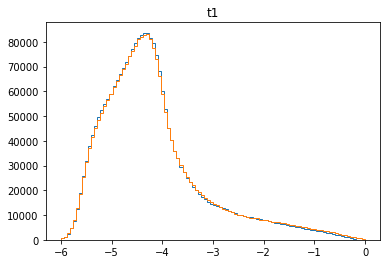

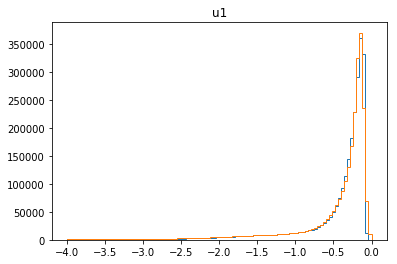

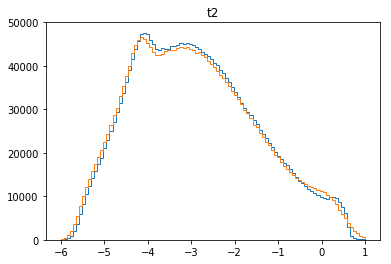

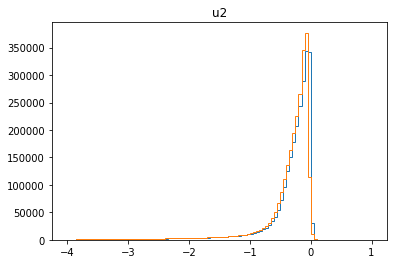

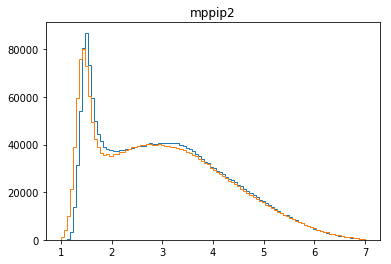

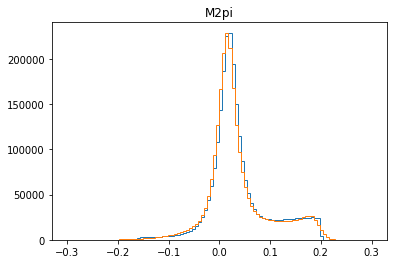

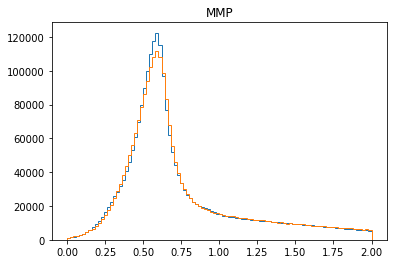

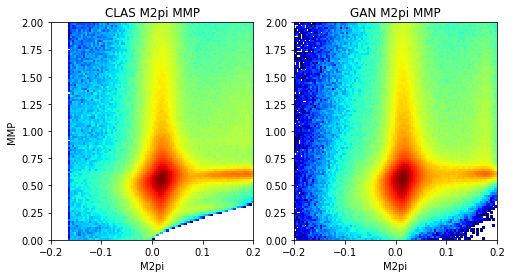

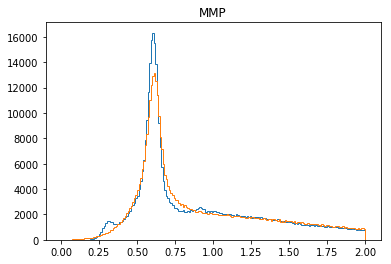

2301 [[0.13233274, 0.1322087, 0.00012403296], [0.11704682, 0.116327755, 0.0007190665], [0.018153124, 0.018147964, 5.1604043e-06], [-0.12730362, -0.12737821, 7.4588694e-05], [-0.2496095, -0.25093237, 0.0013228667], [-0.3474093, -0.34910163, 0.00169231], [-0.34970298, -0.35027406, 0.0005710748], [-0.26350054, -0.2635415, 4.094918e-05], [-0.13406567, -0.13409033, 2.4668465e-05], [0.014869636, 0.0069209863, 0.007948649], [0.08801808, 0.08793996, 7.812179e-05], [0.07645526, 0.07637342, 8.184014e-05], [-0.037720907, -0.040353384, 0.0026324776], [-0.16348417, -0.1645306, 0.001046434], [-0.28838003, -0.28845516, 7.511675e-05], [-0.34584963, -0.34840268, 0.0025530357], [-0.35133442, -0.35133454, 1.2995224e-07], [-0.2946663, -0.29545972, 0.0007934207], [-0.19217075, -0.19315927, 0.0009885198], [-0.052193657, -0.052405894, 0.0002122362]]
2302 [[0.06083142, 0.06081897, 1.2450983e-05], [0.115186706, 0.112346336, 0.0028403713], [0.06879155, 0.06806171, 0.0007298473], [-0.067314774, -0.06894659, 0.00

2311 [[-0.43489215, -0.43668962, 0.0017974672], [-0.3240927, -0.32424352, 0.0001508332], [-0.19147201, -0.19172269, 0.00025068075], [-0.028158179, -0.02964306, 0.0014848821], [0.1113574, 0.11052361, 0.00083378586], [0.19128123, 0.19011194, 0.0011692942], [0.15494104, 0.15322274, 0.0017183021], [0.042414244, 0.042397395, 1.6847858e-05], [-0.09665221, -0.09717774, 0.0005255292], [-0.25226557, -0.25234094, 7.538148e-05], [-0.37111294, -0.3742626, 0.0031496594], [-0.4237474, -0.42498764, 0.0012402572], [-0.4228362, -0.42292684, 9.062234e-05], [-0.32279095, -0.32279098, 1.6822014e-08], [-0.1686771, -0.1691377, 0.00046059545], [-0.026982225, -0.027048867, 6.664195e-05], [0.10327691, 0.10184837, 0.0014285393], [0.1890522, 0.18605709, 0.002995105], [0.15320285, 0.15139355, 0.0018092928], [0.050977863, 0.05077306, 0.00020480002]]
2312 [[-0.096520625, -0.09765857, 0.0011379401], [-0.22459516, -0.22459875, 3.594454e-06], [-0.32524967, -0.32830796, 0.0030582743], [-0.3752571, -0.37675333, 0.001496

2321 [[-0.29362437, -0.29470414, 0.0010797665], [-0.42982692, -0.42988974, 6.283639e-05], [-0.5144264, -0.5148966, 0.00047014124], [-0.5335792, -0.53412974, 0.00055056874], [-0.47256047, -0.4726546, 9.414204e-05], [-0.3377625, -0.3388284, 0.0010658975], [-0.17444806, -0.17458755, 0.00013948325], [-0.016255787, -0.017394241, 0.0011384549], [0.10765529, 0.107162036, 0.0004932471], [0.20740767, 0.20650968, 0.00089798245], [0.22213233, 0.21992575, 0.0022065737], [0.14671169, 0.14671159, 1.0888107e-07], [0.023128245, 0.02080991, 0.0023183364], [-0.121236116, -0.12273248, 0.0014963697], [-0.24763854, -0.25178832, 0.004149781], [-0.34319538, -0.3433019, 0.00010651608], [-0.3970726, -0.39870012, 0.0016275035], [-0.34644645, -0.35063663, 0.00419018], [-0.21402094, -0.21528374, 0.001262794], [-0.06279438, -0.06341185, 0.0006174697]]
2322 [[0.07738906, 0.076248415, 0.0011406441], [0.17955689, 0.17871173, 0.00084516994], [0.22000304, 0.21777473, 0.0022283096], [0.14393988, 0.14381212, 0.0001277566

2331 [[0.09504709, 0.09503949, 7.596191e-06], [0.008838236, 0.0059744366, 0.0028637995], [-0.13836405, -0.13960591, 0.0012418696], [-0.29400778, -0.29427642, 0.00026862707], [-0.4019139, -0.4036726, 0.0017587015], [-0.42746827, -0.42778346, 0.00031519032], [-0.35545608, -0.3570137, 0.0015576328], [-0.21036339, -0.21108675, 0.0007233691], [-0.05413355, -0.055335682, 0.0012021326], [0.0945468, 0.09453349, 1.3313435e-05], [0.19630049, 0.1941982, 0.0021022917], [0.21628195, 0.21625537, 2.6579832e-05], [0.1267549, 0.12647381, 0.00028108514], [-0.011309467, -0.011334688, 2.5220976e-05], [-0.16412002, -0.1643466, 0.00022658662], [-0.29537165, -0.29690754, 0.001535879], [-0.3848977, -0.38494185, 4.4133376e-05], [-0.42015785, -0.42249146, 0.0023336066], [-0.37879187, -0.37973347, 0.00094159524], [-0.25564793, -0.26194003, 0.0062921094]]
2332 [[-0.09810384, -0.10350633, 0.005402483], [0.060040645, 0.059450265, 0.000590379], [0.18774007, 0.18768749, 5.258773e-05], [0.22445123, 0.22445107, 1.66604

2341 [[-0.33925122, -0.33927572, 2.4498244e-05], [-0.3993995, -0.39953327, 0.0001337761], [-0.3928993, -0.39636996, 0.0034706567], [-0.31632906, -0.31648576, 0.00015669853], [-0.1816165, -0.18199374, 0.0003772347], [-0.029630244, -0.029786417, 0.00015617372], [0.10591324, 0.10591317, 6.338814e-08], [0.16453724, 0.1574235, 0.007113734], [0.09950812, 0.09947886, 2.9259885e-05], [-0.0066366456, -0.008167148, 0.0015305019], [-0.15058376, -0.1508689, 0.0002851288], [-0.25677, -0.25766847, 0.0008984397], [-0.3409752, -0.3428594, 0.0018842058], [-0.36057633, -0.3637543, 0.003177983], [-0.32638448, -0.3287288, 0.002344307], [-0.21982285, -0.22298731, 0.0031644488], [-0.10970902, -0.11216716, 0.0024581389], [0.02087978, 0.016682437, 0.0041973437], [0.10088567, 0.09969238, 0.0011932873], [0.1006595, 0.100211345, 0.0004481546]]
2342 [[0.03274611, 0.03226691, 0.00047920016], [-0.09883053, -0.09926276, 0.00043222832], [-0.2041908, -0.20572923, 0.0015384216], [-0.28634933, -0.28662774, 0.00027840544

2351 [[-0.18895744, -0.18910205, 0.00014462066], [-0.043352563, -0.04335441, 1.8494355e-06], [0.0900565, 0.08662439, 0.0034321097], [0.15184931, 0.1502212, 0.0016281195], [0.11745992, 0.11745902, 8.986135e-07], [0.015685959, 0.013754936, 0.0019310229], [-0.12964292, -0.1298037, 0.00016078376], [-0.25316116, -0.25339457, 0.00023341305], [-0.3366505, -0.33816937, 0.0015188834], [-0.3651884, -0.367824, 0.0026356103], [-0.33260548, -0.33260587, 3.985806e-07], [-0.24950978, -0.24996029, 0.00045049962], [-0.15522215, -0.15533112, 0.00010897103], [-0.04429835, -0.046946116, 0.0026477664], [0.038645398, 0.038633134, 1.2263248e-05], [0.027840596, 0.027436523, 0.0004040722], [-0.042487256, -0.044627145, 0.0021398885], [-0.15574057, -0.1560301, 0.00028952578], [-0.26984823, -0.28279305, 0.012944807], [-0.40005898, -0.40051094, 0.00045195819]]
2352 [[-0.42196217, -0.42386663, 0.0019044615], [-0.4018107, -0.4032137, 0.0014029903], [-0.31710365, -0.31727725, 0.00017360604], [-0.18592525, -0.18594202

2361 [[0.10115889, 0.10115297, 5.91399e-06], [0.01563343, 0.015617432, 1.5997679e-05], [-0.089636065, -0.08967502, 3.8948143e-05], [-0.23052643, -0.23057841, 5.1980896e-05], [-0.2996284, -0.31076413, 0.011135731], [-0.32052422, -0.3209969, 0.00047270878], [-0.26412368, -0.2656762, 0.0015525182], [-0.16338746, -0.1653041, 0.0019166336], [-0.03494244, -0.035146043, 0.00020360081], [0.038234293, 0.037687298, 0.00054699427], [0.005329087, 0.0051203924, 0.00020869437], [-0.06727371, -0.067942545, 0.0006688296], [-0.1796418, -0.18163875, 0.001996952], [-0.30063695, -0.30173522, 0.0010982716], [-0.36930346, -0.37077442, 0.00147095], [-0.35734344, -0.3573662, 2.2755563e-05], [-0.2893384, -0.2894351, 9.6675736e-05], [-0.17445368, -0.17612456, 0.0016708791], [-0.027509995, -0.027741546, 0.00023155182], [0.106491104, 0.10560463, 0.0008864738]]
2362 [[0.15078342, 0.15020283, 0.0005805949], [0.08597429, 0.08397683, 0.0019974636], [-0.057655886, -0.0577606, 0.000104712766], [-0.18914743, -0.1893678,

2371 [[0.16515763, 0.16448118, 0.0006764475], [0.07610213, 0.076022856, 7.927238e-05], [-0.053814508, -0.056486867, 0.0026723596], [-0.18538627, -0.18541113, 2.4858296e-05], [-0.2778661, -0.27844688, 0.0005807787], [-0.32737723, -0.32954314, 0.0021659073], [-0.2742363, -0.27679318, 0.0025568923], [-0.14765523, -0.14823446, 0.00057921687], [-0.006943166, -0.008040932, 0.0010977661], [0.11564452, 0.11118316, 0.0044613634], [0.18027614, 0.17818311, 0.0020930318], [0.15241003, 0.15182759, 0.0005824346], [0.039822135, 0.039651133, 0.00017100223], [-0.11322493, -0.11335643, 0.00013149164], [-0.24505296, -0.24556883, 0.0005158671], [-0.36965185, -0.37093383, 0.0012819798], [-0.42207566, -0.4236425, 0.0015668303], [-0.3938395, -0.39387348, 3.397558e-05], [-0.28385076, -0.28619063, 0.0023398767], [-0.13426696, -0.13462402, 0.00035706273]]
2372 [[0.033366665, 0.027515884, 0.0058507817], [0.15346003, 0.15336926, 9.076766e-05], [0.22634766, 0.2234961, 0.0028515642], [0.20097788, 0.19288746, 0.0080

2381 [[-0.27389643, -0.27571627, 0.0018198551], [-0.37672117, -0.37952042, 0.0027992502], [-0.43579003, -0.43591675, 0.0001267239], [-0.4282899, -0.4298941, 0.0016041959], [-0.32910138, -0.329984, 0.00088261644], [-0.16678242, -0.16708077, 0.00029835477], [-0.006156952, -0.006324925, 0.00016797284], [0.15698089, 0.15679209, 0.00018880244], [0.25296068, 0.25031978, 0.0026409007], [0.25392008, 0.2533606, 0.0005594659], [0.1581541, 0.1568025, 0.0013516024], [0.0044369646, 0.0020415902, 0.0023953745], [-0.14315076, -0.14346291, 0.0003121501], [-0.26981354, -0.26987487, 6.1333536e-05], [-0.33617392, -0.33627984, 0.000105926374], [-0.33459166, -0.33562407, 0.0010324138], [-0.26280367, -0.2628067, 3.039153e-06], [-0.15388207, -0.15389276, 1.068764e-05], [-0.007952957, -0.007980831, 2.7873553e-05], [0.115084134, 0.11461068, 0.0004734555]]
2382 [[0.18723889, 0.18632253, 0.00091636553], [0.15201573, 0.15196651, 4.9213428e-05], [0.066489846, 0.06629187, 0.00019797929], [-0.027533814, -0.02859188,

2391 [[0.2335509, 0.23241529, 0.001135625], [0.19829471, 0.19580127, 0.0024934432], [0.08082534, 0.0807744, 5.094103e-05], [-0.057061203, -0.058341134, 0.0012799322], [-0.18050437, -0.18107654, 0.0005721692], [-0.26313403, -0.26388484, 0.00075081317], [-0.29181728, -0.29217845, 0.00036118334], [-0.24665427, -0.2512517, 0.004597428], [-0.1694488, -0.17090021, 0.0014514106], [-0.038561106, -0.03857962, 1.8515624e-05], [0.05610278, 0.055766456, 0.00033632468], [0.100855336, 0.099663496, 0.0011918383], [0.039098382, 0.03894359, 0.00015479428], [-0.07548377, -0.07904331, 0.003559538], [-0.199121, -0.19912463, 3.6307065e-06], [-0.26570868, -0.2665035, 0.0007948182], [-0.3078662, -0.30796093, 9.473519e-05], [-0.25348395, -0.25358373, 9.977581e-05], [-0.14592908, -0.14716572, 0.0012366325], [-0.006471248, -0.006885583, 0.00041433517]]
2392 [[0.1134366, 0.11337767, 5.8937534e-05], [0.17932917, 0.17887956, 0.00044960936], [0.15301064, 0.15296715, 4.347694e-05], [0.024017444, 0.02372257, 0.000294

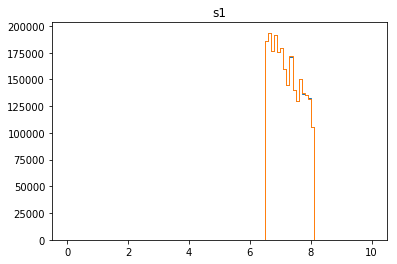

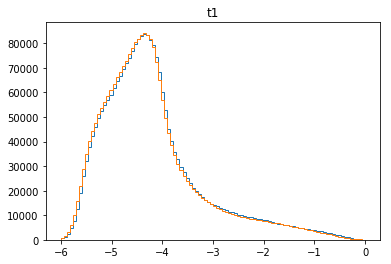

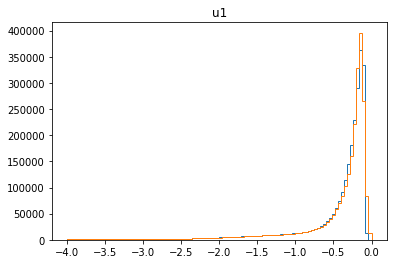

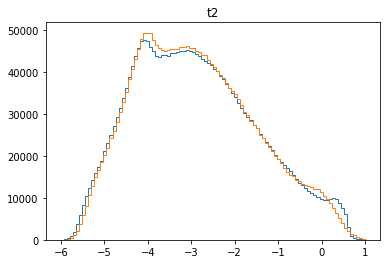

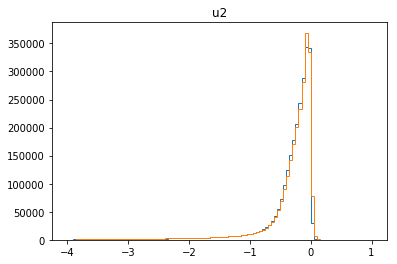

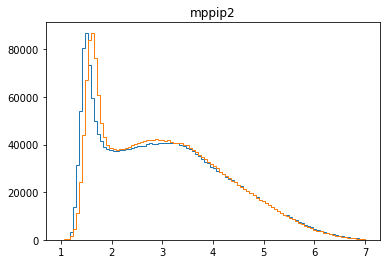

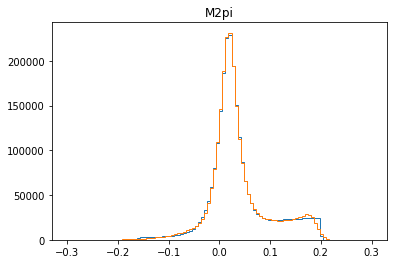

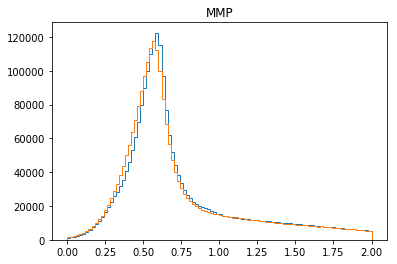

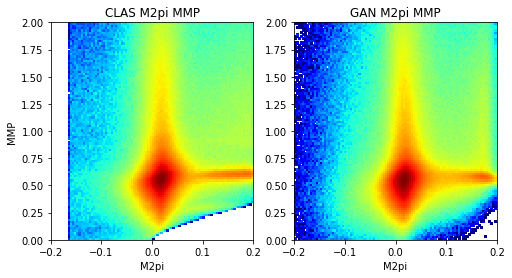

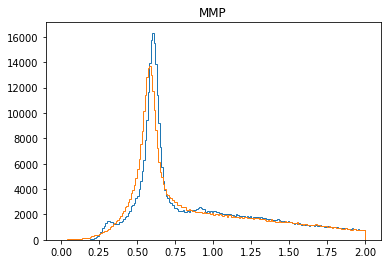

2401 [[-0.16990691, -0.17512427, 0.005217359], [-0.06697547, -0.06980832, 0.0028328546], [0.06827281, 0.06710625, 0.0011665567], [0.14659514, 0.14658906, 6.082152e-06], [0.15740067, 0.15044658, 0.00695409], [0.09639763, 0.0960675, 0.0003301272], [-0.025618445, -0.025836783, 0.00021833694], [-0.17609756, -0.17615542, 5.785894e-05], [-0.2925055, -0.29255038, 4.4871354e-05], [-0.35729906, -0.35820898, 0.0009099102], [-0.35494915, -0.35694373, 0.0019945663], [-0.28448942, -0.28663, 0.0021405942], [-0.1378485, -0.13806921, 0.00022071079], [0.017403182, 0.0134082185, 0.003994963], [0.15356855, 0.14879514, 0.004773413], [0.19166087, 0.19142517, 0.00023569155], [0.1909304, 0.18911347, 0.001816927], [0.12071416, 0.11948155, 0.0012326115], [-0.019099068, -0.019804087, 0.00070501934], [-0.16000646, -0.16003434, 2.7873553e-05]]
2402 [[-0.2876321, -0.2882964, 0.00066429924], [-0.34734783, -0.34959075, 0.002242919], [-0.34671652, -0.34901306, 0.002296531], [-0.25127032, -0.25127453, 4.2041397e-06], 

2411 [[-0.16246203, -0.16257833, 0.00011629788], [-0.020262988, -0.021009104, 0.0007461168], [0.12861767, 0.12821114, 0.00040652975], [0.21801537, 0.21444947, 0.0035659135], [0.20556639, 0.20524089, 0.00032549974], [0.12033071, 0.12032404, 6.6794205e-06], [-0.01796297, -0.01834526, 0.00038228973], [-0.17045924, -0.17129181, 0.0008325747], [-0.30156237, -0.30172685, 0.00016448094], [-0.3968972, -0.3969057, 8.482782e-06], [-0.39242044, -0.39359692, 0.0011764796], [-0.3161188, -0.31632438, 0.00020556505], [-0.16757847, -0.1675841, 5.638958e-06], [-0.014120205, -0.014120213, 7.366907e-09], [0.14446202, 0.14293823, 0.0015237933], [0.24356557, 0.24356543, 1.5139813e-07], [0.27092385, 0.2699364, 0.0009874407], [0.18197085, 0.1816537, 0.00031715742], [0.04309097, 0.042859532, 0.00023143576], [-0.119489186, -0.1196578, 0.00016861617]]
2412 [[-0.25422117, -0.25434592, 0.00012475625], [-0.35558543, -0.35579142, 0.0002060028], [-0.39054382, -0.39054444, 6.2957406e-07], [-0.34552917, -0.3456106, 8.

2421 [[0.141319, 0.14124665, 7.236523e-05], [0.051481668, 0.049947135, 0.0015345338], [-0.060914356, -0.06179981, 0.00088545197], [-0.19135047, -0.19137134, 2.0867541e-05], [-0.30134362, -0.30164576, 0.00030212238], [-0.3200781, -0.32073152, 0.0006534305], [-0.2840717, -0.28591985, 0.0018481169], [-0.16315399, -0.16337475, 0.0002207675], [-0.024851296, -0.025471328, 0.00062003173], [0.12793924, 0.12021582, 0.0077234204], [0.2033789, 0.2029462, 0.0004327042], [0.1663014, 0.16595769, 0.00034371042], [0.057292927, 0.057259593, 3.3333818e-05], [-0.07479039, -0.07487393, 8.353986e-05], [-0.22479554, -0.22480884, 1.3313435e-05], [-0.3400943, -0.34009758, 3.2694663e-06], [-0.4301561, -0.43262923, 0.002473103], [-0.41874322, -0.41874325, 4.087633e-08], [-0.34187222, -0.34225085, 0.00037864374], [-0.18666312, -0.18718664, 0.00052351976]]
2422 [[-0.009344028, -0.009787351, 0.00044332235], [0.12180609, 0.12033836, 0.0014677331], [0.18949798, 0.18949239, 5.584738e-06], [0.17473167, 0.1747043, 2.73

2431 [[0.27819493, 0.27819398, 9.536743e-07], [0.26140285, 0.26135936, 4.347694e-05], [0.15739918, 0.15739916, 8.734787e-09], [0.016835324, 0.016047053, 0.0007882714], [-0.14602688, -0.1467199, 0.0006930175], [-0.28327832, -0.28492913, 0.0016508246], [-0.38015363, -0.38101685, 0.00086323137], [-0.43335852, -0.43347323, 0.000114699], [-0.39817038, -0.3982644, 9.403106e-05], [-0.29544285, -0.29718956, 0.0017467238], [-0.150051, -0.15094282, 0.0008918201], [-0.00887762, -0.00892145, 4.382979e-05], [0.13787366, 0.13473278, 0.003140888], [0.21655132, 0.21514376, 0.0014075664], [0.19752805, 0.19747859, 4.945457e-05], [0.106372654, 0.104101464, 0.0022711908], [-0.030147268, -0.031594466, 0.0014471991], [-0.16206919, -0.16411139, 0.0020422093], [-0.29005474, -0.2900548, 5.9604645e-08], [-0.3691443, -0.3698146, 0.00067031017]]
2432 [[-0.39034572, -0.39063028, 0.00028454934], [-0.3176915, -0.31896532, 0.0012737979], [-0.19732557, -0.19813477, 0.00080918614], [-0.037417013, -0.040807683, 0.003390

2441 [[-0.00548553, -0.009204304, 0.003718774], [0.13385704, 0.1318286, 0.0020284415], [0.21707757, 0.21498331, 0.002094254], [0.22763377, 0.22530349, 0.0023302909], [0.14634015, 0.14200878, 0.0043313596], [-0.0016036298, -0.0019419162, 0.00033828637], [-0.14057559, -0.14327067, 0.002695086], [-0.26115748, -0.2611899, 3.2436932e-05], [-0.34353942, -0.34353954, 1.1787051e-07], [-0.36877292, -0.36877573, 2.8108516e-06], [-0.3011824, -0.30164078, 0.0004583876], [-0.20365456, -0.20438369, 0.00072912616], [-0.056184016, -0.056763325, 0.0005793087], [0.09871285, 0.0956345, 0.0030783487], [0.19557936, 0.19481859, 0.00076077605], [0.18648802, 0.18647367, 1.43489015e-05], [0.06294559, 0.0629254, 2.019346e-05], [-0.088239, -0.08843128, 0.00019227774], [-0.23731983, -0.2380282, 0.0007083658], [-0.34244692, -0.34343845, 0.0009915205]]
2442 [[-0.39747164, -0.39811718, 0.00064555585], [-0.38181016, -0.3818973, 8.713408e-05], [-0.2856165, -0.2864372, 0.0008207295], [-0.13329563, -0.13333926, 4.362798

2451 [[0.21494478, 0.21492846, 1.6319698e-05], [0.18240917, 0.18054312, 0.0018660355], [0.08814235, 0.088137336, 5.014139e-06], [-0.05134891, -0.05139196, 4.305039e-05], [-0.1835094, -0.19035038, 0.006840988], [-0.29887378, -0.29915634, 0.00028255803], [-0.35429648, -0.3553829, 0.0010864203], [-0.34806213, -0.34994417, 0.001882054], [-0.25337315, -0.25361255, 0.00023939554], [-0.11185649, -0.1119953, 0.00013880827], [0.042940054, 0.04249432, 0.00044573526], [0.162252, 0.1614191, 0.0008329048], [0.20750056, 0.20604435, 0.0014562105], [0.1648575, 0.16448998, 0.0003675181], [0.031904504, 0.031666815, 0.00023768695], [-0.13122354, -0.13123958, 1.6028209e-05], [-0.27442566, -0.27442566, 3.7252903e-09], [-0.38418388, -0.38492107, 0.0007371828], [-0.42746323, -0.42787802, 0.0004148012], [-0.38962623, -0.3922736, 0.0026473738]]
2452 [[-0.26727563, -0.2682428, 0.0009671676], [-0.10943263, -0.11536129, 0.005928655], [0.04823033, 0.046292428, 0.0019379022], [0.16699317, 0.16531636, 0.0016768096],

2461 [[-0.38909832, -0.38967425, 0.0005759165], [-0.44651002, -0.44845802, 0.0019479904], [-0.43528533, -0.43531656, 3.1231688e-05], [-0.32560048, -0.32672662, 0.0011261322], [-0.16921306, -0.16981283, 0.0005997776], [0.001423999, 0.001321538, 0.00010246094], [0.1575985, 0.15752855, 6.995187e-05], [0.2581556, 0.25768596, 0.00046964502], [0.2960043, 0.29438585, 0.0016184365], [0.22399357, 0.22307616, 0.00091740506], [0.059739336, 0.05973918, 1.5588375e-07], [-0.11293107, -0.113078736, 0.00014766424], [-0.2602778, -0.2610723, 0.00079449575], [-0.38922858, -0.3903041, 0.0010755088], [-0.47454837, -0.47494596, 0.00039758053], [-0.48422197, -0.48434895, 0.00012698171], [-0.39924523, -0.39931193, 6.670424e-05], [-0.25567383, -0.25705433, 0.0013805055], [-0.09730488, -0.09961661, 0.0023117291], [0.05555572, 0.055500895, 5.482406e-05]]
2462 [[0.18692139, 0.18293558, 0.0039858064], [0.20299548, 0.20296635, 2.913621e-05], [0.14453353, 0.14149147, 0.003042052], [-0.0033641588, -0.00345602, 9.1861

2471 [[0.21121746, 0.2109421, 0.0002753586], [0.078089505, 0.07772294, 0.000366568], [-0.08116984, -0.08219553, 0.0010256834], [-0.22923143, -0.2292771, 4.5667002e-05], [-0.3616803, -0.36170232, 2.201559e-05], [-0.43901396, -0.43902677, 1.2803415e-05], [-0.4267921, -0.4270315, 0.00023939554], [-0.3384596, -0.3418155, 0.003355884], [-0.19227175, -0.19292314, 0.0006513844], [-0.025633616, -0.02563383, 2.1481902e-07], [0.114218466, 0.11408359, 0.00013488141], [0.17592517, 0.17575645, 0.00016871528], [0.11490983, 0.11302264, 0.0018871876], [-0.007839049, -0.007949178, 0.0001101289], [-0.15549314, -0.15762052, 0.0021273778], [-0.29549927, -0.29683688, 0.0013376144], [-0.41223696, -0.41224536, 8.41625e-06], [-0.47036198, -0.4720485, 0.0016865085], [-0.44144908, -0.44332203, 0.0018729628], [-0.3130429, -0.31304294, 2.3283064e-08]]
2472 [[-0.13578434, -0.13964708, 0.0038627412], [0.030627504, 0.027511368, 0.003116137], [0.15375845, 0.15331857, 0.0004398754], [0.20545118, 0.20525932, 0.00019185

2481 [[-0.3067057, -0.30702436, 0.00031865374], [-0.15477318, -0.15550756, 0.0007343888], [0.0065376684, 0.004841904, 0.0016957643], [0.1311637, 0.12757795, 0.0035857589], [0.15693888, 0.1564464, 0.00049248495], [0.098599814, 0.097936004, 0.00066380773], [-0.050885633, -0.050943695, 5.806223e-05], [-0.21770617, -0.22019695, 0.0024907773], [-0.33203143, -0.33340245, 0.0013710255], [-0.41848364, -0.4186004, 0.00011675084], [-0.4247084, -0.42472762, 1.9211455e-05], [-0.34427828, -0.34505555, 0.00077727844], [-0.20939425, -0.20947264, 7.8391764e-05], [-0.05345065, -0.053672556, 0.00022190253], [0.08189471, 0.08123659, 0.0006581194], [0.18696673, 0.18588106, 0.0010856661], [0.2081681, 0.20793568, 0.00023242338], [0.095406875, 0.09314567, 0.0022612028], [-0.06089713, -0.06205809, 0.0011609609], [-0.21668456, -0.21669653, 1.19711185e-05]]
2482 [[-0.3560463, -0.35654208, 0.000495792], [-0.44379833, -0.44418034, 0.0003819914], [-0.44639328, -0.447188, 0.00079471065], [-0.36684927, -0.36958373, 

2491 [[-0.21910502, -0.22228816, 0.0031831462], [-0.11182038, -0.11192709, 0.000106713036], [0.03860663, 0.03522861, 0.0033780194], [0.15567492, 0.1556603, 1.4624765e-05], [0.14758192, 0.14745095, 0.00013096724], [0.081256635, 0.07881021, 0.0024464263], [-0.047339953, -0.047565624, 0.0002256688], [-0.19622798, -0.1962286, 6.175251e-07], [-0.31656784, -0.31922385, 0.0026560172], [-0.40808076, -0.40817317, 9.241048e-05], [-0.44010875, -0.44249722, 0.002388472], [-0.38787416, -0.3891668, 0.0012926558], [-0.2826987, -0.2832747, 0.00057600805], [-0.15844448, -0.1584634, 1.892826e-05], [-0.034580313, -0.035199586, 0.00061927206], [0.066493705, 0.066313244, 0.00018045775], [0.06151033, 0.061485566, 2.4763287e-05], [-0.02664516, -0.027167283, 0.00052212423], [-0.1167196, -0.11681012, 9.051345e-05], [-0.19046132, -0.19161877, 0.001157454]]
2492 [[-0.24032669, -0.24154834, 0.0012216538], [-0.22632042, -0.22752176, 0.0012013391], [-0.15867242, -0.15982987, 0.001157454], [-0.054948356, -0.05749599

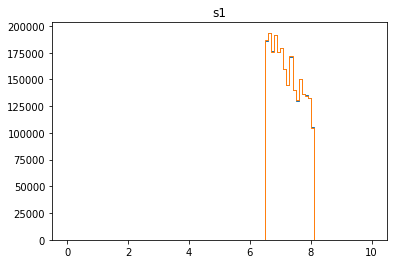

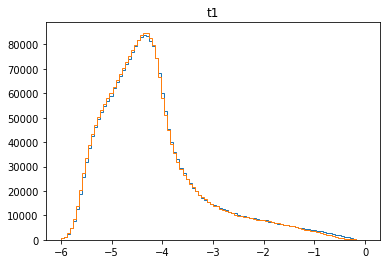

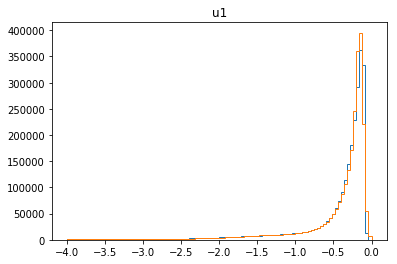

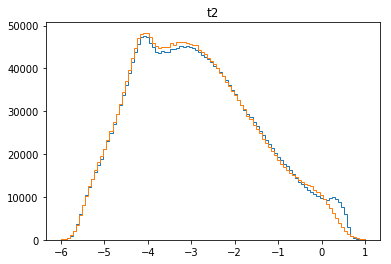

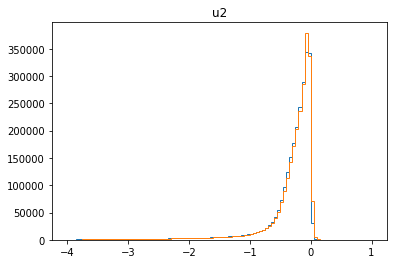

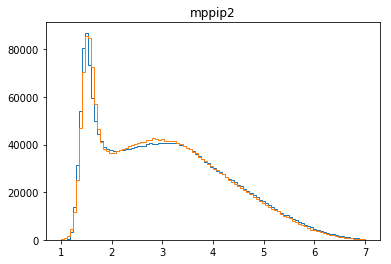

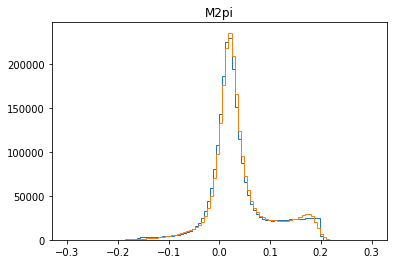

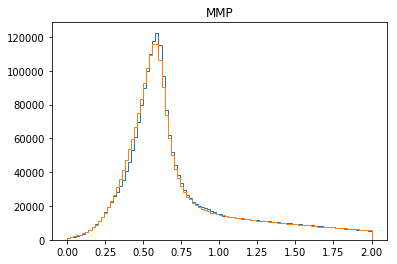

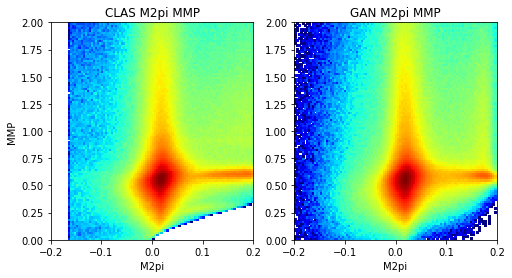

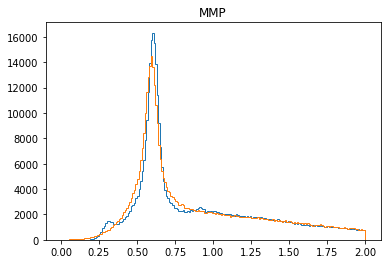

2501 [[-0.35124984, -0.35185206, 0.000602209], [-0.35179725, -0.35433277, 0.0025355257], [-0.27849412, -0.2785026, 8.505017e-06], [-0.14439662, -0.14440216, 5.5487367e-06], [0.021370465, 0.021076508, 0.00029395643], [0.15273342, 0.1527334, 1.02190825e-08], [0.20508297, 0.20397697, 0.0011059967], [0.16915071, 0.16900851, 0.00014219951], [0.068845, 0.068825915, 1.9077926e-05], [-0.074276604, -0.07427776, 1.1572265e-06], [-0.20967697, -0.20975956, 8.2601124e-05], [-0.30264452, -0.3057989, 0.0031543712], [-0.32649127, -0.33047995, 0.003988696], [-0.30473265, -0.30600578, 0.0012731174], [-0.2030885, -0.20319189, 0.00010338976], [-0.06386719, -0.06438583, 0.0005186433], [0.03251849, 0.030536173, 0.001982319], [0.056431618, 0.056220602, 0.00021101534], [0.030545734, 0.027267624, 0.003278111], [-0.049632244, -0.053607218, 0.003974976]]
2502 [[-0.17088553, -0.17126864, 0.0003831106], [-0.23245893, -0.23280257, 0.0003436397], [-0.22006725, -0.2224789, 0.0024116451], [-0.16355395, -0.16583006, 0.

2511 [[0.09783503, 0.09733472, 0.00050030404], [-0.05400173, -0.05403093, 2.919801e-05], [-0.2106962, -0.21215971, 0.0014634978], [-0.3226683, -0.32267717, 8.853385e-06], [-0.3782922, -0.37839037, 9.818187e-05], [-0.3376787, -0.33803317, 0.0003544724], [-0.22129942, -0.22179776, 0.00049834355], [-0.06192622, -0.062424988, 0.00049876946], [0.09964234, 0.09786664, 0.0017756997], [0.19950788, 0.19946869, 3.9186576e-05], [0.23376328, 0.22929554, 0.004467736], [0.13488948, 0.1347413, 0.0001481746], [-0.011976687, -0.013911904, 0.0019352161], [-0.17506951, -0.1765041, 0.0014346011], [-0.32137612, -0.32243034, 0.0010542226], [-0.41931525, -0.4259474, 0.006632159], [-0.39278126, -0.39369994, 0.00091867655], [-0.31408715, -0.31420648, 0.00011932035], [-0.16687636, -0.16728605, 0.00040968935], [-0.01540287, -0.020116381, 0.0047135106]]
2512 [[0.119278714, 0.117890686, 0.0013880276], [0.20529899, 0.20515792, 0.00014106455], [0.23680644, 0.23662777, 0.00017866866], [0.13646708, 0.13604854, 0.00041

2521 [[-0.38281092, -0.38281128, 3.6557685e-07], [-0.2713948, -0.2760057, 0.004610888], [-0.12424399, -0.1253973, 0.001153305], [0.015698865, 0.015398133, 0.00030073154], [0.13666843, 0.13304144, 0.0036269946], [0.15259545, 0.15258454, 1.0900699e-05], [0.078660846, 0.07862893, 3.1917607e-05], [-0.05445088, -0.055213764, 0.00076288177], [-0.19527356, -0.1956932, 0.00041963218], [-0.32883903, -0.32982972, 0.0009906798], [-0.42498085, -0.42509505, 0.00011420927], [-0.44879472, -0.4505227, 0.0017279616], [-0.37708455, -0.38081357, 0.0037290163], [-0.23878098, -0.24046576, 0.0016847858], [-0.07231922, -0.07275518, 0.0004359638], [0.07199264, 0.07195652, 3.6120768e-05], [0.15334314, 0.15333322, 9.9284225e-06], [0.13391146, 0.13384107, 7.0399255e-05], [0.06373542, 0.052243855, 0.011491566], [-0.08279021, -0.08280201, 1.1800153e-05]]
2522 [[-0.21604653, -0.21634746, 0.00030093006], [-0.32133895, -0.32147342, 0.00013448298], [-0.39757368, -0.39758936, 1.566377e-05], [-0.40475762, -0.4060211, 0.

2531 [[-0.123154216, -0.12433122, 0.001177003], [-0.0014811943, -0.0015524282, 7.12339e-05], [0.11832211, 0.11481834, 0.0035037708], [0.15169899, 0.14642915, 0.0052698436], [0.08307579, 0.08269178, 0.00038400714], [-0.041844282, -0.041900158, 5.587412e-05], [-0.16648683, -0.16679515, 0.00030832025], [-0.26282102, -0.2628289, 7.861308e-06], [-0.30659547, -0.3072658, 0.00067031017], [-0.29585123, -0.29605865, 0.0002074288], [-0.17479663, -0.17494208, 0.00014544759], [-0.03478054, -0.035082992, 0.000302454], [0.092729434, 0.092729226, 2.0954758e-07], [0.14598513, 0.14415272, 0.001832407], [0.096050635, 0.09428409, 0.0017665491], [-0.024719607, -0.02473827, 1.8663648e-05], [-0.17576703, -0.17624849, 0.00048145748], [-0.3024362, -0.30327165, 0.0008354389], [-0.41255975, -0.41421133, 0.0016515999], [-0.41504973, -0.41550332, 0.00045358157]]
2532 [[-0.32484362, -0.32486054, 1.6926237e-05], [-0.19017133, -0.19207413, 0.0019027973], [-0.038414776, -0.03874083, 0.00032605047], [0.08515101, 0.085

2541 [[0.051928695, 0.050986633, 0.00094206363], [-0.08701491, -0.087078325, 6.341224e-05], [-0.24128132, -0.24139313, 0.000111816684], [-0.36464393, -0.37026274, 0.0056188214], [-0.44821978, -0.4489117, 0.0006919133], [-0.44417417, -0.44624683, 0.0020726623], [-0.3684868, -0.369951, 0.0014642277], [-0.23283602, -0.23502667, 0.0021906544], [-0.059600674, -0.059862345, 0.00026167024], [0.10439954, 0.10401785, 0.00038169327], [0.20453976, 0.20452413, 1.563359e-05], [0.19907026, 0.19819905, 0.0008712072], [0.08755059, 0.08658188, 0.0009687105], [-0.06350872, -0.067837566, 0.0043288493], [-0.2329561, -0.2329998, 4.3703607e-05], [-0.35327008, -0.35381734, 0.00054726197], [-0.42577863, -0.425903, 0.00012437308], [-0.44214088, -0.44222233, 8.1460996e-05], [-0.38052368, -0.38080445, 0.0002807655], [-0.24239518, -0.24375394, 0.0013587644]]
2542 [[-0.07817748, -0.07832464, 0.00014715479], [0.081178345, 0.08099257, 0.00018577452], [0.1748745, 0.17425142, 0.000623075], [0.17358938, 0.17329575, 0.0

2551 [[0.17341961, 0.17341876, 8.5574356e-07], [0.06439183, 0.0634136, 0.000978232], [-0.078733034, -0.0787419, 8.86474e-06], [-0.21921211, -0.22041081, 0.0011986961], [-0.30143562, -0.30477583, 0.0033402124], [-0.33130157, -0.33137792, 7.6345015e-05], [-0.28171134, -0.28287542, 0.0011640824], [-0.18449497, -0.18770681, 0.0032118347], [-0.040431727, -0.040992457, 0.00056072976], [0.11573048, 0.11550182, 0.00022865855], [0.21900918, 0.21826066, 0.00074851536], [0.2313838, 0.23132904, 5.4767588e-05], [0.14239366, 0.14136186, 0.0010318011], [0.0028361767, 0.0022702862, 0.00056589046], [-0.15571362, -0.15615661, 0.0004430011], [-0.2707061, -0.27122778, 0.00052168843], [-0.33739287, -0.33744848, 5.561778e-05], [-0.30160967, -0.30325663, 0.001646952], [-0.20553225, -0.2065599, 0.001027639], [-0.0764924, -0.07692956, 0.00043715938]]
2552 [[0.05819074, 0.057528015, 0.00066272693], [0.14594361, 0.14593594, 7.6805345e-06], [0.16143368, 0.16135298, 8.070528e-05], [0.11762315, 0.11680253, 0.000820

2561 [[-0.26181293, -0.2621529, 0.00033997235], [-0.10506318, -0.10761409, 0.002550916], [0.054320514, 0.05346879, 0.00085172587], [0.15945932, 0.15940006, 5.9260114e-05], [0.19318672, 0.1930979, 8.881573e-05], [0.12488694, 0.12475413, 0.00013280721], [-0.030239107, -0.03030628, 6.7172405e-05], [-0.18169078, -0.1825502, 0.00085942476], [-0.32347918, -0.32569885, 0.0022196744], [-0.4217524, -0.42298368, 0.0012312726], [-0.441499, -0.44160116, 0.00010215227], [-0.3750053, -0.37518325, 0.0001779555], [-0.26084387, -0.26103622, 0.00019233064], [-0.113402955, -0.116308756, 0.0029058012], [0.026666166, 0.025691748, 0.00097441784], [0.13164896, 0.13146167, 0.00018728542], [0.13593954, 0.13586655, 7.298309e-05], [0.072135404, 0.0708934, 0.0012420042], [-0.0508253, -0.05163048, 0.00080517615], [-0.2081115, -0.20843062, 0.00031913057]]
2562 [[-0.33468404, -0.33803904, 0.0033550002], [-0.41507816, -0.41596988, 0.00089170615], [-0.4154772, -0.41590634, 0.00042914072], [-0.35513097, -0.3553461, 0.0

2571 [[-0.44366723, -0.4449326, 0.0012653708], [-0.41254938, -0.41258585, 3.6465484e-05], [-0.29895484, -0.29932362, 0.0003687624], [-0.17065665, -0.17119026, 0.00053360534], [-0.03385067, -0.03497271, 0.0011220395], [0.078000106, 0.07310229, 0.0048978208], [0.076216444, 0.07445005, 0.0017663885], [-0.0024416598, -0.0025277997, 8.6139895e-05], [-0.10154134, -0.10207609, 0.0005347515], [-0.24335343, -0.24378154, 0.0004281141], [-0.34243193, -0.34274146, 0.0003095272], [-0.3871974, -0.39033318, 0.0031357594], [-0.34396327, -0.34760383, 0.003640562], [-0.24344365, -0.24513753, 0.0016938796], [-0.12014494, -0.12046468, 0.0003197442], [0.017879978, 0.010533029, 0.007346948], [0.12209508, 0.12183501, 0.0002600683], [0.12971891, 0.12967135, 4.7568232e-05], [0.033035576, 0.03187994, 0.0011556379], [-0.11102767, -0.11107296, 4.5281136e-05]]
2572 [[-0.26963422, -0.2696454, 1.1166791e-05], [-0.38565177, -0.38567194, 2.017632e-05], [-0.4379678, -0.43819377, 0.00022595545], [-0.44681576, -0.4468290

2581 [[0.22436973, 0.22436808, 1.6477462e-06], [0.23537911, 0.23528637, 9.27408e-05], [0.14509381, 0.14452146, 0.00057235174], [-0.0030022764, -0.0067611695, 0.003758893], [-0.14579318, -0.14881507, 0.003021887], [-0.2774033, -0.27831644, 0.00091313507], [-0.3499054, -0.3499314, 2.5973655e-05], [-0.37389755, -0.3740602, 0.00016267574], [-0.337741, -0.33779848, 5.7482343e-05], [-0.2092778, -0.21038266, 0.0011048553], [-0.04825563, -0.050423667, 0.0021680382], [0.120058596, 0.11977224, 0.000286354], [0.2097744, 0.20833431, 0.0014400969], [0.17341031, 0.17277788, 0.0006324416], [0.04861698, 0.048604432, 1.2545384e-05], [-0.12535515, -0.1256437, 0.00028855292], [-0.2841129, -0.28433782, 0.00022492449], [-0.42529398, -0.42543852, 0.00014452892], [-0.49712506, -0.49718067, 5.561778e-05], [-0.49166107, -0.4916717, 1.0625375e-05]]
2582 [[-0.38957343, -0.39232105, 0.002747621], [-0.24499828, -0.24612902, 0.0011307454], [-0.06204998, -0.062288314, 0.0002383343], [0.0924823, 0.09151573, 0.0009665

2591 [[0.22594789, 0.22516827, 0.00077962], [0.168633, 0.16863298, 9.837095e-09], [0.009214842, 0.008504139, 0.0007107029], [-0.14017187, -0.14171599, 0.0015441126], [-0.29451168, -0.29504898, 0.0005373128], [-0.40399477, -0.40403962, 4.484581e-05], [-0.45987147, -0.45999712, 0.00012565263], [-0.4414566, -0.44209865, 0.0006420714], [-0.3343674, -0.33698815, 0.0026207475], [-0.16912033, -0.16986603, 0.0007457002], [0.022327995, 0.022067988, 0.00026000678], [0.17813951, 0.1774506, 0.0006889062], [0.2733363, 0.2711768, 0.0021595205], [0.2782521, 0.27588204, 0.0023700506], [0.16613397, 0.16612469, 9.278335e-06], [-0.00085431524, -0.0033877285, 0.0025334132], [-0.17321263, -0.17350255, 0.0002899154], [-0.32157788, -0.32159087, 1.2981477e-05], [-0.44834426, -0.44948465, 0.0011403864], [-0.49822044, -0.49945736, 0.0012369008]]
2592 [[-0.46552953, -0.46583813, 0.00030858826], [-0.3468734, -0.3469843, 0.00011089083], [-0.18051775, -0.1811945, 0.00067674526], [-0.0071433606, -0.0087438915, 0.001

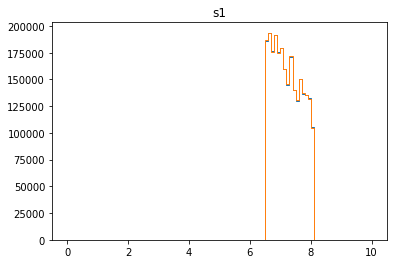

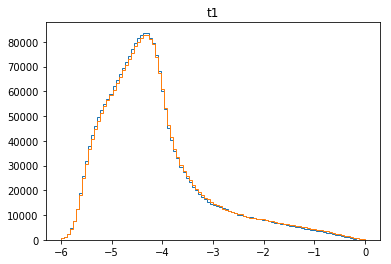

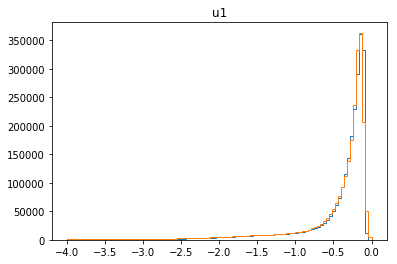

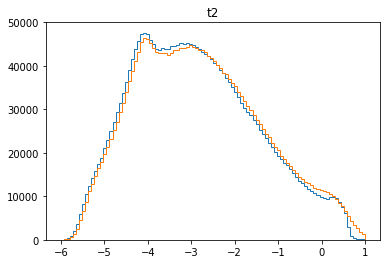

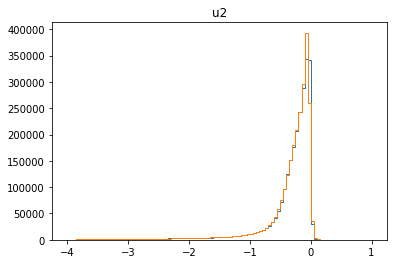

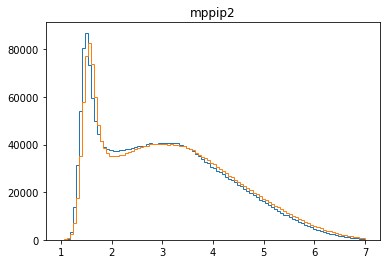

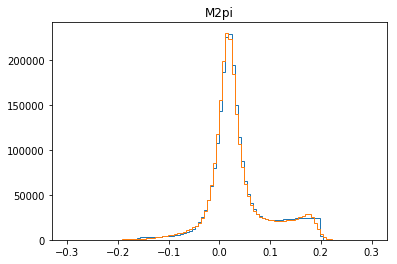

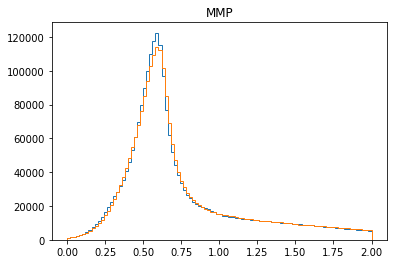

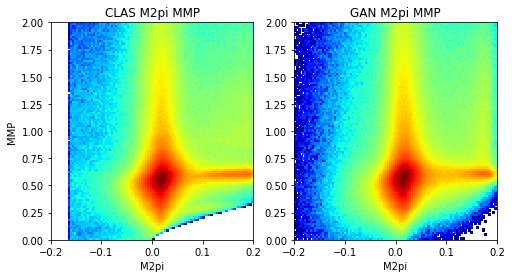

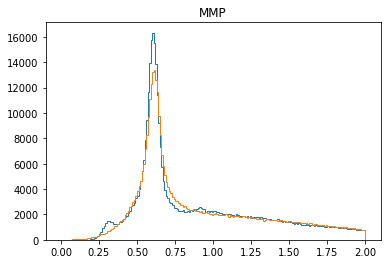

2601 [[-0.10319338, -0.10320988, 1.6505148e-05], [0.058049463, 0.05781843, 0.00023102971], [0.18824297, 0.18819866, 4.4310946e-05], [0.20722483, 0.20641032, 0.0008145121], [0.11470194, 0.11266335, 0.0020385908], [-0.00249711, -0.0039022446, 0.0014051346], [-0.16033296, -0.1619274, 0.0015944324], [-0.27851704, -0.27899882, 0.00048179238], [-0.35314426, -0.35315812, 1.3847604e-05], [-0.36344382, -0.36396378, 0.00051994727], [-0.2947264, -0.29607996, 0.0013535667], [-0.16925764, -0.16950423, 0.0002465905], [-0.0053296215, -0.005352268, 2.2646507e-05], [0.14964034, 0.14693792, 0.002702418], [0.24511711, 0.2444347, 0.0006824136], [0.23139356, 0.23118909, 0.00020447263], [0.12717488, 0.12695868, 0.00021620031], [-0.038573653, -0.04032213, 0.0017484776], [-0.20363064, -0.2039834, 0.00035275085], [-0.33191714, -0.33197835, 6.12141e-05]]
2602 [[-0.39348748, -0.39351547, 2.7974347e-05], [-0.39955568, -0.40093294, 0.0013772472], [-0.30190778, -0.30736506, 0.005457297], [-0.17462362, -0.1767727, 0

2611 [[0.030554095, 0.027457941, 0.0030961533], [0.16382095, 0.1616999, 0.0021210485], [0.22119926, 0.22115628, 4.297533e-05], [0.18419719, 0.18392228, 0.00027491568], [0.03133936, 0.031336773, 2.585326e-06], [-0.14524618, -0.14562193, 0.00037575435], [-0.3020814, -0.30208603, 4.612506e-06], [-0.40225616, -0.40416145, 0.0019052938], [-0.46624953, -0.46631145, 6.193249e-05], [-0.41882807, -0.41966805, 0.00083996577], [-0.31239337, -0.31264672, 0.00025334532], [-0.15553926, -0.15713233, 0.0015930617], [0.019761203, 0.019756136, 5.0655217e-06], [0.17142463, 0.17137891, 4.571857e-05], [0.24678127, 0.24593477, 0.0008465013], [0.21357729, 0.21346372, 0.00011355794], [0.104272194, 0.10415287, 0.00011932035], [-0.069840044, -0.06984306, 3.019235e-06], [-0.21898817, -0.21950977, 0.0005216013], [-0.35216808, -0.3533523, 0.001184212]]
2612 [[-0.42216027, -0.42225912, 9.886341e-05], [-0.44059092, -0.44102442, 0.00043349806], [-0.35709187, -0.35734734, 0.00025547488], [-0.22376673, -0.22394545, 0.0

2621 [[0.21056195, 0.21017689, 0.0003850544], [0.13947098, 0.13643187, 0.003039107], [-0.021546297, -0.028588464, 0.0070421672], [-0.2056387, -0.20724459, 0.001605877], [-0.3457013, -0.34708154, 0.0013802217], [-0.4329654, -0.43332732, 0.0003619086], [-0.46084952, -0.46168628, 0.0008367626], [-0.42836803, -0.42934865, 0.0009806199], [-0.29779956, -0.30076134, 0.002961795], [-0.14002779, -0.14048243, 0.00045463842], [0.006671885, 0.0065972963, 7.4588694e-05], [0.112046085, 0.10882949, 0.0032165921], [0.11492883, 0.11492847, 3.5869016e-07], [0.02772196, 0.027449442, 0.0002725174], [-0.09147902, -0.093372345, 0.0018933242], [-0.22150376, -0.2224764, 0.0009726325], [-0.3250335, -0.32506642, 3.2938555e-05], [-0.39035162, -0.39141902, 0.0010673926], [-0.37892753, -0.37932307, 0.00039552955], [-0.26211622, -0.26318997, 0.001073758]]
2622 [[-0.10492258, -0.10650971, 0.0015871293], [0.05186781, 0.051550515, 0.00031729328], [0.16068538, 0.15915681, 0.0015285624], [0.18286441, 0.18284073, 2.36745

2631 [[-0.34435686, -0.3443572, 3.165951e-07], [-0.40746543, -0.40968025, 0.0022148243], [-0.43425816, -0.43449104, 0.00023288885], [-0.35378975, -0.3560379, 0.0022481608], [-0.21696973, -0.21708407, 0.000114331626], [-0.05440702, -0.05450456, 9.754036e-05], [0.12371724, 0.12261733, 0.0010999157], [0.23785672, 0.2378337, 2.3029337e-05], [0.24886459, 0.2483781, 0.0004864928], [0.142493, 0.13995074, 0.0025422531], [-0.005831619, -0.0072483597, 0.0014167407], [-0.16632164, -0.16765548, 0.0013338499], [-0.29526013, -0.2973394, 0.0020792673], [-0.37787697, -0.37800464, 0.00012767043], [-0.3552793, -0.3569691, 0.0016898003], [-0.26838362, -0.2689751, 0.0005914917], [-0.11563258, -0.11587068, 0.00023809882], [0.054453574, 0.054166768, 0.00028680603], [0.18567051, 0.18565679, 1.3720142e-05], [0.22950251, 0.22887476, 0.0006277496]]
2632 [[0.18220095, 0.18191098, 0.00028998032], [0.056361247, 0.05563931, 0.0007219334], [-0.08556851, -0.086534254, 0.00096574455], [-0.21615027, -0.21669531, 0.0005

2641 [[0.25309652, 0.2523999, 0.0006966375], [0.13463837, 0.13385278, 0.000785596], [-0.024825, -0.02548087, 0.0006558706], [-0.17795804, -0.17911719, 0.001159142], [-0.2963793, -0.29637936, 5.3263648e-08], [-0.35551658, -0.35564706, 0.00013048746], [-0.3205577, -0.32065928, 0.00010157476], [-0.22552493, -0.22612602, 0.00060108624], [-0.07246454, -0.07310304, 0.00063849986], [0.08788655, 0.08746723, 0.00041931964], [0.19471481, 0.19319296, 0.0015218583], [0.20936659, 0.20932642, 4.0171763e-05], [0.105991855, 0.10410368, 0.001888182], [-0.059423044, -0.061506838, 0.0020837921], [-0.22032624, -0.22297244, 0.0026461964], [-0.35117903, -0.3516819, 0.00050286704], [-0.42321014, -0.42505926, 0.001849101], [-0.44554648, -0.44594124, 0.00039477125], [-0.34984106, -0.3500337, 0.0001926482], [-0.21142864, -0.2114705, 4.185736e-05]]
2642 [[-0.04380697, -0.044477478, 0.0006705077], [0.13032208, 0.1302082, 0.000113883376], [0.2535432, 0.24796008, 0.005583135], [0.24830115, 0.2482834, 1.7752176e-05]

2651 [[0.25028482, 0.25003672, 0.00024809036], [0.16274449, 0.16274445, 3.934838e-08], [0.021049162, 0.020818481, 0.00023068194], [-0.14004894, -0.14208236, 0.0020334271], [-0.25839722, -0.2597104, 0.001313172], [-0.32713494, -0.32728818, 0.00015323203], [-0.33066472, -0.3306648, 9.904397e-08], [-0.2628643, -0.26318562, 0.00032131502], [-0.14948991, -0.1521965, 0.0027065843], [-0.013744222, -0.015512856, 0.0017686338], [0.07788472, 0.07785615, 2.8562516e-05], [0.07535654, 0.075253926, 0.00010261546], [-0.015951207, -0.015951611, 4.0341183e-07], [-0.1586469, -0.15867934, 3.2436932e-05], [-0.29243854, -0.2926844, 0.00024587224], [-0.36701444, -0.3715223, 0.004507858], [-0.40986732, -0.4100196, 0.00015228907], [-0.3431413, -0.34351334, 0.0003720662], [-0.20529704, -0.20530859, 1.1552489e-05], [-0.029661112, -0.029831218, 0.0001701055]]
2652 [[0.13542575, 0.13493875, 0.0004869976], [0.2000913, 0.19995792, 0.0001333793], [0.15658489, 0.15626365, 0.00032124665], [0.0072982935, 0.0071456274, 

2661 [[-0.43379265, -0.43437287, 0.0005802273], [-0.3418388, -0.34239718, 0.0005583837], [-0.23541853, -0.2355124, 9.3883136e-05], [-0.09915482, -0.099155195, 3.7020436e-07], [0.013943355, 0.013206483, 0.000736872], [0.071125746, 0.070575, 0.00055074785], [-0.0057724724, -0.007045454, 0.0012729813], [-0.124750584, -0.12656523, 0.0018146512], [-0.24009916, -0.24014473, 4.5563946e-05], [-0.33064127, -0.3310045, 0.0003632161], [-0.38822162, -0.38832697, 0.00010533826], [-0.346249, -0.34657347, 0.0003244682], [-0.22867489, -0.22868764, 1.2762499e-05], [-0.083442725, -0.08379921, 0.00035648624], [0.020856306, 0.019039541, 0.0018167645], [0.039967973, 0.039967902, 7.1304385e-08], [-0.051793955, -0.052240256, 0.00044629915], [-0.20087595, -0.20087606, 1.0888107e-07], [-0.29877362, -0.30421317, 0.0054395576], [-0.36682576, -0.36698925, 0.00016350392]]
2662 [[-0.37269813, -0.3746983, 0.0020001926], [-0.32983756, -0.3303053, 0.00046774553], [-0.20878194, -0.20879065, 8.7064445e-06], [-0.06959048

2671 [[0.13920677, 0.13909523, 0.00011153449], [0.053609792, 0.053308066, 0.00030172465], [-0.09787086, -0.09787101, 1.5739352e-07], [-0.26813304, -0.26891991, 0.0007868797], [-0.4157192, -0.4157482, 2.899225e-05], [-0.50923914, -0.50948715, 0.0002480303], [-0.5354528, -0.54245657, 0.0070038047], [-0.5050674, -0.50563157, 0.0005641677], [-0.3850652, -0.3850669, 1.7020502e-06], [-0.21523242, -0.21542671, 0.00019429302], [-0.034683503, -0.036634862, 0.0019513594], [0.09910427, 0.09903638, 6.7893416e-05], [0.17090966, 0.17085649, 5.3170254e-05], [0.13811052, 0.13808984, 2.0676292e-05], [0.010386698, 0.01007623, 0.0003104674], [-0.14950964, -0.14951609, 6.4545893e-06], [-0.28995776, -0.2918619, 0.0019041287], [-0.3548153, -0.35510775, 0.00029245403], [-0.34738305, -0.34751436, 0.00013131672], [-0.24241811, -0.24659964, 0.0041815415]]
2672 [[-0.11800531, -0.11846837, 0.0004630548], [0.0041345144, 0.00377882, 0.00035569444], [0.108085, 0.10798289, 0.00010211371], [0.1152416, 0.11325622, 0.00

2681 [[0.15133373, 0.15130188, 3.1852982e-05], [0.25375918, 0.25364205, 0.000117122116], [0.26165706, 0.2613098, 0.00034725564], [0.16151029, 0.15949899, 0.0020112973], [0.026399706, 0.021176834, 0.005222872], [-0.108605295, -0.10889482, 0.00028952578], [-0.20314758, -0.20755357, 0.0044059907], [-0.2676555, -0.26769817, 4.2675765e-05], [-0.24039339, -0.24071136, 0.00031797314], [-0.14498602, -0.14505696, 7.094443e-05], [0.013343149, 0.013285377, 5.7771922e-05], [0.1531423, 0.15178916, 0.0013531455], [0.2579586, 0.25688007, 0.0010785136], [0.2273651, 0.22711767, 0.00024742988], [0.069398515, 0.069397286, 1.2322707e-06], [-0.09936488, -0.10132484, 0.0019599632], [-0.27368703, -0.27377465, 8.763333e-05], [-0.38393202, -0.38522208, 0.0012900512], [-0.4218373, -0.42237806, 0.00054076687], [-0.37437272, -0.37446728, 9.4549636e-05]]
2682 [[-0.21859966, -0.22159956, 0.002999909], [-0.069351315, -0.0697445, 0.00039318117], [0.08602107, 0.08045161, 0.0055694627], [0.22484106, 0.2248243, 1.676965

2691 [[-0.40030548, -0.40031022, 4.744521e-06], [-0.25390083, -0.25392753, 2.6717682e-05], [-0.07244789, -0.072894104, 0.00044621862], [0.10833997, 0.10652467, 0.0018153016], [0.24340093, 0.24214423, 0.0012567012], [0.29178023, 0.29164058, 0.00013966353], [0.25944567, 0.25934318, 0.000102499565], [0.13124034, 0.12988593, 0.0013544087], [-0.03750679, -0.037899517, 0.00039272747], [-0.17701432, -0.17704283, 2.8501381e-05], [-0.27556556, -0.27694353, 0.0013779551], [-0.34264162, -0.3446058, 0.0019641872], [-0.3386264, -0.33863422, 7.797265e-06], [-0.24942598, -0.2501432, 0.00071722636], [-0.10678968, -0.10919309, 0.0024034097], [0.050989103, 0.04741156, 0.0035775406], [0.17373173, 0.17265409, 0.0010776368], [0.18133886, 0.18103161, 0.00030724952], [0.08780952, 0.08776009, 4.942775e-05], [-0.07474803, -0.07566925, 0.00092122203]]
2692 [[-0.23350859, -0.2338123, 0.0003037158], [-0.36239263, -0.36302394, 0.0006312909], [-0.44645834, -0.4475905, 0.0011321568], [-0.4023615, -0.40287626, 0.0005

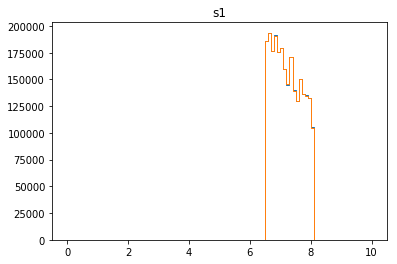

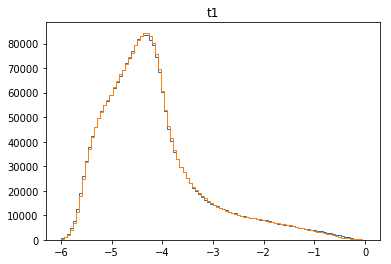

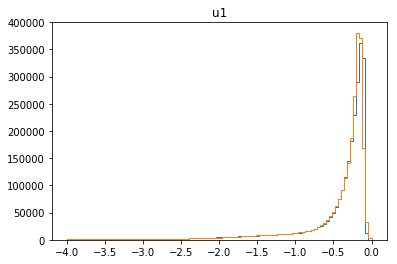

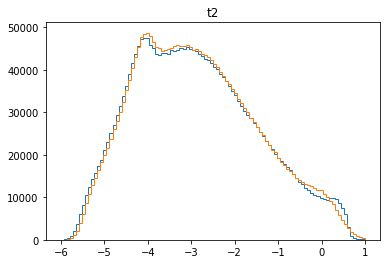

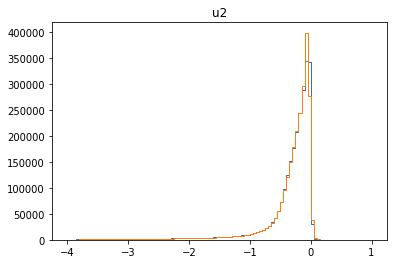

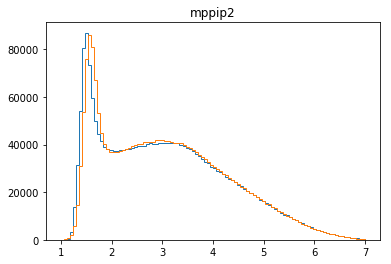

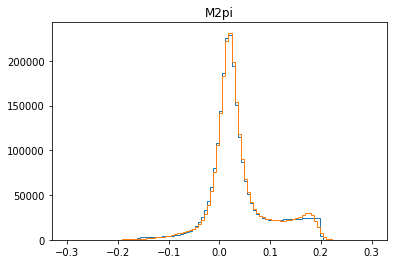

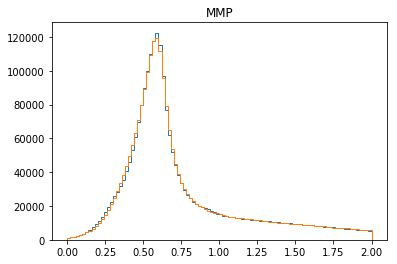

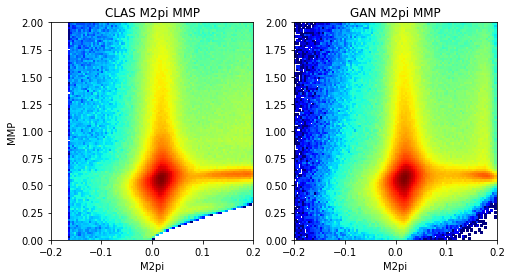

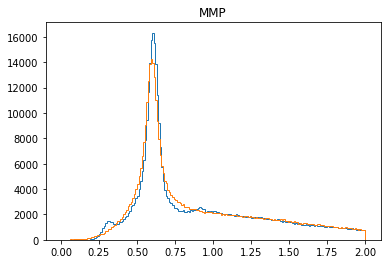

2701 [[-0.039047502, -0.039565362, 0.00051786186], [-0.18964143, -0.19121249, 0.0015710609], [-0.33930984, -0.34049538, 0.0011855252], [-0.4257336, -0.42596167, 0.0002280821], [-0.4578343, -0.46006784, 0.0022335348], [-0.42004555, -0.42057055, 0.0005250045], [-0.30943972, -0.3095244, 8.465932e-05], [-0.14952941, -0.15136296, 0.0018335504], [0.017417245, 0.01726088, 0.00015636448], [0.16237862, 0.1623764, 2.2247114e-06], [0.2599295, 0.25981566, 0.00011384269], [0.20883529, 0.20879605, 3.923435e-05], [0.06396601, 0.0638107, 0.00015531681], [-0.10494658, -0.10574388, 0.0007972937], [-0.24933496, -0.25245813, 0.0031231688], [-0.35528922, -0.35573006, 0.00044083595], [-0.3915073, -0.39150798, 6.947412e-07], [-0.3535957, -0.35685483, 0.0032591368], [-0.25632843, -0.25703984, 0.00071141496], [-0.10411673, -0.10459869, 0.0004819598]]
2702 [[0.034151156, 0.029586518, 0.0045646382], [0.11213659, 0.11185004, 0.00028654767], [0.07211774, 0.07180619, 0.00031154382], [-0.0686567, -0.06874951, 9.2814

2711 [[-0.12095095, -0.121113576, 0.0001626271], [0.063741714, 0.062720664, 0.0010210462], [0.18870232, 0.18810673, 0.00059558084], [0.2334663, 0.23341274, 5.3560398e-05], [0.13755822, 0.13592194, 0.0016362877], [-0.03130851, -0.033799667, 0.0024911575], [-0.21531004, -0.21921557, 0.0039055347], [-0.34989947, -0.349941, 4.1512554e-05], [-0.449823, -0.45143163, 0.0016086298], [-0.49719018, -0.49728012, 8.9933696e-05], [-0.43466532, -0.43488225, 0.00021693007], [-0.31137767, -0.31155762, 0.00017994567], [-0.13629399, -0.13640673, 0.00011274638], [0.028461179, 0.02843989, 2.1287859e-05], [0.15228415, 0.15122, 0.0010641547], [0.19831379, 0.19829187, 2.192619e-05], [0.13064733, 0.13064733, 8.1854523e-10], [0.0013264413, 0.0010380826, 0.0002883586], [-0.16446593, -0.16447426, 8.327948e-06], [-0.30740488, -0.30811915, 0.0007142668]]
2712 [[-0.39601994, -0.39847144, 0.0024515237], [-0.4328694, -0.43296298, 9.3587674e-05], [-0.3699231, -0.37161165, 0.001688546], [-0.26334596, -0.26550868, 0.002

2721 [[-0.12894163, -0.12894297, 1.3448298e-06], [-0.26527017, -0.2652846, 1.4435734e-05], [-0.3547915, -0.35509422, 0.00030271942], [-0.39070135, -0.39073926, 3.790768e-05], [-0.34355974, -0.34362334, 6.359463e-05], [-0.2481745, -0.249542, 0.0013674963], [-0.10286902, -0.10308679, 0.00021777368], [0.05359873, 0.05103489, 0.0025638414], [0.15922084, 0.15799572, 0.0012251227], [0.16320996, 0.1630737, 0.00013625831], [0.07340788, 0.07292617, 0.00048170862], [-0.095616736, -0.09695546, 0.0013387308], [-0.2624845, -0.26255563, 7.1137336e-05], [-0.42444232, -0.42450365, 6.1333536e-05], [-0.51398206, -0.5140457, 6.368593e-05], [-0.49397802, -0.49398178, 3.7479367e-06], [-0.41069904, -0.4109694, 0.0002703806], [-0.27504194, -0.2751338, 9.1861235e-05], [-0.10126299, -0.10321502, 0.0019520335], [0.053693924, 0.05286256, 0.0008313643]]
2722 [[0.16945565, 0.16838987, 0.0010657731], [0.15437184, 0.15385737, 0.0005144818], [0.07906252, 0.0773011, 0.0017614218], [-0.01877965, -0.02285117, 0.00407151

2731 [[-0.30286038, -0.30289376, 3.337788e-05], [-0.33907324, -0.3394548, 0.00038154423], [-0.30986872, -0.31000695, 0.00013822464], [-0.19427845, -0.19933125, 0.0050528026], [-0.03319062, -0.033190716, 9.784708e-08], [0.07389572, 0.0738956, 1.2050441e-07], [0.10283793, 0.10255825, 0.0002796799], [0.062471963, 0.061637737, 0.00083422655], [-0.077264264, -0.07730369, 3.9425737e-05], [-0.2055546, -0.2108569, 0.0053022946], [-0.33130047, -0.3315706, 0.00027012968], [-0.42187124, -0.42233643, 0.00046519152], [-0.41162238, -0.4118055, 0.00018313229], [-0.3109849, -0.311045, 6.0085207e-05], [-0.16994603, -0.17258085, 0.002634827], [-0.06532741, -0.06533719, 9.77278e-06], [-0.002568973, -0.0025987928, 2.9819672e-05], [-0.04703735, -0.0470648, 2.7452226e-05], [-0.20338404, -0.20349671, 0.00011266537], [-0.32829976, -0.32912475, 0.0008249971]]
2732 [[-0.3752787, -0.37726766, 0.0019889486], [-0.40363607, -0.4038986, 0.00026253486], [-0.3354147, -0.3356397, 0.00022498169], [-0.20327236, -0.203815

2741 [[-0.06219963, -0.06272805, 0.00052841904], [-0.19107714, -0.19124162, 0.00016448094], [-0.32419676, -0.32718518, 0.002988428], [-0.43851104, -0.4387159, 0.00020485464], [-0.49136668, -0.49203148, 0.00066479086], [-0.4534866, -0.4535898, 0.000103195904], [-0.34348637, -0.34367085, 0.00018447697], [-0.17430294, -0.17430447, 1.5276019e-06], [0.002923651, 0.002489994, 0.00043365694], [0.13373402, 0.13038851, 0.0033455058], [0.16033612, 0.16031489, 2.1235086e-05], [0.068423316, 0.06818445, 0.00023886464], [-0.08739985, -0.089302145, 0.001902298], [-0.2653311, -0.26534888, 1.7800427e-05], [-0.40018237, -0.40119514, 0.0010127742], [-0.49346986, -0.49549487, 0.002025007], [-0.5191004, -0.5191311, 3.067986e-05], [-0.4614462, -0.464681, 0.0032347913], [-0.3416208, -0.34162143, 6.356422e-07], [-0.1893287, -0.18951127, 0.0001825649]]
2742 [[-0.04110309, -0.04157746, 0.000474369], [0.05181923, 0.051559225, 0.00026000678], [0.05002189, 0.049566112, 0.0004557778], [-0.06121834, -0.0613203, 0.00

2751 [[-0.53160834, -0.5345205, 0.0029121793], [-0.43711886, -0.43719417, 7.531525e-05], [-0.26458123, -0.26605466, 0.0014734382], [-0.0728826, -0.07837122, 0.005488622], [0.10972354, 0.10886389, 0.0008596486], [0.20867608, 0.20624906, 0.0024270313], [0.17803256, 0.17773071, 0.0003018572], [0.055421844, 0.055401254, 2.0589658e-05], [-0.12223129, -0.12230398, 7.269008e-05], [-0.27568972, -0.27577242, 8.270517e-05], [-0.4008612, -0.40166855, 0.00080734247], [-0.4623839, -0.4624052, 2.1305459e-05], [-0.4566724, -0.45674554, 7.314615e-05], [-0.34435034, -0.34450495, 0.00015460451], [-0.18764342, -0.18818331, 0.00053988013], [-0.0019049873, -0.003126641, 0.0012216538], [0.15706033, 0.15428, 0.002780311], [0.22982855, 0.22632071, 0.0035078363], [0.13923311, 0.13917623, 5.687658e-05], [-0.029252779, -0.029254496, 1.7170133e-06]]
2752 [[-0.19194783, -0.19197862, 3.07856e-05], [-0.34963366, -0.34989837, 0.00026470263], [-0.4769622, -0.47700056, 3.835524e-05], [-0.526131, -0.53048795, 0.00435700

2761 [[-0.46039495, -0.46149373, 0.0010987774], [-0.3247242, -0.3247531, 2.891015e-05], [-0.1474489, -0.14837012, 0.00092122203], [0.021716103, 0.020901265, 0.0008148386], [0.102503024, 0.101904646, 0.00059837697], [0.088103555, 0.08144092, 0.006662637], [-0.06411879, -0.06515157, 0.0010327814], [-0.21133886, -0.21142444, 8.557435e-05], [-0.3631487, -0.3631732, 2.4498244e-05], [-0.48492053, -0.4849299, 9.348184e-06], [-0.54060566, -0.5406374, 3.1702453e-05], [-0.5061538, -0.5062213, 6.748541e-05], [-0.3892437, -0.39312398, 0.0038803057], [-0.22403009, -0.22415332, 0.00012322707], [-0.02641088, -0.030423462, 0.0040125833], [0.12320252, 0.122581154, 0.0006213623], [0.1702953, 0.1701759, 0.0001194037], [0.09320267, 0.09253896, 0.0006637094], [-0.043213576, -0.043634694, 0.00042111814], [-0.23196281, -0.23222826, 0.0002654479]]
2762 [[-0.39037323, -0.39039755, 2.4328609e-05], [-0.5217247, -0.52228254, 0.00055784296], [-0.5986666, -0.5995757, 0.000909105], [-0.5792335, -0.5808589, 0.0016253

2771 [[0.04596734, 0.04287607, 0.003091273], [0.17075507, 0.17048143, 0.0002736521], [0.22243212, 0.22180761, 0.00062450423], [0.11933444, 0.11932156, 1.2871755e-05], [-0.07026323, -0.07063802, 0.0003747937], [-0.23207052, -0.2323009, 0.00023039234], [-0.37121475, -0.371337, 0.00012225503], [-0.45689067, -0.45708448, 0.00019381476], [-0.48365694, -0.48376462, 0.00010766089], [-0.42532372, -0.4292723, 0.0039485646], [-0.29046357, -0.29046854, 4.980029e-06], [-0.13360167, -0.13361575, 1.4075663e-05], [0.019920807, 0.019586997, 0.0003338109], [0.14500791, 0.14497569, 3.2220036e-05], [0.1370281, 0.13702808, 1.6822014e-08], [-0.019386338, -0.019877046, 0.00049070874], [-0.23038912, -0.23047265, 8.353986e-05], [-0.39305413, -0.3934021, 0.0003479669], [-0.52696675, -0.5272747, 0.00030798547], [-0.5964658, -0.596925, 0.00045920466]]
2772 [[-0.59528506, -0.5952863, 1.2535347e-06], [-0.47801384, -0.478022, 8.152744e-06], [-0.30088207, -0.302005, 0.001122934], [-0.10000346, -0.10000466, 1.2028067

2781 [[0.10247421, 0.10212986, 0.0003443472], [0.04889869, 0.04887968, 1.9011337e-05], [-0.1259882, -0.12715411, 0.0011659053], [-0.28540838, -0.2859729, 0.00056453014], [-0.43501964, -0.4350214, 1.7471357e-06], [-0.5142866, -0.5143557, 6.915652e-05], [-0.5308774, -0.53141683, 0.000539437], [-0.45438287, -0.45464998, 0.00026712863], [-0.29241565, -0.29326692, 0.00085128046], [-0.098721795, -0.09930083, 0.0005790333], [0.06856806, 0.0664287, 0.0021393595], [0.14522265, 0.14508812, 0.00013452722], [0.11097899, 0.11007975, 0.0008992403], [-0.04054574, -0.040616717, 7.097656e-05], [-0.21621071, -0.2171235, 0.00091278926], [-0.40153697, -0.4021218, 0.00058483076], [-0.5489294, -0.5489626, 3.3201803e-05], [-0.603466, -0.6056445, 0.00217853], [-0.6162267, -0.6203101, 0.0040834537], [-0.5078423, -0.50806355, 0.00022127788]]
2782 [[-0.32443136, -0.32461023, 0.00017887267], [-0.12282124, -0.123141326, 0.00032008535], [0.065129645, 0.064981334, 0.00014831392], [0.18383236, 0.18364555, 0.000186815

2791 [[-0.41055262, -0.41122183, 0.00066922425], [-0.24467097, -0.24484953, 0.0001785667], [-0.07360508, -0.074531406, 0.0009263234], [0.042248715, 0.042142827, 0.0001058871], [0.054034133, 0.05349008, 0.0005440541], [-0.098019935, -0.09815606, 0.00013612476], [-0.2631409, -0.26535034, 0.002209442], [-0.4286561, -0.42927727, 0.0006211722], [-0.5432505, -0.5458937, 0.0026432537], [-0.605055, -0.6053073, 0.00025231414], [-0.56884104, -0.5688439, 2.881643e-06], [-0.450078, -0.45009115, 1.31331035e-05], [-0.27339706, -0.27352384, 0.00012676686], [-0.07718648, -0.07723189, 4.540958e-05], [0.12240439, 0.120728984, 0.0016754043], [0.23034716, 0.23001668, 0.00033047388], [0.245328, 0.24419942, 0.0011285656], [0.12392955, 0.123845875, 8.36794e-05], [-0.07199735, -0.07292426, 0.00092690403], [-0.26477313, -0.2652071, 0.0004339748]]
2792 [[-0.41649893, -0.4174498, 0.00095086545], [-0.5352379, -0.53610224, 0.0008643524], [-0.5953041, -0.59531647, 1.237035e-05], [-0.57979727, -0.5798073, 1.0024814e

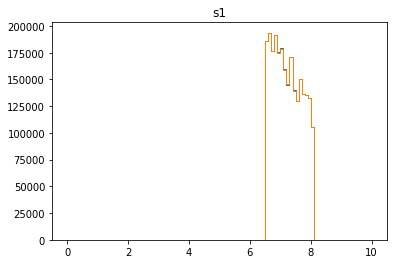

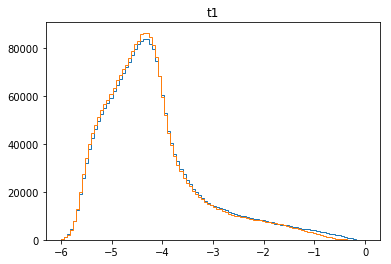

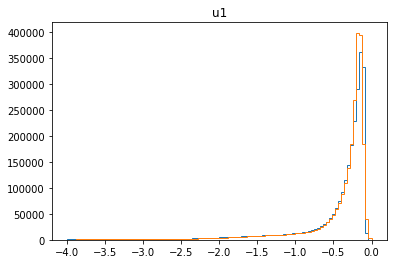

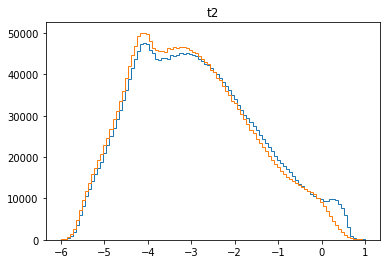

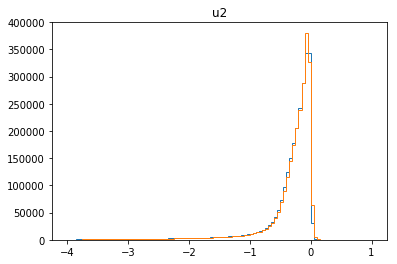

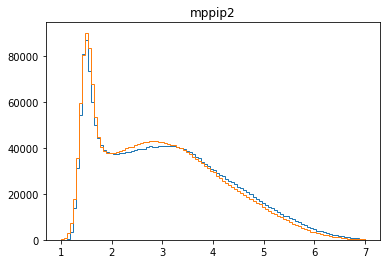

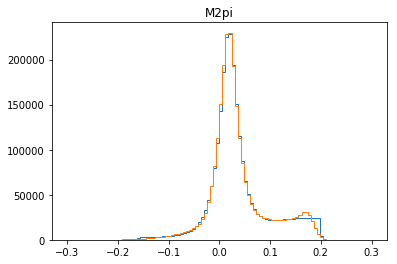

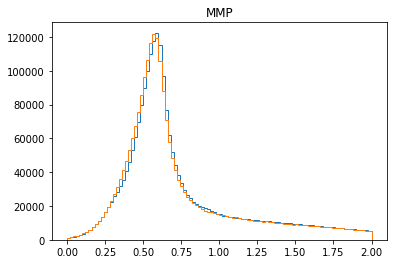

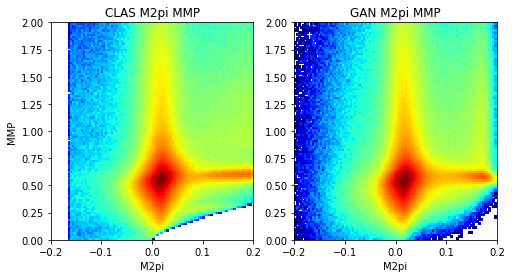

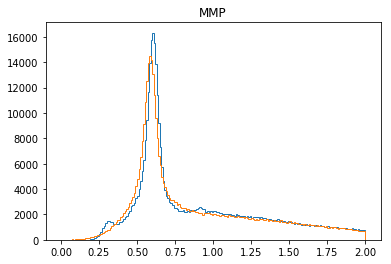

2801 [[-0.34474432, -0.34474865, 4.3064356e-06], [-0.49169666, -0.4919837, 0.00028706453], [-0.5819876, -0.58296263, 0.0009750134], [-0.5980531, -0.5981109, 5.7800913e-05], [-0.53496015, -0.5349611, 9.799296e-07], [-0.38628647, -0.387663, 0.0013765396], [-0.19960658, -0.19960734, 7.66453e-07], [-0.02524079, -0.031782545, 0.0065417555], [0.05450557, 0.053538047, 0.00096752355], [0.04869363, 0.048652828, 4.0802846e-05], [-0.04346894, -0.04460907, 0.0011401288], [-0.19974114, -0.2005951, 0.0008539538], [-0.3875956, -0.38759643, 8.3122e-07], [-0.51177025, -0.5131519, 0.0013816395], [-0.59477675, -0.59478694, 1.0218995e-05], [-0.5983131, -0.59876, 0.00044694415], [-0.54462874, -0.5456391, 0.0010103477], [-0.4077707, -0.4079445, 0.00017380714], [-0.21836962, -0.21837124, 1.6282174e-06], [-0.026274065, -0.027476197, 0.0012021326]]
2802 [[0.12518054, 0.12497201, 0.00020852909], [0.16970314, 0.16959153, 0.000111615074], [0.09242008, 0.09219584, 0.00022423844], [-0.051264767, -0.05130832, 4.3552

2811 [[-0.5169038, -0.5176937, 0.00078987883], [-0.62773824, -0.6287693, 0.0010310659], [-0.6702437, -0.67126775, 0.0010240957], [-0.62062943, -0.6235844, 0.0029549478], [-0.4727026, -0.47279355, 9.094948e-05], [-0.29798317, -0.29825544, 0.00027226564], [-0.11365073, -0.11689703, 0.003246301], [0.016970174, 0.016955594, 1.4581034e-05], [0.0281302, 0.028127529, 2.67191e-06], [-0.089386694, -0.09053353, 0.0011468367], [-0.23544219, -0.2363323, 0.00089011213], [-0.41825607, -0.41826057, 4.490434e-06], [-0.5530141, -0.55360854, 0.00059446425], [-0.60482913, -0.6054648, 0.00063570763], [-0.5659115, -0.5671111, 0.001199621], [-0.4619735, -0.46256137, 0.00058787904], [-0.28111976, -0.2832997, 0.0021799551], [-0.10018326, -0.10021592, 3.2654556e-05], [0.045927577, 0.04419644, 0.0017311344], [0.10839257, 0.10781133, 0.0005812384]]
2812 [[0.0068359133, 0.0047204834, 0.0021154298], [-0.1701251, -0.17012683, 1.7220154e-06], [-0.3647806, -0.36505318, 0.00027258042], [-0.53179705, -0.53206503, 0.000

2821 [[-0.5434647, -0.544582, 0.0011173164], [-0.50605255, -0.50677264, 0.0007200899], [-0.3613695, -0.36137354, 4.064528e-06], [-0.1747383, -0.17594732, 0.00120902], [0.012642794, 0.012642762, 3.283276e-08], [0.14573978, 0.14570981, 2.996567e-05], [0.2109061, 0.2103912, 0.00051491446], [0.17454058, 0.1745219, 1.8680135e-05], [0.032861017, 0.032840133, 2.0884965e-05], [-0.11610319, -0.11801632, 0.001913128], [-0.25836077, -0.25872704, 0.00036627587], [-0.35369387, -0.35478482, 0.0010909515], [-0.3672278, -0.36723363, 5.830792e-06], [-0.28310612, -0.28349403, 0.0003879041], [-0.11932109, -0.120146416, 0.0008253258], [0.04414388, 0.044140916, 2.9664407e-06], [0.17026913, 0.17025845, 1.068764e-05], [0.1303658, 0.13025337, 0.00011242258], [-0.0025936484, -0.002974299, 0.0003806506], [-0.17459853, -0.17473108, 0.00013254356]]
2822 [[-0.3386438, -0.3387903, 0.00014650766], [-0.45193923, -0.45490995, 0.0029707293], [-0.48807847, -0.48963657, 0.0015580846], [-0.42737094, -0.4283899, 0.00101897

2831 [[-0.27811712, -0.2783938, 0.00027668956], [-0.07861077, -0.0786148, 4.0338236e-06], [0.12245615, 0.12050816, 0.0019479904], [0.27655873, 0.27113435, 0.0054243756], [0.3254907, 0.3239412, 0.0015495135], [0.22522053, 0.22522001, 5.1980896e-07], [0.06052222, 0.060515314, 6.9081e-06], [-0.124601096, -0.124759614, 0.00015851839], [-0.2804163, -0.28043827, 2.1961927e-05], [-0.3917048, -0.39247486, 0.0007700634], [-0.44160715, -0.44340122, 0.0017940725], [-0.42080373, -0.4208081, 4.385962e-06], [-0.31302813, -0.313289, 0.0002608686], [-0.13373052, -0.13380465, 7.412817e-05], [0.06968955, 0.06848106, 0.0012084895], [0.24407445, 0.24132003, 0.0027544238], [0.3137723, 0.31115058, 0.002621724], [0.27608564, 0.27408853, 0.001997123], [0.1167217, 0.115488686, 0.0012330133], [-0.08453464, -0.08759355, 0.0030589078]]
2832 [[-0.2660385, -0.2665394, 0.00050090154], [-0.43680355, -0.4371543, 0.00035074758], [-0.5197405, -0.5199215, 0.00018097057], [-0.51566523, -0.51847357, 0.0028083401], [-0.4325

2841 [[0.25352222, 0.25226647, 0.0012557545], [0.17193538, 0.16812697, 0.0038084036], [0.021168493, 0.020176973, 0.0009915205], [-0.1504189, -0.15096048, 0.0005415656], [-0.29140288, -0.29391867, 0.0025157796], [-0.34766743, -0.34862736, 0.00095994456], [-0.32232246, -0.3223537, 3.1231688e-05], [-0.21963106, -0.22026485, 0.0006337854], [-0.04687241, -0.047007557, 0.00013514735], [0.100935854, 0.098681174, 0.0022546775], [0.2165304, 0.21644425, 8.6139895e-05], [0.20007591, 0.1971054, 0.0029705213], [0.06198541, 0.061770275, 0.0002151359], [-0.11569158, -0.11926707, 0.0035754878], [-0.2795438, -0.28052583, 0.0009820538], [-0.41566718, -0.41580728, 0.0001401147], [-0.45150155, -0.451503, 1.466924e-06], [-0.45813692, -0.45932218, 0.0011852626], [-0.3455772, -0.34580132, 0.00022412422], [-0.15713283, -0.15730046, 0.00016762693]]
2842 [[0.012250548, 0.011740297, 0.0005102508], [0.14637102, 0.1459368, 0.00043421323], [0.18988489, 0.18984646, 3.8426155e-05], [0.14155802, 0.14151144, 4.6573707e

2851 [[-0.472085, -0.4725196, 0.00043461073], [-0.42544663, -0.42562792, 0.0001812786], [-0.30470872, -0.30505136, 0.00034265037], [-0.12012804, -0.12013966, 1.161741e-05], [0.06977069, 0.06875524, 0.0010154465], [0.19937389, 0.19932811, 4.5770168e-05], [0.19445461, 0.19369458, 0.00076003966], [0.069639765, 0.06950827, 0.00013149164], [-0.1347674, -0.1352137, 0.00044629915], [-0.30406928, -0.3051912, 0.0011219117], [-0.4553648, -0.45608774, 0.0007229589], [-0.55098003, -0.5518033, 0.00082324503], [-0.5380481, -0.53805095, 2.862249e-06], [-0.42819756, -0.4317278, 0.0035302392], [-0.27530134, -0.27941605, 0.004114715], [-0.095496155, -0.09657029, 0.0010741332], [0.04437179, 0.04425409, 0.00011770077], [0.10948964, 0.109466635, 2.3011038e-05], [0.007853281, 0.0043327804, 0.0035205], [-0.14346337, -0.14405106, 0.000587694]]
2852 [[-0.30515683, -0.30516598, 9.162502e-06], [-0.43853188, -0.43888777, 0.0003559103], [-0.48765782, -0.49038827, 0.0027304515], [-0.4602547, -0.46053216, 0.00027745

2861 [[-0.17458172, -0.1747798, 0.00019808664], [-0.0282232, -0.028389791, 0.00016659139], [0.039144132, 0.03900275, 0.0001413819], [-0.0021619115, -0.0023523422, 0.0001904308], [-0.13362506, -0.13364919, 2.4122075e-05], [-0.2823021, -0.28421608, 0.0019139624], [-0.40756664, -0.4078015, 0.00023487238], [-0.50295055, -0.5030428, 9.226386e-05], [-0.51997685, -0.519983, 6.119841e-06], [-0.44093078, -0.4415341, 0.0006033328], [-0.26853493, -0.26855916, 2.4234623e-05], [-0.07894308, -0.07899993, 5.684782e-05], [0.099388964, 0.0984552, 0.0009337689], [0.2231086, 0.22246663, 0.0006419747], [0.21709344, 0.21530534, 0.001788099], [0.086246945, 0.08596682, 0.00028012664], [-0.076991126, -0.077782825, 0.0007917024], [-0.23850456, -0.2385197, 1.51398135e-05], [-0.36493248, -0.36535642, 0.00042394106], [-0.39605242, -0.3960528, 3.913883e-07]]
2862 [[-0.37099424, -0.37580648, 0.004812235], [-0.2694081, -0.2699038, 0.00049570703], [-0.11982966, -0.11996928, 0.00013961844], [0.032461006, 0.031998444, 

2871 [[-0.52505445, -0.52505463, 1.6660488e-07], [-0.60275495, -0.60279375, 3.8805436e-05], [-0.6160795, -0.6199836, 0.0039041045], [-0.5280072, -0.5282074, 0.00020024001], [-0.36384153, -0.36586604, 0.002024492], [-0.16771282, -0.16866204, 0.00094921933], [0.01645759, 0.016412973, 4.4616183e-05], [0.15587345, 0.15585218, 2.127026e-05], [0.20034647, 0.19969401, 0.0006524557], [0.11117255, 0.11009328, 0.0010792651], [-0.02824927, -0.028310066, 6.079697e-05], [-0.16791117, -0.17182983, 0.0039186575], [-0.3235483, -0.32409903, 0.00055074785], [-0.41984883, -0.41994905, 0.00010023359], [-0.44210327, -0.44343865, 0.001335383], [-0.37791172, -0.38059297, 0.0026812407], [-0.24117072, -0.2435226, 0.0023518861], [-0.08443574, -0.08464054, 0.00020480002], [0.05798709, 0.056888185, 0.0010989037], [0.09347251, 0.0931981, 0.0002744099]]
2872 [[0.008957338, 0.008927435, 2.990306e-05], [-0.17796466, -0.17904241, 0.0010777619], [-0.37058476, -0.37121835, 0.0006335933], [-0.51663595, -0.51672834, 9.241

2881 [[-0.109911405, -0.114579976, 0.0046685715], [0.0413318, 0.04122907, 0.00010273141], [0.15209201, 0.15208253, 9.47692e-06], [0.17589904, 0.1726831, 0.0032159437], [0.04767357, 0.047540326, 0.00013324717], [-0.124851294, -0.12488735, 3.605202e-05], [-0.2638672, -0.26476392, 0.00089672534], [-0.37173665, -0.37192854, 0.00019190765], [-0.4128109, -0.4137176, 0.0009066911], [-0.39505416, -0.39642122, 0.0013670734], [-0.31251022, -0.31251067, 4.380454e-07], [-0.16379294, -0.16384855, 5.561778e-05], [-0.028486632, -0.02946379, 0.0009771587], [0.051052287, 0.04972817, 0.0013241154], [0.0031195302, 0.0027096863, 0.00040984375], [-0.14260228, -0.14286247, 0.00026019133], [-0.28505802, -0.2851076, 4.9588794e-05], [-0.43825507, -0.43867618, 0.00042111814], [-0.5543768, -0.5551465, 0.00076974585], [-0.59575087, -0.5959127, 0.00016184968]]
2882 [[-0.5136077, -0.5137208, 0.00011315181], [-0.362464, -0.36322343, 0.0007594088], [-0.15941481, -0.16850358, 0.009088764], [-8.097105e-05, -0.000474530

2891 [[-0.47614056, -0.47614068, 1.2450982e-07], [-0.43494135, -0.43500912, 6.776775e-05], [-0.32964766, -0.3299274, 0.0002797437], [-0.1685744, -0.1705342, 0.0019597944], [-0.03749864, -0.037498735, 9.197174e-08], [0.06875254, 0.067993656, 0.0007588833], [0.022123573, 0.021907933, 0.00021563975], [-0.10398165, -0.104522154, 0.0005405008], [-0.2767746, -0.28174287, 0.004968286], [-0.42761427, -0.42922184, 0.0016075589], [-0.5199282, -0.5235437, 0.003615516], [-0.5250636, -0.5251178, 5.4232518e-05], [-0.46052152, -0.46086368, 0.00034215624], [-0.31276703, -0.31282455, 5.7511264e-05], [-0.15192568, -0.15193966, 1.397566e-05], [0.014118652, 0.012611639, 0.001507013], [0.09481918, 0.09226306, 0.0025561205], [0.020512097, 0.019917447, 0.00059465034], [-0.0861894, -0.087367706, 0.0011783123], [-0.22527578, -0.22583398, 0.0005582034]]
2892 [[-0.33233294, -0.3327278, 0.00039484698], [-0.3508521, -0.35253015, 0.0016780596], [-0.33789614, -0.33793262, 3.6488524e-05], [-0.25590354, -0.25634143, 0

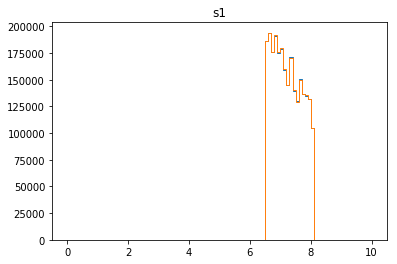

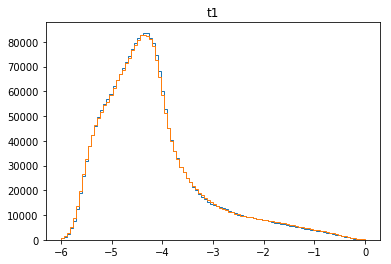

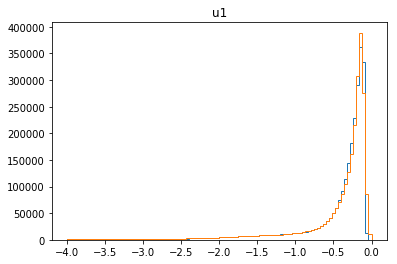

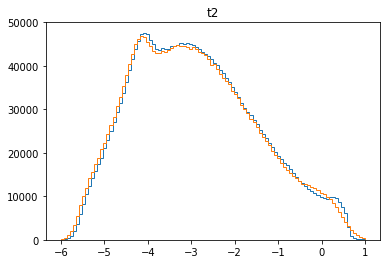

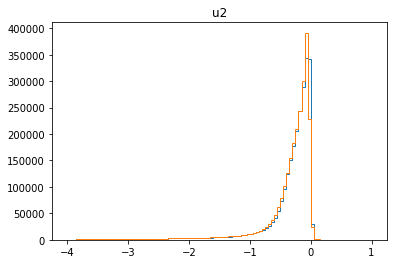

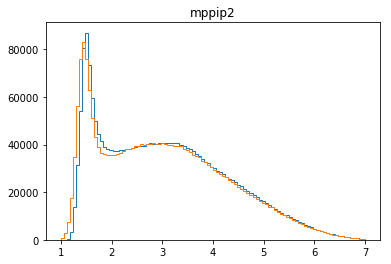

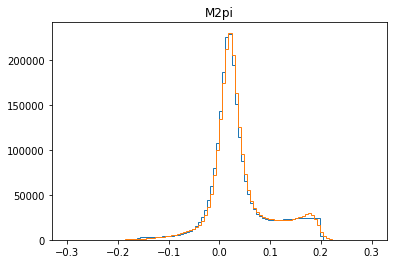

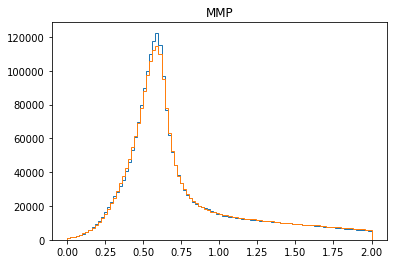

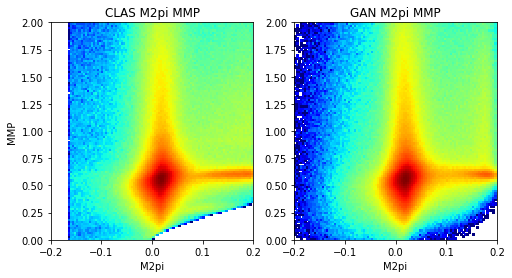

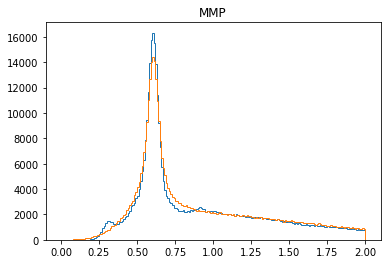

2901 [[-0.36774844, -0.36791024, 0.00016180114], [-0.38245466, -0.3824956, 4.094918e-05], [-0.33382097, -0.3353412, 0.0015202217], [-0.19543262, -0.19688272, 0.0014501028], [-0.03969227, -0.039747123, 5.4852306e-05], [0.16076463, 0.16071731, 4.733174e-05], [0.2438288, 0.24336927, 0.0004595317], [0.20316055, 0.2031547, 5.8584596e-06], [0.06829317, 0.067163065, 0.0011301041], [-0.09436632, -0.0945885, 0.00022218672], [-0.25821507, -0.25830024, 8.518661e-05], [-0.40245852, -0.40245947, 9.611394e-07], [-0.44149023, -0.44157887, 8.863606e-05], [-0.380476, -0.38648096, 0.0060049733], [-0.25121725, -0.25282726, 0.001610007], [-0.06357098, -0.06357109, 1.07625965e-07], [0.12299098, 0.12299085, 1.327171e-07], [0.19246212, 0.1912613, 0.0012008103], [0.23453051, 0.23450106, 2.9445897e-05], [0.10897526, 0.10804952, 0.000925743]]
2902 [[-0.05630517, -0.06362272, 0.0073175495], [-0.23014724, -0.230206, 5.8761943e-05], [-0.3756425, -0.37643787, 0.00079535594], [-0.4538328, -0.4547653, 0.000932487], [

2911 [[0.06147659, 0.06130132, 0.0001752687], [0.11684774, 0.11677836, 6.937876e-05], [0.023995588, 0.02293218, 0.0010634082], [-0.16923968, -0.1709143, 0.0016746235], [-0.34141898, -0.3414919, 7.291794e-05], [-0.47747666, -0.47793424, 0.00045757127], [-0.55004996, -0.55102354, 0.0009735846], [-0.5174137, -0.5174138, 9.784708e-08], [-0.39429688, -0.39600855, 0.0017116672], [-0.20327973, -0.20466606, 0.0013863227], [0.016027385, 0.01588281, 0.00014457479], [0.21243948, 0.21048744, 0.0019520335], [0.31649637, 0.31626824, 0.00022813972], [0.28139386, 0.28041252, 0.0009813366], [0.1281107, 0.12808168, 2.9033343e-05], [-0.06317727, -0.06364255, 0.00046527383], [-0.24396938, -0.24499874, 0.0010293517], [-0.36463156, -0.36498797, 0.00035641424], [-0.4543822, -0.45454314, 0.0001609289], [-0.44927198, -0.44928694, 1.4962221e-05]]
2912 [[-0.34925148, -0.35085505, 0.0016035847], [-0.20235553, -0.2049794, 0.002623873], [-0.02341887, -0.025030868, 0.0016119976], [0.13383844, 0.13376786, 7.059142e-0

2921 [[-0.20187354, -0.20188262, 9.08185e-06], [-0.03523569, -0.035454255, 0.00021856249], [0.02176132, 0.018705787, 0.0030555325], [-0.012865862, -0.015398507, 0.0025326456], [-0.1307697, -0.1310234, 0.00025370973], [-0.27604684, -0.27609712, 5.028969e-05], [-0.39050633, -0.39058322, 7.6879245e-05], [-0.46227574, -0.46291232, 0.00063657353], [-0.40621185, -0.406215, 3.1464879e-06], [-0.26035154, -0.26053157, 0.00018004802], [-0.0874382, -0.08744355, 5.35281e-06], [0.06291408, 0.062035084, 0.0008789936], [0.1157258, 0.11570325, 2.2555832e-05], [0.044244844, 0.04409429, 0.00015055225], [-0.10318296, -0.105977364, 0.0027944085], [-0.26375663, -0.26798218, 0.004225566], [-0.40531826, -0.40793628, 0.0026180146], [-0.46804437, -0.4712011, 0.0031567288], [-0.4997249, -0.50006676, 0.00034187408], [-0.4131631, -0.41541326, 0.0022501512]]
2922 [[-0.28898913, -0.28902295, 3.3820106e-05], [-0.13975449, -0.14173919, 0.001984697], [-0.011083358, -0.011193087, 0.00010972895], [0.03239728, 0.03234226

2931 [[0.034792908, 0.030625168, 0.00416774], [-0.01883721, -0.02104988, 0.0022126706], [-0.17583722, -0.17759705, 0.0017598212], [-0.3337755, -0.3337758, 3.0595402e-07], [-0.44470137, -0.4449815, 0.00028012664], [-0.5380284, -0.53844523, 0.00041682366], [-0.48600337, -0.48605815, 5.4767588e-05], [-0.3788764, -0.38047096, 0.0015945844], [-0.2117023, -0.21170557, 3.262572e-06], [-0.038290087, -0.040803954, 0.0025138666], [0.06546485, 0.065380886, 8.3958796e-05], [0.06167067, 0.061579574, 9.109505e-05], [-0.037851192, -0.03924434, 0.0013931484], [-0.18731059, -0.18733785, 2.7252714e-05], [-0.2917981, -0.2961783, 0.0043802015], [-0.39231873, -0.39231965, 9.1678527e-07], [-0.4036105, -0.40371257, 0.00010207516], [-0.31685024, -0.31685165, 1.4120052e-06], [-0.17142494, -0.17282265, 0.0013977085], [-0.0015083193, -0.0019302206, 0.00042190138]]
2932 [[0.118690886, 0.11796885, 0.00072203606], [0.11499529, 0.11286228, 0.0021330118], [-0.01058722, -0.011140478, 0.0005532574], [-0.2040266, -0.204

2941 [[0.019314107, 0.019119281, 0.00019482513], [-0.085383154, -0.08563845, 0.000255292], [-0.23831604, -0.23881592, 0.00049987755], [-0.37091288, -0.3710755, 0.0001626271], [-0.42567343, -0.4272744, 0.0016009889], [-0.39730802, -0.40093204, 0.0036240083], [-0.2959274, -0.29721403, 0.0012866282], [-0.1498699, -0.15027405, 0.00040414897], [0.007921318, 0.007813775, 0.000107542175], [0.06570656, 0.06568908, 1.7479993e-05], [0.03659695, 0.036445975, 0.00015097382], [-0.088532746, -0.08906997, 0.00053722435], [-0.20137766, -0.20208846, 0.0007108046], [-0.27810693, -0.27906996, 0.00096301985], [-0.34133145, -0.34149015, 0.00015871057], [-0.31328914, -0.3192422, 0.005953059], [-0.21485253, -0.21514218, 0.0002896556], [-0.099081464, -0.09990121, 0.00081974635], [-0.0077915275, -0.007796679, 5.151742e-06], [0.002377605, 0.001719779, 0.00065782596]]
2942 [[-0.10691642, -0.108135276, 0.0012188554], [-0.27443543, -0.27664182, 0.002206395], [-0.3788916, -0.37947938, 0.0005877865], [-0.42889172, -

2951 [[-0.4207371, -0.42168432, 0.00094722223], [-0.2685279, -0.26999503, 0.0014671484], [-0.07049278, -0.07063177, 0.00013898812], [0.12573497, 0.12559508, 0.000139889], [0.24251236, 0.23975393, 0.0027584292], [0.22666602, 0.22614206, 0.0005239562], [0.066087484, 0.06331421, 0.0027732754], [-0.13585724, -0.13586584, 8.594248e-06], [-0.29601818, -0.30045918, 0.0044410033], [-0.43222332, -0.43287092, 0.00064759277], [-0.5100327, -0.510347, 0.0003143105], [-0.52150136, -0.52177346, 0.00027207684], [-0.45394698, -0.45424533, 0.00029835477], [-0.3020022, -0.30234945, 0.00034725564], [-0.12473065, -0.12518415, 0.00045350034], [0.054666307, 0.053947445, 0.0007188619], [0.13780017, 0.13779067, 9.512183e-06], [0.0960113, 0.09474308, 0.0012682222], [-0.02966767, -0.030121008, 0.00045333788], [-0.20799097, -0.2093489, 0.0013579207]]
2952 [[-0.37160212, -0.37701976, 0.0054176347], [-0.52646476, -0.5265701, 0.00010533826], [-0.5938623, -0.59386605, 3.733181e-06], [-0.57025313, -0.57081854, 0.00056

2961 [[-0.5168929, -0.5169399, 4.6965033e-05], [-0.37984282, -0.38209277, 0.0022499708], [-0.21206486, -0.21231014, 0.00024527442], [-0.046918273, -0.05049604, 0.003577769], [0.06362223, 0.06352092, 0.0001013058], [0.07747834, 0.07667338, 0.0008049596], [-0.00370165, -0.005052271, 0.0013506208], [-0.14076483, -0.14537701, 0.0046121827], [-0.28617975, -0.29055944, 0.0043796967], [-0.43565506, -0.4362833, 0.00062822766], [-0.5005977, -0.5011434, 0.0005456569], [-0.4683078, -0.4708755, 0.0025677057], [-0.34719515, -0.34799007, 0.00079492567], [-0.17385255, -0.17428501, 0.0004324662], [-0.0011249463, -0.001132553, 7.606708e-06], [0.10504448, 0.104942285, 0.00010219083], [0.10856057, 0.10852447, 3.609785e-05], [0.01770825, 0.015470205, 0.002238044], [-0.15171048, -0.15196681, 0.0002563292], [-0.33414462, -0.33478805, 0.00064342533]]
2962 [[-0.47286564, -0.47416407, 0.0012984225], [-0.563101, -0.56313616, 3.51869e-05], [-0.56081915, -0.56267136, 0.0018522192], [-0.5123598, -0.5123735, 1.3691

2971 [[-0.44570377, -0.44616568, 0.00046190622], [-0.3069629, -0.30888337, 0.0019204766], [-0.121256016, -0.12265515, 0.001399135], [0.051197164, 0.05071763, 0.00047953424], [0.17640129, 0.17552726, 0.0008740244], [0.18874522, 0.18815641, 0.00058880425], [0.05238588, 0.052007385, 0.00037849537], [-0.105039634, -0.105137624, 9.7992975e-05], [-0.26658964, -0.26662198, 3.235009e-05], [-0.39441222, -0.39581665, 0.0014044195], [-0.48101297, -0.48239616, 0.0013831997], [-0.47303128, -0.47446445, 0.0014331567], [-0.38573104, -0.38599917, 0.00026812713], [-0.25275752, -0.2527577, 1.8911669e-07], [-0.12673676, -0.12706578, 0.00032901915], [-0.019329851, -0.019339247, 9.394896e-06], [-0.03054264, -0.030797323, 0.00025468285], [-0.10952956, -0.11037617, 0.00084661227], [-0.26791778, -0.2684558, 0.0005380204], [-0.38889918, -0.38891342, 1.4233535e-05]]
2972 [[-0.4634664, -0.4651337, 0.0016672947], [-0.48135185, -0.48139587, 4.4006756e-05], [-0.41397634, -0.41471922, 0.0007428902], [-0.29571295, -0

2981 [[-0.050005242, -0.053015817, 0.0030105738], [-0.20338458, -0.20402926, 0.00064468384], [-0.2972223, -0.3011, 0.0038776922], [-0.373282, -0.37330234, 2.0365249e-05], [-0.3868045, -0.3897311, 0.0029266078], [-0.328248, -0.330118, 0.0018699926], [-0.1992749, -0.20014453, 0.0008696317], [-0.07129565, -0.07305019, 0.0017545446], [-0.029669313, -0.03118463, 0.0015153176], [-0.11204276, -0.113038614, 0.0009958495], [-0.24795453, -0.25050467, 0.0025501451], [-0.41794103, -0.41794634, 5.2999867e-06], [-0.5359782, -0.5368554, 0.00087718497], [-0.57251465, -0.57253766, 2.3011038e-05], [-0.52383554, -0.52442515, 0.00058963767], [-0.37902734, -0.37921232, 0.00018499543], [-0.17696068, -0.17766175, 0.0007010748], [0.021525426, 0.021463282, 6.214281e-05], [0.15656346, 0.1558629, 0.0007005697], [0.15995573, 0.1594634, 0.0004923156]]
2982 [[0.07452172, 0.07322907, 0.0012926558], [-0.06837962, -0.06847599, 9.63759e-05], [-0.22692567, -0.22695796, 3.228503e-05], [-0.33697057, -0.3371698, 0.00019921

2991 [[0.031964857, 0.028528051, 0.0034368045], [-0.14487484, -0.1448779, 3.0524682e-06], [-0.30077058, -0.30078602, 1.5423142e-05], [-0.42107818, -0.42125967, 0.00018148411], [-0.4349197, -0.434948, 2.8318394e-05], [-0.3638921, -0.36574203, 0.0018499212], [-0.22581686, -0.2259576, 0.0001407476], [-0.048758723, -0.04877452, 1.5799946e-05], [0.11318897, 0.11115743, 0.0020315351], [0.2405937, 0.24058509, 8.605435e-06], [0.2918089, 0.29085544, 0.0009534551], [0.17868826, 0.17817706, 0.000511199], [0.028496662, 0.027117575, 0.0013790883], [-0.13292028, -0.13340074, 0.00048045348], [-0.24460897, -0.24882016, 0.004211195], [-0.30412745, -0.30412763, 1.8746142e-07], [-0.27982995, -0.27991402, 8.406367e-05], [-0.16190024, -0.16222939, 0.0003291576], [-0.031009797, -0.03146745, 0.00045765284], [0.086418316, 0.085310794, 0.0011075196]]
2992 [[0.11546421, 0.11545215, 1.2063687e-05], [0.07652086, 0.07652043, 4.3050386e-07], [-0.009731727, -0.009733845, 2.1179185e-06], [-0.14055261, -0.14055961, 7.

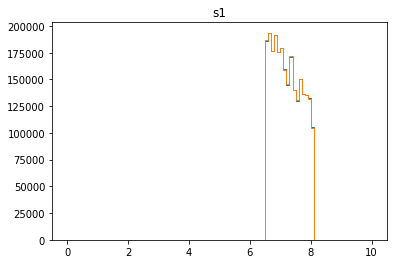

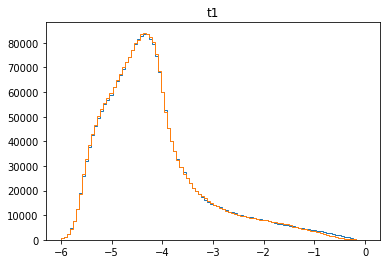

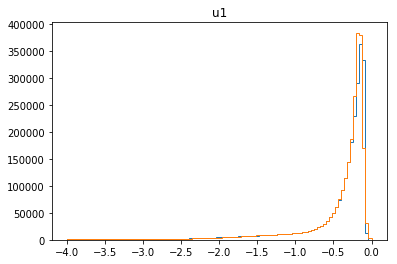

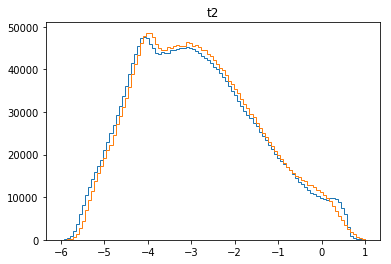

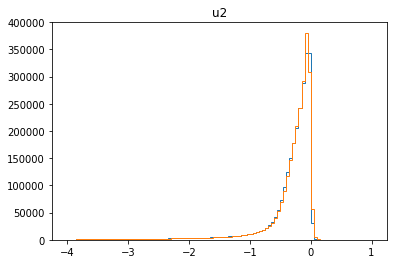

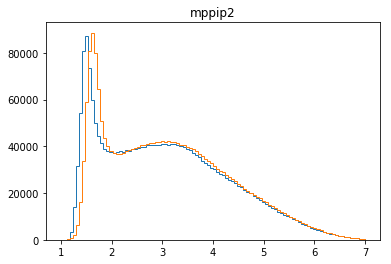

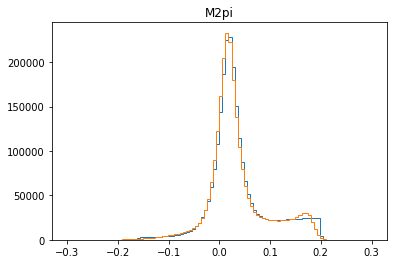

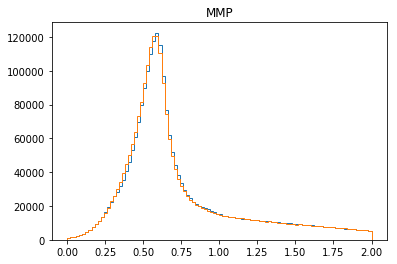

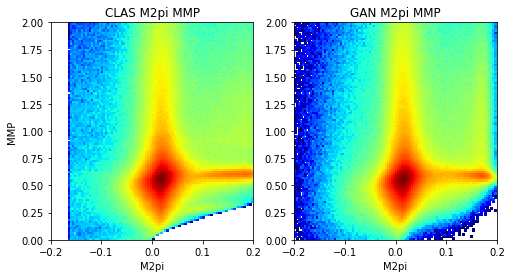

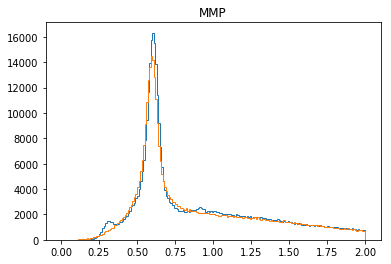

3001 [[-0.20525779, -0.20542222, 0.00016443201], [-0.033958238, -0.034522314, 0.000564077], [0.0793217, 0.07774882, 0.001572876], [0.059739925, 0.058897413, 0.00084251055], [-0.070194855, -0.07177576, 0.0015809046], [-0.24064569, -0.24327426, 0.0026285648], [-0.39250538, -0.39512613, 0.0026207475], [-0.49758297, -0.49807325, 0.00049028633], [-0.52644277, -0.5276953, 0.0012525126], [-0.43327135, -0.43351805, 0.00024671032], [-0.27060118, -0.27097368, 0.00037250778], [-0.08316952, -0.08333317, 0.0001636503], [0.087296575, 0.08687592, 0.0004206486], [0.18637376, 0.18293001, 0.0034437408], [0.14777286, 0.14749567, 0.00027719743], [0.03498631, 0.03311945, 0.0018668594], [-0.14956695, -0.15081541, 0.0012484657], [-0.3344995, -0.34119958, 0.006700055], [-0.47445294, -0.47543034, 0.0009773971], [-0.55608344, -0.5563915, 0.00030805237]]
3002 [[-0.5200706, -0.5200787, 8.1201e-06], [-0.4139371, -0.41431054, 0.00037346562], [-0.2825637, -0.2825732, 9.500422e-06], [-0.10869058, -0.1088125, 0.000121

3011 [[-0.44103906, -0.44118816, 0.00014910476], [-0.5361074, -0.5373077, 0.0012002817], [-0.557658, -0.55904704, 0.0013890226], [-0.49917197, -0.49965796, 0.00048598798], [-0.35413566, -0.35420564, 6.9983784e-05], [-0.17631425, -0.18134944, 0.0050351927], [-0.03798683, -0.038300734, 0.0003139049], [0.019121759, 0.018674491, 0.00044726674], [-0.027753029, -0.029019078, 0.0012660493], [-0.119350225, -0.11935898, 8.751526e-06], [-0.25520626, -0.25526696, 6.0707767e-05], [-0.39378592, -0.3939715, 0.00018556662], [-0.44757903, -0.44773787, 0.00015885476], [-0.43122515, -0.4313868, 0.00016165563], [-0.37486914, -0.37712833, 0.0022592084], [-0.3007043, -0.30259913, 0.0018948183], [-0.21862233, -0.21870324, 8.091104e-05], [-0.19735418, -0.19736934, 1.5154657e-05], [-0.21238014, -0.21251361, 0.00013346743], [-0.29391223, -0.29511675, 0.0012045143]]
3012 [[-0.38880953, -0.39073837, 0.0019288441], [-0.46573317, -0.4667972, 0.0010640303], [-0.46802297, -0.47029907, 0.0022761023], [-0.41592187, -0

3021 [[-0.33506534, -0.3351374, 7.207346e-05], [-0.20511363, -0.20552759, 0.00041394704], [-0.04680358, -0.04690919, 0.00010561252], [0.063508116, 0.06335294, 0.0001551742], [0.044772755, 0.044670023, 0.00010273141], [-0.06024157, -0.06077183, 0.0005302621], [-0.21387583, -0.2140177, 0.00014188126], [-0.39594182, -0.4016577, 0.0057158866], [-0.51519316, -0.51532847, 0.00013528042], [-0.56350744, -0.5653426, 0.001835184], [-0.52984256, -0.5304517, 0.00060915627], [-0.40218505, -0.40254623, 0.00036118334], [-0.2128363, -0.21373565, 0.00089935475], [-0.019083014, -0.019526014, 0.0004430011], [0.1255604, 0.124029756, 0.0015306511], [0.15455677, 0.1528372, 0.0017195673], [0.05945017, 0.05909548, 0.00035468792], [-0.06519572, -0.0657874, 0.00059167726], [-0.23535298, -0.24117985, 0.00582688], [-0.3733271, -0.37337255, 4.5460998e-05]]
3022 [[-0.48364115, -0.48768327, 0.004042118], [-0.5245132, -0.5247811, 0.00026793976], [-0.4964658, -0.4979984, 0.0015325918], [-0.3575, -0.35787618, 0.0003761

3031 [[0.022085, 0.021908669, 0.00017633081], [0.099170744, 0.09799531, 0.0011754333], [0.024364268, 0.024283528, 8.073955e-05], [-0.15554899, -0.15555, 1.0180556e-06], [-0.34324878, -0.34326074, 1.1944736e-05], [-0.47107288, -0.4723632, 0.0012903252], [-0.5503297, -0.55033594, 6.2717636e-06], [-0.5026522, -0.5027341, 8.187466e-05], [-0.3824496, -0.38244963, 4.3222826e-08], [-0.19013992, -0.19116, 0.0010200713], [0.0060631153, 0.0059347977, 0.00012831777], [0.1757263, 0.17506877, 0.0006575325], [0.24758355, 0.24750523, 7.832423e-05], [0.18999629, 0.1895082, 0.00048809266], [0.025329772, 0.025315221, 1.4551915e-05], [-0.14491144, -0.1450077, 9.62636e-05], [-0.29830953, -0.3017831, 0.0034735787], [-0.399061, -0.39943898, 0.00037797602], [-0.4210146, -0.42168108, 0.000666464], [-0.37201056, -0.37236246, 0.0003518916]]
3032 [[-0.23777336, -0.23884599, 0.0010726334], [-0.055053215, -0.055137455, 8.423866e-05], [0.076340996, 0.0744776, 0.0018633999], [0.11763967, 0.1161731, 0.0014665641], [4

3041 [[0.14609471, 0.14337263, 0.002722086], [0.010507498, 0.010406537, 0.000100960555], [-0.13574275, -0.13814935, 0.00240659], [-0.27460217, -0.27537668, 0.0007745158], [-0.35973933, -0.3597509, 1.1565459e-05], [-0.3541899, -0.35419622, 6.329214e-06], [-0.25323495, -0.25325477, 1.9818095e-05], [-0.115576945, -0.115879, 0.0003020561], [0.06545034, 0.06521884, 0.00023149377], [0.17742993, 0.17630585, 0.0011240846], [0.15327905, 0.15265407, 0.00062498084], [0.018179903, 0.017235847, 0.0009440551], [-0.1676679, -0.16846465, 0.00079675514], [-0.34683847, -0.3527924, 0.0059539424], [-0.5065607, -0.506979, 0.00041830476], [-0.5770727, -0.5798339, 0.002761235], [-0.5304868, -0.53090113, 0.00041433517], [-0.3950676, -0.397257, 0.002189405], [-0.23581123, -0.23632641, 0.0005151742], [-0.027989615, -0.028052844, 6.323011e-05]]
3042 [[0.16527012, 0.16519827, 7.1846946e-05], [0.3052743, 0.30477384, 0.0005004747], [0.34695727, 0.34596467, 0.0009926019], [0.26614308, 0.25851393, 0.0076291705], [0.0

3051 [[0.13917054, 0.13915683, 1.3706015e-05], [0.12072597, 0.12046052, 0.0002654479], [-0.039606508, -0.039672002, 6.5494714e-05], [-0.22345251, -0.22786711, 0.004414604], [-0.40734282, -0.41013622, 0.0027934005], [-0.5748254, -0.57484186, 1.6443215e-05], [-0.6157195, -0.6161687, 0.00044920508], [-0.5937493, -0.593769, 1.9733272e-05], [-0.46692067, -0.466945, 2.4328609e-05], [-0.28234816, -0.28301018, 0.00066203973], [-0.06592485, -0.067702, 0.001777147], [0.09512223, 0.095102124, 2.010784e-05], [0.09858666, 0.098561995, 2.4668465e-05], [0.06758565, 0.065503076, 0.0020825735], [-0.096667774, -0.09897162, 0.002303849], [-0.26068872, -0.26076928, 8.056826e-05], [-0.3897417, -0.3897486, 6.9081e-06], [-0.45725948, -0.45916393, 0.0019044615], [-0.45135525, -0.45326737, 0.0019121269], [-0.31012666, -0.31066468, 0.0005380204]]
3052 [[-0.11904413, -0.11908197, 3.7837253e-05], [0.05146475, 0.05014978, 0.0013149697], [0.1271728, 0.12502107, 0.0021517277], [0.07962636, 0.07722108, 0.0024052805],

3061 [[-0.43767294, -0.4376958, 2.284664e-05], [-0.31963715, -0.31994075, 0.0003035829], [-0.16823965, -0.1686154, 0.00037575435], [0.0010434843, 0.0007330841, 0.0003104002], [0.15127495, 0.15122674, 4.8201764e-05], [0.19970843, 0.19964321, 6.521715e-05], [0.14651383, 0.14636986, 0.00014397912], [0.004274934, 0.004251092, 2.3841858e-05], [-0.20005849, -0.2007087, 0.0006502165], [-0.36468896, -0.36557022, 0.00088125706], [-0.49408236, -0.4944241, 0.00034173302], [-0.537837, -0.53788084, 4.382979e-05], [-0.48507673, -0.4863561, 0.0012793863], [-0.35397097, -0.35401148, 4.0510964e-05], [-0.19370678, -0.19448726, 0.0007804724], [0.006992831, 0.0055262665, 0.0014665641], [0.1151103, 0.11489567, 0.00021463259], [0.088008545, 0.086902425, 0.0011061236], [-0.063561454, -0.06472567, 0.0011642127], [-0.22811927, -0.22938871, 0.0012694449]]
3062 [[-0.39386082, -0.39386085, 2.2704626e-08], [-0.5094145, -0.5100629, 0.0006483696], [-0.5497884, -0.55077165, 0.0009832495], [-0.49970558, -0.49984854, 0

3071 [[-0.61265886, -0.61285204, 0.00019317801], [-0.4802823, -0.4802823, 0.0], [-0.29621127, -0.29651624, 0.00030498023], [-0.09596662, -0.098980755, 0.0030141335], [0.043407977, 0.042808197, 0.0005997776], [0.08607751, 0.08569328, 0.00038423142], [0.052275352, 0.049337383, 0.0029379688], [-0.07173706, -0.07322415, 0.0014870876], [-0.22339097, -0.22397949, 0.00058852654], [-0.36584088, -0.36685184, 0.0010109539], [-0.4665693, -0.46681872, 0.000249414], [-0.5211523, -0.52353466, 0.0023823234], [-0.50619423, -0.50676405, 0.00056979933], [-0.4229393, -0.42528453, 0.0023452307], [-0.3086687, -0.3086786, 9.8923965e-06], [-0.23674017, -0.23697774, 0.00023756933], [-0.18199193, -0.1821669, 0.00017496578], [-0.26511532, -0.26512387, 8.549575e-06], [-0.36048204, -0.36332974, 0.002847695], [-0.47923934, -0.4792395, 1.440676e-07]]
3072 [[-0.53085595, -0.5309654, 0.00010944941], [-0.48645827, -0.48716593, 0.00070765545], [-0.3819596, -0.3855602, 0.0036006228], [-0.22647393, -0.22672148, 0.0002475

3081 [[-0.44338185, -0.44423836, 0.0008565197], [-0.57236654, -0.5726147, 0.00024821056], [-0.6510066, -0.6512781, 0.0002715108], [-0.62143016, -0.6215476, 0.000117411255], [-0.5262293, -0.526569, 0.0003396911], [-0.3556922, -0.35589603, 0.00020381856], [-0.14736977, -0.14931406, 0.0019442886], [0.025834545, 0.02563355, 0.00020099648], [0.09724428, 0.09724271, 1.5655532e-06], [0.049763497, 0.048348907, 0.0014145883], [-0.10609437, -0.10627916, 0.00018478795], [-0.2850607, -0.2862245, 0.0011638221], [-0.4207781, -0.4209995, 0.0002213914], [-0.50318694, -0.5036455, 0.00045855093], [-0.5022392, -0.50352985, 0.0012905993], [-0.42436036, -0.4243625, 2.134606e-06], [-0.25134668, -0.25137267, 2.5973655e-05], [-0.061297398, -0.061346557, 4.915992e-05], [0.05992765, 0.05949431, 0.00043333927], [0.12842564, 0.12754336, 0.0008822765]]
3082 [[0.09392007, 0.09375563, 0.00016443201], [-0.07985649, -0.0803747, 0.00051820907], [-0.25734612, -0.25743496, 8.885167e-05], [-0.4326465, -0.4342518, 0.001605

3091 [[-0.44568545, -0.44594538, 0.00025994526], [-0.6125576, -0.61312777, 0.0005701635], [-0.74435025, -0.74436474, 1.4464735e-05], [-0.81529635, -0.8171237, 0.0018273484], [-0.7541757, -0.75632447, 0.0021487204], [-0.6115552, -0.6116925, 0.00013723971], [-0.4424763, -0.44348943, 0.0010131383], [-0.2546578, -0.25582853, 0.0011707296], [-0.10140453, -0.10142041, 1.587585e-05], [-0.061389774, -0.062596805, 0.0012070313], [-0.17069918, -0.17132568, 0.00062650774], [-0.35386032, -0.3538717, 1.1371682e-05], [-0.5588659, -0.55898863, 0.00012271944], [-0.66274905, -0.66563165, 0.002882612], [-0.7454446, -0.74544525, 6.326045e-07], [-0.71235967, -0.71246344, 0.000103778], [-0.62279594, -0.62380654, 0.0010105901], [-0.4377042, -0.43795568, 0.00025146655], [-0.25157163, -0.25158724, 1.5603438e-05], [-0.07946111, -0.079929024, 0.0004679106]]
3092 [[0.0019679295, 0.0018494412, 0.00011848843], [-0.040991656, -0.04185848, 0.0008668216], [-0.1488997, -0.14898731, 8.759761e-05], [-0.32041276, -0.3204

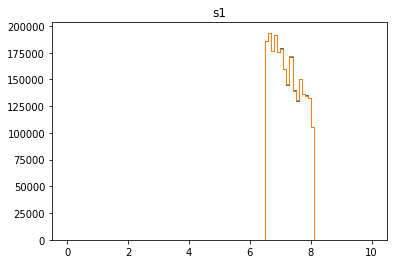

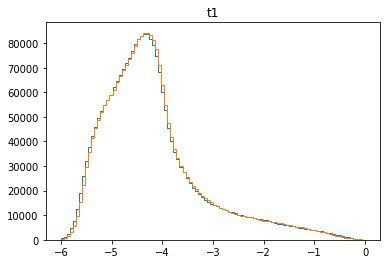

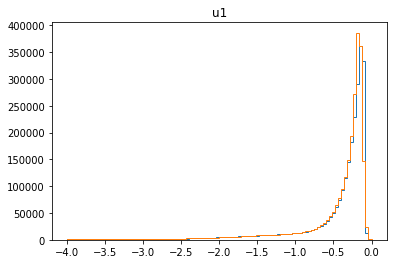

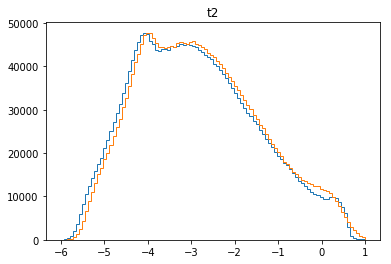

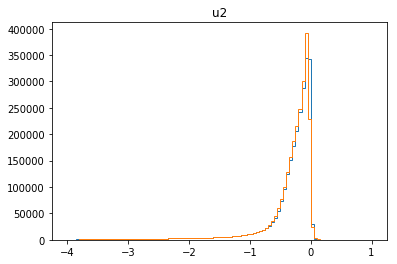

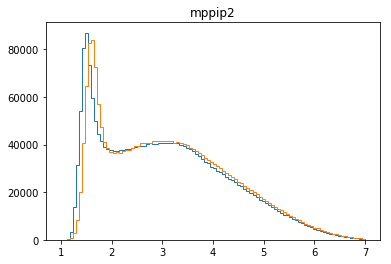

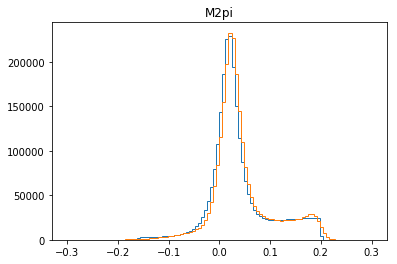

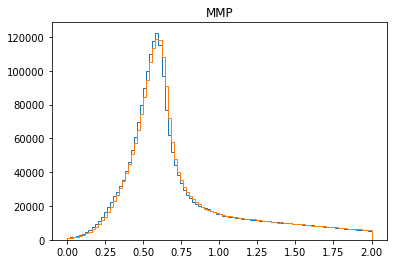

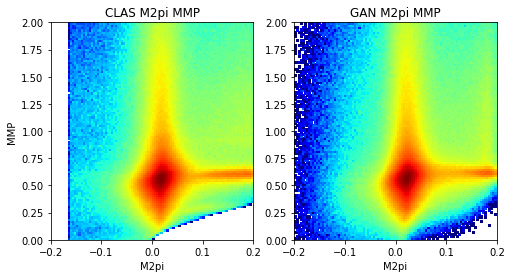

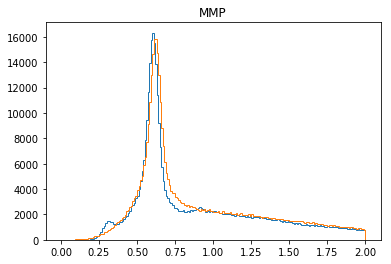

3101 [[-0.40432945, -0.40437743, 4.7990125e-05], [-0.3966439, -0.39892802, 0.0022841168], [-0.40431163, -0.40491673, 0.00060511444], [-0.4854344, -0.4854476, 1.3160767e-05], [-0.53465265, -0.53468907, 3.6396414e-05], [-0.54182, -0.54190195, 8.197824e-05], [-0.5457491, -0.5469984, 0.0012492744], [-0.49507293, -0.49551234, 0.00043939546], [-0.37643918, -0.37907577, 0.0026365893], [-0.2705322, -0.27060908, 7.6879245e-05], [-0.21590793, -0.21592037, 1.2437525e-05], [-0.19052394, -0.19132511, 0.00080117607], [-0.27205312, -0.27209085, 3.7743455e-05], [-0.3999498, -0.40069988, 0.0007500817], [-0.4341194, -0.43433365, 0.00021424159], [-0.3421429, -0.34621906, 0.0040761433], [-0.22148664, -0.22152536, 3.871044e-05], [-0.08075436, -0.080827996, 7.3636336e-05], [-0.07920222, -0.079487994, 0.00028577328], [-0.17857271, -0.17995663, 0.0013839093]]
3102 [[-0.34398416, -0.34458187, 0.00059772405], [-0.47660697, -0.48333517, 0.0067281877], [-0.620175, -0.6210184, 0.0008433965], [-0.6514969, -0.652095

3111 [[0.017952349, 0.017530134, 0.00042221483], [-0.15100105, -0.15162593, 0.0006248855], [-0.36503813, -0.36797982, 0.0029416918], [-0.562035, -0.56450206, 0.002467036], [-0.7003869, -0.7006473, 0.00026043752], [-0.7672904, -0.7673906, 0.00010019541], [-0.7202728, -0.72192734, 0.0016545465], [-0.60603976, -0.6089281, 0.0028883491], [-0.40941954, -0.41579118, 0.006371638], [-0.20625606, -0.2062804, 2.4328609e-05], [-0.05218056, -0.052186705, 6.148184e-06], [-0.014445433, -0.014542071, 9.663822e-05], [-0.07505414, -0.075857155, 0.0008030127], [-0.21494183, -0.21495141, 9.5829055e-06], [-0.36834896, -0.37064365, 0.0022947032], [-0.51734716, -0.5173591, 1.1905216e-05], [-0.62411016, -0.6241127, 2.585326e-06], [-0.61461526, -0.6181532, 0.0035379499], [-0.5324553, -0.5338542, 0.0013988498], [-0.36710933, -0.369108, 0.0019986574]]
3112 [[-0.17037648, -0.17044963, 7.314615e-05], [-0.021446094, -0.022238977, 0.00079288357], [0.02681383, 0.026235621, 0.0005782073], [-0.04367428, -0.044844095, 

3121 [[-0.55066055, -0.5528398, 0.0021792424], [-0.4442764, -0.44427645, 7.028939e-08], [-0.29734352, -0.2974968, 0.00015327925], [-0.102668926, -0.10665233, 0.003983398], [0.047640346, 0.047410533, 0.00022981365], [0.11776233, 0.11701235, 0.00074997725], [0.04216581, 0.040873565, 0.0012922443], [-0.15274222, -0.15276805, 2.5818357e-05], [-0.34826252, -0.35010114, 0.0018386176], [-0.49231946, -0.49235058, 3.1103904e-05], [-0.61466515, -0.6148265, 0.00016136473], [-0.63339764, -0.63403136, 0.00063368934], [-0.5727495, -0.5732047, 0.00045520783], [-0.41308215, -0.4130864, 4.266946e-06], [-0.18351386, -0.19421948, 0.010705614], [0.030460764, 0.026557852, 0.0039029124], [0.14235009, 0.14227183, 7.8256715e-05], [0.19227473, 0.19201939, 0.00025535293], [0.110891625, 0.110117, 0.00077462196], [-0.0787333, -0.07927053, 0.00053722435]]
3122 [[-0.27960002, -0.27963546, 3.5436242e-05], [-0.43607405, -0.4364048, 0.0003307513], [-0.5421208, -0.5423063, 0.00018551465], [-0.5998791, -0.60002744, 0.00

3131 [[0.05347915, 0.053452015, 2.7133361e-05], [0.065068536, 0.06504675, 2.178352e-05], [-0.045348186, -0.047206156, 0.0018579698], [-0.19770621, -0.19772568, 1.9479909e-05], [-0.32834777, -0.3288304, 0.00048262998], [-0.4421431, -0.44312948, 0.000986362], [-0.43634465, -0.43634465, 6.148184e-10], [-0.32064465, -0.32106444, 0.00041978844], [-0.14933673, -0.14959796, 0.00026123846], [0.033788756, 0.030293562, 0.0034951954], [0.13818063, 0.13749443, 0.00068620563], [0.093531616, 0.09329063, 0.0002409918], [-0.06590765, -0.06596803, 6.0381262e-05], [-0.25652632, -0.25709358, 0.00056725246], [-0.45081115, -0.45089632, 8.518661e-05], [-0.5747977, -0.5775973, 0.002799654], [-0.6060835, -0.60620344, 0.0001199462], [-0.5079883, -0.50812185, 0.00013359968], [-0.33025208, -0.33074787, 0.000495792], [-0.1275981, -0.13457863, 0.0069805183]]
3132 [[0.037834246, 0.036763236, 0.0010710098], [0.14092924, 0.14071672, 0.00021251416], [0.15547182, 0.1553549, 0.00011691576], [0.05434708, 0.052276153, 0.0

3141 [[-0.38771734, -0.391045, 0.0033276577], [-0.5324772, -0.5324783, 1.0569092e-06], [-0.5963586, -0.5973889, 0.001030331], [-0.59086233, -0.59101033, 0.00014798893], [-0.48288956, -0.4842736, 0.0013840508], [-0.31738913, -0.31747124, 8.211646e-05], [-0.17687273, -0.17794125, 0.0010685145], [-0.09015665, -0.090391114, 0.0002344633], [-0.10447432, -0.10450118, 2.6855885e-05], [-0.18573089, -0.18698922, 0.0012583246], [-0.32345134, -0.32361367, 0.00016233535], [-0.43028384, -0.43042782, 0.00014397912], [-0.4655765, -0.46648422, 0.0009077253], [-0.4530183, -0.45390195, 0.0008836368], [-0.35250843, -0.354131, 0.0016225828], [-0.22871813, -0.22887349, 0.00015536434], [-0.09830509, -0.098622315, 0.00031722538], [-0.0011685095, -0.002889976, 0.0017214664], [-0.0013261472, -0.0019137488, 0.00058760156], [-0.12288169, -0.12567307, 0.002791385]]
3142 [[-0.29898018, -0.29898027, 8.740244e-08], [-0.42139554, -0.42343205, 0.0020365245], [-0.47656962, -0.476601, 3.138109e-05], [-0.45112443, -0.453

3151 [[-0.2730585, -0.27311486, 5.6359917e-05], [-0.45606706, -0.45741138, 0.0013443197], [-0.5313154, -0.5329523, 0.0016369047], [-0.5353724, -0.5353798, 7.4601267e-06], [-0.42258132, -0.42423618, 0.001654857], [-0.2383207, -0.24038954, 0.0020688437], [-0.057307146, -0.057564452, 0.00025730734], [0.025033414, 0.023941834, 0.0010915815], [0.030555675, 0.030549327, 6.3484226e-06], [-0.0769138, -0.07780619, 0.0008923897], [-0.22201766, -0.22201802, 3.63274e-07], [-0.36391872, -0.36456332, 0.000644587], [-0.48533154, -0.48588273, 0.0005511955], [-0.46935382, -0.4700092, 0.0006553822], [-0.34362715, -0.34398234, 0.00035519095], [-0.18603514, -0.18765081, 0.0016156756], [-0.00697998, -0.0070437267, 6.374683e-05], [0.16230924, 0.16037387, 0.0019353838], [0.18629928, 0.18569455, 0.00060473935], [0.027064905, 0.027063608, 1.2966084e-06]]
3152 [[-0.16501449, -0.1652182, 0.00020370966], [-0.34562507, -0.3460433, 0.00041822673], [-0.4747311, -0.474732, 9.241048e-07], [-0.5426029, -0.54300725, 0.0

3161 [[-0.40391436, -0.40847436, 0.0045599993], [-0.273009, -0.27386028, 0.00085128046], [-0.076032765, -0.07614771, 0.000114944276], [0.0616949, 0.061656382, 3.8520797e-05], [0.089814134, 0.08967098, 0.00014315639], [-0.09123412, -0.09232079, 0.001086672], [-0.22242965, -0.2229578, 0.0005281559], [-0.38975003, -0.3904489, 0.0006988543], [-0.53088754, -0.5312775, 0.00038993533], [-0.55503374, -0.55519044, 0.00015669853], [-0.4747446, -0.4761652, 0.0014206202], [-0.2983168, -0.2983861, 6.928348e-05], [-0.10491708, -0.10723615, 0.0023190714], [0.06751512, 0.06603289, 0.0014822371], [0.1809408, 0.17830147, 0.0026393326], [0.11151506, 0.10807177, 0.0034432933], [-0.07217496, -0.073569104, 0.0013941453], [-0.22590171, -0.22592086, 1.9144632e-05], [-0.35969827, -0.36119744, 0.0014991747], [-0.43950996, -0.4396509, 0.00014092866]]
3162 [[-0.4392229, -0.43951496, 0.00029206276], [-0.3592325, -0.36159512, 0.0023626278], [-0.1992352, -0.19937862, 0.00014343036], [-0.0156909, -0.017905006, 0.0022

3171 [[0.0029547901, 0.0028491383, 0.0001056517], [-0.14730266, -0.1476799, 0.0003772347], [-0.29020274, -0.29106933, 0.0008665969], [-0.3689123, -0.3698659, 0.00095357274], [-0.3914417, -0.3921766, 0.0007349059], [-0.32852596, -0.32858822, 6.226316e-05], [-0.20916346, -0.20933406, 0.0001706034], [-0.057457343, -0.059715282, 0.0022579394], [0.067820914, 0.06726208, 0.0005588344], [0.028994499, 0.027234517, 0.0017599812], [-0.10750386, -0.107517995, 1.4132967e-05], [-0.2722298, -0.27305633, 0.00082653173], [-0.4169719, -0.41699383, 2.192619e-05], [-0.5308284, -0.53101414, 0.00018572254], [-0.5033608, -0.5040881, 0.00072727323], [-0.398823, -0.40059146, 0.0017684737], [-0.25406405, -0.25435826, 0.0002942181], [-0.08347494, -0.08709138, 0.0036164348], [0.058184642, 0.05817387, 1.0775114e-05], [0.09670068, 0.09593178, 0.0007688993]]
3172 [[0.0017770645, 0.0016350469, 0.00014201761], [-0.18704632, -0.18708773, 4.14143e-05], [-0.36452442, -0.36467424, 0.0001498043], [-0.4689178, -0.46896103,

3181 [[0.086380266, 0.08585613, 0.000524131], [-0.006726702, -0.0073476844, 0.000620982], [-0.17246358, -0.17435774, 0.0018941539], [-0.32467267, -0.325887, 0.0012143316], [-0.39083245, -0.39171565, 0.00088318315], [-0.32262602, -0.32298115, 0.00035511915], [-0.1636071, -0.16391724, 0.00031013147], [0.039442442, 0.039420426, 2.201559e-05], [0.16374895, 0.16267657, 0.0010723837], [0.17176528, 0.17131527, 0.00045001387], [0.015940782, 0.0147109805, 0.0012298005], [-0.18969792, -0.18972303, 2.5106165e-05], [-0.36175048, -0.3621041, 0.0003536111], [-0.4581415, -0.4599222, 0.0017806864], [-0.5123885, -0.51427305, 0.0018845374], [-0.4779399, -0.47885084, 0.0009109462], [-0.33544904, -0.33588612, 0.00043707958], [-0.13470277, -0.13869628, 0.0039935163], [0.0050171018, 0.0042287232, 0.00078837853], [-0.004401309, -0.0044192383, 1.7929415e-05]]
3182 [[-0.1448987, -0.14561531, 0.00071661355], [-0.28657097, -0.2871908, 0.0006198418], [-0.43993548, -0.4400048, 6.931523e-05], [-0.45569727, -0.45571

3191 [[0.08307633, 0.0830528, 2.3526256e-05], [0.21672422, 0.20996156, 0.006762651], [0.1809509, 0.18068935, 0.00026154678], [0.023047188, 0.022092672, 0.0009545155], [-0.23051772, -0.23071004, 0.00019233064], [-0.4204427, -0.4229625, 0.002519799], [-0.58443457, -0.5844898, 5.524857e-05], [-0.68362546, -0.6887671, 0.0051415865], [-0.69785583, -0.6978773, 2.1481901e-05], [-0.60472685, -0.60514575, 0.0004189291], [-0.44346723, -0.4434704, 3.1532584e-06], [-0.23273556, -0.23399496, 0.0012594071], [-0.047897812, -0.04901832, 0.0011205066], [0.08363291, 0.082833566, 0.00079934153], [0.041072186, 0.040911403, 0.00016078376], [-0.09860365, -0.09919588, 0.0005922342], [-0.28301302, -0.28301412, 1.104494e-06], [-0.45861435, -0.4592076, 0.0005932557], [-0.55698216, -0.55850196, 0.0015197757], [-0.5720233, -0.5720333, 9.988614e-06]]
3192 [[-0.4935658, -0.49356928, 3.4796685e-06], [-0.34620595, -0.34712383, 0.00091786735], [-0.16290179, -0.16290496, 3.1668205e-06], [-0.018255528, -0.019955536, 0.0

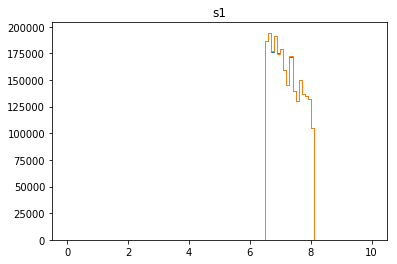

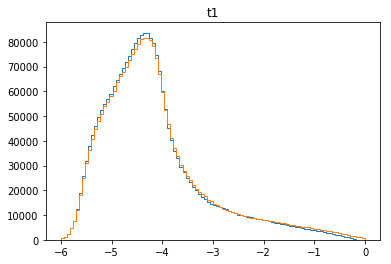

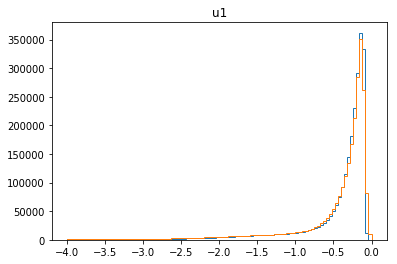

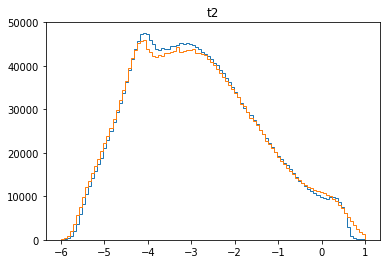

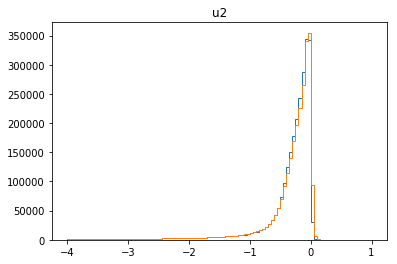

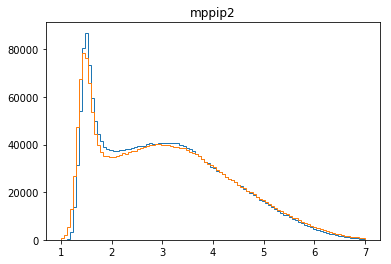

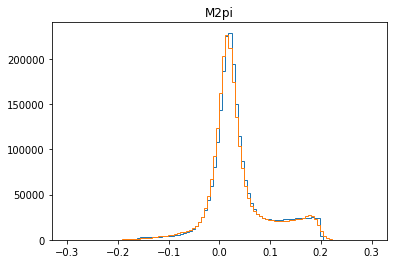

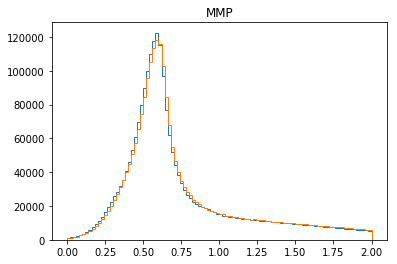

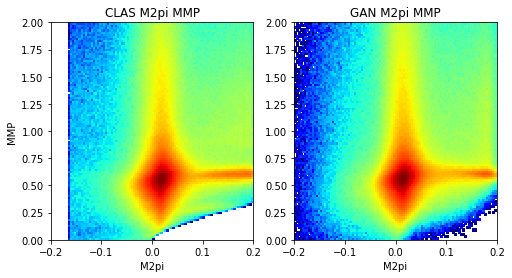

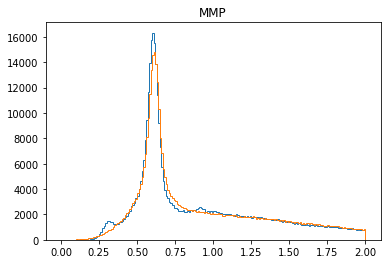

3201 [[-0.25214645, -0.2521469, 4.6106288e-07], [-0.050945476, -0.05095465, 9.174051e-06], [0.047765832, 0.047352117, 0.00041371424], [0.03126877, 0.03125781, 1.0963763e-05], [-0.07199115, -0.07199511, 3.9575716e-06], [-0.22383675, -0.22383752, 7.765048e-07], [-0.41054112, -0.41348365, 0.0029425195], [-0.544512, -0.5445131, 1.1408702e-06], [-0.65537286, -0.65565777, 0.0002849356], [-0.6663914, -0.6675651, 0.0011737335], [-0.57258517, -0.57258576, 6.0262755e-07], [-0.40968087, -0.41055974, 0.0008788805], [-0.2561386, -0.2570949, 0.00095628406], [-0.15755475, -0.16318816, 0.005633414], [-0.17871714, -0.18037432, 0.0016571856], [-0.2857906, -0.28810105, 0.002310445], [-0.44551206, -0.4493306, 0.003818533], [-0.57490224, -0.57572174, 0.0008195278], [-0.6847997, -0.68480116, 1.466924e-06], [-0.7018705, -0.7024995, 0.00062899286]]
3202 [[-0.5893702, -0.58944887, 7.869602e-05], [-0.43678316, -0.43766147, 0.0008783153], [-0.29513824, -0.29575363, 0.000615386], [-0.13972603, -0.1399002, 0.00017

3211 [[-0.27231288, -0.27233487, 2.1979811e-05], [-0.16656484, -0.16682404, 0.00025920774], [-0.13133845, -0.13197021, 0.00063177024], [-0.10745809, -0.10910257, 0.001644476], [-0.15862894, -0.15883319, 0.0002042545], [-0.23235139, -0.23235978, 8.383082e-06], [-0.3664631, -0.3669428, 0.00047970127], [-0.47380584, -0.47404826, 0.00024241519], [-0.5581113, -0.5581799, 6.8586676e-05], [-0.5366082, -0.53825194, 0.0016437025], [-0.43033454, -0.43035197, 1.7448112e-05], [-0.2832422, -0.2855034, 0.0022612028], [-0.16357067, -0.16439568, 0.0008249971], [-0.1445773, -0.1445906, 1.3313435e-05], [-0.2617942, -0.26307482, 0.0012806145], [-0.40638924, -0.40645045, 6.12141e-05], [-0.54283637, -0.542922, 8.564496e-05], [-0.5829674, -0.5871268, 0.00415937], [-0.5785349, -0.5791296, 0.00059465034], [-0.4677914, -0.47228852, 0.0044971057]]
3212 [[-0.305769, -0.30577782, 8.8193665e-06], [-0.12690723, -0.12693025, 2.3029337e-05], [0.018092684, 0.016486196, 0.0016064886], [0.09575619, 0.09519745, 0.0005587

3221 [[-0.109156646, -0.109393924, 0.00023727542], [-0.19859405, -0.19906767, 0.0004736216], [-0.32361338, -0.32410747, 0.0004940946], [-0.3381548, -0.3383797, 0.00022492449], [-0.32168373, -0.32171553, 3.180994e-05], [-0.22798893, -0.23157263, 0.003583704], [-0.13228565, -0.13249122, 0.00020556505], [-0.10281181, -0.10308364, 0.00027182515], [-0.19718796, -0.19825473, 0.0010667692], [-0.3360033, -0.33673778, 0.0007344922], [-0.43411624, -0.43433228, 0.00021603204], [-0.5195603, -0.5196201, 5.981938e-05], [-0.524961, -0.528814, 0.0038530268], [-0.47494286, -0.4749593, 1.6458684e-05], [-0.3790097, -0.38284758, 0.0038378872], [-0.21726756, -0.21731384, 4.6287783e-05], [-0.09271813, -0.0934185, 0.0007003677], [-0.0804792, -0.08052448, 4.5281136e-05], [-0.15037516, -0.15098271, 0.0006075567], [-0.26199687, -0.26211485, 0.000117990654]]
3222 [[-0.3030696, -0.30427027, 0.0012006783], [-0.28233197, -0.28236598, 3.3997818e-05], [-0.21837834, -0.21964385, 0.0012655066], [-0.13556144, -0.1361059

3231 [[-0.03879811, -0.039495148, 0.00069704023], [-0.20950158, -0.20981225, 0.00031066916], [-0.37817058, -0.37844938, 0.00027878743], [-0.54010105, -0.5401678, 6.6735396e-05], [-0.63844347, -0.63969964, 0.0012561604], [-0.66336983, -0.66440827, 0.0010384284], [-0.58560425, -0.5875531, 0.0019488325], [-0.43454924, -0.43516228, 0.0006130226], [-0.2510295, -0.2519649, 0.00093540177], [-0.111037776, -0.11175562, 0.0007178394], [-0.057699792, -0.057856634, 0.00015684185], [-0.1276024, -0.1280981, 0.00049570703], [-0.25991228, -0.2599124, 1.1787051e-07], [-0.41899514, -0.41910523, 0.00011008886], [-0.5526771, -0.554093, 0.0014158796], [-0.63957375, -0.6396396, 6.586569e-05], [-0.61770946, -0.61770946, 2.3283064e-10], [-0.51568633, -0.51598054, 0.0002942181], [-0.40049303, -0.40150896, 0.001015933], [-0.17978023, -0.17988805, 0.00010781928]]
3232 [[-0.0069635184, -0.0074203555, 0.0004568371], [0.06483079, 0.06478663, 4.4158718e-05], [0.057760682, 0.057756174, 4.506616e-06], [-0.022390854, -

3241 [[-0.019182933, -0.02089697, 0.0017140352], [0.09437294, 0.09436247, 1.0476683e-05], [0.12419634, 0.124009214, 0.00018712884], [0.010789216, 0.0107337395, 5.5475633e-05], [-0.15771769, -0.15857689, 0.0008592011], [-0.35355318, -0.35355565, 2.4760993e-06], [-0.5228989, -0.52306044, 0.00016151014], [-0.6593523, -0.6593571, 4.777816e-06], [-0.72619396, -0.72654915, 0.00035519095], [-0.71460253, -0.71566343, 0.0010609217], [-0.61896676, -0.6196982, 0.00073149713], [-0.42962846, -0.42988083, 0.00025237474], [-0.2693464, -0.2716473, 0.0023009204], [-0.15631123, -0.15655193, 0.0002406958], [-0.076265305, -0.08062004, 0.0043547396], [-0.12336457, -0.12336806, 3.493915e-06], [-0.24861585, -0.25005928, 0.0014434283], [-0.40776142, -0.40777507, 1.3663681e-05], [-0.51609254, -0.51936084, 0.0032682903], [-0.572154, -0.5721556, 1.5847036e-06]]
3242 [[-0.5532919, -0.5538886, 0.00059669843], [-0.42945027, -0.4294537, 3.4229743e-06], [-0.27131322, -0.2714507, 0.00013746323], [-0.12526004, -0.12543

3251 [[-0.38307914, -0.3841643, 0.0010851634], [-0.39675105, -0.39676285, 1.1813259e-05], [-0.3581362, -0.35832837, 0.00019217195], [-0.28801915, -0.28802505, 5.91399e-06], [-0.22217055, -0.22232835, 0.00015779879], [-0.19937177, -0.20632109, 0.00694932], [-0.25205612, -0.25220537, 0.00014924453], [-0.35863066, -0.35886285, 0.00023219081], [-0.42658317, -0.4266039, 2.0745734e-05], [-0.48412576, -0.48481786, 0.00069211406], [-0.5115624, -0.5117092, 0.00014683105], [-0.4990292, -0.49953756, 0.0005083568], [-0.39870104, -0.39989763, 0.0011965838], [-0.23457581, -0.23776692, 0.0031911137], [-0.041714456, -0.041804317, 8.986137e-05], [0.08248627, 0.08101459, 0.0014716816], [0.058302812, 0.058007874, 0.00029493825], [-0.08163837, -0.08366974, 0.0020313635], [-0.20141079, -0.20153743, 0.00012663806], [-0.30723482, -0.30725434, 1.9530447e-05]]
3252 [[-0.34178305, -0.34178373, 6.82081e-07], [-0.27944422, -0.28003755, 0.00059334876], [-0.16688955, -0.16745073, 0.00056118146], [-0.04557959, -0.04

3261 [[-0.060931258, -0.061667614, 0.0007363543], [0.15395886, 0.1539065, 5.2366653e-05], [0.30374917, 0.3037408, 8.361007e-06], [0.32700133, 0.32688233, 0.00011898724], [0.16682418, 0.16680478, 1.9395813e-05], [-0.054040316, -0.054194164, 0.0001538465], [-0.26616392, -0.2676004, 0.0014364801], [-0.44205996, -0.4435258, 0.001465834], [-0.55529773, -0.55551374, 0.00021603204], [-0.59516203, -0.5981521, 0.0029900968], [-0.5645893, -0.56481147, 0.00022212991], [-0.44965976, -0.45171353, 0.002053776], [-0.29356772, -0.29360086, 3.313589e-05], [-0.123267815, -0.12342523, 0.00015741565], [0.03979981, 0.039784994, 1.4815028e-05], [0.10846748, 0.10816919, 0.0002982889], [0.09632446, 0.0961345, 0.00018995734], [-0.058968607, -0.058999225, 3.0616506e-05], [-0.22875676, -0.23200805, 0.0032513018], [-0.38894722, -0.3890118, 6.457182e-05]]
3262 [[-0.48242432, -0.485226, 0.002801673], [-0.48514742, -0.48839697, 0.0032495619], [-0.43159673, -0.43350586, 0.0019091256], [-0.2896047, -0.28974658, 0.0001

3271 [[-0.2713528, -0.2715233, 0.00017050377], [-0.13909979, -0.13953249, 0.0004327042], [-0.037314687, -0.0378167, 0.00050201203], [-0.028073631, -0.030019939, 0.0019463075], [-0.1736255, -0.17383657, 0.00021107076], [-0.35292938, -0.3546648, 0.0017354224], [-0.507403, -0.5173102, 0.009907215], [-0.61903995, -0.61939967, 0.00035973478], [-0.6398143, -0.64003575, 0.00022144815], [-0.5793322, -0.5796798, 0.00034761115], [-0.39875343, -0.39919588, 0.0004424393], [-0.17170782, -0.17741679, 0.005708968], [0.07492968, 0.07473517, 0.00019450579], [0.25944957, 0.25943786, 1.1721658e-05], [0.3020852, 0.30208412, 1.0845397e-06], [0.18727374, 0.18708357, 0.0001901677], [-0.012385013, -0.012417864, 3.2851047e-05], [-0.19663253, -0.1973888, 0.0007562583], [-0.38556942, -0.38625163, 0.0006822143], [-0.4803598, -0.48138314, 0.0010233633]]
3272 [[-0.5273227, -0.5277509, 0.00042819302], [-0.4463847, -0.44659165, 0.00020693465], [-0.30818942, -0.30856082, 0.00037140425], [-0.0901542, -0.09232455, 0.002

3281 [[0.06954539, 0.069493845, 5.1541774e-05], [0.05168754, 0.05149884, 0.00018869761], [-0.06931071, -0.07289076, 0.003580051], [-0.22896439, -0.23678568, 0.007821286], [-0.4221958, -0.42296353, 0.0007677363], [-0.55038977, -0.55158836, 0.0011985642], [-0.6124941, -0.61322623, 0.0007321164], [-0.5494478, -0.552218, 0.0027702628], [-0.43134132, -0.43357757, 0.0022362396], [-0.23592448, -0.23861443, 0.0026899395], [-0.027287792, -0.027953863, 0.0006660701], [0.12521507, 0.12521139, 3.6744493e-06], [0.14013372, 0.1401297, 4.0261657e-06], [0.017255187, 0.016741138, 0.0005140492], [-0.18679564, -0.18682939, 3.3753593e-05], [-0.376001, -0.37657008, 0.00056907104], [-0.5323439, -0.5370947, 0.004750774], [-0.6065201, -0.6073569, 0.0008367626], [-0.6391793, -0.64046794, 0.0012886815], [-0.5259817, -0.52655053, 0.00056879804]]
3282 [[-0.35884255, -0.35993603, 0.0010934732], [-0.14321263, -0.1435221, 0.00030946004], [0.021863298, 0.017285507, 0.0045777913], [0.13122612, 0.13077424, 0.0004518771

3291 [[-0.30485722, -0.30513301, 0.0002758019], [-0.32191643, -0.32261035, 0.00069392164], [-0.32909992, -0.33257934, 0.0034794267], [-0.34141755, -0.3428739, 0.001456356], [-0.3105467, -0.310571, 2.4328609e-05], [-0.2601937, -0.26020512, 1.1410306e-05], [-0.22542416, -0.22615752, 0.00073335535], [-0.2351541, -0.23534171, 0.00018759878], [-0.23231323, -0.23235275, 3.9521605e-05], [-0.18946716, -0.1895326, 6.543298e-05], [-0.17895173, -0.17953223, 0.0005805029], [-0.16951044, -0.17252332, 0.0030128772], [-0.12315989, -0.12318309, 2.3194392e-05], [-0.07237997, -0.07347862, 0.001098651], [-0.10095777, -0.10130945, 0.00035167698], [-0.1716518, -0.17288575, 0.001233951], [-0.21718611, -0.21823303, 0.0010469276], [-0.23713991, -0.23787367, 0.0007337686], [-0.26671556, -0.2704574, 0.0037418397], [-0.25053176, -0.25053525, 3.4725563e-06]]
3292 [[-0.25969166, -0.2660953, 0.006403651], [-0.27909485, -0.2790955, 6.509399e-07], [-0.26560983, -0.2665478, 0.00093797], [-0.2516859, -0.2522103, 0.0005

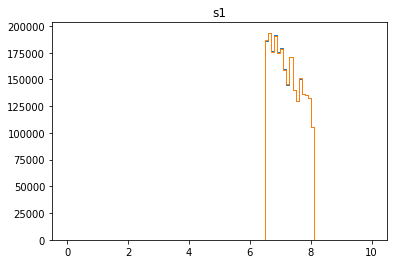

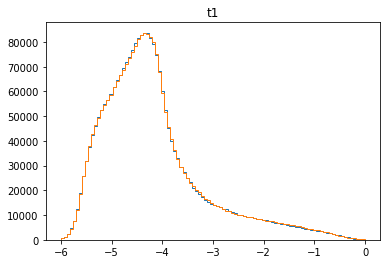

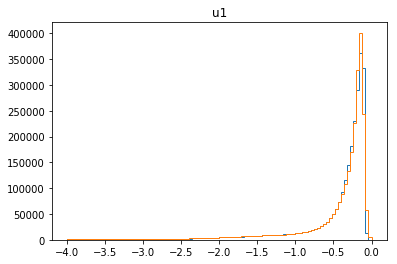

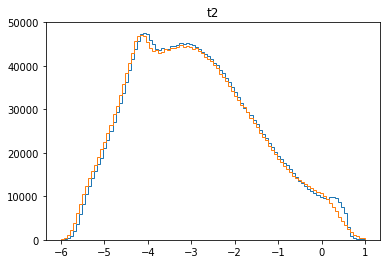

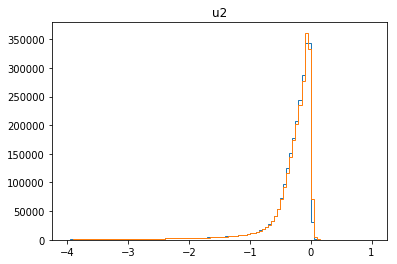

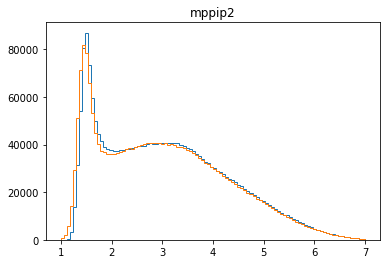

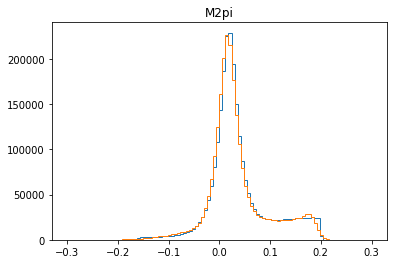

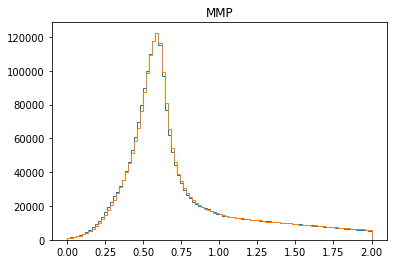

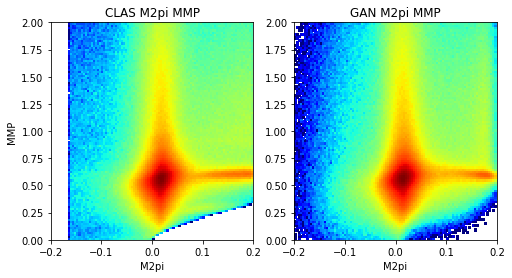

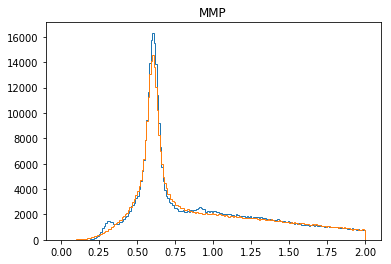

3301 [[-0.43733123, -0.4390573, 0.001726059], [-0.29704583, -0.29707652, 3.070099e-05], [-0.11873314, -0.1237705, 0.005037358], [0.066899315, 0.0658551, 0.0010442139], [0.1490786, 0.14841065, 0.000667942], [0.09406207, 0.09398609, 7.5978816e-05], [-0.062420297, -0.06269319, 0.00027289538], [-0.26376274, -0.26394454, 0.00018179258], [-0.4296739, -0.4296748, 8.842071e-07], [-0.5219876, -0.5225096, 0.00052194984], [-0.49878252, -0.4997943, 0.0010118032], [-0.40029338, -0.4003584, 6.503245e-05], [-0.22221026, -0.22237858, 0.00016831911], [-0.026261318, -0.028048934, 0.0017876151], [0.09829876, 0.09795646, 0.0003422974], [0.08678439, 0.0851481, 0.0016362877], [-0.04842178, -0.04878952, 0.0003677375], [-0.21424612, -0.2146589, 0.00041278361], [-0.41795087, -0.4180171, 6.620668e-05], [-0.5569032, -0.5575256, 0.0006224087]]
3302 [[-0.56174916, -0.5619406, 0.00019143232], [-0.5058325, -0.5062041, 0.00037162477], [-0.3510434, -0.35182568, 0.00078228506], [-0.15526026, -0.15538055, 0.00012028068]

3311 [[0.1328242, 0.13265523, 0.00016896312], [0.21477944, 0.21472262, 5.6819063e-05], [0.17577076, 0.17565471, 0.000116051175], [0.06473145, 0.056557436, 0.0081740115], [-0.10382876, -0.105486564, 0.0016578065], [-0.2510203, -0.25117448, 0.0001541779], [-0.33574602, -0.33579314, 4.7122016e-05], [-0.36015773, -0.36408618, 0.0039284546], [-0.33300343, -0.33304834, 4.492247e-05], [-0.20646587, -0.2107113, 0.004245426], [-0.09138256, -0.09203658, 0.0006540157], [-0.053750265, -0.054440673, 0.00069040904], [-0.02894822, -0.028953355, 5.1344396e-06], [-0.11405228, -0.11775224, 0.0036999555], [-0.24963868, -0.24965656, 1.7880988e-05], [-0.40385416, -0.4039278, 7.3636336e-05], [-0.4837166, -0.48371673, 1.1397424e-07], [-0.48777327, -0.48809904, 0.0003257751], [-0.4180444, -0.41811946, 7.508369e-05], [-0.26831904, -0.26890278, 0.0005837242]]
3312 [[-0.06494934, -0.06636106, 0.00141172], [0.1138611, 0.103920065, 0.009941036], [0.17383642, 0.17273511, 0.0011013077], [0.14921182, 0.14882159, 0.00

3321 [[-0.4378599, -0.43799326, 0.0001333793], [-0.5203342, -0.5205396, 0.00020540098], [-0.51770055, -0.5177723, 7.1782284e-05], [-0.39289844, -0.3929755, 7.708006e-05], [-0.2059603, -0.20644848, 0.00048817694], [-0.03969522, -0.040002402, 0.00030718264], [0.034402017, 0.034400024, 1.9921572e-06], [0.069396034, 0.068047374, 0.0013486587], [0.004724078, 0.002665285, 0.0020587926], [-0.1285335, -0.12919259, 0.00065909844], [-0.27477396, -0.28027388, 0.0054999324], [-0.3902363, -0.39069206, 0.0004557778], [-0.42802972, -0.4287693, 0.0007395668], [-0.38422298, -0.38585913, 0.0016361332], [-0.2607289, -0.26074868, 1.9801113e-05], [-0.07551397, -0.07551397, 5.2386895e-10], [0.10238, 0.10148247, 0.00089752517], [0.17607474, 0.1760599, 1.4844409e-05], [0.1438666, 0.14380452, 6.20827e-05], [0.027385669, 0.027328013, 5.7656e-05]]
3322 [[-0.14276731, -0.14278843, 2.1112213e-05], [-0.2771061, -0.2772279, 0.00012179152], [-0.37805015, -0.378051, 8.5221836e-07], [-0.44204476, -0.4446745, 0.00262973

3331 [[-0.39035517, -0.39214924, 0.0017940725], [-0.4318984, -0.4324493, 0.0005509269], [-0.37541333, -0.37575585, 0.0003425091], [-0.24332172, -0.24454243, 0.0012207206], [-0.08963467, -0.089654334, 1.9665547e-05], [-0.01750038, -0.018618207, 0.0011178267], [-0.02576315, -0.026023157, 0.00026000678], [-0.11539913, -0.11551408, 0.000114944276], [-0.26493186, -0.26684183, 0.0019099589], [-0.4353529, -0.43554273, 0.0001898522], [-0.5175188, -0.52068263, 0.003163805], [-0.48706725, -0.487279, 0.00021173635], [-0.41392744, -0.41401887, 9.142301e-05], [-0.2717356, -0.27302867, 0.001293067], [-0.1068148, -0.109411, 0.0025961993], [-0.044208057, -0.04425414, 4.608039e-05], [-0.06489971, -0.06500765, 0.00010793813], [-0.15959425, -0.15959595, 1.7020502e-06], [-0.2827432, -0.28654525, 0.0038020506], [-0.4042089, -0.40705028, 0.002841388]]
3332 [[-0.46761283, -0.46839714, 0.0007843136], [-0.40856284, -0.40858674, 2.3897772e-05], [-0.29387015, -0.29387027, 1.2183227e-07], [-0.15011951, -0.1510164

3341 [[0.04736277, 0.045534443, 0.0018283272], [0.11201478, 0.11197439, 4.0389656e-05], [0.02695862, 0.026111785, 0.00084683433], [-0.13376378, -0.1350225, 0.0012587308], [-0.3528879, -0.36104363, 0.008155743], [-0.48621455, -0.48638982, 0.0001752687], [-0.5710221, -0.5713326, 0.0003104674], [-0.5610565, -0.56153995, 0.00048346847], [-0.44330075, -0.4439781, 0.0006773409], [-0.26802278, -0.26912358, 0.0011008015], [-0.076990955, -0.07731377, 0.0003228211], [0.10383237, 0.10379922, 3.3157856e-05], [0.2148168, 0.21291, 0.001906793], [0.19327186, 0.18956633, 0.0037055262], [0.063935965, 0.06383543, 0.000100539364], [-0.091931075, -0.092344016, 0.00041293868], [-0.2865051, -0.286507, 1.9174913e-06], [-0.4438956, -0.44740707, 0.0035114517], [-0.44910163, -0.44943705, 0.00033541585], [-0.42184934, -0.4218499, 5.762704e-07]]
3342 [[-0.31832668, -0.3183428, 1.6135295e-05], [-0.11125362, -0.12689388, 0.01564026], [0.063681886, 0.06328832, 0.0003935595], [0.17232265, 0.17227124, 5.140493e-05], [

3351 [[-0.10506637, -0.10534509, 0.00027872375], [0.01564427, 0.015637865, 6.406223e-06], [0.03633676, 0.03596204, 0.00037471982], [-0.018320663, -0.019389551, 0.0010688888], [-0.12609744, -0.13281624, 0.006718803], [-0.24846102, -0.25256473, 0.004103711], [-0.3376265, -0.33974087, 0.0021143777], [-0.34749126, -0.34899104, 0.0014997657], [-0.30972308, -0.3110115, 0.0012884076], [-0.2209053, -0.22097188, 6.6579676e-05], [-0.15022759, -0.15067688, 0.0004492859], [-0.12621564, -0.12624054, 2.4896348e-05], [-0.10947016, -0.11401446, 0.0045443], [-0.17812204, -0.17812301, 9.648829e-07], [-0.2766343, -0.2769793, 0.0003449846], [-0.30598944, -0.3069889, 0.0009994642], [-0.26307344, -0.27094474, 0.007871294], [-0.2193656, -0.21979016, 0.00042456962], [-0.1089735, -0.109021544, 4.8042988e-05], [0.013717183, 0.013703603, 1.3579207e-05]]
3352 [[0.056788854, 0.05601593, 0.00077292416], [-0.013416071, -0.013461352, 4.5281136e-05], [-0.09607676, -0.09934723, 0.003270471], [-0.22225568, -0.22225635, 

3361 [[-0.15144704, -0.15145072, 3.6744493e-06], [-0.317852, -0.31785414, 2.140183e-06], [-0.45538607, -0.45782307, 0.0024370018], [-0.51701957, -0.5176932, 0.0006736724], [-0.46521893, -0.46529597, 7.7046585e-05], [-0.3372624, -0.33758816, 0.0003257751], [-0.19317764, -0.19547929, 0.0023016522], [-0.00021134471, -0.00029512882, 8.37841e-05], [0.14450386, 0.1414868, 0.0030170656], [0.14684828, 0.14655471, 0.00029356408], [0.016241424, 0.01607792, 0.00016350392], [-0.09628539, -0.09671169, 0.00042630066], [-0.29520455, -0.29542333, 0.00021878815], [-0.43627304, -0.4362894, 1.6350532e-05], [-0.5194776, -0.5195395, 6.187247e-05], [-0.57402724, -0.5742556, 0.00022837023], [-0.47347507, -0.475351, 0.0018759356], [-0.3152359, -0.3152367, 7.697963e-07], [-0.15073098, -0.15074284, 1.1865763e-05], [-0.05102341, -0.051114358, 9.094948e-05]]
3362 [[-0.03896589, -0.039903156, 0.00093726936], [-0.15426241, -0.15695491, 0.0026925118], [-0.29980808, -0.30047053, 0.00066243234], [-0.4534801, -0.454050

3371 [[-0.24242441, -0.24311562, 0.0006912111], [-0.015265213, -0.015285373, 2.0159192e-05], [0.19377916, 0.1936278, 0.00015134901], [0.25789136, 0.25789067, 6.82081e-07], [0.13703623, 0.13687062, 0.00016560809], [0.0060701743, 0.0059564537, 0.00011372061], [-0.19982278, -0.19984537, 2.2592083e-05], [-0.38217127, -0.38219565, 2.4366249e-05], [-0.46551448, -0.46566904, 0.00015455708], [-0.47627836, -0.4769489, 0.0006705077], [-0.42916122, -0.42917106, 9.8444625e-06], [-0.2934749, -0.29433078, 0.00085585], [-0.12847856, -0.12856294, 8.437876e-05], [0.059340604, 0.05883534, 0.00050526514], [0.18682463, 0.18344529, 0.0033793494], [0.10757947, 0.10757947, 1.0513759e-09], [-0.08740373, -0.08827122, 0.00086749555], [-0.30671296, -0.31266338, 0.0059504104], [-0.44412252, -0.4442505, 0.00012797232], [-0.54332626, -0.5436083, 0.0002820453]]
3372 [[-0.54263914, -0.54267824, 3.909112e-05], [-0.48059803, -0.48082894, 0.00023091376], [-0.29727128, -0.30032027, 0.0030489992], [-0.09302585, -0.0931669

3381 [[-0.30547017, -0.31173116, 0.00626098], [-0.28943792, -0.28986374, 0.0004258282], [-0.19110695, -0.19699748, 0.0058905324], [-0.08514004, -0.088166125, 0.0030260829], [0.0070724264, 0.00497066, 0.0021017666], [0.041105147, 0.04013073, 0.00097441784], [-0.054978516, -0.055283763, 0.00030524682], [-0.17725766, -0.17771949, 0.00046182427], [-0.26731354, -0.26731557, 2.030025e-06], [-0.36097682, -0.3639901, 0.0030132956], [-0.38064715, -0.3806587, 1.1526572e-05], [-0.28946593, -0.2940512, 0.0045852805], [-0.16677892, -0.16801086, 0.0012319419], [-0.07875846, -0.078793965, 3.5504403e-05], [-0.032735907, -0.033669908, 0.00093400216], [-0.09379035, -0.09385812, 6.776775e-05], [-0.2479452, -0.24812408, 0.00017887267], [-0.36203253, -0.36272907, 0.0006965368], [-0.39688027, -0.401528, 0.004647744], [-0.3648763, -0.36488917, 1.2871755e-05]]
3382 [[-0.26505753, -0.2661829, 0.0011253641], [-0.10979445, -0.11073347, 0.0009390218], [0.04159451, 0.039677877, 0.0019166336], [0.09943339, 0.098901

3391 [[0.059616555, 0.059608705, 7.850617e-06], [-0.031038413, -0.032021184, 0.0009827713], [-0.17948577, -0.18123616, 0.0017503923], [-0.34208462, -0.34233698, 0.00025237474], [-0.4511331, -0.45166048, 0.0005273673], [-0.49872392, -0.4988994, 0.0001754707], [-0.44712618, -0.4479135, 0.0007873078], [-0.34304988, -0.3430542, 4.3064356e-06], [-0.21419999, -0.21479231, 0.00059232704], [-0.122732624, -0.12336458, 0.000631962], [-0.10127327, -0.10127648, 3.2145183e-06], [-0.16244844, -0.1629845, 0.0005360755], [-0.2518924, -0.25225785, 0.00036547327], [-0.35457113, -0.36038405, 0.005812911], [-0.4411548, -0.44288817, 0.0017333571], [-0.47152472, -0.47163868, 0.000113964794], [-0.4211532, -0.42115998, 6.808201e-06], [-0.31062976, -0.31068322, 5.347667e-05], [-0.17186043, -0.17303194, 0.0011715131], [-0.054040723, -0.054140117, 9.939513e-05]]
3392 [[-0.005981183, -0.006213839, 0.00023265604], [-0.028635552, -0.028757554, 0.00012200209], [-0.06314487, -0.063145064, 1.9244908e-07], [-0.16869311

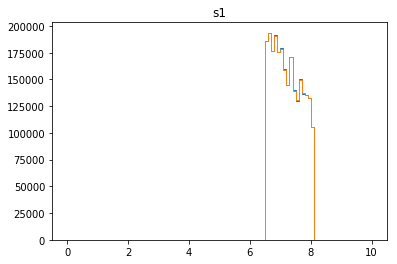

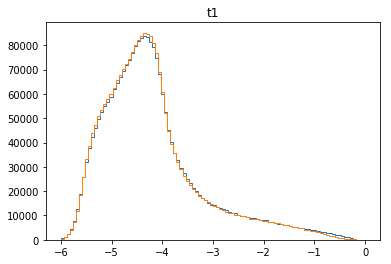

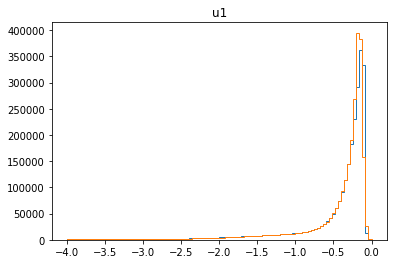

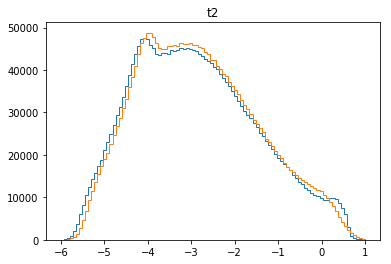

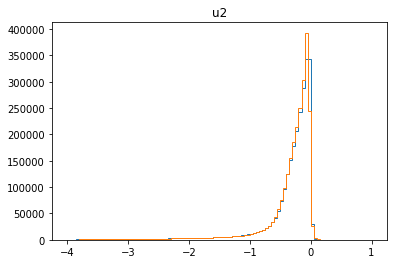

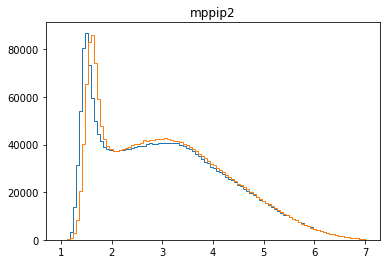

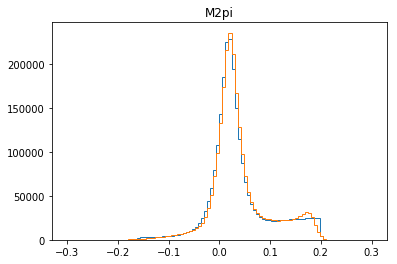

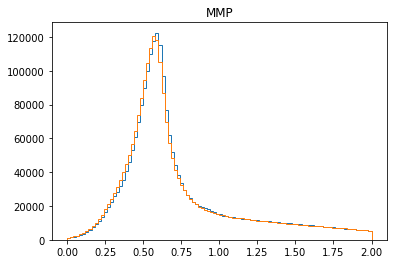

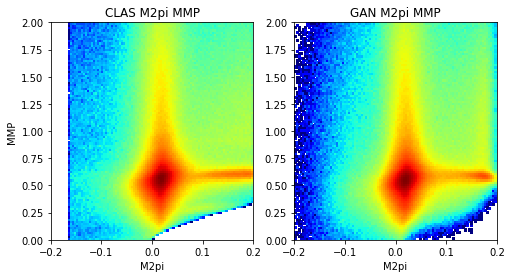

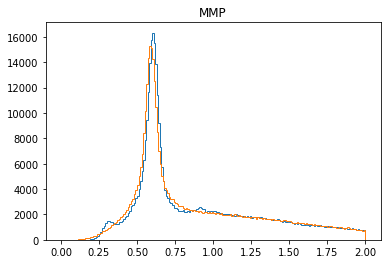

3401 [[-0.21562684, -0.21569091, 6.40823e-05], [-0.22895029, -0.22895223, 1.943994e-06], [-0.24867266, -0.25471732, 0.0060446505], [-0.24787319, -0.24827047, 0.0003972764], [-0.19258308, -0.19306229, 0.00047920016], [-0.13999449, -0.14011128, 0.00011679204], [-0.16539007, -0.16563177, 0.00024170292], [-0.21839173, -0.22020915, 0.0018174149], [-0.2789679, -0.28137204, 0.002404158], [-0.32004797, -0.32286218, 0.0028142058], [-0.36289144, -0.36461085, 0.001719409], [-0.31308222, -0.3131091, 2.687566e-05], [-0.2190502, -0.2190791, 2.891015e-05], [-0.16120586, -0.16379546, 0.0025895948], [-0.06109407, -0.061357412, 0.00026333894], [0.04720925, 0.047025084, 0.00018416623], [0.033695687, 0.032976314, 0.0007193734], [-0.04717576, -0.047198173, 2.241113e-05], [-0.1290434, -0.1293981, 0.00035468792], [-0.21362524, -0.21561588, 0.0019906498]]
3402 [[-0.3094849, -0.31366226, 0.0041773496], [-0.34355316, -0.34375012, 0.00019696077], [-0.31847972, -0.32262975, 0.0041500265], [-0.24642432, -0.2469547

3411 [[-0.48347592, -0.48603126, 0.0025553491], [-0.45173904, -0.4520553, 0.00031627485], [-0.3242831, -0.32466525, 0.0003821406], [-0.21250741, -0.21271545, 0.0002080336], [-0.07139588, -0.07327215, 0.001876266], [0.040841818, 0.040841702, 1.1656448e-07], [0.08087161, 0.080796465, 7.5149816e-05], [0.009779508, 0.008909876, 0.0008696317], [-0.13969481, -0.14042775, 0.00073294225], [-0.30172107, -0.30237138, 0.0006503138], [-0.43146944, -0.43192074, 0.0004513096], [-0.5509057, -0.55090964, 3.9575716e-06], [-0.5631986, -0.56475836, 0.0015597413], [-0.46985832, -0.47202387, 0.0021655522], [-0.3679909, -0.36826512, 0.00027422034], [-0.19910799, -0.20089237, 0.0017843908], [-0.08752373, -0.08755894, 3.5209527e-05], [-0.009584851, -0.01034847, 0.0007636196], [-0.07287221, -0.07341519, 0.00054298685], [-0.16366315, -0.16717912, 0.0035159744]]
3412 [[-0.25926948, -0.25967485, 0.00040537684], [-0.34634122, -0.34763908, 0.0012978727], [-0.38208285, -0.38458163, 0.0024987794], [-0.3744375, -0.375

3421 [[-0.21616098, -0.21625988, 9.890135e-05], [-0.3490576, -0.34918758, 0.00012996506], [-0.4358015, -0.43644637, 0.00064487755], [-0.40530622, -0.40544775, 0.00014151797], [-0.33164877, -0.33316898, 0.0015202217], [-0.20016508, -0.20184924, 0.0016841596], [-0.034096766, -0.0362289, 0.0021321313], [0.035639357, 0.03553577, 0.00010358379], [-0.013628804, -0.015941817, 0.0023130132], [-0.12074115, -0.12140683, 0.0006656764], [-0.26110923, -0.2615065, 0.0003972764], [-0.39376667, -0.39918628, 0.0054196003], [-0.49506736, -0.4960873, 0.0010199493], [-0.48855108, -0.49568477, 0.007133696], [-0.4287797, -0.42880315, 2.3452312e-05], [-0.3049319, -0.30651584, 0.0015839394], [-0.1976845, -0.19810295, 0.00041846075], [-0.14471188, -0.14472064, 8.762814e-06], [-0.15557039, -0.15557392, 3.5368284e-06], [-0.2369664, -0.23758785, 0.00062145735]]
3422 [[-0.35423994, -0.35424885, 8.898845e-06], [-0.43615305, -0.43615374, 6.947412e-07], [-0.46718934, -0.4677905, 0.00060117984], [-0.40168723, -0.40180

3431 [[-0.006327842, -0.0103143705, 0.0039865286], [-0.036442235, -0.03923846, 0.0027962239], [-0.096429504, -0.09643554, 6.035203e-06], [-0.24577026, -0.24609886, 0.00032860413], [-0.43192503, -0.43241212, 0.00048708185], [-0.5669944, -0.5670014, 6.9583225e-06], [-0.64971864, -0.65144503, 0.0017263762], [-0.6341949, -0.6343148, 0.00011986268], [-0.5373756, -0.53754747, 0.00017185132], [-0.3832419, -0.38334903, 0.00010714694], [-0.18396036, -0.19198401, 0.0080236485], [-0.04314876, -0.04340625, 0.00025749096], [-0.012071159, -0.015858404, 0.003787246], [-0.06986314, -0.06998138, 0.000118239404], [-0.20552, -0.20552568, 5.6752515e-06], [-0.31728902, -0.31851882, 0.0012298005], [-0.47608796, -0.47621426, 0.00012629485], [-0.57229906, -0.5733667, 0.001067642], [-0.5661587, -0.5672725, 0.001113749], [-0.5288338, -0.5288404, 6.6007824e-06]]
3432 [[-0.42097846, -0.42108652, 0.00010805708], [-0.24294278, -0.2434823, 0.00053952564], [-0.040465623, -0.042038955, 0.0015733298], [0.09320625, 0.09

3441 [[-0.34810394, -0.34877613, 0.00067218806], [-0.30258578, -0.30320296, 0.0006171854], [-0.21968935, -0.22050627, 0.000816909], [-0.08696707, -0.0876366, 0.0006695204], [0.014758144, 0.014757149, 9.950927e-07], [0.007760535, 0.0077504134, 1.0121672e-05], [-0.06561817, -0.065941885, 0.0003237128], [-0.1412685, -0.14227885, 0.0010103477], [-0.25951567, -0.26039806, 0.0008823897], [-0.29761827, -0.2993029, 0.0016846291], [-0.34225598, -0.3426635, 0.00040753023], [-0.26361316, -0.26401785, 0.00040468588], [-0.16216612, -0.16244817, 0.0002820453], [-0.14107268, -0.14164594, 0.0005732648], [-0.14606453, -0.14642477, 0.00036024142], [-0.19107212, -0.19126669, 0.00019455902], [-0.2739128, -0.27602735, 0.002114553], [-0.41823035, -0.42116854, 0.0029381758], [-0.48795944, -0.4880623, 0.000102847436], [-0.47418728, -0.47421297, 2.5682852e-05]]
3442 [[-0.37669194, -0.37909162, 0.0023996707], [-0.2464104, -0.24658205, 0.00017165132], [-0.12388572, -0.123983376, 9.765339e-05], [-0.05128738, -0.0

3451 [[-0.37129918, -0.3738278, 0.0025286153], [-0.23889367, -0.23949187, 0.0005981904], [-0.045847826, -0.046892162, 0.0010443374], [0.10426933, 0.104176484, 9.285106e-05], [0.17453083, 0.17409159, 0.00043923562], [0.09284102, 0.09024754, 0.0025934784], [-0.07777824, -0.07823777, 0.0004595317], [-0.25461325, -0.25461325, 6.148184e-10], [-0.42409617, -0.42444986, 0.00035368284], [-0.5594968, -0.5598708, 0.00037398172], [-0.6051917, -0.605724, 0.0005322844], [-0.58798665, -0.5881525, 0.00016590278], [-0.44702217, -0.44883034, 0.001808157], [-0.27906683, -0.27909505, 2.8216982e-05], [-0.090305015, -0.090417236, 0.00011222043], [0.08352999, 0.08244206, 0.0010879299], [0.17589779, 0.17577226, 0.00012552436], [0.17376076, 0.17375623, 4.5228267e-06], [0.06741571, 0.06482844, 0.002587266], [-0.09103776, -0.091378085, 0.00034032416]]
3452 [[-0.23613842, -0.23643994, 0.00030152593], [-0.33506802, -0.33522832, 0.00016030042], [-0.3570856, -0.35907504, 0.0019894587], [-0.3113227, -0.31136018, 3.7

3461 [[-0.025484446, -0.026423585, 0.00093913876], [-0.12714794, -0.12793086, 0.00078292546], [-0.18533656, -0.18541655, 7.998722e-05], [-0.21280034, -0.21312508, 0.00032474313], [-0.20665945, -0.20727588, 0.0006164275], [-0.18364808, -0.18647282, 0.0028247389], [-0.11156684, -0.111576416, 9.5711e-06], [-0.05198496, -0.05312612, 0.0011411596], [-0.011523033, -0.012255665, 0.00073263247], [-0.033245053, -0.033547044, 0.00030198976], [-0.12594424, -0.1259445, 2.4972542e-07], [-0.24139905, -0.24154708, 0.00014803532], [-0.38289955, -0.38295263, 5.3086842e-05], [-0.45453537, -0.45767498, 0.0031396053], [-0.48082322, -0.48113248, 0.00030925873], [-0.41245, -0.41245973, 9.748943e-06], [-0.2790566, -0.28075647, 0.001699851], [-0.09213558, -0.092416406, 0.0002808294], [0.0071921935, 0.0040255985, 0.0031665948], [0.061614506, 0.061399985, 0.00021452086]]
3462 [[0.06872489, 0.068322964, 0.00040192794], [-0.03409004, -0.034933545, 0.00084350747], [-0.17760955, -0.17805593, 0.00044637974], [-0.278

3471 [[0.03613333, 0.035935245, 0.00019808664], [0.031090863, 0.030946609, 0.00014425389], [-0.042551994, -0.04256225, 1.0255611e-05], [-0.12933365, -0.13127877, 0.0019451294], [-0.21039814, -0.21093607, 0.0005379319], [-0.23722771, -0.23787598, 0.0006482726], [-0.24599215, -0.24620456, 0.00021240294], [-0.2434682, -0.24353603, 6.7830566e-05], [-0.11616182, -0.11938318, 0.0032213542], [-0.033079877, -0.033196628, 0.00011675084], [0.010054072, 0.009788314, 0.0002657588], [0.04260053, 0.042390402, 0.00021012966], [-0.010252627, -0.01689131, 0.006638684], [-0.12070158, -0.121662945, 0.0009613633], [-0.19298318, -0.19414362, 0.001160441], [-0.29969668, -0.30171585, 0.0020191746], [-0.37822285, -0.38182348, 0.0036006228], [-0.36396015, -0.36459604, 0.00063589995], [-0.3468036, -0.34708926, 0.00028564438], [-0.26442236, -0.26442245, 8.6278305e-08]]
3472 [[-0.14777581, -0.14811826, 0.00034243858], [-0.025523074, -0.025722506, 0.00019943115], [-0.014771705, -0.015631577, 0.0008598722], [0.0001

3481 [[-0.17588852, -0.17600651, 0.000117990654], [-0.31415328, -0.32353976, 0.009386466], [-0.41938564, -0.4208282, 0.001442559], [-0.43661016, -0.43720827, 0.00059809716], [-0.44281507, -0.4453104, 0.0024953482], [-0.32039002, -0.32051978, 0.00012974773], [-0.15420325, -0.1545101, 0.00030684844], [-0.007711071, -0.009278959, 0.0015678876], [0.099562034, 0.099072255, 0.0004897797], [0.1252963, 0.12394764, 0.0013486587], [0.011197607, 0.010862121, 0.0003354857], [-0.08896301, -0.09455927, 0.005596255], [-0.24483113, -0.24601062, 0.0011794909], [-0.35994938, -0.3615764, 0.0016270418], [-0.41089985, -0.410944, 4.4158718e-05], [-0.4098706, -0.4104826, 0.0006119841], [-0.33352095, -0.33358526, 6.4326836e-05], [-0.21632488, -0.21647409, 0.00014919793], [-0.0965731, -0.09750419, 0.00093108974], [-0.018925754, -0.024433894, 0.0055081397]]
3482 [[0.033857003, 0.033240575, 0.0006164275], [0.0015837123, 0.0014606545, 0.00012305775], [-0.15420966, -0.1542282, 1.8532042e-05], [-0.33737558, -0.3374

3491 [[-0.3178658, -0.318751, 0.00088522513], [-0.2072143, -0.20998918, 0.002774882], [-0.072308905, -0.07322112, 0.0009122131], [-0.007381556, -0.007613398, 0.00023184218], [0.0302082, 0.029610382, 0.00059781724], [-0.01771479, -0.020754738, 0.0030399482], [-0.14207087, -0.1423722, 0.00030132724], [-0.3030102, -0.30406553, 0.0010553377], [-0.39811647, -0.39816537, 4.8919497e-05], [-0.48480713, -0.48481193, 4.794507e-06], [-0.4771714, -0.47757202, 0.0004006289], [-0.42592657, -0.42682788, 0.0009013006], [-0.32154426, -0.32156038, 1.6135295e-05], [-0.17473611, -0.17473982, 3.7111022e-06], [-0.041378144, -0.04209854, 0.0007203968], [0.056004703, 0.052151915, 0.0038527902], [0.056141146, 0.05561018, 0.000530965], [-0.0041182665, -0.0063801957, 0.002261929], [-0.10858006, -0.108606465, 2.640313e-05], [-0.20055513, -0.20112292, 0.0005677977]]
3492 [[-0.2661951, -0.26642802, 0.00023294707], [-0.31649294, -0.31904984, 0.0025568923], [-0.26006562, -0.2601655, 9.9890174e-05], [-0.1506962, -0.15

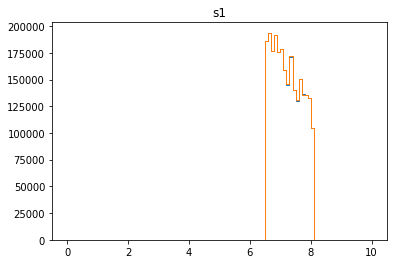

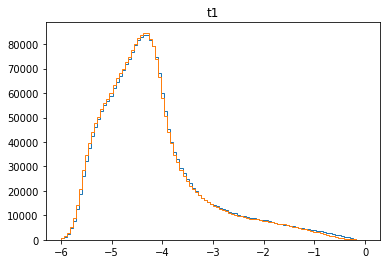

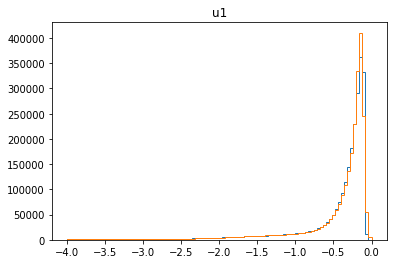

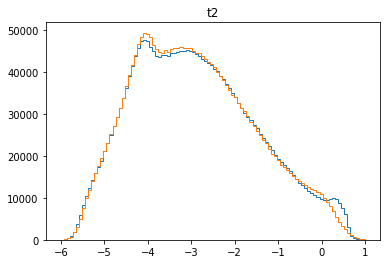

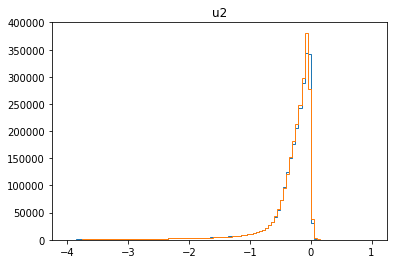

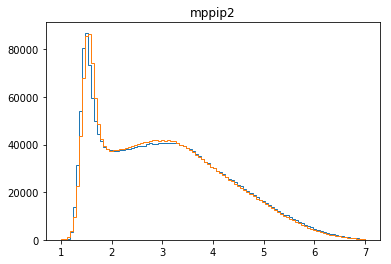

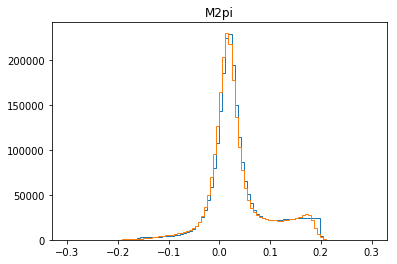

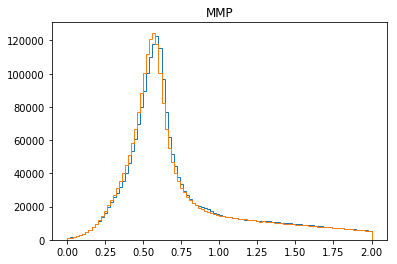

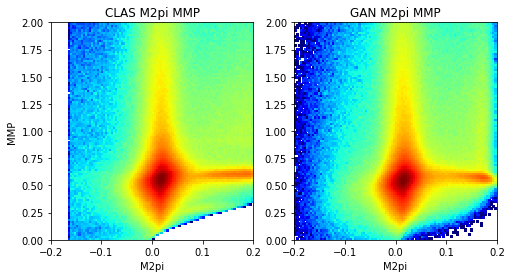

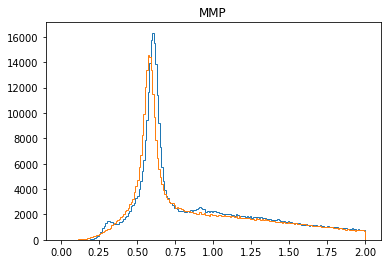

3501 [[-0.07239845, -0.0727977, 0.00039925575], [-0.20395441, -0.20631482, 0.0023604035], [-0.32311314, -0.32335985, 0.00024671032], [-0.40470418, -0.40497193, 0.00026775245], [-0.42073348, -0.42123926, 0.0005057798], [-0.3589325, -0.3654962, 0.006563679], [-0.216237, -0.21646814, 0.0002311457], [-0.077185445, -0.08164171, 0.0044562696], [-0.015882032, -0.016402502, 0.00052046933], [0.023476427, 0.019297106, 0.004179321], [0.025460977, 0.02511882, 0.00034215624], [-0.008705693, -0.0087721795, 6.648634e-05], [-0.0985505, -0.09920101, 0.0006505084], [-0.2146681, -0.21480799, 0.000139889], [-0.2949996, -0.29744658, 0.0024469928], [-0.3703654, -0.37348005, 0.003114647], [-0.409247, -0.40932813, 8.111705e-05], [-0.36261582, -0.36376938, 0.001153564], [-0.2502305, -0.25028962, 5.9113372e-05], [-0.11393786, -0.11415406, 0.00021620031]]
3502 [[0.057993583, 0.05797763, 1.595194e-05], [0.16462113, 0.16447495, 0.0001461846], [0.17106526, 0.17105804, 7.212162e-06], [0.062910266, 0.06290273, 7.5332

3511 [[-0.2554255, -0.256777, 0.0013514621], [-0.1280638, -0.12930177, 0.0012379743], [-0.035738446, -0.035816096, 7.765048e-05], [0.013824789, 0.013437035, 0.00038775397], [-0.04265456, -0.043023687, 0.0003691287], [-0.12968576, -0.1296951, 9.348184e-06], [-0.24698494, -0.24801111, 0.0010261722], [-0.37090707, -0.3719069, 0.000999826], [-0.42036018, -0.4203776, 1.7448112e-05], [-0.43800843, -0.43817487, 0.0001664437], [-0.36737797, -0.36762786, 0.0002498962], [-0.24110506, -0.2415496, 0.00044452798], [-0.098065086, -0.10033846, 0.0022733733], [0.027916597, 0.026202403, 0.0017141934], [0.083718315, 0.08357879, 0.00013952829], [-0.00962804, -0.010490935, 0.00086289516], [-0.09350438, -0.09393052, 0.0004261431], [-0.19967908, -0.20021118, 0.00053210836], [-0.2977843, -0.29846492, 0.000680621], [-0.32351974, -0.32353035, 1.0612945e-05]]
3512 [[-0.29714528, -0.29765698, 0.0005117167], [-0.21615826, -0.21731701, 0.0011587522], [-0.080080755, -0.082206726, 0.0021259708], [0.01890159, 0.01634

3521 [[0.09140398, 0.08238455, 0.009019434], [-0.035130262, -0.040377147, 0.0052468833], [-0.17381734, -0.17381781, 4.7148205e-07], [-0.2966994, -0.29699454, 0.00029513487], [-0.33031946, -0.3303664, 4.693889e-05], [-0.3024484, -0.30244982, 1.4347606e-06], [-0.22900507, -0.22903174, 2.6678259e-05], [-0.10152077, -0.10192033, 0.0003995607], [0.02181361, 0.020867914, 0.00094569667], [0.055261727, 0.0541234, 0.0011383264], [0.017814359, 0.017528715, 0.00028564438], [-0.10112302, -0.10270423, 0.001581208], [-0.24135952, -0.2421351, 0.00077557785], [-0.43742147, -0.43745077, 2.930117e-05], [-0.50210255, -0.5026786, 0.00057600805], [-0.5504671, -0.5506595, 0.00019238352], [-0.5303009, -0.5310594, 0.00075846293], [-0.42383432, -0.42428523, 0.00045090454], [-0.27220252, -0.27252105, 0.00031851762], [-0.099473126, -0.100601055, 0.0011279249]]
3522 [[0.043576665, 0.04327923, 0.00029743303], [0.12315992, 0.123052776, 0.00010714694], [0.11576791, 0.11522697, 0.00054094434], [0.037310928, 0.0372463

3531 [[-0.4851667, -0.48593307, 0.0007663628], [-0.4487242, -0.44874015, 1.5936708e-05], [-0.33935726, -0.34146672, 0.0021094691], [-0.212711, -0.21356218, 0.0008511693], [-0.11787292, -0.11789172, 1.8795721e-05], [-0.080772676, -0.081318066, 0.0005453896], [-0.10626411, -0.10729004, 0.0010259277], [-0.21593116, -0.21603934, 0.00010817605], [-0.32065532, -0.3209429, 0.00028758182], [-0.41739348, -0.4180263, 0.00063282537], [-0.43655282, -0.43682748, 0.00027466274], [-0.38818157, -0.38849244, 0.00031087085], [-0.33813068, -0.33838585, 0.0002551701], [-0.24613106, -0.24794507, 0.0018140014], [-0.12485573, -0.12538187, 0.00052614143], [-5.412851e-05, -0.00014990616, 9.577765e-05], [0.056758773, 0.056754496, 4.274829e-06], [-0.013946392, -0.020843657, 0.006897265], [-0.09456322, -0.09978499, 0.005221769], [-0.22240238, -0.22255869, 0.00015631676]]
3532 [[-0.33337978, -0.33345792, 7.8155506e-05], [-0.38907397, -0.39015585, 0.0010818987], [-0.41149813, -0.41172788, 0.00022975588], [-0.359881

3541 [[-0.33534476, -0.33551413, 0.00016936002], [-0.41810852, -0.42017302, 0.0020645082], [-0.43778935, -0.437878, 8.867198e-05], [-0.4207122, -0.42296126, 0.0022490658], [-0.39910057, -0.4005219, 0.0014213392], [-0.31434402, -0.3151164, 0.000772394], [-0.1830509, -0.18368267, 0.00063177024], [-0.046922278, -0.047993537, 0.0010712595], [0.034933735, 0.034825042, 0.00010869247], [0.06643642, 0.062472254, 0.00396416], [0.009271307, 0.009105699, 0.00016560809], [-0.07872848, -0.079974525, 0.0012460407], [-0.24988931, -0.24994482, 5.5504042e-05], [-0.30449468, -0.30450085, 6.1576466e-06], [-0.28878474, -0.28891036, 0.00012560988], [-0.27111897, -0.2711369, 1.7929415e-05], [-0.18185255, -0.18482162, 0.002969066], [-0.09526343, -0.09528249, 1.9061265e-05], [0.0039704014, 0.0019739603, 0.0019964408], [0.015770966, 0.015340638, 0.00043032694]]
3542 [[0.009411309, 0.0063799773, 0.0030313313], [-0.049401037, -0.04942565, 2.4611656e-05], [-0.15954195, -0.15981883, 0.0002768799], [-0.29197523, -0

3551 [[-0.094208755, -0.094423056, 0.00021429741], [-0.107765436, -0.10877155, 0.0010061081], [-0.14049792, -0.14059441, 9.64883e-05], [-0.17295367, -0.17326353, 0.0003098628], [-0.1639792, -0.17040822, 0.0064290124], [-0.12220563, -0.12332869, 0.001123062], [-0.066544764, -0.066939004, 0.00039424087], [-0.02542957, -0.0254608, 3.1231688e-05], [0.024639163, 0.022175726, 0.0024634374], [0.042114522, 0.041897144, 0.00021737981], [-0.02151322, -0.021890381, 0.00037716064], [-0.15035765, -0.15180674, 0.0014490859], [-0.26022854, -0.26255754, 0.0023290021], [-0.32622188, -0.32663265, 0.00041077097], [-0.3795632, -0.3812853, 0.0017220993], [-0.36003086, -0.3611262, 0.0010953658], [-0.32015118, -0.3221296, 0.0019784146], [-0.26629278, -0.26639828, 0.00010549494], [-0.21249127, -0.21311311, 0.00062183785], [-0.22487703, -0.22524837, 0.00037133074]]
3552 [[-0.21193454, -0.21196508, 3.0553216e-05], [-0.21988004, -0.2202699, 0.00038985998], [-0.26607338, -0.26665148, 0.0005781157], [-0.25063014, 

3561 [[-0.052314155, -0.053242452, 0.0009282982], [-0.14248846, -0.1428868, 0.00039834157], [-0.24876441, -0.25022835, 0.0014639358], [-0.36893076, -0.3690319, 0.00010115228], [-0.46038046, -0.46044278, 6.232337e-05], [-0.48177636, -0.48450822, 0.002731847], [-0.4718826, -0.47657442, 0.0046917987], [-0.35373577, -0.35375008, 1.42911595e-05], [-0.18373348, -0.18500496, 0.0012714845], [-0.040057667, -0.04055985, 0.00050218304], [0.103838675, 0.10348971, 0.00034896377], [0.15519638, 0.15469685, 0.00049953634], [0.076384, 0.07600743, 0.00037656815], [-0.041688975, -0.04368218, 0.001993204], [-0.18164176, -0.18241224, 0.00077048683], [-0.34841475, -0.34963802, 0.0012232543], [-0.45258987, -0.45299602, 0.00040614526], [-0.48562148, -0.48569897, 7.748248e-05], [-0.4261344, -0.42682934, 0.0006949269], [-0.2943315, -0.29478726, 0.0004557778]]
3562 [[-0.12045039, -0.120453104, 2.7157366e-06], [0.05263635, 0.051303893, 0.0013324571], [0.14966832, 0.14955375, 0.0001145765], [0.13813756, 0.13798556

3571 [[-0.18439724, -0.18448116, 8.3923835e-05], [-0.287555, -0.28758973, 3.4713303e-05], [-0.3593166, -0.36006585, 0.000749246], [-0.39237392, -0.3927118, 0.00033786552], [-0.35362095, -0.35813907, 0.004518107], [-0.27574417, -0.27584806, 0.00010389462], [-0.15712555, -0.1571273, 1.7622951e-06], [-0.02133011, -0.022906922, 0.0015768118], [0.018344937, 0.0182439, 0.00010103724], [0.005018284, 0.004990712, 2.7572274e-05], [-0.09803619, -0.09804502, 8.830699e-06], [-0.19902886, -0.19986089, 0.00083202444], [-0.24535239, -0.2453923, 3.990624e-05], [-0.24954315, -0.25215843, 0.0026152828], [-0.19983466, -0.20105098, 0.001216326], [-0.13784999, -0.13785471, 4.7279173e-06], [-0.048041284, -0.050017323, 0.0019760395], [-0.014424074, -0.014426969, 2.894609e-06], [-0.0075545125, -0.007843001, 0.00028848814], [-0.062697016, -0.06312119, 0.0004241767]]
3572 [[-0.13136342, -0.13226748, 0.0009040511], [-0.19622464, -0.19628373, 5.9084046e-05], [-0.17961024, -0.18287657, 0.0032663275], [-0.20970155,

3581 [[-0.26486245, -0.2651108, 0.0002483308], [-0.07888249, -0.07914023, 0.00025773584], [0.047649074, 0.04663921, 0.0010098628], [0.08266291, 0.082662866, 4.4823537e-08], [0.02627739, 0.024913417, 0.0013639717], [-0.09112678, -0.09173509, 0.0006083092], [-0.27228388, -0.27877298, 0.0064891027], [-0.42136705, -0.4216784, 0.0003113419], [-0.45961434, -0.45961434, 1.4901161e-08], [-0.41132346, -0.41272688, 0.0014034188], [-0.34518513, -0.34564254, 0.00045740808], [-0.23864543, -0.23888025, 0.00023481392], [-0.13168761, -0.13179179, 0.00010416697], [-0.063471854, -0.06347754, 5.6843423e-06], [-0.041265253, -0.041645903, 0.0003806506], [-0.13516837, -0.13567303, 0.0005046651], [-0.22250926, -0.23098995, 0.008480679], [-0.31159514, -0.31161085, 1.569398e-05], [-0.33434716, -0.33481023, 0.0004630548], [-0.35865465, -0.35877678, 0.00012212852]]
3582 [[-0.32515734, -0.32521835, 6.1005358e-05], [-0.19859764, -0.19865051, 5.286472e-05], [-0.040256873, -0.040891714, 0.00063484226], [0.0696586, 0

3591 [[-0.024916228, -0.024984121, 6.7893416e-05], [-0.12670384, -0.12697875, 0.00027491568], [-0.26738638, -0.26745015, 6.377729e-05], [-0.40048912, -0.40370637, 0.003217242], [-0.47367662, -0.47388372, 0.00020709932], [-0.45584399, -0.45660612, 0.0007621444], [-0.38624242, -0.38652614, 0.00028371345], [-0.23662181, -0.23662819, 6.3772895e-06], [-0.064659916, -0.065188244, 0.00052833126], [0.017996497, 0.017995687, 8.1048347e-07], [0.046555795, 0.04629812, 0.0002576746], [-0.04456451, -0.04478477, 0.00022025764], [-0.15738738, -0.15763354, 0.00024617137], [-0.26036823, -0.26047042, 0.00010219083], [-0.34122118, -0.34549972, 0.0042785485], [-0.39814454, -0.40581608, 0.0076715453], [-0.4153346, -0.41534546, 1.0837815e-05], [-0.31036663, -0.31039193, 2.5316856e-05], [-0.19187222, -0.19187583, 3.6016902e-06], [-0.03501183, -0.035414293, 0.0004024635]]
3592 [[0.08874987, 0.08862004, 0.00012983465], [0.08514683, 0.08493448, 0.00021234737], [0.029441874, 0.029075745, 0.0003661299], [-0.09331

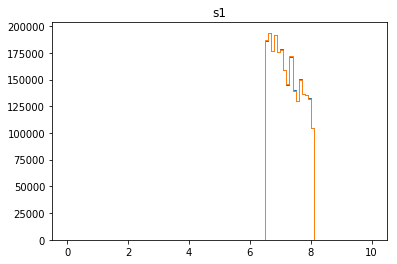

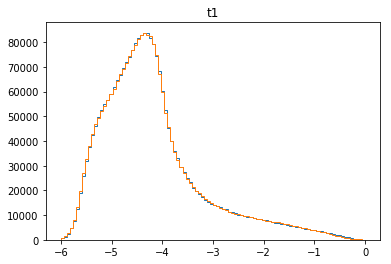

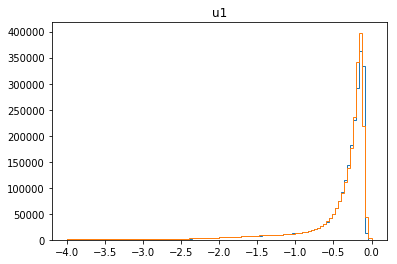

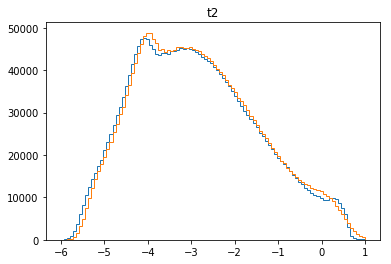

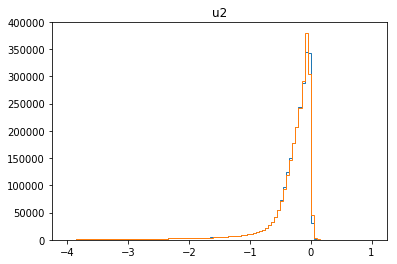

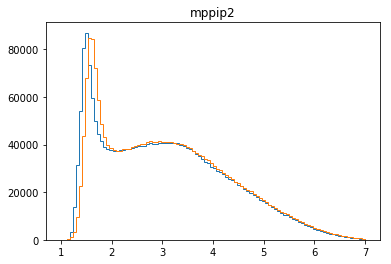

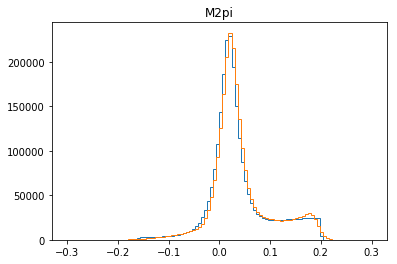

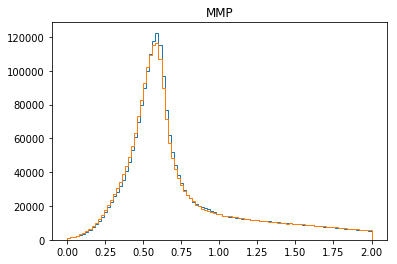

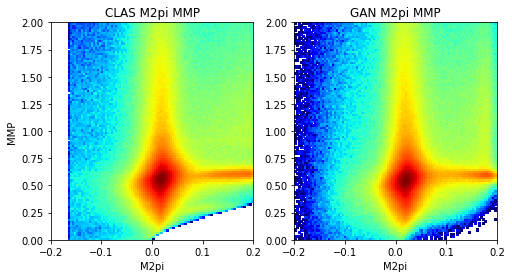

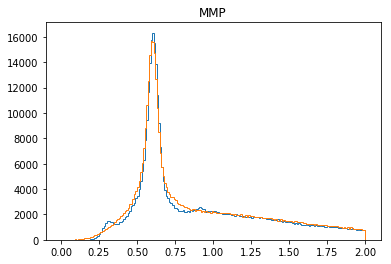

3601 [[-0.22356506, -0.22435108, 0.0007860239], [-0.18687366, -0.18769418, 0.00082051085], [-0.14694163, -0.14698094, 3.9306065e-05], [-0.16761144, -0.16819793, 0.00058649236], [-0.28162906, -0.28174904, 0.00011998799], [-0.38119167, -0.3812807, 8.903156e-05], [-0.49512482, -0.49515358, 2.8746297e-05], [-0.54327935, -0.5432958, 1.6458684e-05], [-0.49689344, -0.49718922, 0.00029579055], [-0.3674966, -0.36785758, 0.00036096576], [-0.20309775, -0.20588852, 0.00279078], [-0.06289972, -0.06355384, 0.00065411325], [0.042308845, 0.042304993, 3.852041e-06], [-0.0016364721, -0.0025021709, 0.0008656988], [-0.07957467, -0.08066877, 0.001094104], [-0.20017952, -0.20174092, 0.0015613989], [-0.2789745, -0.27940974, 0.00043524717], [-0.3706315, -0.37108725, 0.0004557778], [-0.36758533, -0.3676023, 1.6957641e-05], [-0.29268175, -0.29319337, 0.0005116304]]
3602 [[-0.15923223, -0.15955041, 0.0003181773], [0.01857628, 0.017997155, 0.000579125], [0.11826484, 0.11730182, 0.00096301985], [0.15615387, 0.1559

3611 [[-0.28460193, -0.28486317, 0.00026123846], [-0.19364724, -0.19590572, 0.0022584829], [-0.0694795, -0.07289911, 0.0034196065], [-0.004380809, -0.0069392445, 0.002558435], [-0.01786254, -0.019074878, 0.0012123385], [-0.098411374, -0.0993821, 0.00097073], [-0.22758211, -0.22897355, 0.0013914404], [-0.30902365, -0.30932888, 0.00030524682], [-0.36858368, -0.36894003, 0.00035634232], [-0.37557837, -0.3757116, 0.00013320312], [-0.2936796, -0.30240297, 0.008723382], [-0.2145608, -0.21545821, 0.00089741097], [-0.10552183, -0.10636922, 0.0008473894], [-0.062435806, -0.06273952, 0.0003037158], [-0.078377254, -0.07837726, 8.734787e-09], [-0.1920781, -0.19277555, 0.00069744315], [-0.3118133, -0.3131649, 0.0013516024], [-0.41536745, -0.4171696, 0.0018021603], [-0.44036025, -0.44165072, 0.0012904622], [-0.45212775, -0.45224723, 0.00011948708]]
3612 [[-0.33009744, -0.33010447, 7.0188294e-06], [-0.16570392, -0.168056, 0.0023520712], [-0.0063952887, -0.009934827, 0.003539538], [0.06479043, 0.06478

3621 [[-0.46823576, -0.46934468, 0.0011089166], [-0.34512037, -0.34598282, 0.00086244696], [-0.16131374, -0.16144142, 0.00012767043], [-0.037885178, -0.04006567, 0.0021804892], [0.00018353749, -0.001491086, 0.0016746235], [-0.032326244, -0.038109817, 0.0057835733], [-0.18483639, -0.18506852, 0.00023213265], [-0.34472984, -0.34474552, 1.5678874e-05], [-0.4235053, -0.42358112, 7.581265e-05], [-0.4514285, -0.45398772, 0.0025592074], [-0.42048728, -0.42243293, 0.0019456344], [-0.31846794, -0.320796, 0.0023280818], [-0.16898212, -0.169371, 0.00038888145], [-0.007900693, -0.010367919, 0.0024672253], [0.08888286, 0.086771645, 0.0021112212], [0.022157285, 0.019883184, 0.002274101], [-0.06741418, -0.06764829, 0.00023411296], [-0.18217114, -0.18660782, 0.0044366824], [-0.3199633, -0.32257605, 0.0026127468], [-0.42737323, -0.42758375, 0.00021051693]]
3622 [[-0.48999426, -0.49003077, 3.651157e-05], [-0.46823823, -0.46890077, 0.00066253054], [-0.38884243, -0.38887295, 3.0511059e-05], [-0.29803848, 

3631 [[0.1284715, 0.12827373, 0.00019776463], [0.13900113, 0.13887693, 0.00012420295], [0.082211755, 0.08220188, 9.868414e-06], [-0.06003394, -0.06090684, 0.000872897], [-0.22519785, -0.22553748, 0.00033962075], [-0.35048985, -0.35049024, 4.0099258e-07], [-0.47520936, -0.47840047, 0.0031911137], [-0.45819083, -0.459535, 0.0013441796], [-0.35074165, -0.3515183, 0.00077664055], [-0.19486381, -0.19508891, 0.00022509614], [-0.07704584, -0.078258045, 0.0012122056], [-0.031207386, -0.032310594, 0.0011032076], [-0.064309105, -0.06447891, 0.00016980711], [-0.19458322, -0.19493319, 0.00034996215], [-0.32264692, -0.327017, 0.0043701082], [-0.4413879, -0.44187784, 0.0004899486], [-0.5266784, -0.52820426, 0.0015258789], [-0.5575745, -0.5577355, 0.0001609773], [-0.49615386, -0.49716035, 0.0010064711], [-0.33424938, -0.33428323, 3.38423e-05]]
3632 [[-0.15597641, -0.15598713, 1.0712596e-05], [-0.0008112106, -0.00097623013, 0.00016501952], [0.1418083, 0.13740332, 0.004404978], [0.21218662, 0.21188164,

3641 [[-0.4491343, -0.4491367, 2.42237e-06], [-0.39431503, -0.39696476, 0.0026497294], [-0.24542901, -0.24715792, 0.0017289133], [-0.14321072, -0.14321676, 6.035203e-06], [-0.09986756, -0.10114504, 0.0012774767], [-0.07172475, -0.07303516, 0.0013104087], [-0.046176944, -0.046328105, 0.00015116135], [-0.121495694, -0.123299316, 0.0018036182], [-0.21864119, -0.2199534, 0.0013122048], [-0.30665272, -0.30739623, 0.0007435142], [-0.33242905, -0.3374418, 0.0050127506], [-0.34255144, -0.34339452, 0.0008430642], [-0.28231356, -0.28256178, 0.00024821056], [-0.20905858, -0.20907764, 1.9061265e-05], [-0.09748961, -0.098640196, 0.001150586], [-0.08710411, -0.08765423, 0.00055012136], [-0.07950544, -0.08035339, 0.0008479449], [-0.11439897, -0.11594804, 0.001549063], [-0.21482526, -0.2148599, 3.4645916e-05], [-0.3442985, -0.3443216, 2.310262e-05]]
3642 [[-0.38660628, -0.38662842, 2.2141065e-05], [-0.38989615, -0.38991985, 2.369308e-05], [-0.30096474, -0.30118245, 0.00021771737], [-0.1982577, -0.1983

3651 [[0.059245717, 0.058634866, 0.0006108521], [0.103931904, 0.101661436, 0.0022704639], [0.041518986, 0.04150913, 9.856434e-06], [-0.06792032, -0.06806715, 0.00014683105], [-0.17655891, -0.17726342, 0.000704513], [-0.27787453, -0.27787656, 2.030025e-06], [-0.27618635, -0.27644825, 0.0002619171], [-0.25208688, -0.2532084, 0.0011215283], [-0.16903317, -0.16917275, 0.00013957337], [-0.12826657, -0.12853815, 0.00027157366], [-0.08641147, -0.08762939, 0.0012179234], [-0.086585306, -0.08661326, 2.7954171e-05], [-0.17252211, -0.17253686, 1.4756355e-05], [-0.2931911, -0.2938997, 0.0007085689], [-0.39741686, -0.39741975, 2.9011028e-06], [-0.43336275, -0.43465048, 0.001287723], [-0.43452698, -0.4346342, 0.00010722593], [-0.32649818, -0.3276159, 0.001117699], [-0.19722308, -0.19722636, 3.2832759e-06], [-0.12659204, -0.12659709, 5.05694e-06]]
3652 [[-0.075852975, -0.07801445, 0.0021614707], [-0.007467931, -0.0076196557, 0.0001517247], [0.0032862315, 0.0031826089, 0.00010362262], [-0.00059681904,

3661 [[-0.39079213, -0.39166334, 0.0008712072], [-0.39366868, -0.39467758, 0.001008893], [-0.35780174, -0.35784912, 4.738424e-05], [-0.27453104, -0.2746094, 7.835799e-05], [-0.16281904, -0.16630207, 0.0034830277], [-0.031959157, -0.033363577, 0.0014044195], [-0.006829025, -0.0068290774, 5.2386895e-08], [-0.06720684, -0.067575306, 0.0003684694], [-0.2084102, -0.20970821, 0.0012980102], [-0.29429194, -0.29444984, 0.00015789462], [-0.3628154, -0.36300227, 0.00018686801], [-0.4678435, -0.46789235, 4.883949e-05], [-0.3803198, -0.3805083, 0.00018848806], [-0.3013009, -0.30213436, 0.0008334555], [-0.18206382, -0.18263179, 0.00056797947], [-0.101117805, -0.10210118, 0.0009833693], [-0.05922695, -0.059244208, 1.7257425e-05], [-0.044770863, -0.047520682, 0.0027498207], [-0.11320617, -0.114719115, 0.0015129424], [-0.13978612, -0.14003772, 0.0002515875]]
3662 [[-0.24872053, -0.24917981, 0.00045928644], [-0.371195, -0.3711958, 8.1048347e-07], [-0.39349964, -0.39366165, 0.00016199531], [-0.34875438,

3671 [[-0.1655379, -0.16576621, 0.00022831261], [-0.07500561, -0.07526206, 0.00025645134], [-0.043280073, -0.044400197, 0.0011201235], [-0.05603162, -0.057444487, 0.0014128669], [-0.08552388, -0.08619943, 0.00067555497], [-0.20823316, -0.20837504, 0.00014188126], [-0.2586308, -0.259559, 0.0009281821], [-0.2611934, -0.2629564, 0.0017630233], [-0.25041485, -0.25124744, 0.0008325747], [-0.27416167, -0.27958772, 0.005426062], [-0.18957876, -0.19323498, 0.0036562304], [-0.1422703, -0.14316234, 0.00089204806], [-0.08341303, -0.08483854, 0.001425513], [-0.09625108, -0.096700765, 0.00044969033], [-0.22277722, -0.22284749, 7.0271286e-05], [-0.35720322, -0.3572111, 7.893428e-06], [-0.41982853, -0.42331788, 0.0034893348], [-0.41401365, -0.41401863, 4.9715204e-06], [-0.35915792, -0.36199057, 0.0028326511], [-0.26315427, -0.26414987, 0.0009956089]]
3672 [[-0.11568532, -0.116507694, 0.0008223696], [0.0021069772, 0.0012496759, 0.0008573014], [0.040163532, 0.040162887, 6.44799e-07], [0.055246484, 0.05

3681 [[-0.3490815, -0.34953752, 0.0004560221], [-0.42638034, -0.4266395, 0.00025914633], [-0.46711272, -0.46804813, 0.00093540177], [-0.42875752, -0.4292863, 0.0005287698], [-0.29125792, -0.2913534, 9.547922e-05], [-0.16553096, -0.16605449, 0.00052351976], [-0.011273021, -0.011630877, 0.00035785604], [0.0999478, 0.0989798, 0.0009679982], [0.15156472, 0.1447029, 0.006861828], [0.07689143, 0.07068316, 0.00620827], [-0.03354935, -0.033550147, 7.9680467e-07], [-0.17924187, -0.18496236, 0.005720502], [-0.286156, -0.28765666, 0.0015006519], [-0.3512078, -0.3522162, 0.0010084085], [-0.36231536, -0.36231536, 5.820766e-11], [-0.30640233, -0.3064537, 5.1377585e-05], [-0.2599504, -0.26219296, 0.0022425577], [-0.19796927, -0.19802532, 5.6045334e-05], [-0.1282041, -0.12836519, 0.00016107412], [-0.13968214, -0.14111155, 0.0014294044]]
3682 [[-0.20982347, -0.21001212, 0.00018864521], [-0.27706838, -0.27707276, 4.3699984e-06], [-0.33575666, -0.33579603, 3.937785e-05], [-0.38506666, -0.38510302, 3.6373

3691 [[-0.3371555, -0.33715722, 1.7420971e-06], [-0.24460833, -0.24541362, 0.00080528436], [-0.11705562, -0.11722344, 0.00016782456], [0.03836057, 0.03792397, 0.00043660117], [0.09344601, 0.09310667, 0.0003393396], [0.067249484, 0.066682324, 0.00056716154], [-0.010816185, -0.013052605, 0.0022364198], [-0.099264815, -0.099334, 6.918826e-05], [-0.19675362, -0.19682011, 6.648634e-05], [-0.26863053, -0.26909333, 0.00046280856], [-0.25890595, -0.25979766, 0.00089170615], [-0.256602, -0.2572949, 0.0006929171], [-0.2541853, -0.25536427, 0.001178967], [-0.23872845, -0.23947811, 0.00074966386], [-0.15633354, -0.1563622, 2.8664539e-05], [-0.1287424, -0.1290346, 0.00029219314], [-0.15057263, -0.1508499, 0.00027726093], [-0.21928442, -0.21960539, 0.0003209732], [-0.30268148, -0.30340034, 0.0007188619], [-0.4044934, -0.4047146, 0.00022122113]]
3692 [[-0.4265919, -0.4266001, 8.207295e-06], [-0.4151345, -0.4152662, 0.00013171043], [-0.28533182, -0.2860346, 0.0007027928], [-0.15396117, -0.15405339, 9.

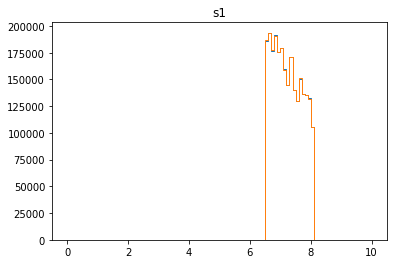

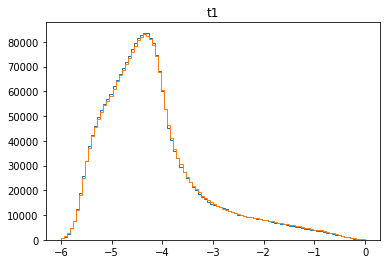

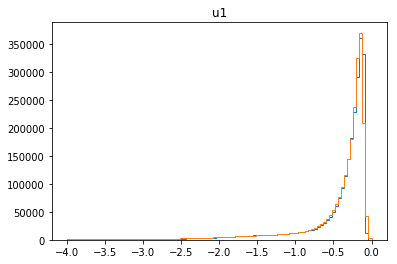

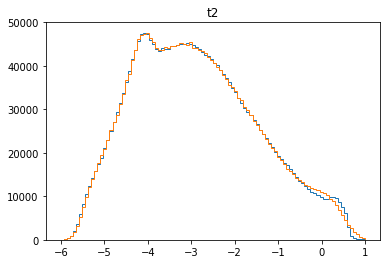

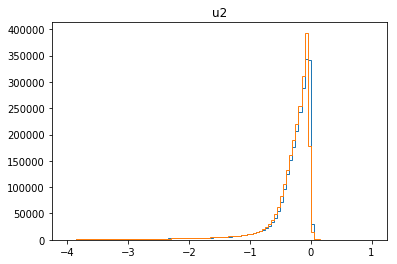

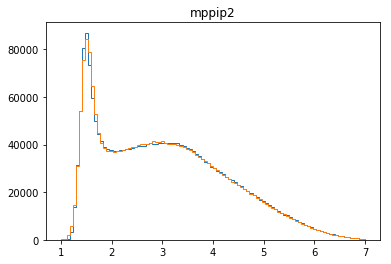

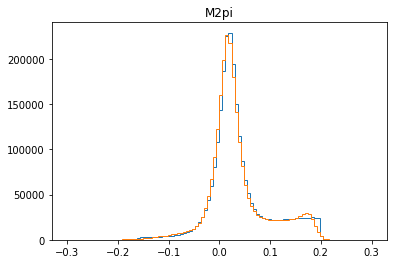

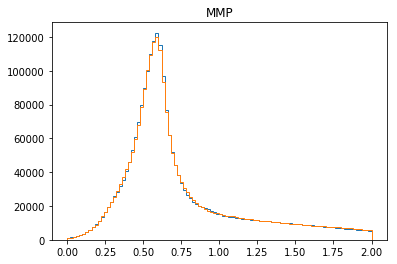

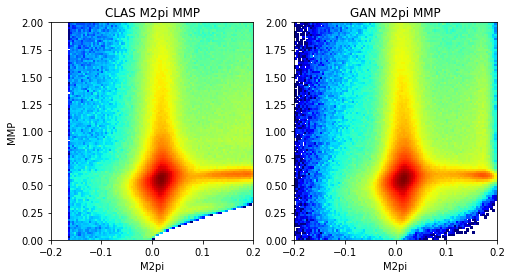

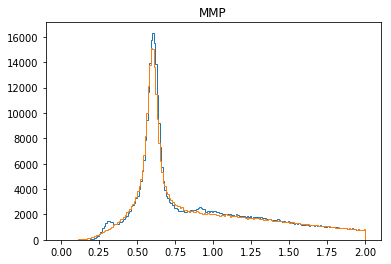

3701 [[-0.31128427, -0.31129286, 8.594248e-06], [-0.14590365, -0.14704777, 0.0011441254], [0.036848657, 0.03575392, 0.0010947349], [0.1510017, 0.14834824, 0.0026534619], [0.118407466, 0.11838198, 2.5489891e-05], [0.046227343, 0.04455693, 0.0016704114], [-0.061739124, -0.0628558, 0.0011166792], [-0.2623825, -0.2626257, 0.00024318788], [-0.36448708, -0.36597726, 0.0014901784], [-0.40077338, -0.4013632, 0.000589823], [-0.29564512, -0.29597914, 0.00033402006], [-0.19540215, -0.19636056, 0.0009584087], [-0.04889921, -0.050163362, 0.00126415], [0.07697002, 0.076720245, 0.0002497756], [0.07668424, 0.07348298, 0.00320125], [0.017397143, 0.016891707, 0.0005054367], [-0.09472306, -0.094942525, 0.00021946573], [-0.20443694, -0.20467399, 0.00023704045], [-0.32974985, -0.3298814, 0.00013153536], [-0.4341493, -0.43422207, 7.278768e-05]]
3702 [[-0.49340904, -0.49706873, 0.0036596903], [-0.501019, -0.5015667, 0.00054770824], [-0.41240135, -0.41240472, 3.3597498e-06], [-0.290035, -0.2900737, 3.8686714e

3711 [[-0.06610571, -0.066188, 8.22894e-05], [-0.14047164, -0.14055218, 8.0534024e-05], [-0.25113675, -0.25119114, 5.44012e-05], [-0.3658331, -0.36606756, 0.0002344633], [-0.40291917, -0.40669376, 0.0037745796], [-0.4454459, -0.4454864, 4.0486688e-05], [-0.4132606, -0.41926765, 0.006007042], [-0.35963085, -0.35982722, 0.0001963723], [-0.3207037, -0.3207432, 3.9521605e-05], [-0.16699055, -0.16817857, 0.0011880223], [-0.06600238, -0.06690907, 0.0009066911], [0.05159919, 0.051444396, 0.00015479428], [0.14530677, 0.1450061, 0.00030066542], [0.16232215, 0.16212448, 0.00019765734], [0.087493785, 0.08749198, 1.8030405e-06], [-0.046116043, -0.047446553, 0.0013305084], [-0.13371412, -0.13551791, 0.0018037802], [-0.19216648, -0.19568811, 0.0035216312], [-0.21739863, -0.22248076, 0.0050821304], [-0.22421491, -0.2242948, 7.98849e-05]]
3712 [[-0.1835205, -0.18799971, 0.0044792173], [-0.15949953, -0.1595979, 9.837095e-05], [-0.115512565, -0.11563946, 0.00012689574], [-0.12959798, -0.12966353, 6.5556

3721 [[-0.34673104, -0.3473191, 0.000588064], [-0.3366063, -0.34256113, 0.005954825], [-0.29095367, -0.29112086, 0.00016718272], [-0.1474037, -0.1474348, 3.1103904e-05], [0.0048527992, 0.004808132, 4.4667166e-05], [0.11430395, 0.1132606, 0.0010433514], [0.109840244, 0.10977717, 6.3078536e-05], [0.014701432, 0.01467796, 2.3470784e-05], [-0.15028568, -0.15166391, 0.0013782383], [-0.28943458, -0.2894494, 1.4815028e-05], [-0.4654424, -0.46677178, 0.0013293955], [-0.55526906, -0.5553194, 5.0370876e-05], [-0.5008154, -0.50170416, 0.0008887469], [-0.3941602, -0.39457402, 0.00041379186], [-0.20853215, -0.20876192, 0.00022975588], [-0.018933782, -0.019094566, 0.00016078376], [0.08155913, 0.08142149, 0.00013764219], [0.14491229, 0.14310072, 0.0018115652], [0.083379194, 0.08299069, 0.00038850537], [-0.013952272, -0.014139923, 0.00018765104]]
3722 [[-0.20210488, -0.20360848, 0.001503609], [-0.32386377, -0.32458827, 0.0007244982], [-0.38706005, -0.38762477, 0.0005647114], [-0.42103457, -0.4234406, 

3731 [[-0.107535034, -0.11312245, 0.0055874125], [-0.18327382, -0.18344894, 0.00017511718], [-0.22180645, -0.22241768, 0.0006112294], [-0.21456076, -0.21456079, 3.6379788e-08], [-0.21174572, -0.21251632, 0.0007705928], [-0.16663305, -0.16665712, 2.40659e-05], [-0.14286332, -0.14817978, 0.0053164694], [-0.061104435, -0.061546955, 0.0004425195], [-0.022214318, -0.024190526, 0.0019762092], [-0.06778553, -0.06779106, 5.5307796e-06], [-0.1740208, -0.17635791, 0.0023371093], [-0.21886823, -0.21955453, 0.0006863055], [-0.2874872, -0.28755364, 6.642414e-05], [-0.32957593, -0.33071503, 0.0011390987], [-0.26416966, -0.26482204, 0.0006523582], [-0.20867859, -0.21472679, 0.0060482076], [-0.09179626, -0.09436725, 0.0025709928], [-0.045459636, -0.046047606, 0.00058797153], [-0.035448186, -0.03545008, 1.8911707e-06], [-0.11450162, -0.11458596, 8.434371e-05]]
3732 [[-0.2565981, -0.25839993, 0.0018018363], [-0.38818353, -0.39005005, 0.0018665298], [-0.41687685, -0.41691348, 3.6626916e-05], [-0.40117183

3741 [[-0.10440286, -0.10461454, 0.00021168085], [-0.03763823, -0.041717295, 0.004079066], [-0.05591318, -0.056194905, 0.00028172508], [-0.132635, -0.1326847, 4.9696308e-05], [-0.24344768, -0.24346599, 1.8319173e-05], [-0.36932454, -0.3712911, 0.001966555], [-0.39360583, -0.3937361, 0.00013026968], [-0.3906707, -0.3914235, 0.0007528005], [-0.33836168, -0.338786, 0.00042433385], [-0.22304039, -0.22307743, 3.704365e-05], [-0.09689901, -0.09692693, 2.791385e-05], [0.056538437, 0.056468993, 6.944232e-05], [0.15274595, 0.14887443, 0.0038715184], [0.10433419, 0.10433102, 3.1736126e-06], [-0.025833685, -0.027040849, 0.0012071637], [-0.15711434, -0.15823625, 0.0011219117], [-0.29493687, -0.29502633, 8.946401e-05], [-0.38428923, -0.38437825, 8.903156e-05], [-0.37604582, -0.37605128, 5.4503325e-06], [-0.32915485, -0.32923397, 7.9136575e-05]]
3742 [[-0.21578193, -0.2159504, 0.00016846758], [-0.054009553, -0.05409029, 8.073955e-05], [0.079310074, 0.078166336, 0.0011437382], [0.102308065, 0.1023050

3751 [[-0.28949222, -0.29543734, 0.005945114], [-0.2718824, -0.27283505, 0.0009526306], [-0.25458863, -0.25492, 0.000331376], [-0.18638371, -0.1864576, 7.389844e-05], [-0.12778226, -0.12838316, 0.0006008992], [-0.1048185, -0.10526601, 0.00044750882], [-0.04908098, -0.050145008, 0.0010640303], [-0.10669506, -0.1066968, 1.7370658e-06], [-0.20087238, -0.20094474, 7.236523e-05], [-0.2528924, -0.25304183, 0.00014943101], [-0.31975684, -0.3202713, 0.0005144818], [-0.3662558, -0.36735913, 0.0011033342], [-0.35897303, -0.35967684, 0.0007038045], [-0.23945096, -0.23955062, 9.966153e-05], [-0.08167613, -0.08173894, 6.2806146e-05], [0.029488508, 0.029082978, 0.00040553045], [0.075542465, 0.07381339, 0.0017290717], [0.027924098, 0.024021663, 0.003902436], [-0.075082146, -0.07666032, 0.0015781756], [-0.21010494, -0.21143824, 0.0013332927]]
3752 [[-0.33402413, -0.33720234, 0.0031781972], [-0.3814754, -0.3836174, 0.002142006], [-0.38508913, -0.38510987, 2.0728367e-05], [-0.24208955, -0.24536788, 0.00

3761 [[-0.054562885, -0.066560015, 0.011997129], [-0.14866269, -0.14958218, 0.00091948605], [-0.22902103, -0.22947559, 0.00045455707], [-0.31206656, -0.31577232, 0.0037057577], [-0.41133767, -0.41139144, 5.3755997e-05], [-0.4285677, -0.42863542, 6.770495e-05], [-0.41273096, -0.4128663, 0.00013532482], [-0.34297982, -0.34307653, 9.6713266e-05], [-0.18264908, -0.18288355, 0.0002344633], [-0.09699251, -0.097388186, 0.0003956813], [-0.032882217, -0.034359757, 0.0014775409], [0.0039220396, 0.0038418132, 8.022622e-05], [-0.100396834, -0.10057241, 0.00017557184], [-0.21449852, -0.21474487, 0.00024635097], [-0.29660666, -0.29730037, 0.0006937205], [-0.2801514, -0.2851836, 0.0050322157], [-0.2511687, -0.25118083, 1.2116742e-05], [-0.16753368, -0.16753572, 2.0354637e-06], [-0.049174458, -0.052477077, 0.0033026186], [0.0031663033, 0.0030944888, 7.18146e-05]]
3762 [[0.0051581655, 0.0048235874, 0.00033457796], [-0.025555218, -0.029291926, 0.0037367076], [-0.13195653, -0.13204066, 8.413365e-05], [-0

3771 [[-0.24393891, -0.24494067, 0.0010017569], [-0.14293012, -0.14313188, 0.00020175433], [-0.0704783, -0.07155581, 0.0010775116], [-0.0488831, -0.049141325, 0.000258226], [-0.1043642, -0.10443044, 6.623773e-05], [-0.13449529, -0.13458203, 8.674284e-05], [-0.18479899, -0.18572554, 0.00092655566], [-0.24654713, -0.24708879, 0.00054165436], [-0.25409475, -0.25543612, 0.0013413839], [-0.21279718, -0.21399812, 0.0012009426], [-0.14424597, -0.14524314, 0.000997174], [-0.057333738, -0.057742655, 0.00040891758], [0.024348324, 0.022639023, 0.0017093007], [0.029079221, 0.028553167, 0.0005260539], [-0.029184096, -0.029992305, 0.0008082098], [-0.11333677, -0.113365375, 2.8603303e-05], [-0.16563271, -0.16567905, 4.6339705e-05], [-0.1865968, -0.18661833, 2.1534974e-05], [-0.16879365, -0.1690321, 0.00023845212], [-0.12122963, -0.121239744, 1.010954e-05]]
3772 [[-0.122225404, -0.12252985, 0.00030444755], [-0.059081692, -0.05928361, 0.00020191693], [-0.092684895, -0.09276931, 8.44138e-05], [-0.171950

3781 [[0.030077295, 0.029632848, 0.0004444476], [-0.10770604, -0.107867405, 0.00016136473], [-0.22955766, -0.22959876, 4.109578e-05], [-0.34891963, -0.34895948, 3.9833983e-05], [-0.3880487, -0.38805574, 7.0289384e-06], [-0.3725053, -0.37655494, 0.004049639], [-0.3502948, -0.3507107, 0.00041588958], [-0.28527337, -0.28536496, 9.156897e-05], [-0.23986053, -0.24001996, 0.00015943225], [-0.18099043, -0.18187508, 0.0008846577], [-0.16936012, -0.17004143, 0.0006813178], [-0.186125, -0.18739335, 0.0012683581], [-0.23825133, -0.239337, 0.0010856661], [-0.28070387, -0.28294137, 0.0022375025], [-0.37001884, -0.3719047, 0.0018858623], [-0.3642171, -0.3643671, 0.00014999112], [-0.37239867, -0.37256902, 0.00017035435], [-0.29226032, -0.2931442, 0.0008838636], [-0.1256996, -0.12599578, 0.00029618433], [-0.057537537, -0.061460257, 0.0039227186]]
3782 [[0.013782898, 0.013744306, 3.8591857e-05], [-0.005619748, -0.005629284, 9.535729e-06], [-0.042814065, -0.0438605, 0.001046434], [-0.06462836, -0.064886

3791 [[-0.31183666, -0.312032, 0.00019535796], [-0.1762408, -0.1767465, 0.0005056939], [-0.021332439, -0.021908265, 0.000575825], [0.0605876, 0.05989388, 0.0006937205], [0.12155169, 0.12128544, 0.00026625645], [0.10384162, 0.10259625, 0.0012453676], [0.006344573, 0.0059049376, 0.0004396354], [-0.11268556, -0.113050304, 0.00036474434], [-0.18089628, -0.18177958, 0.00088329666], [-0.26108435, -0.26128078, 0.00019642575], [-0.3028727, -0.3028738, 1.1004886e-06], [-0.2685118, -0.26875827, 0.00024647074], [-0.22495852, -0.2249675, 8.967254e-06], [-0.11984426, -0.12033598, 0.00049172336], [-0.034845494, -0.035175897, 0.0003304045], [0.05585922, 0.055854212, 5.005601e-06], [0.027805844, 0.027755013, 5.0832183e-05], [-0.029186634, -0.031233674, 0.0020470393], [-0.13759479, -0.1378142, 0.00021940922], [-0.27908134, -0.27967757, 0.0005962327]]
3792 [[-0.38503978, -0.38638997, 0.0013502004], [-0.40914008, -0.41111663, 0.0019765485], [-0.38438728, -0.38478455, 0.0003972764], [-0.28118473, -0.28171

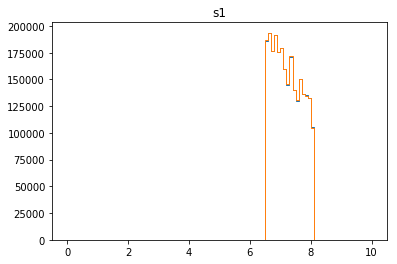

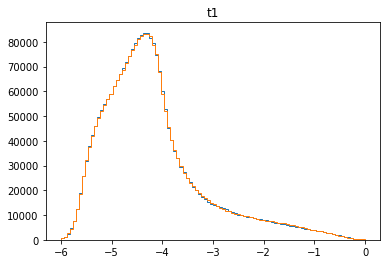

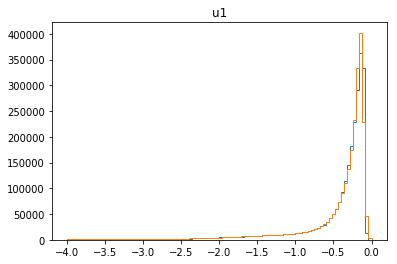

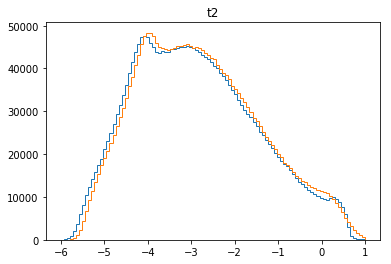

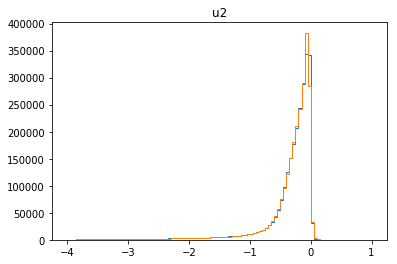

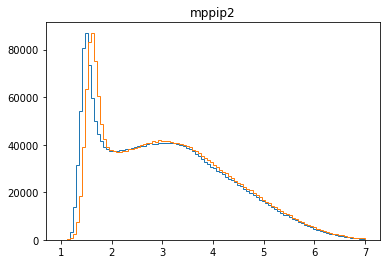

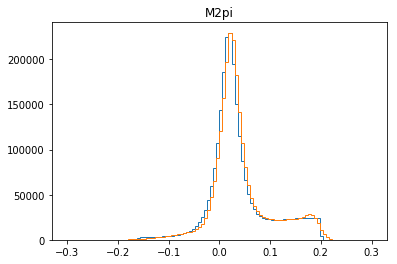

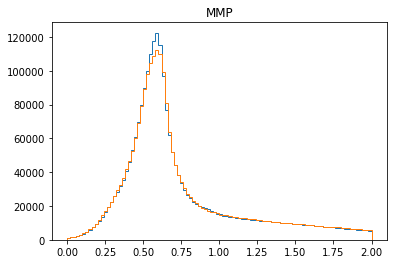

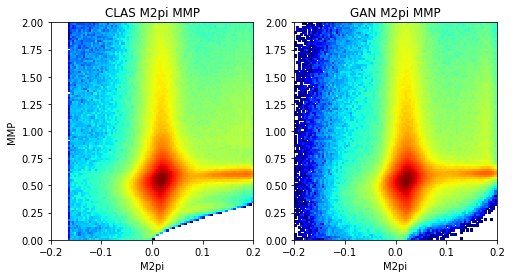

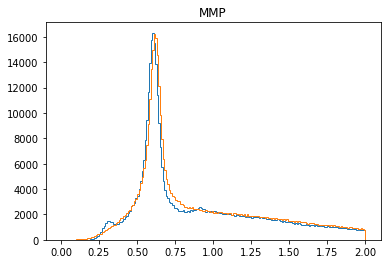

3801 [[0.10170818, 0.099970214, 0.0017379659], [0.16992244, 0.16907182, 0.00085061294], [0.14376299, 0.14211202, 0.0016509796], [0.054354668, 0.053660043, 0.0006946252], [-0.11036447, -0.11045433, 8.986137e-05], [-0.30391398, -0.3040784, 0.00016443201], [-0.42398292, -0.42399356, 1.0625375e-05], [-0.48361444, -0.4901732, 0.0065587363], [-0.4862475, -0.4863769, 0.00012940036], [-0.4345244, -0.4371167, 0.002592313], [-0.30942866, -0.3101823, 0.00075363804], [-0.16873814, -0.16998674, 0.0012486004], [-0.013200569, -0.014043965, 0.0008433965], [0.026568815, 0.021492938, 0.0050758775], [0.090283774, 0.09026526, 1.8515624e-05], [0.106773846, 0.1063726, 0.00040123996], [0.08953055, 0.08950326, 2.7292559e-05], [0.04065655, 0.034954213, 0.0057023405], [-0.011874982, -0.012416903, 0.0005419207], [-0.096694626, -0.09845957, 0.001764946]]
3802 [[-0.12531336, -0.1256697, 0.00035634232], [-0.1502039, -0.15021616, 1.2263248e-05], [-0.12293253, -0.12295747, 2.493443e-05], [-0.049426008, -0.050200205, 

3811 [[-0.039302867, -0.039488435, 0.00018556662], [-0.0779114, -0.077922575, 1.1179542e-05], [-0.07054868, -0.07061143, 6.2745705e-05], [-0.070031725, -0.07020927, 0.00017754865], [-0.07408414, -0.07564795, 0.0015638117], [-0.112951316, -0.11352641, 0.00057509297], [-0.117776245, -0.12020215, 0.002425904], [-0.11948329, -0.11949935, 1.6058768e-05], [-0.09022642, -0.09052372, 0.00029730145], [-0.051460113, -0.05248177, 0.0010216555], [-0.054106705, -0.054443378, 0.00033667462], [-0.10478192, -0.10599439, 0.0012124713], [-0.1742975, -0.17501697, 0.00071947573], [-0.2274247, -0.22802223, 0.0005975375], [-0.27880415, -0.27907085, 0.0002666923], [-0.27694127, -0.27826816, 0.0013268932], [-0.2280831, -0.22826086, 0.00017775202], [-0.20107745, -0.2019224, 0.0008449483], [-0.13037047, -0.13192765, 0.0015571814], [-0.08118679, -0.082811825, 0.0016250423]]
3812 [[-0.0445345, -0.044613164, 7.866219e-05], [-0.05698685, -0.057000782, 1.3932909e-05], [-0.088230334, -0.088301085, 7.075177e-05], [-0.

3821 [[-0.26234657, -0.26234937, 2.8044597e-06], [-0.25952622, -0.25952908, 2.875171e-06], [-0.26195902, -0.26289758, 0.0009385543], [-0.21189779, -0.2126189, 0.00072111376], [-0.16050497, -0.16107705, 0.000572078], [-0.14343418, -0.14345685, 2.2664666e-05], [-0.07302291, -0.07684616, 0.0038232491], [-0.025722353, -0.028122772, 0.0024004183], [-0.010637036, -0.010915377, 0.00027834176], [-0.056710836, -0.058928173, 0.0022173387], [-0.10010873, -0.10163133, 0.0015226024], [-0.12595658, -0.12615682, 0.00020024001], [-0.14327696, -0.14334545, 6.849194e-05], [-0.13112643, -0.13137417, 0.00024772997], [-0.1174774, -0.11771521, 0.00023780453], [-0.15790991, -0.15846461, 0.0005546939], [-0.1766076, -0.17673962, 0.00013201707], [-0.18023056, -0.18050636, 0.0002758019], [-0.2013787, -0.20160168, 0.00022298348], [-0.1917741, -0.19177413, 3.493915e-08]]
3822 [[-0.2517353, -0.25173742, 2.1012966e-06], [-0.31106964, -0.31125453, 0.0001848917], [-0.38159454, -0.382034, 0.00043947538], [-0.34029406, 

3831 [[-0.03525214, -0.038318437, 0.0030662962], [-0.15872094, -0.1597061, 0.0009851643], [-0.2923204, -0.2930085, 0.00068810553], [-0.39724767, -0.39754122, 0.00029356408], [-0.38669163, -0.38734993, 0.0006583152], [-0.36297768, -0.36442766, 0.0014499575], [-0.28859565, -0.2889439, 0.00034825157], [-0.19930379, -0.19954118, 0.000237393], [-0.13822475, -0.13880095, 0.0005761913], [-0.09889106, -0.099320985, 0.0004299314], [-0.11503391, -0.11509133, 5.7424506e-05], [-0.14045425, -0.14376894, 0.0033146865], [-0.12326885, -0.12477187, 0.0015030174], [-0.09929646, -0.09972418, 0.00042771953], [-0.033712648, -0.035897594, 0.0021849447], [-0.065329865, -0.06542426, 9.440132e-05], [-0.0973359, -0.09893384, 0.0015979375], [-0.1090786, -0.109407, 0.0003283967], [-0.17008735, -0.17145471, 0.0013673553], [-0.15731335, -0.15789606, 0.00058271084]]
3832 [[-0.11463268, -0.114821434, 0.00018875003], [-0.18590043, -0.18591309, 1.2653709e-05], [-0.19953653, -0.2002371, 0.0007005697], [-0.27858287, -0.2

3841 [[-0.2987912, -0.29903066, 0.00023945454], [-0.48743197, -0.4885272, 0.0010952398], [-0.60593325, -0.606575, 0.0006417813], [-0.5631997, -0.56371975, 0.0005200343], [-0.423661, -0.42378536, 0.00012437308], [-0.16303016, -0.16553314, 0.0025029765], [0.105242595, 0.10350844, 0.0017341512], [0.2395319, 0.23684928, 0.002682624], [0.24946219, 0.24870792, 0.0007542664], [0.14641084, 0.14602885, 0.0003819914], [-0.025081562, -0.025228994, 0.00014743257], [-0.20193794, -0.20204687, 0.00010893121], [-0.4052098, -0.40520987, 7.232666e-08], [-0.5113649, -0.5113881, 2.3267934e-05], [-0.52674735, -0.526781, 3.3665e-05], [-0.3659283, -0.36741862, 0.0014903259], [-0.16258052, -0.16265534, 7.4819494e-05], [0.09302579, 0.09296149, 6.429624e-05], [0.3188565, 0.31801897, 0.0008375353], [0.38341907, 0.38311931, 0.00029974012]]
3842 [[0.34416062, 0.3391403, 0.0050203158], [0.13204204, 0.13158004, 0.0004619882], [-0.14077933, -0.14460872, 0.0038293845], [-0.36625817, -0.3663007, 4.2526375e-05], [-0.565

3851 [[-0.15291494, -0.1589587, 0.0060437596], [-0.20232329, -0.2028009, 0.0004776148], [-0.23935777, -0.23979166, 0.00043389536], [-0.23153363, -0.23544608, 0.003912451], [-0.17975035, -0.18253288, 0.002782524], [-0.18867415, -0.18887618, 0.00020202533], [-0.22091945, -0.22097962, 6.017395e-05], [-0.24664582, -0.2467223, 7.647841e-05], [-0.20212145, -0.20212676, 5.3087715e-06], [-0.20816012, -0.20816106, 9.425312e-07], [-0.25295255, -0.25303212, 7.957834e-05], [-0.24395265, -0.24531789, 0.0013652401], [-0.3083626, -0.30850074, 0.00013813494], [-0.31241024, -0.31246144, 5.121366e-05], [-0.27647373, -0.27719977, 0.00072603923], [-0.23631279, -0.23632935, 1.655167e-05], [-0.17258751, -0.17289656, 0.00030905753], [-0.07038634, -0.071183205, 0.00079686294], [0.07318603, 0.07269084, 0.0004951976], [0.17310175, 0.17298861, 0.00011315181]]
3852 [[0.14230888, 0.14195998, 0.00034889253], [0.013515446, 0.013448805, 6.664195e-05], [-0.096531734, -0.09725942, 0.00072768464], [-0.1820773, -0.183249

3861 [[-0.013537986, -0.016336631, 0.002798645], [-0.12313667, -0.12344218, 0.00030551341], [-0.1948248, -0.19503433, 0.00020952181], [-0.27034262, -0.27042076, 7.8155506e-05], [-0.36627108, -0.3662801, 9.024462e-06], [-0.40892708, -0.4090621, 0.00013501437], [-0.40261033, -0.40261108, 7.5978824e-07], [-0.36550364, -0.3655538, 5.015452e-05], [-0.2781829, -0.27835938, 0.00017648282], [-0.18183424, -0.18786377, 0.006029533], [-0.037291855, -0.037341956, 5.0100505e-05], [0.005382659, 0.00424021, 0.0011424486], [-0.03864615, -0.04124449, 0.0025983378], [-0.21083894, -0.21098574, 0.00014678482], [-0.2572477, -0.26057225, 0.003324578], [-0.32571012, -0.3257717, 6.157277e-05], [-0.35527655, -0.35554504, 0.00026850204], [-0.33002013, -0.33090866, 0.00088851963], [-0.22847818, -0.23055467, 0.0020764854], [-0.16287738, -0.16347156, 0.0005941853]]
3862 [[-0.052123353, -0.053518068, 0.0013947152], [0.039422028, 0.037375852, 0.0020461762], [0.050277524, 0.048526652, 0.0017508713], [0.047259863, 0.0

3871 [[-0.10669902, -0.10670927, 1.0255611e-05], [-0.18837331, -0.18840434, 3.1018863e-05], [-0.26542315, -0.2666869, 0.001263743], [-0.28205168, -0.28229964, 0.00024797022], [-0.2886187, -0.2886354, 1.6691645e-05], [-0.2519464, -0.25201592, 6.953773e-05], [-0.22259438, -0.22261558, 2.1199947e-05], [-0.13816088, -0.13908663, 0.000925743], [-0.069995396, -0.070076235, 8.0842416e-05], [-0.088258, -0.08829142, 3.342197e-05], [-0.20574865, -0.20576233, 1.36777835e-05], [-0.29349163, -0.29781246, 0.004320822], [-0.30617476, -0.30617684, 2.0737389e-06], [-0.2867159, -0.2867304, 1.4522826e-05], [-0.27293047, -0.27300435, 7.3865645e-05], [-0.24066639, -0.24072623, 5.9848884e-05], [-0.20524669, -0.20525399, 7.3046585e-06], [-0.18367396, -0.18411088, 0.0004369201], [-0.20427577, -0.20638314, 0.002107367], [-0.20324002, -0.20340651, 0.00016649292]]
3872 [[-0.15561126, -0.15565278, 4.1512554e-05], [-0.107359566, -0.10978491, 0.00242534], [-0.11217769, -0.1121862, 8.505017e-06], [-0.07870122, -0.07

3881 [[-0.2850376, -0.28533444, 0.00029684117], [-0.12160601, -0.1216251, 1.9094588e-05], [0.050791204, 0.049255624, 0.00153558], [0.17446508, 0.17412679, 0.00033828637], [0.21700108, 0.21673226, 0.00026881465], [0.19448353, 0.19438705, 9.64883e-05], [0.010711118, 0.010697721, 1.3397078e-05], [-0.16718856, -0.16736056, 0.00017200137], [-0.32139522, -0.32140332, 8.109233e-06], [-0.42901555, -0.42907503, 5.949527e-05], [-0.47641727, -0.47779736, 0.0013800799], [-0.4933978, -0.49406013, 0.00066233426], [-0.37804937, -0.38290617, 0.004856794], [-0.20343825, -0.2035063, 6.8050664e-05], [-0.029179867, -0.029539892, 0.00036002422], [0.032733116, 0.032731943, 1.1736993e-06], [-0.028880857, -0.028912196, 3.1338368e-05], [-0.13480994, -0.1348289, 1.8961468e-05], [-0.23994942, -0.2407611, 0.0008116838], [-0.36789727, -0.3681146, 0.00021732353]]
3882 [[-0.4321793, -0.43227124, 9.193437e-05], [-0.42673606, -0.4273256, 0.00058954494], [-0.33187804, -0.33209965, 0.00022161845], [-0.17820738, -0.17829

3891 [[-0.014637673, -0.01542188, 0.00078420684], [0.0037204935, 0.0036777928, 4.270069e-05], [0.00024978933, -0.00079787907, 0.0010476684], [-0.06713734, -0.06823258, 0.0010952398], [-0.04763904, -0.047832694, 0.00019365549], [-0.113542974, -0.1167769, 0.0032339243], [-0.13889675, -0.14001547, 0.0011187196], [-0.16925855, -0.17097495, 0.0017164053], [-0.14033489, -0.14053266, 0.00019776463], [-0.10314007, -0.104552224, 0.0014121498], [-0.15740107, -0.15799396, 0.0005928842], [-0.21473469, -0.21512191, 0.00038722824], [-0.32388225, -0.32451442, 0.0006321538], [-0.4072057, -0.40737054, 0.00016482359], [-0.4184308, -0.42012295, 0.0016921529], [-0.34791458, -0.34825358, 0.00033898835], [-0.244941, -0.24646091, 0.0015199245], [-0.17167102, -0.17520602, 0.0035350004], [-0.16211009, -0.1621337, 2.360033e-05], [-0.16375196, -0.16491851, 0.0011665567]]
3892 [[-0.12235919, -0.12370197, 0.0013427814], [-0.10809004, -0.108097225, 7.181462e-06], [-0.13802125, -0.13927673, 0.0012554844], [-0.118948

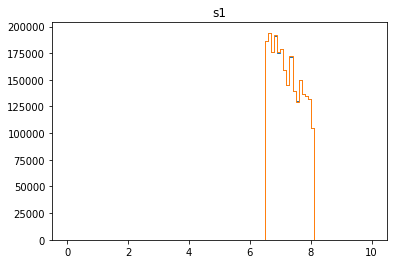

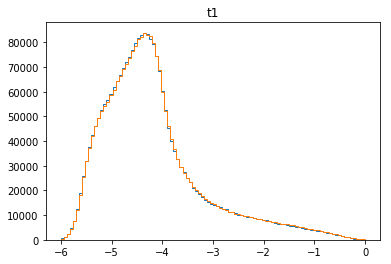

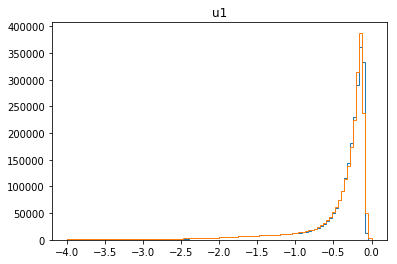

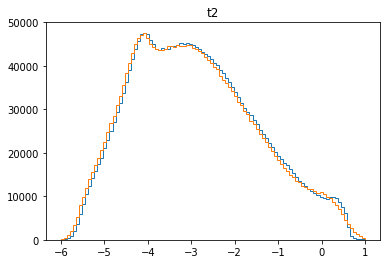

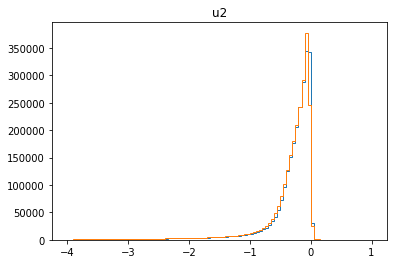

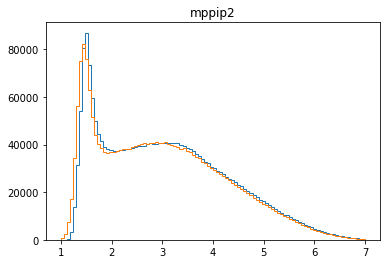

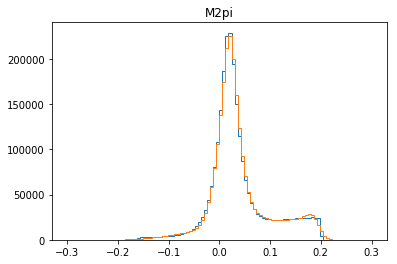

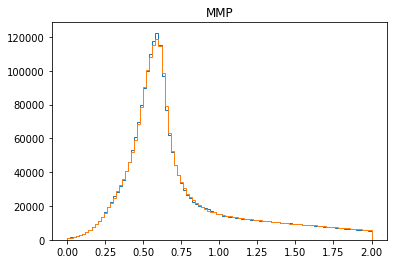

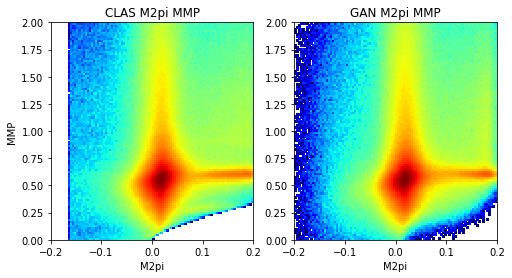

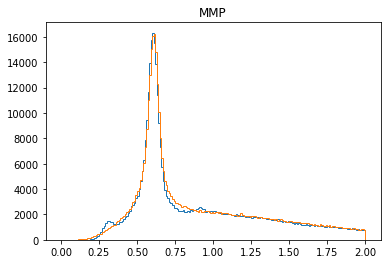

3901 [[-0.37653965, -0.37680897, 0.00026931523], [-0.31435215, -0.3145103, 0.00015813438], [-0.15347144, -0.15370561, 0.00023417131], [-0.032963924, -0.03514477, 0.0021808455], [0.05968829, 0.05851769, 0.0011705991], [0.074063696, 0.07149173, 0.00257196], [0.011251271, 0.011009923, 0.00024134727], [-0.07040648, -0.07105728, 0.00065080024], [-0.17549118, -0.17773086, 0.0022396683], [-0.25379467, -0.25412154, 0.0003268776], [-0.34974858, -0.3505634, 0.0008148386], [-0.39933482, -0.3998345, 0.000499707], [-0.35526523, -0.35640496, 0.0011397424], [-0.27986583, -0.27987173, 5.91399e-06], [-0.1513396, -0.15179905, 0.00045944992], [-0.021410901, -0.021491846, 8.0945356e-05], [0.055663876, 0.047797993, 0.007865882], [0.018835938, 0.018835874, 6.338814e-08], [-0.04854633, -0.04855013, 3.7998107e-06], [-0.17282595, -0.17449886, 0.0016729069]]
3902 [[-0.27609318, -0.27640057, 0.00030738328], [-0.352013, -0.3543719, 0.002358921], [-0.37025625, -0.37101302, 0.000756783], [-0.31478786, -0.31547257, 

3911 [[0.015016934, 0.014588425, 0.0004285088], [0.121665396, 0.11883903, 0.0028263608], [0.09874323, 0.09594802, 0.0027952157], [0.008625081, 0.008337887, 0.00028719378], [-0.11825684, -0.12084003, 0.002583193], [-0.2964461, -0.29669476, 0.00024863143], [-0.43017477, -0.43018025, 5.477083e-06], [-0.5380835, -0.5380987, 1.5214117e-05], [-0.5109555, -0.51110613, 0.00015059907], [-0.38424566, -0.38595924, 0.0017135616], [-0.17727241, -0.1783997, 0.0011272845], [0.061812025, 0.06177014, 4.188205e-05], [0.19417831, 0.19417782, 4.9535083e-07], [0.22815095, 0.22808586, 6.5093984e-05], [0.12769893, 0.1251169, 0.0025820297], [-0.13951546, -0.13951889, 3.4300356e-06], [-0.38084906, -0.3809843, 0.00013523609], [-0.54257035, -0.5433187, 0.0007483066], [-0.5726186, -0.5726318, 1.3146932e-05], [-0.53029585, -0.53030044, 4.5716342e-06]]
3912 [[-0.35201013, -0.3583383, 0.0063281683], [-0.1388656, -0.1392897, 0.00042409817], [0.008034174, 0.0074897646, 0.0005444101], [0.15589416, 0.15447727, 0.0014168

3921 [[-0.24936047, -0.24941158, 5.1104522e-05], [-0.36949968, -0.3695005, 7.9340316e-07], [-0.47533822, -0.47542277, 8.455405e-05], [-0.4977599, -0.49826774, 0.0005078409], [-0.3706338, -0.37063518, 1.3759744e-06], [-0.2630743, -0.26372257, 0.0006482726], [-0.14163922, -0.14239034, 0.0007511268], [0.009930138, 0.004776507, 0.0051536304], [0.12810124, 0.12709235, 0.001008893], [0.1696537, 0.16931456, 0.00033912886], [0.08142417, 0.079562746, 0.0018614244], [-0.08822794, -0.089500785, 0.0012728453], [-0.24540505, -0.24550399, 9.893929e-05], [-0.3794514, -0.37995228, 0.00050090154], [-0.44655326, -0.44857502, 0.0020217467], [-0.44823456, -0.44972238, 0.0014878232], [-0.4192523, -0.41929686, 4.456524e-05], [-0.27958408, -0.2796591, 7.5017604e-05], [-0.13242076, -0.13298357, 0.0005628093], [-0.035830177, -0.036087118, 0.0002569403]]
3922 [[-0.0044129477, -0.004436771, 2.3823233e-05], [-0.11291675, -0.11315303, 0.00023627754], [-0.22195816, -0.22227132, 0.00031316187], [-0.31461075, -0.3146

3931 [[-0.10755736, -0.109909244, 0.0023518861], [-0.12593335, -0.1264858, 0.0005524501], [-0.1264563, -0.12782493, 0.001368625], [-0.1610494, -0.16254488, 0.0014954844], [-0.24839522, -0.24849126, 9.6039155e-05], [-0.2647785, -0.2647863, 7.807922e-06], [-0.27697182, -0.27749935, 0.00052754243], [-0.24433175, -0.24494317, 0.0006114179], [-0.19014588, -0.19136328, 0.0012173909], [-0.18381104, -0.18457898, 0.0007679475], [-0.19855207, -0.19873299, 0.00018091925], [-0.1706284, -0.17063095, 2.5425688e-06], [-0.14033459, -0.14102611, 0.00069151196], [-0.13336551, -0.13368827, 0.0003227526], [-0.14690313, -0.14696263, 5.949527e-05], [-0.14625236, -0.1463829, 0.00013053106], [-0.2248137, -0.22581811, 0.0010044147], [-0.3030115, -0.30308336, 7.1846946e-05], [-0.31432548, -0.31432614, 6.4173946e-07], [-0.2712321, -0.27132747, 9.536743e-05]]
3932 [[-0.23463218, -0.23565432, 0.0010221434], [-0.16242896, -0.16308533, 0.00065635913], [-0.15556261, -0.15791838, 0.0023557728], [-0.14071748, -0.140838

3941 [[-0.3140024, -0.3146226, 0.0006202217], [-0.37446824, -0.37573022, 0.0012619807], [-0.3714911, -0.3777129, 0.006221802], [-0.28532544, -0.28532985, 4.417976e-06], [-0.16544865, -0.16554227, 9.362457e-05], [-0.078652605, -0.07887468, 0.00022207302], [-0.11382822, -0.11421006, 0.00038184228], [-0.23190331, -0.23204198, 0.00013867348], [-0.36240068, -0.3632609, 0.0008602079], [-0.48628727, -0.48632497, 3.7696598e-05], [-0.52128357, -0.52166855, 0.00038497956], [-0.46473965, -0.46715918, 0.00241952], [-0.3383793, -0.33944097, 0.0010616673], [-0.19844088, -0.20028211, 0.0018412358], [4.3319706e-05, -0.00011770598, 0.00016102569], [0.16161475, 0.15978935, 0.0018253922], [0.18743768, 0.18693781, 0.00049987755], [0.1170986, 0.11708142, 1.7178278e-05], [-0.0015399673, -0.002913395, 0.0013734277], [-0.10753577, -0.10770752, 0.0001717513]]
3942 [[-0.2483572, -0.24860571, 0.00024851115], [-0.3999423, -0.40011182, 0.00016950899], [-0.5037578, -0.50386876, 0.000110971196], [-0.50835454, -0.509

3951 [[-0.008987132, -0.009007206, 2.0073643e-05], [0.05527907, 0.055093087, 0.00018598259], [0.020023176, 0.020017842, 5.3351732e-06], [-0.09805472, -0.099759296, 0.0017045724], [-0.16383219, -0.16636023, 0.0025280402], [-0.31470147, -0.31470448, 2.9993828e-06], [-0.35017183, -0.35316715, 0.0029953143], [-0.31241488, -0.31396425, 0.0015493633], [-0.23662132, -0.2368654, 0.00024408102], [-0.13856128, -0.13931617, 0.00075489527], [-0.062287427, -0.06229241, 4.980029e-06], [-0.06272576, -0.06440195, 0.0016761849], [-0.1320069, -0.13358401, 0.001577115], [-0.23235452, -0.23256592, 0.00021140341], [-0.29915193, -0.2994474, 0.00029546258], [-0.37070388, -0.3707946, 9.073132e-05], [-0.367776, -0.3682367, 0.00046067723], [-0.29073653, -0.2907701, 3.3598626e-05], [-0.2726496, -0.27306044, 0.0004108483], [-0.19003089, -0.19003145, 5.647453e-07]]
3952 [[-0.056991477, -0.056993775, 2.2992936e-06], [0.08031359, 0.07031428, 0.009999314], [0.13951707, 0.13813302, 0.0013840508], [0.123941354, 0.12385

3961 [[0.17384379, 0.17383848, 5.2999867e-06], [0.07822503, 0.078224905, 1.2585951e-07], [-0.09753587, -0.09912619, 0.0015903221], [-0.21304323, -0.21328357, 0.00024034083], [-0.35038835, -0.3503926, 4.259069e-06], [-0.43988606, -0.44124398, 0.0013579207], [-0.48491895, -0.4854577, 0.0005387285], [-0.51205736, -0.51207453, 1.716247e-05], [-0.42896545, -0.4341254, 0.00515993], [-0.38281235, -0.3829454, 0.00013302709], [-0.32967842, -0.33041394, 0.0007355264], [-0.20291476, -0.20293376, 1.8994704e-05], [-0.072344236, -0.07247885, 0.00013461571], [0.06526782, 0.065236785, 3.1040112e-05], [0.13747361, 0.13693683, 0.0005367823], [0.21809985, 0.21483985, 0.0032600085], [0.16086026, 0.160697, 0.00016326009], [0.06389139, 0.06373181, 0.00015957677], [-0.09355672, -0.09368011, 0.00012339652], [-0.2305699, -0.23089941, 0.00032950376]]
3962 [[-0.3703524, -0.3704449, 9.252052e-05], [-0.3956193, -0.39562762, 8.327948e-06], [-0.4298722, -0.43028036, 0.00040814653], [-0.3445564, -0.3446864, 0.0001300

3971 [[0.35111895, 0.3507697, 0.00034924888], [0.18168838, 0.18168563, 2.7599199e-06], [-0.026283901, -0.026837967, 0.0005540652], [-0.23494275, -0.23547213, 0.00052938395], [-0.47200584, -0.4721412, 0.0001353692], [-0.5748283, -0.5751346, 0.00030624733], [-0.6388906, -0.6389008, 1.0194621e-05], [-0.62203014, -0.62204206, 1.1892058e-05], [-0.46273756, -0.46274242, 4.8447546e-06], [-0.24878359, -0.24879138, 7.786618e-06], [-0.040495988, -0.04771046, 0.0072144726], [0.14163469, 0.14126681, 0.00036788385], [0.1963729, 0.195616, 0.0007568879], [0.14685024, 0.14553735, 0.0013128956], [-0.043196537, -0.04345049, 0.00025395287], [-0.1702861, -0.1707409, 0.00045480108], [-0.310374, -0.31037804, 4.064528e-06], [-0.4253752, -0.42618808, 0.0008128799], [-0.4620897, -0.46513826, 0.0030485776], [-0.49949652, -0.5002468, 0.0007502906]]
3972 [[-0.41024923, -0.41399178, 0.0037425398], [-0.2758241, -0.27584827, 2.4159555e-05], [-0.16976558, -0.17056924, 0.00080366136], [-0.028605761, -0.029223705, 0.00

3981 [[-0.4962821, -0.4980765, 0.0017943955], [-0.45617065, -0.4564445, 0.00027384146], [-0.36516523, -0.36627173, 0.0011065044], [-0.16708277, -0.1677203, 0.0006375363], [-0.0032487886, -0.0055154366, 0.002266648], [0.16572282, 0.16554, 0.00018282267], [0.25966695, 0.25963452, 3.2415206e-05], [0.19357626, 0.19248153, 0.0010947349], [0.0508643, 0.049971, 0.0008933016], [-0.07990574, -0.0804017, 0.0004959619], [-0.25843984, -0.25850585, 6.602059e-05], [-0.42772618, -0.42784274, 0.00011654484], [-0.5317804, -0.5341752, 0.002394815], [-0.5126472, -0.51344085, 0.00079363567], [-0.4377162, -0.4381717, 0.0004555335], [-0.34668308, -0.34671086, 2.7772949e-05], [-0.2350575, -0.23508741, 2.990306e-05], [-0.10090123, -0.10117666, 0.0002754219], [0.061219838, 0.06035616, 0.00086367974], [0.16004395, 0.16001774, 2.6207477e-05]]
3982 [[0.18866049, 0.18826912, 0.00039136782], [0.18452767, 0.18298998, 0.0015376733], [0.021960458, 0.021193355, 0.0007671022], [-0.09378262, -0.09380312, 2.05032e-05], [-

3991 [[-0.7725538, -0.7725872, 3.337788e-05], [-0.6590689, -0.6591387, 6.982432e-05], [-0.41537666, -0.41598845, 0.00061179535], [-0.089240074, -0.09043534, 0.0011952649], [0.23307024, 0.23287503, 0.00019519805], [0.40751606, 0.4067425, 0.00077356055], [0.41907045, 0.4190472, 2.3231143e-05], [0.19572093, 0.19209509, 0.0036258455], [-0.05221985, -0.052220367, 5.170623e-07], [-0.2762401, -0.2763462, 0.00010608346], [-0.5186284, -0.5186995, 7.1137336e-05], [-0.7341627, -0.73586965, 0.0017069356], [-0.74209636, -0.7452492, 0.003152872], [-0.6525204, -0.6527777, 0.00025724617], [-0.38646305, -0.38691008, 0.00044702474], [-0.13737184, -0.14187227, 0.0045004333], [0.11599791, 0.11566931, 0.00032860413], [0.32129624, 0.32109448, 0.00020175433], [0.43476123, 0.43402052, 0.0007407084], [0.3549527, 0.35438517, 0.00056752504]]
3992 [[0.22190937, 0.22047448, 0.0014348901], [-0.023733879, -0.024371704, 0.00063782523], [-0.24549063, -0.25036845, 0.00487782], [-0.445985, -0.44605058, 6.558735e-05], [-

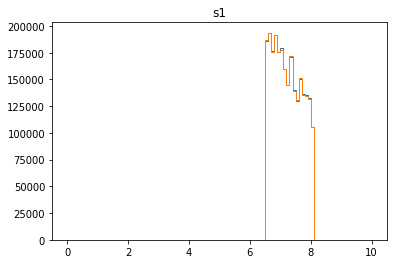

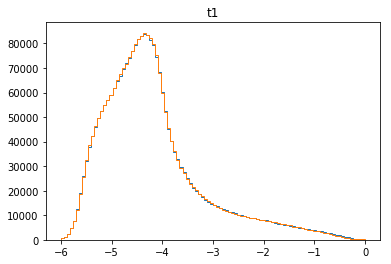

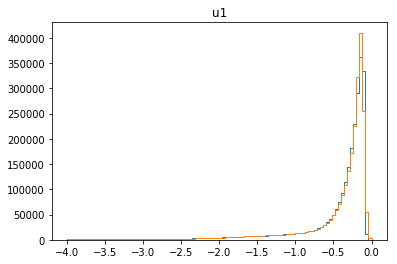

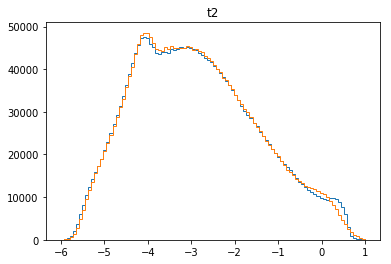

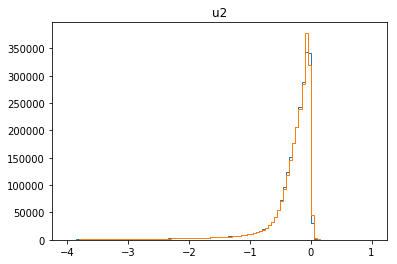

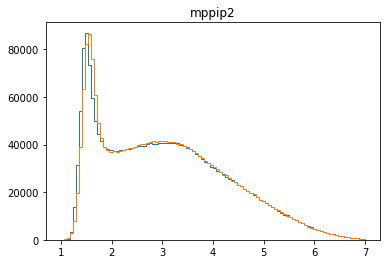

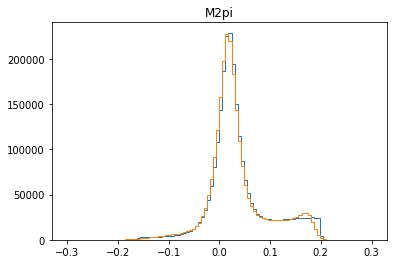

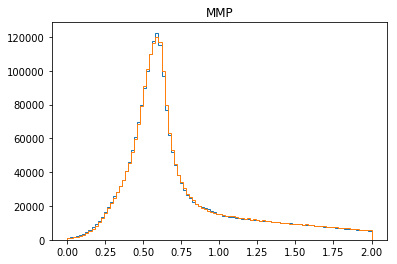

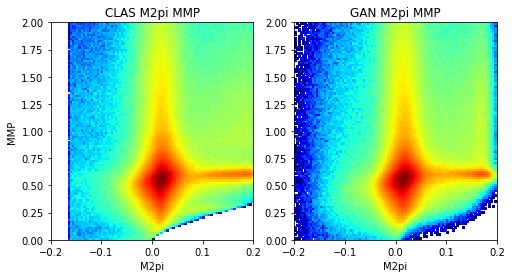

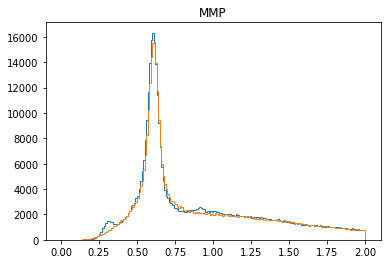

4001 [[-0.2757725, -0.2801813, 0.0044087768], [-0.29285133, -0.29289716, 4.5847624e-05], [-0.29148453, -0.2916946, 0.00021007439], [-0.20598675, -0.20725362, 0.0012668639], [-0.1611036, -0.1631038, 0.0020001926], [-0.08900642, -0.090334974, 0.0013285613], [-0.05306682, -0.053628724, 0.00056190474], [-0.009972978, -0.012116928, 0.0021439488], [0.048316684, 0.048313893, 2.7916979e-06], [-0.03497571, -0.03527598, 0.00030026864], [-0.15803377, -0.15815201, 0.000118239404], [-0.30282384, -0.30306342, 0.00023957265], [-0.333559, -0.33359936, 4.0341183e-05], [-0.34270078, -0.34270185, 1.0608346e-06], [-0.23306929, -0.23340324, 0.00033395027], [-0.20496945, -0.21029761, 0.005328158], [-0.19100873, -0.19102836, 1.9631729e-05], [-0.11322834, -0.11337941, 0.00015106758], [-0.098636724, -0.09883713, 0.00020040202], [-0.15368177, -0.15368222, 4.5076013e-07]]
4002 [[-0.1458951, -0.1464974, 0.0006023027], [-0.21965633, -0.22590524, 0.0062489114], [-0.26938897, -0.26943, 4.1046882e-05], [-0.2817406, -

4011 [[0.1176013, 0.11647107, 0.0011302321], [0.045199715, 0.045159664, 4.0050963e-05], [-0.101746574, -0.10245982, 0.00071324763], [-0.2537209, -0.2548052, 0.001084284], [-0.4799342, -0.48059496, 0.0006607644], [-0.603325, -0.60586417, 0.0025391767], [-0.6003036, -0.6007615, 0.00045789775], [-0.47136134, -0.4717749, 0.00041355903], [-0.2670126, -0.26721323, 0.00020061807], [-0.010891949, -0.012249448, 0.0013574992], [0.2187298, 0.21851298, 0.00021681772], [0.28657648, 0.2865763, 1.8091306e-07], [0.18532263, 0.18460499, 0.000717635], [0.07091597, 0.07021176, 0.00070420926], [-0.20108116, -0.20133431, 0.00025316313], [-0.4087778, -0.4089897, 0.0002119029], [-0.5291587, -0.5327042, 0.0035454412], [-0.53951454, -0.5401415, 0.0006269852], [-0.4328219, -0.43347934, 0.00065743463], [-0.2791227, -0.2795661, 0.00044340268]]
4012 [[-0.10431516, -0.10436853, 5.336515e-05], [0.046709586, 0.04603829, 0.00067129824], [0.10905849, 0.10851542, 0.0005430757], [0.04479742, 0.044051096, 0.00074632524], 

4021 [[-0.51479363, -0.5187746, 0.0039809905], [-0.32939622, -0.3299573, 0.0005610912], [-0.0950707, -0.09627098, 0.0012002817], [0.08011902, 0.079965554, 0.00015346822], [0.17691481, 0.17671834, 0.00019647925], [0.17064273, 0.17063902, 3.703757e-06], [0.19102024, 0.18886071, 0.0021595205], [0.0026601239, 0.0014507057, 0.0012094182], [-0.19355269, -0.19678141, 0.003228719], [-0.35332432, -0.3562592, 0.0029348682], [-0.4111932, -0.41144153, 0.0002483308], [-0.3756327, -0.3768863, 0.0012535927], [-0.24609505, -0.24610433, 9.289957e-06], [-0.08731741, -0.087390035, 7.2625066e-05], [0.118533604, 0.11462974, 0.003903866], [0.18700372, 0.18596517, 0.0010385513], [0.091382965, 0.0910639, 0.00031906244], [0.017436445, 0.01742672, 9.725136e-06], [-0.17496625, -0.17527853, 0.00031228492], [-0.33993956, -0.35123202, 0.011292468]]
4022 [[-0.41491094, -0.41677222, 0.0018612595], [-0.47154763, -0.47171232, 0.00016467669], [-0.40034187, -0.4003873, 4.540958e-05], [-0.33828184, -0.33829725, 1.5393192e

4031 [[-0.17733158, -0.17764258, 0.0003110054], [-0.05929735, -0.06190503, 0.0026076797], [0.051693186, 0.051687755, 5.4325355e-06], [0.024807066, 0.02473175, 7.531525e-05], [-0.032283973, -0.034700867, 0.0024168936], [-0.23998474, -0.2412693, 0.0012845764], [-0.3311217, -0.33149672, 0.00037501534], [-0.40607673, -0.40607715, 4.1316162e-07], [-0.41344604, -0.41651002, 0.0030639726], [-0.32177284, -0.32292745, 0.001154601], [-0.14519112, -0.14587602, 0.00068490714], [0.037573732, 0.037539624, 3.4109125e-05], [0.19354229, 0.1917653, 0.0017769862], [0.16545178, 0.16527459, 0.00017719298], [0.07312672, 0.07174479, 0.0013819231], [-0.10185673, -0.10217825, 0.0003215202], [-0.23648556, -0.24014433, 0.003658767], [-0.4184915, -0.41897818, 0.00048666104], [-0.54825294, -0.54856455, 0.00031161116], [-0.5851413, -0.5851632, 2.189048e-05]]
4032 [[-0.49926367, -0.5006364, 0.0013727209], [-0.38347748, -0.3839282, 0.0004507425], [-0.22691263, -0.22891487, 0.0020022402], [-0.11746998, -0.1174964, 2.6

4041 [[-0.32090622, -0.32092893, 2.2701006e-05], [-0.3741423, -0.37444693, 0.00030464726], [-0.3571016, -0.3592556, 0.0021540285], [-0.28876668, -0.28888232, 0.0001156406], [-0.19764136, -0.19832617, 0.0006848073], [-0.12192023, -0.123910196, 0.0019899693], [0.0075399643, 0.00587905, 0.0016609144], [0.030771216, 0.029717488, 0.0010537275], [-0.051014442, -0.051066834, 5.239426e-05], [-0.20877235, -0.2117543, 0.0029819673], [-0.26418725, -0.26499134, 0.000804094], [-0.35616055, -0.35981056, 0.0036500047], [-0.3855127, -0.38616195, 0.0006492442], [-0.34553394, -0.3477064, 0.0021724808], [-0.1920557, -0.19207886, 2.3157661e-05], [-0.051352397, -0.054957367, 0.0036049727], [-0.036833495, -0.038711745, 0.0018782492], [-0.12918144, -0.13081218, 0.001630737], [-0.22593966, -0.22619869, 0.0002590235], [-0.3072088, -0.30726668, 5.7887955e-05]]
4042 [[-0.3507896, -0.3519336, 0.0011439964], [-0.34172556, -0.3422334, 0.0005078409], [-0.27590415, -0.2765368, 0.0006326335], [-0.24043496, -0.24256656

4051 [[0.021738729, 0.02165002, 8.870792e-05], [-0.06978632, -0.07008798, 0.00030165844], [-0.27361262, -0.27542225, 0.001809617], [-0.35617387, -0.35618114, 7.2634766e-06], [-0.41955617, -0.42087004, 0.0013138633], [-0.38657832, -0.39373878, 0.007160464], [-0.30681828, -0.30706963, 0.00025134557], [-0.18356234, -0.18407406, 0.0005117167], [-0.013203538, -0.013791694, 0.0005881565], [0.083950974, 0.08381009, 0.00014088336], [0.12243808, 0.12200696, 0.00043111865], [-0.01875235, -0.0187566, 4.2512006e-06], [-0.15954475, -0.15983643, 0.00029167175], [-0.26723695, -0.26724055, 3.6161837e-06], [-0.36363056, -0.36408105, 0.00045049962], [-0.3736421, -0.37428492, 0.0006428448], [-0.28323343, -0.28331518, 8.173667e-05], [-0.25284576, -0.2529131, 6.732881e-05], [-0.2175809, -0.21798283, 0.00040192794], [-0.17196038, -0.17199183, 3.1445234e-05]]
4052 [[-0.17228203, -0.17251866, 0.00023662951], [-0.24365672, -0.2450752, 0.0014184644], [-0.24701329, -0.24701644, 3.1532584e-06], [-0.2280101, -0.23

4061 [[0.11928482, 0.11905495, 0.00022987151], [0.093519, 0.09349011, 2.888964e-05], [-0.040558264, -0.040681027, 0.0001227617], [-0.20198885, -0.20208023, 9.138656e-05], [-0.27051806, -0.2705245, 6.4449023e-06], [-0.3339275, -0.334188, 0.00026049904], [-0.37140527, -0.37204176, 0.0006364773], [-0.27229473, -0.2778924, 0.0055976817], [-0.11683807, -0.11753441, 0.00069633545], [-0.054743968, -0.056376863, 0.0016328942], [-0.012413584, -0.012413755, 1.713088e-07], [0.00044842812, 0.00016233232, 0.0002860958], [-0.03974494, -0.039770123, 2.5182675e-05], [-0.1621651, -0.1622251, 5.9996535e-05], [-0.30445096, -0.3046064, 0.00015545946], [-0.4204663, -0.42047623, 9.9284225e-06], [-0.48877966, -0.48948926, 0.00070958474], [-0.41586798, -0.42089397, 0.0050259936], [-0.24509701, -0.24951237, 0.0044153654], [-0.056852017, -0.061481833, 0.004629816]]
4062 [[0.076890506, 0.07566151, 0.0012289981], [0.19344506, 0.19162081, 0.0018242516], [0.2220141, 0.2211097, 0.0009043954], [0.032198552, 0.0312123

4071 [[-0.19860612, -0.1989421, 0.00033597497], [-0.159639, -0.15981731, 0.00017831191], [-0.07189875, -0.071987316, 8.856426e-05], [-0.061376076, -0.061498206, 0.00012212852], [-0.054938093, -0.05501298, 7.488549e-05], [-0.032472506, -0.03283427, 0.00036176352], [-0.14125618, -0.14139797, 0.00014179038], [-0.1851093, -0.18593758, 0.0008282873], [-0.30943584, -0.30968872, 0.00025285978], [-0.44782415, -0.44783178, 7.617233e-06], [-0.43301904, -0.43308008, 6.1035156e-05], [-0.33867642, -0.33927286, 0.00059641903], [-0.19344349, -0.19348878, 4.5281136e-05], [0.076168254, 0.07613403, 3.422061e-05], [0.2519442, 0.2519082, 3.6006226e-05], [0.3004068, 0.29937857, 0.0010282503], [0.08964992, 0.088736676, 0.00091325043], [-0.11690317, -0.1192228, 0.0023196228], [-0.32075644, -0.3221453, 0.0013888803], [-0.4854977, -0.48563924, 0.00014151797]]
4072 [[-0.5382136, -0.53821373, 1.3551107e-07], [-0.4524357, -0.4529877, 0.0005520018], [-0.21891709, -0.22296187, 0.004044786], [-0.03580495, -0.0358939

4081 [[-0.27772957, -0.27822205, 0.00049248495], [-0.24443483, -0.24452336, 8.852835e-05], [-0.22693074, -0.22693616, 5.423649e-06], [-0.18043165, -0.18078914, 0.0003574953], [-0.081269875, -0.08168717, 0.0004172911], [-0.053157542, -0.05348871, 0.00033116768], [-0.04303701, -0.043505415, 0.0004684059], [-0.14278604, -0.14498027, 0.002194227], [-0.2543944, -0.2544214, 2.701427e-05], [-0.28499153, -0.2851005, 0.00010897103], [-0.29298967, -0.30242684, 0.009437168], [-0.31864178, -0.31873095, 8.91756e-05], [-0.34312192, -0.3444566, 0.001334686], [-0.33838236, -0.3387779, 0.00039552955], [-0.25198758, -0.25270206, 0.00071447063], [-0.14202304, -0.14203921, 1.6165955e-05], [-0.07979306, -0.0804359, 0.0006428448], [-0.0509877, -0.05630834, 0.0053206426], [-0.029987643, -0.030299995, 0.0003123523], [-0.059575517, -0.06054601, 0.0009704922]]
4082 [[-0.12210848, -0.12212996, 2.1481901e-05], [-0.18977036, -0.19022037, 0.00045001387], [-0.21999598, -0.22013822, 0.000142245], [-0.23436598, -0.234

4091 [[-0.39459458, -0.39486596, 0.00027138507], [-0.29667014, -0.29798982, 0.0013196772], [-0.16267063, -0.16453189, 0.0018612595], [0.02883718, 0.027078638, 0.0017585416], [0.18354759, 0.18314067, 0.0004069144], [0.20490919, 0.20471142, 0.00019776463], [0.10286244, 0.10209597, 0.0007664685], [-0.04143837, -0.04291738, 0.0014790078], [-0.22366795, -0.22944601, 0.005778062], [-0.37993562, -0.38017008, 0.0002344633], [-0.4162876, -0.4171137, 0.0008260932], [-0.41862407, -0.41898286, 0.00035879476], [-0.3399813, -0.34028155, 0.00030026864], [-0.258756, -0.26321203, 0.004456014], [-0.0527076, -0.052750077, 4.247664e-05], [0.1014322, 0.10135555, 7.6645294e-05], [0.056758225, 0.055840127, 0.00091809843], [-0.05083177, -0.050839793, 8.022563e-06], [-0.18323165, -0.18334182, 0.00011016894], [-0.31946614, -0.32039005, 0.00092388695]]
4092 [[-0.32710606, -0.3281547, 0.0010486563], [-0.2866259, -0.28676936, 0.00014347606], [-0.1868321, -0.18715589, 0.00032378142], [-0.0783969, -0.0786196, 0.0002

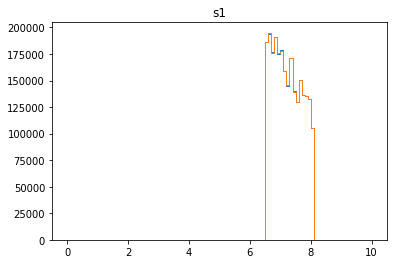

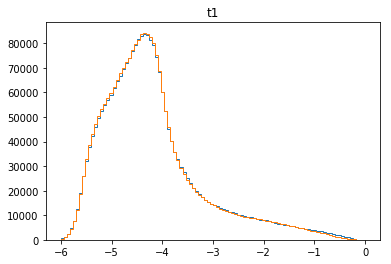

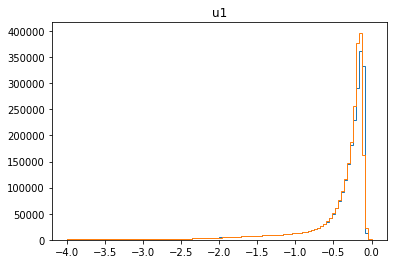

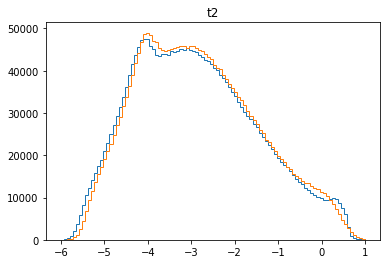

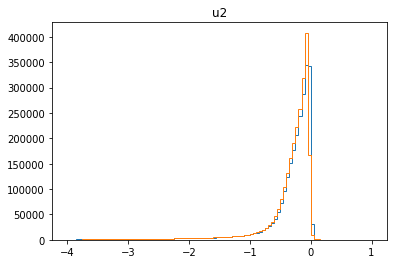

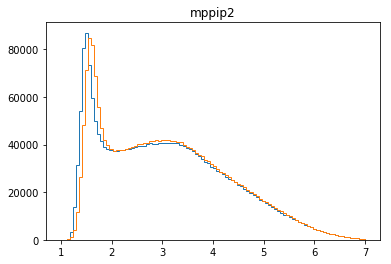

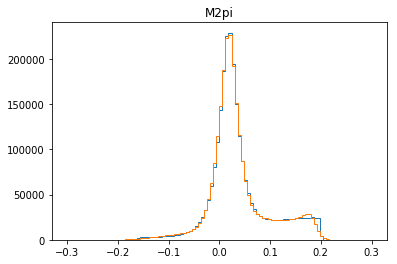

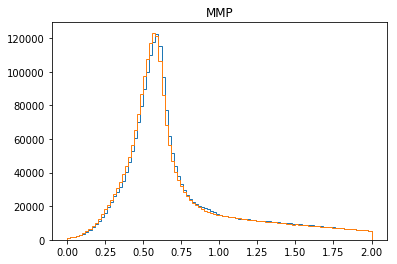

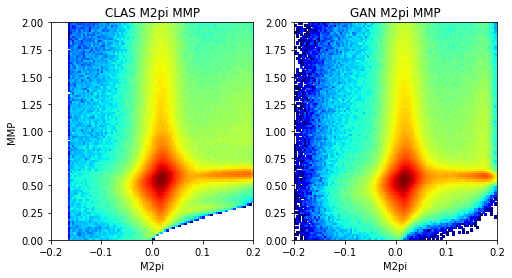

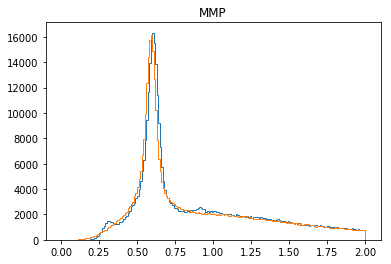

4101 [[0.006976988, 0.005238863, 0.001738125], [-0.1986282, -0.20062533, 0.001997123], [-0.42114753, -0.42293563, 0.001788099], [-0.6028201, -0.6057773, 0.00295723], [-0.68912095, -0.6892918, 0.00017080276], [-0.631738, -0.63221395, 0.00047594897], [-0.4539571, -0.45444185, 0.00048472738], [-0.1364119, -0.1364181, 6.1955693e-06], [0.24249868, 0.24245158, 4.7095837e-05], [0.4520335, 0.4517177, 0.00031580016], [0.47621915, 0.47574502, 0.00047411982], [0.311937, 0.30911976, 0.002817242], [0.014750003, 0.0147401225, 9.880401e-06], [-0.3327309, -0.3340964, 0.0013655224], [-0.60217226, -0.6022736, 0.0001013058], [-0.6864087, -0.6889571, 0.0025484117], [-0.70017964, -0.70288247, 0.0027028148], [-0.6097118, -0.609717, 5.203823e-06], [-0.34738594, -0.3475307, 0.00014475832], [-0.03649953, -0.0370109, 0.00051137153]]
4102 [[0.27795133, 0.27794048, 1.0850377e-05], [0.40909123, 0.40738493, 0.0017063055], [0.39717433, 0.39590406, 0.0012702607], [0.13846661, 0.13702275, 0.001443863], [-0.09241548, -

4111 [[-0.26196802, -0.26432046, 0.0023524412], [-0.36240718, -0.36241844, 1.12562e-05], [-0.37936214, -0.37972876, 0.00036664103], [-0.3423352, -0.34233716, 1.9814033e-06], [-0.17751193, -0.17753662, 2.4687419e-05], [0.014266047, 0.014115026, 0.0001510207], [0.111032024, 0.108861856, 0.0021701702], [0.0563614, 0.055388052, 0.0009733464], [-0.02349582, -0.023501404, 5.584738e-06], [-0.20235565, -0.20235567, 1.39843905e-08], [-0.33300543, -0.33305642, 5.09955e-05], [-0.49778673, -0.498277, 0.00049028633], [-0.51358956, -0.51375246, 0.00016287045], [-0.39427847, -0.400413, 0.0061345496], [-0.21276183, -0.2146147, 0.001852876], [-0.09214832, -0.09247609, 0.0003277749], [-0.04291573, -0.043836374, 0.0009206433], [-0.067738116, -0.06776763, 2.9508024e-05], [-0.14732398, -0.148439, 0.0011150223], [-0.28292713, -0.28355354, 0.0006264122]]
4112 [[-0.39219734, -0.39230663, 0.000109289846], [-0.4684267, -0.46889693, 0.0004702239], [-0.4520015, -0.4539103, 0.0019087925], [-0.3471798, -0.34905374,

4121 [[-0.1371916, -0.13802384, 0.0008322446], [-0.005057038, -0.0070016626, 0.0019446249], [0.12918963, 0.12902343, 0.00016619771], [0.122210875, 0.121999696, 0.0002111816], [0.026573507, 0.026476193, 9.7314434e-05], [-0.10309705, -0.10589226, 0.0027952157], [-0.2228025, -0.22328925, 0.00048674512], [-0.3184675, -0.3195842, 0.0011166792], [-0.39228433, -0.39484122, 0.0025568923], [-0.35869804, -0.35870263, 4.587961e-06], [-0.27808866, -0.28055987, 0.0024712062], [-0.23257037, -0.23322868, 0.0006583152], [-0.1731154, -0.17311543, 2.881643e-08], [-0.040555898, -0.041004296, 0.00044839692], [-0.06812952, -0.068572275, 0.0004427603], [-0.1140154, -0.11401874, 3.338806e-06], [-0.2053204, -0.20540234, 8.194373e-05], [-0.28001824, -0.28012303, 0.000104790844], [-0.33593574, -0.3360554, 0.00011965392], [-0.3096679, -0.3096873, 1.941262e-05]]
4122 [[-0.24652725, -0.24710335, 0.0005760996], [-0.21986176, -0.21987964, 1.7880988e-05], [-0.1975537, -0.19787802, 0.00032433076], [-0.16182412, -0.162

4131 [[-0.11546446, -0.115464516, 5.867696e-08], [-0.021594865, -0.021624435, 2.9570227e-05], [0.08644986, 0.084467374, 0.001982489], [0.109094866, 0.10901066, 8.420364e-05], [-0.0016715685, -0.002374058, 0.0007024894], [-0.14521751, -0.1453305, 0.000112989546], [-0.31838745, -0.31885216, 0.00046469792], [-0.45619872, -0.45666838, 0.00046964502], [-0.5287936, -0.52969134, 0.00089775387], [-0.55059606, -0.5506229, 2.6796613e-05], [-0.45499516, -0.45514098, 0.00014581587], [-0.2748036, -0.27491334, 0.00010972895], [-0.06367994, -0.06371288, 3.2938555e-05], [0.06880119, 0.06800303, 0.0007981556], [0.12365067, 0.123551615, 9.905315e-05], [0.08861202, 0.08708182, 0.0015302034], [0.04249707, 0.04136016, 0.0011369109], [-0.073251896, -0.074442156, 0.0011902583], [-0.18372099, -0.18453735, 0.00081636396], [-0.2811347, -0.28116763, 3.2938555e-05]]
4132 [[-0.27851805, -0.2799978, 0.0014797414], [-0.26520228, -0.26802966, 0.0028273747], [-0.23615094, -0.23658134, 0.0004304061], [-0.20371108, -0.2

4141 [[0.07323446, 0.06583576, 0.007398701], [-0.03955946, -0.03994819, 0.00038873102], [-0.21441126, -0.21451493, 0.00010366148], [-0.3658167, -0.3705499, 0.004733174], [-0.47487783, -0.475281, 0.00040315255], [-0.5187837, -0.5194319, 0.0006481754], [-0.45445877, -0.45454827, 8.95001e-05], [-0.24402624, -0.24404655, 2.0313631e-05], [-0.041668624, -0.051900823, 0.010232199], [0.117769994, 0.117157064, 0.0006129281], [0.25027764, 0.2494259, 0.00085172587], [0.154925, 0.15492263, 2.36923e-06], [0.039700817, 0.03940187, 0.00029894806], [-0.15770788, -0.15917884, 0.00147095], [-0.36802366, -0.36873022, 0.0007065395], [-0.48768744, -0.48983017, 0.0021427127], [-0.48916754, -0.49362484, 0.004457288], [-0.42733932, -0.42862198, 0.0012826632], [-0.31822467, -0.31829756, 7.288538e-05], [-0.21522179, -0.21522243, 6.478658e-07]]
4142 [[-0.113042705, -0.11350568, 0.00046297265], [-0.059773512, -0.0601026, 0.00032908836], [-0.054976836, -0.05583302, 0.0008561848], [-0.12734272, -0.12829983, 0.00095

4151 [[-0.41358158, -0.41384473, 0.00026315328], [-0.48518094, -0.48528418, 0.00010323467], [-0.4456165, -0.4500896, 0.0044730925], [-0.3213407, -0.32136914, 2.8440321e-05], [-0.18269674, -0.18281527, 0.000118529955], [-0.024587471, -0.024702251, 0.000114780734], [0.0023460598, 0.0023206084, 2.5451393e-05], [0.06811167, 0.06794513, 0.00016654216], [-0.009848583, -0.010747022, 0.0008984397], [-0.041699562, -0.04292135, 0.0012217872], [-0.21702434, -0.21703406, 9.713243e-06], [-0.31209192, -0.3152536, 0.00316166], [-0.29238787, -0.29267785, 0.00028998032], [-0.22572708, -0.22929049, 0.0035634085], [-0.16764113, -0.16828775, 0.0006466225], [-0.1780316, -0.17823584, 0.0002042545], [-0.21685539, -0.21686116, 5.766491e-06], [-0.22371209, -0.22417277, 0.00046067723], [-0.2865624, -0.2865642, 1.7775201e-06], [-0.2712957, -0.27140358, 0.000107898515]]
4152 [[-0.24218036, -0.2459876, 0.003807227], [-0.28850853, -0.28895476, 0.00044621862], [-0.3002644, -0.30062434, 0.0003599518], [-0.21092406, -

4161 [[-0.534201, -0.53427094, 6.991997e-05], [-0.5908627, -0.5908899, 2.7153234e-05], [-0.6097562, -0.6097564, 2.4592737e-07], [-0.5090232, -0.51014227, 0.0011191021], [-0.33874536, -0.3388951, 0.0001497576], [-0.16309448, -0.1633567, 0.00026222583], [0.1028407, 0.10269585, 0.00014485013], [0.22248137, 0.22110157, 0.0013797967], [0.25206402, 0.25133222, 0.0007318066], [0.15614834, 0.1516704, 0.004477941], [-0.035731994, -0.03659332, 0.000861327], [-0.21735772, -0.21787411, 0.00051638705], [-0.3047611, -0.3054479, 0.00068680523], [-0.35654742, -0.35739014, 0.00084273197], [-0.41290575, -0.4129865, 8.073955e-05], [-0.42562884, -0.42599952, 0.00037066944], [-0.36766323, -0.37068576, 0.0030225161], [-0.29356202, -0.2952537, 0.0016916821], [-0.18046458, -0.18163727, 0.0011726883], [-0.105746806, -0.10610207, 0.00035526292]]
4162 [[-0.10627964, -0.10650761, 0.00022796684], [-0.11130215, -0.111523375, 0.00022122113], [-0.1464193, -0.14643113, 1.1826373e-05], [-0.2482716, -0.24946806, 0.00119

4171 [[-0.1391518, -0.13964938, 0.00049757736], [-0.33623013, -0.336244, 1.3861805e-05], [-0.46814966, -0.46825796, 0.00010829512], [-0.47023606, -0.47446957, 0.004233504], [-0.4790553, -0.479056, 7.269009e-07], [-0.278195, -0.2782537, 5.870348e-05], [-0.10134853, -0.10135236, 3.829613e-06], [0.009259708, 0.0077686463, 0.0014910621], [0.06870119, 0.068508014, 0.00019317801], [0.080416895, 0.07696868, 0.0034482193], [0.03551101, 0.035387654, 0.00012335414], [-0.11435732, -0.11437584, 1.8515624e-05], [-0.27686724, -0.27765593, 0.00078869995], [-0.45482302, -0.45527482, 0.00045179605], [-0.5213233, -0.52151006, 0.00018671161], [-0.4451783, -0.44779143, 0.0026131372], [-0.3135409, -0.3135438, 2.894609e-06], [-0.102774166, -0.1060514, 0.0032772375], [0.12729064, 0.12694225, 0.00034839392], [0.17250389, 0.17249805, 5.8400083e-06]]
4172 [[0.21852608, 0.2180975, 0.00042858775], [0.027391862, 0.027323054, 6.880801e-05], [-0.1562679, -0.15646149, 0.0001936024], [-0.3190501, -0.32065997, 0.001609

4181 [[-0.11372996, -0.113799594, 6.96332e-05], [-0.11859688, -0.11919572, 0.0005988436], [-0.12956384, -0.1329554, 0.0033915567], [-0.18553008, -0.18564779, 0.00011770077], [-0.2336164, -0.23702775, 0.0034113575], [-0.22217621, -0.22347449, 0.001298285], [-0.14775135, -0.14775571, 4.362028e-06], [-0.07079496, -0.07506279, 0.004267826], [-0.097854055, -0.09837313, 0.0005190779], [-0.13512544, -0.13588285, 0.0007574129], [-0.2230447, -0.22319208, 0.00014738624], [-0.25285324, -0.25337267, 0.00051942555], [-0.2858587, -0.2865759, 0.00071722636], [-0.33820438, -0.34027097, 0.0020665887], [-0.3284246, -0.32869512, 0.00027050602], [-0.2342338, -0.23426494, 3.1146472e-05], [-0.16181058, -0.16185643, 4.5847624e-05], [-0.10750148, -0.1077888, 0.00028732308], [-0.10681059, -0.10897632, 0.0021657294], [-0.081873804, -0.081947476, 7.366908e-05]]
4182 [[-0.2010756, -0.20373377, 0.00265818], [-0.21182616, -0.21430762, 0.0024814568], [-0.2442346, -0.2442436, 9.0015565e-06], [-0.19904551, -0.1990579,

4191 [[-0.54884636, -0.5534887, 0.0046422835], [-0.3612913, -0.3612916, 3.0384763e-07], [-0.15392101, -0.15619566, 0.0022746462], [0.04651918, 0.04240642, 0.0041127573], [0.15497887, 0.15494545, 3.342197e-05], [0.13642442, 0.13639925, 2.5163536e-05], [0.076301605, 0.07600233, 0.00029927798], [-0.030747559, -0.031414516, 0.0006669565], [-0.19327655, -0.19335982, 8.326117e-05], [-0.35961255, -0.3601294, 0.00051682064], [-0.44770223, -0.44771957, 1.7352635e-05], [-0.4381704, -0.43932772, 0.0011573242], [-0.36729336, -0.36735198, 5.8615824e-05], [-0.187627, -0.18892159, 0.0012945767], [0.045401752, 0.04539852, 3.235069e-06], [0.21005309, 0.20982535, 0.00022773656], [0.1404066, 0.13984776, 0.0005588344], [-0.007672876, -0.007778058, 0.000105181716], [-0.15126845, -0.15145658, 0.00018812163], [-0.37508038, -0.37511092, 3.0553216e-05]]
4192 [[-0.5651326, -0.5657539, 0.00062126725], [-0.56110615, -0.5634935, 0.0023873537], [-0.5200893, -0.52184194, 0.0017526277], [-0.37632057, -0.37638858, 6.8

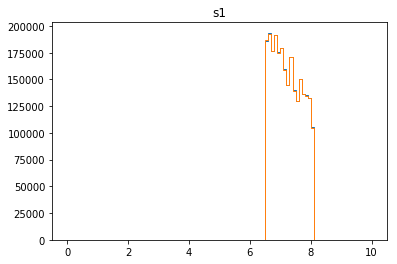

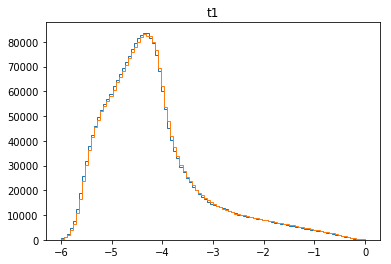

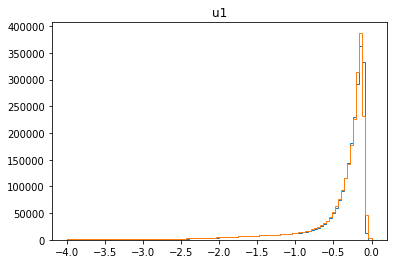

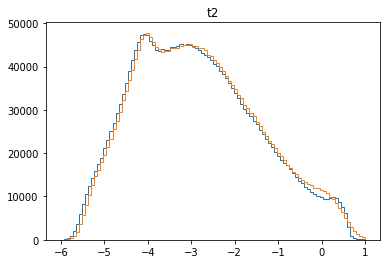

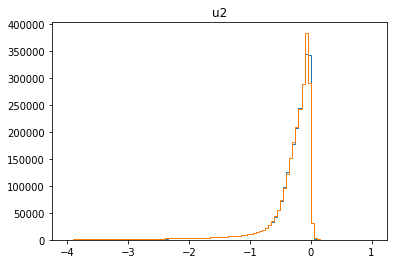

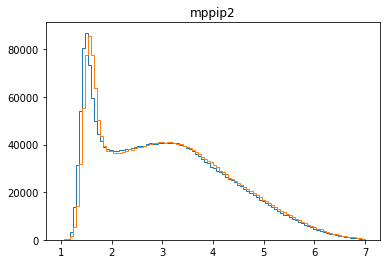

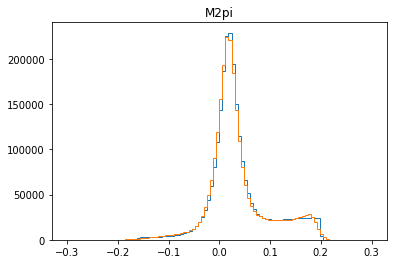

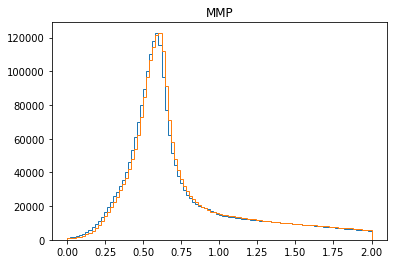

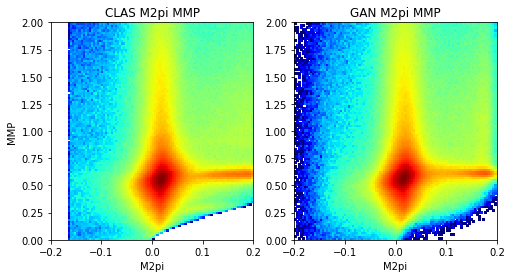

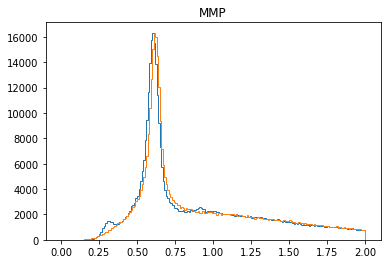

4201 [[-0.05215833, -0.05232271, 0.00016438312], [0.1432102, 0.14223994, 0.00097025465], [0.21415627, 0.21415617, 1.0145959e-07], [0.08788107, 0.087871276, 9.796644e-06], [-0.17191944, -0.17192122, 1.7826096e-06], [-0.4773926, -0.47747135, 7.8729885e-05], [-0.6499657, -0.6520764, 0.0021106952], [-0.7829758, -0.783597, 0.0006211722], [-0.65678686, -0.6579641, 0.001177265], [-0.39143994, -0.39377686, 0.0023369247], [-0.06406808, -0.06414985, 8.177114e-05], [0.24944, 0.24214266, 0.007297332], [0.40565124, 0.40561962, 3.1616597e-05], [0.349317, 0.34900427, 0.000312757], [0.17921552, 0.1790621, 0.00015342096], [-0.11669311, -0.12297312, 0.00628001], [-0.44623888, -0.4462535, 1.4639358e-05], [-0.62783927, -0.629407, 0.0015677363], [-0.6688124, -0.6688435, 3.1103904e-05], [-0.5739848, -0.5819549, 0.00797009]]
4202 [[-0.4036794, -0.40402254, 0.0003431449], [-0.1870206, -0.18741423, 0.00039363513], [0.06756277, 0.067400336, 0.00016243257], [0.1623134, 0.16169071, 0.0006226943], [0.18217964, 0.1

4211 [[-0.06398543, -0.064149424, 0.00016399207], [-0.0770853, -0.08169127, 0.004605968], [-0.09733554, -0.097436115, 0.000100577636], [-0.20037849, -0.20043465, 5.6159635e-05], [-0.27636483, -0.27725473, 0.0008898845], [-0.32587108, -0.3275938, 0.0017227326], [-0.3589976, -0.35906002, 6.2413754e-05], [-0.26776177, -0.26812986, 0.00036810336], [-0.0828641, -0.08408935, 0.0012252565], [0.137386, 0.13724583, 0.00014015986], [0.24632977, 0.244228, 0.0021017666], [0.14255324, 0.14253925, 1.3989923e-05], [0.0019840943, 0.0019834496, 6.44799e-07], [-0.19003895, -0.19033383, 0.00029487273], [-0.36948192, -0.37226164, 0.0027797075], [-0.44812068, -0.44840723, 0.00028654767], [-0.41440475, -0.41443196, 2.7212898e-05], [-0.26256558, -0.2626532, 8.763333e-05], [-0.16269135, -0.1631765, 0.0004851474], [-0.12338095, -0.12513326, 0.0017523082]]
4212 [[-0.0620708, -0.06300702, 0.00093621825], [-0.023408119, -0.024005562, 0.0005974443], [-0.13772237, -0.14220951, 0.004487135], [-0.25559986, -0.2571498

4221 [[0.15149118, 0.15019096, 0.0013002101], [0.053797238, 0.047984038, 0.0058132014], [-0.1308832, -0.14085735, 0.009974153], [-0.25601977, -0.25662854, 0.0006087797], [-0.3886075, -0.3907268, 0.0021192916], [-0.42293617, -0.42294687, 1.0712596e-05], [-0.37426546, -0.37463555, 0.00037008207], [-0.23991854, -0.24079055, 0.0008719956], [0.011560408, 0.011552157, 8.251067e-06], [0.16213131, 0.16207996, 5.1350245e-05], [0.23435138, 0.23435083, 5.4485645e-07], [0.13364267, 0.13359724, 4.5435285e-05], [-0.047191236, -0.04773823, 0.00054699427], [-0.20881824, -0.20991968, 0.0011014343], [-0.27725166, -0.27859977, 0.0013480983], [-0.40163243, -0.40176326, 0.0001308363], [-0.39759168, -0.39842513, 0.0008334555], [-0.30100074, -0.30249757, 0.0014968123], [-0.18949994, -0.18968786, 0.00018791242], [-0.14753452, -0.14753477, 2.5934787e-07]]
4222 [[-0.110161066, -0.11029392, 0.00013285116], [-0.03863083, -0.03863219, 1.3625831e-06], [-0.028412962, -0.031634532, 0.0032215703], [-0.11535075, -0.118

4231 [[-0.29087505, -0.29157704, 0.000701984], [-0.21809524, -0.21809545, 2.07805e-07], [-0.091572404, -0.09257633, 0.0010039313], [0.010607131, 0.010578609, 2.8521754e-05], [0.061299633, 0.061090995, 0.00020863926], [-0.01000211, -0.011122233, 0.0011201235], [-0.120864406, -0.12098265, 0.000118239404], [-0.27953902, -0.28784356, 0.00830455], [-0.41248056, -0.41252425, 4.3703607e-05], [-0.46039248, -0.46512565, 0.004733174], [-0.4088133, -0.40895936, 0.00014604628], [-0.23512548, -0.23512569, 2.0606967e-07], [-0.0006171081, -0.0025046272, 0.0018875191], [0.25556764, 0.25388488, 0.0016827509], [0.28995898, 0.2890881, 0.0008708695], [0.17138948, 0.17138694, 2.5364898e-06], [-0.012094588, -0.012132238, 3.7649766e-05], [-0.23194315, -0.23203978, 9.663822e-05], [-0.4517774, -0.45229647, 0.0005190779], [-0.54639304, -0.5466916, 0.0002985525]]
4232 [[-0.54514605, -0.54515177, 5.71166e-06], [-0.41126844, -0.41172665, 0.0004582243], [-0.2270452, -0.22721012, 0.00016492156], [0.0025134846, 0.000

4241 [[-0.028192732, -0.02821201, 1.9278395e-05], [-0.11039663, -0.1106919, 0.00029526593], [-0.22953747, -0.2306331, 0.0010956184], [-0.223256, -0.22325802, 2.0137522e-06], [-0.18817803, -0.18827543, 9.738972e-05], [-0.13107392, -0.13934964, 0.008275721], [-0.00469204, -0.0048317485, 0.0001397086], [-0.015658801, -0.015746435, 8.763333e-05], [-0.08134482, -0.08299906, 0.0016542361], [-0.10976085, -0.10976426, 3.4088735e-06], [-0.1706469, -0.17109418, 0.00044726674], [-0.17487915, -0.17496854, 8.939187e-05], [-0.29706216, -0.29776192, 0.0006997622], [-0.23635867, -0.23704338, 0.0006847075], [-0.20341335, -0.20341349, 1.2721648e-07], [-0.12550235, -0.12556769, 6.534044e-05], [-0.015732445, -0.015759677, 2.7232803e-05], [0.08183727, 0.08123112, 0.0006061472], [0.04011479, 0.040087875, 2.6915222e-05], [-0.11400358, -0.11443003, 0.0004264581]]
4242 [[-0.30576545, -0.3059956, 0.00023016082], [-0.3661453, -0.3661863, 4.0973595e-05], [-0.3809642, -0.38096616, 1.9760373e-06], [-0.31246603, -0.

4251 [[-0.5302667, -0.53026736, 6.571099e-07], [-0.49550608, -0.49674863, 0.001242542], [-0.4426565, -0.44338387, 0.00072737597], [-0.33596346, -0.33651063, 0.0005471728], [-0.18864663, -0.18942305, 0.0007764281], [0.017708657, 0.01740421, 0.00030444755], [0.13051008, 0.12744547, 0.0030646063], [0.14924021, 0.14862321, 0.0006169959], [0.117989786, 0.11722406, 0.0007657293], [0.03198252, 0.03192862, 5.3895932e-05], [-0.11776105, -0.11785605, 9.499528e-05], [-0.22450194, -0.22450702, 5.0827075e-06], [-0.27444407, -0.27619222, 0.001748159], [-0.2938359, -0.29448408, 0.0006481754], [-0.22733925, -0.22754323, 0.000203982], [-0.21453962, -0.21482153, 0.00028191722], [-0.20512025, -0.20728882, 0.002168571], [-0.09170835, -0.0952404, 0.0035320523], [-0.06792678, -0.07008028, 0.0021534974], [-0.10347544, -0.104809426, 0.0013339894]]
4252 [[-0.15564169, -0.15574947, 0.00010777966], [-0.19454469, -0.19461365, 6.896631e-05], [-0.1977551, -0.20110127, 0.003346168], [-0.16231336, -0.16247424, 0.0001

In [ ]:
for epoch in range(0, 1000000):
       
    np.random.shuffle(clas)
    # print("Number of batches: ", int(dataset.shape[0] // BATCH_SIZE))
    discriminator_loss = []
    generator_loss = []
    minibatches_size = BATCH_SIZE * TRAINING_RATIO
    for i in range(int(clas.shape[0] // (BATCH_SIZE * TRAINING_RATIO))):
        discriminator_minibatches = clas[i * minibatches_size:
                                            (i + 1) * minibatches_size]

        noise= np.random.normal(0, 1, [BATCH_SIZE*TRAINING_RATIO, 100])
        s1 = gamma_dist_rand(BATCH_SIZE*TRAINING_RATIO)
        s1 = (s1 - gammamean)/gammastd
        
        for j in range(TRAINING_RATIO):         
            image_batch = discriminator_minibatches[j * BATCH_SIZE:
                                                    (j + 1) * BATCH_SIZE]
            noise_batch = noise[j * BATCH_SIZE:
                                                    (j + 1) * BATCH_SIZE]
            s1_batch = s1[j * BATCH_SIZE:
                                                    (j + 1) * BATCH_SIZE]
            discriminator_loss.append(discriminator_model.train_on_batch(
                [image_batch, s1_batch, noise_batch],
                [positive_y, negative_y, dummy_y]))

        noise= np.random.normal(0, 1, [BATCH_SIZE, 100])
        s1 = gamma_dist_rand(BATCH_SIZE)
        s1 = (s1 - gammamean)/gammastd
        generator_loss.append(generator_model.train_on_batch([s1, noise],
                                                             [positive_y, image_batch]))
        
    print(epoch, generator_loss)
    
    if epoch%100==0:
        print(epoch)
        SAMPLE_SIZE = events.shape[0]
        noise= np.random.normal(0, 1, [SAMPLE_SIZE, 100])
        s1 = gamma_dist_rand(SAMPLE_SIZE)
        s1 = (s1 - gammamean)/gammastd
        results = generator.predict([s1, noise], batch_size = BATCH_SIZE)
        results = results*classtd+clasmean
        s1 = results[:, 0]
        t1 = results[:, 1]
        mmp = results[:, 2]
        t2 = results[:, 3]
        u2 = results[:, 4]
        m2pi = results[:, 5]
        s2 = s1
        u1 = mmp - s1 - t1 + 2*pmass*pmass
        mppip2 = s2 + t2 + u2 - pmass*pmass - m2pi
        ganevents = np.stack([s1, t1, mmp, t2, u2, m2pi, u1, mppip2], axis = 1)
        
        plt.hist(clas_origin[:, 0], bins=100, range=[0, 10], histtype='step')
        plt.hist(ganevents[:, 0], bins=100, range=[0, 10], histtype='step')
        plt.title("s1")
        plt.show()
        
        plt.hist(clas_origin[:, 1], bins=100, range=[-6, 0], histtype='step')
        plt.hist(ganevents[:, 1], bins=100, range=[-6, 0], histtype='step')
        plt.title("t1")
        plt.show()
        
        plt.hist(clas_origin[:, 6], bins=100, range=[-4, 0], histtype='step')
        plt.hist(ganevents[:, 6], bins=100, range=[-4, 0], histtype='step')
        plt.title("u1")
        plt.show()
        
        plt.hist(clas_origin[:, 3], bins=100, range=[-6, 1], histtype='step')
        plt.hist(ganevents[:, 3], bins=100, range=[-6, 1], histtype='step')
        plt.title("t2")
        plt.show()
        
        plt.hist(clas_origin[:, 4], bins=100, range=[-4, 1], histtype='step')
        plt.hist(ganevents[:, 4], bins=100, range=[-4, 1], histtype='step')
        plt.title("u2")
        plt.show()
        
        plt.hist(clas_origin[:, 7], bins=100, range=[1, 7], histtype='step')
        plt.hist(ganevents[:, 7], bins=100, range=[1, 7], histtype='step')
        plt.title("mppip2")
        plt.show()
        
        plt.hist(clas_origin[:, 5], bins=100, range=[-0.3, 0.3], histtype='step')
        plt.hist(ganevents[:, 5], bins=100, range=[-0.3, 0.3], histtype='step')
        plt.title("M2pi")
        plt.show()

        plt.hist(clas_origin[:, 2], bins=100, range=[0, 2], histtype='step')
        plt.hist(ganevents[:, 2], bins=100, range=[0, 2], histtype='step')
        plt.title("MMP")
        plt.show()


        plt.figure(figsize=(8, 4))
        plt.subplot(1, 2, 1)
        plt.hist2d(clas_origin[:, 5], clas_origin[:, 2], bins= (100, 100), range=[[-0.2, 0.2], [0, 2]], cmap='jet', norm=mcol.LogNorm())
        plt.xlabel("M2pi")
        plt.ylabel("MMP")
        plt.title("CLAS M2pi MMP")
        plt.subplot(1, 2, 2)
        plt.hist2d(ganevents[:, 5], ganevents[:, 2], bins= (100, 100), range=[[-0.2, 0.2], [0, 2]], cmap='jet', norm=mcol.LogNorm())
        plt.xlabel("M2pi")
        plt.title("GAN M2pi MMP")
        plt.show()
        
        index = np.where(ganevents[:, 5]>0.08)
        ganMMP_cut = mmp[index]
        plt.hist(MMP_cut, bins=200, range=[0, 2], histtype='step')
        plt.hist(ganMMP_cut, bins=200, range=[0, 2], histtype='step')
        plt.title("MMP")
        plt.show()
        
        generator.save_weights(imagedir+"generatorfilter"+str(epoch//100).zfill(5)+".h5")
        discriminator.save_weights(imagedir+"discriminatorfilter"+str(epoch//100).zfill(5)+".h5")
        
        np.save("clasfilter%d.npy"%(epoch//100), ganevents)

In [ ]:
index = np.where(ganevents[:, 7]>0.08)
ganMMP_cut = mmp[index]
plt.hist(np.sqrt(MMP_cut), bins=200, range=[0, 2], histtype='step')
plt.hist(np.sqrt(ganMMP_cut), bins=200, range=[0, 2], histtype='step')
plt.title("MMP")
plt.show()

In [ ]:
MMP

In [ ]:
M2PI

In [ ]:
generator.load_weights("generatorfilter00221.h5")
discriminator.load_weights("discriminatorfilter00221.h5")

In [ ]:
def detector_filter_gamma(n, gamma_c):
    
    SAMPLE_SIZE = int(1.5*n)

    noise = np.random.normal(0, 1, [SAMPLE_SIZE, 100])
    gamma = gamma_dist_rand(SAMPLE_SIZE)
#     gamma = np.full((SAMPLE_SIZE, 1), gamma_c)
    gamma = (gamma - gammamean)/gammastd
    results_origin = generator.predict([gamma, noise], batch_size=BATCH_SIZE)
    ppipxy = results_origin[:, [1, 2, 4, 5]]
    ppipxy = ppipxy*ppipxystd+ppipxymean

    ptheta = np.arctan2(ppipxy[:, 1], ppipxy[:, 0])
    ptheta = ptheta.reshape(-1, 1)
    piptheta = np.arctan2(ppipxy[:, 3], ppipxy[:, 2])
    piptheta = piptheta.reshape(-1, 1)
    theta = np.concatenate([ptheta, piptheta], axis=1)
    theta = np.floor(theta/np.pi*180+205)%60

    index = np.where((theta[:, 0]<=50)&(theta[:, 1]<=50))

    noise = noise[index]
    results_origin = results_origin[index]
    return noise[:n], results_origin[:n]

In [ ]:
SAMPLE_SIZE = events.shape[0]
#         noise= np.random.normal(0, 1, [SAMPLE_SIZE, 100])
noise, results = detector_filter_gamma(SAMPLE_SIZE, 3.0)
#         results = generator.predict(noise)
results = results*classtd+clasmean

M2pi = results[:, 13]
gamma = results[:, 0]
px = results[:, 1]
py = results[:, 2]
pz = results[:, 3]
#         px = cbrtpx*cbrtpx*cbrtpx
#         py = cbrtpy*cbrtpy*cbrtpy
#         pz = cbrtpz*cbrtpz*cbrtpz
pe = results[:, 10]
pipx = results[:, 4]
#         cbrtpipy = results[:, 6]
pipy = results[:, 5]
pipz = results[:, 6]
#         pipx = cbrtpipx*cbrtpipx*cbrtpipx
#         pipy = cbrtpipy*cbrtpipy*cbrtpipy
#         pipz = cbrtpipz*cbrtpipz*cbrtpipz
pipe = results[:, 11]
pimx = results[:, 7]
pimy = results[:, 8]
pimz = results[:, 9]
pime = results[:, 12]


ganevents = np.stack([M2pi, gamma, px, pipx, pimx, py, pipy, pimy, pz, pipz, pimz, pe, pipe, pime], axis=1)
np.save("clasfiltercond.npy", ganevents)

In [ ]:
SAMPLE_SIZE = events.shape[0]*10
noise= np.random.normal(0, 1, [SAMPLE_SIZE, 100])
gamma = np.full((SAMPLE_SIZE, 1), 3.0)

In [ ]:
noise.shape

In [ ]:
gamma.shape

In [ ]:
SAMPLE_SIZE = events.shape[0]
noise= np.random.normal(0, 1, [SAMPLE_SIZE, 100])
# gamma = np.full((SAMPLE_SIZE, 1), 2.0)
gamma = gamma_dist_rand(SAMPLE_SIZE)
gamma = (gamma - gammamean)/gammastd
results = generator.predict([gamma, noise], batch_size=BATCH_SIZE)
results = results*classtd+clasmean

M2pi = results[:, 13]
gamma = results[:, 0]
px = results[:, 1]
py = results[:, 2]
pz = results[:, 3]
#         px = cbrtpx*cbrtpx*cbrtpx
#         py = cbrtpy*cbrtpy*cbrtpy
#         pz = cbrtpz*cbrtpz*cbrtpz
pe = results[:, 10]
pipx = results[:, 4]
#         cbrtpipy = results[:, 6]
pipy = results[:, 5]
pipz = results[:, 6]
#         pipx = cbrtpipx*cbrtpipx*cbrtpipx
#         pipy = cbrtpipy*cbrtpipy*cbrtpipy
#         pipz = cbrtpipz*cbrtpipz*cbrtpipz
pipe = results[:, 11]
pimx = results[:, 7]
pimy = results[:, 8]
pimz = results[:, 9]
pime = results[:, 12]


ganevents = np.stack([M2pi, gamma, px, pipx, pimx, py, pipy, pimy, pz, pipz, pimz, pe, pipe, pime], axis=1)
np.save("clasfiltercond_unfold.npy", ganevents)